### Deliverable 1: Preprocessing the Data for a Neural Network

In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import pandas as pd
import tensorflow as tf

#  Import and read the charity_data.csv.
import pandas as pd 
application_df = pd.read_csv("Resources/charity_data.csv")
application_df.head()

,EIN,NAME,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,10520599,BLUE KNIGHTS MOTORCYCLE CLUB,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,10531628,AMERICAN CHESAPEAKE CLUB CHARITABLE TR,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,10547893,ST CLOUD PROFESSIONAL FIREFIGHTERS,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,10553066,SOUTHSIDE ATHLETIC ASSOCIATION,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,10556103,GENETIC RESEARCH INSTITUTE OF THE DESERT,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [2]:
# Drop the non-beneficial ID columns, 'EIN' and 'NAME'.
application_df = application_df.drop(['EIN', 'NAME'], inplace=False, axis=1)
print(application_df.shape)
application_df.head()

(34299, 10)


,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [3]:
# Determine the number of unique values in each column.

application_df.nunique()

APPLICATION_TYPE            17
AFFILIATION                  6
CLASSIFICATION              71
USE_CASE                     5
ORGANIZATION                 4
STATUS                       2
INCOME_AMT                   9
SPECIAL_CONSIDERATIONS       2
ASK_AMT                   8747
IS_SUCCESSFUL                2
dtype: int64

In [4]:
# Look at APPLICATION_TYPE value counts for binning
app_type_counts = application_df.APPLICATION_TYPE.value_counts()
app_type_counts

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T25        3
T14        3
T29        2
T15        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

<AxesSubplot:ylabel='Density'>

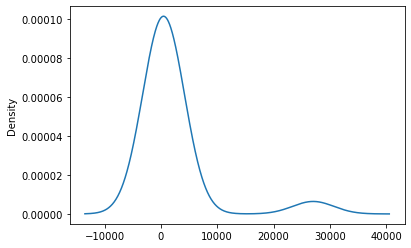

In [5]:
# Visualize the value counts of APPLICATION_TYPE
app_type_counts.plot.density()

In [6]:
# Determine which values to replace if counts are less than ...?
replace_application = list(app_type_counts[app_type_counts < 500].index)

# Replace in dataframe
for app in replace_application:
    application_df.APPLICATION_TYPE = application_df.APPLICATION_TYPE.replace(app,"Other")


In [7]:
# Check to make sure binning was successful
application_df.APPLICATION_TYPE.value_counts()

T3       27037
T4        1542
T6        1216
T5        1173
T19       1065
T8         737
T7         725
T10        528
Other      276
Name: APPLICATION_TYPE, dtype: int64

In [8]:
# Look at CLASSIFICATION value counts for binning
class_counts = application_df.CLASSIFICATION.value_counts()
class_counts

C1000    17326
C2000     6074
C1200     4837
C3000     1918
C2100     1883
         ...  
C4120        1
C8210        1
C2561        1
C4500        1
C2150        1
Name: CLASSIFICATION, Length: 71, dtype: int64

<AxesSubplot:ylabel='Density'>

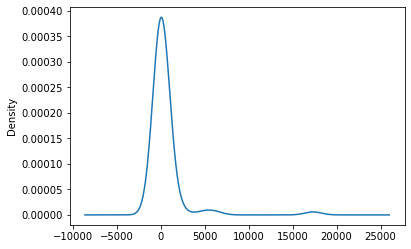

In [9]:
# Visualize the value counts of CLASSIFICATION
class_counts.plot.density()

In [10]:
# Determine which values to replace if counts are less than ..?
replace_class = list(class_counts[class_counts < 1000].index)

# Replace in dataframe
for cls in replace_class:
    application_df.CLASSIFICATION = application_df.CLASSIFICATION.replace(cls,"Other")
    
# Check to make sure binning was successful
application_df.CLASSIFICATION.value_counts()

C1000    17326
C2000     6074
C1200     4837
Other     2261
C3000     1918
C2100     1883
Name: CLASSIFICATION, dtype: int64

In [11]:
# Generate our categorical variable lists
app_cat = application_df.dtypes[application_df.dtypes == "object"].index.tolist()
application_df[app_cat].nunique()

APPLICATION_TYPE          9
AFFILIATION               6
CLASSIFICATION            6
USE_CASE                  5
ORGANIZATION              4
INCOME_AMT                9
SPECIAL_CONSIDERATIONS    2
dtype: int64

In [12]:
# Create a OneHotEncoder instance
enc = OneHotEncoder(sparse=False)

# Fit and transform the OneHotEncoder using the categorical variable list
encode_df = pd.DataFrame(enc.fit_transform(application_df[app_cat]))

# Add the encoded variable names to the dataframe
encode_df.columns = enc.get_feature_names(app_cat)
encode_df.head()

,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,APPLICATION_TYPE_T7,APPLICATION_TYPE_T8,AFFILIATION_CompanySponsored,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [13]:
# Merge one-hot encoded features and drop the originals
application_df = application_df.merge(encode_df, left_index=True, right_index=True)

application_df = application_df.drop(app_cat, 1)

application_df.head()

/Users/raulgsi/opt/anaconda3/envs/mlenv/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  after removing the cwd from sys.path.


,STATUS,ASK_AMT,IS_SUCCESSFUL,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1,5000,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,108590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,5000,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,6692,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,142590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [14]:
# Split our preprocessed data into our features and target arrays
y = application_df.IS_SUCCESSFUL.values

X = application_df.drop(columns="IS_SUCCESSFUL").values

# Split the preprocessed data into a training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)


In [15]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Deliverable 2: Compile, Train and Evaluate the Model

In [16]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
#  YOUR CODE GOES HERE

nn = tf.keras.models.Sequential()

number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 30

# First hidden layer
nn.add(
    tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu")
)

# Second hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))

# Output layer
nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Check the structure of the model
nn.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 80)                3520      
_________________________________________________________________
dense_1 (Dense)              (None, 30)                2430      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 31        
Total params: 5,981
Trainable params: 5,981
Non-trainable params: 0
_________________________________________________________________


2022-05-14 09:06:13.006341: I tensorflow/core/platform/cpu_feature_guard.cc:145] This TensorFlow binary is optimized with Intel(R) MKL-DNN to use the following CPU instructions in performance critical operations:  SSE4.1 SSE4.2
To enable them in non-MKL-DNN operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-14 09:06:13.007864: I tensorflow/core/common_runtime/process_util.cc:115] Creating new thread pool with default inter op setting: 8. Tune using inter_op_parallelism_threads for best performance.


In [17]:
# Compile the model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [18]:
# Train the model
fit_model = nn.fit(X_train, y_train, epochs=100)

Train on 25724 samples
Epoch 1/100
25724/25724 [==============================] - 2s 91us/sample - loss: 40385.4324 - accuracy: 0.5007
Epoch 2/100
25724/25724 [==============================] - 2s 66us/sample - loss: 10295.2619 - accuracy: 0.5063
Epoch 3/100
25724/25724 [==============================] - 2s 65us/sample - loss: 50950.2124 - accuracy: 0.4973
Epoch 4/100
25724/25724 [==============================] - 2s 65us/sample - loss: 12910.2120 - accuracy: 0.4978
Epoch 5/100
25724/25724 [==============================] - 2s 67us/sample - loss: 23902.3927 - accuracy: 0.4936
Epoch 6/100
25724/25724 [==============================] - 2s 66us/sample - loss: 19000.8148 - accuracy: 0.4988
Epoch 7/100
25724/25724 [==============================] - 2s 66us/sample - loss: 18867.7937 - accuracy: 0.4880
Epoch 8/100
25724/25724 [==============================] - 2s 67us/sample - loss: 13293.5537 - accuracy: 0.4973
Epoch 9/100
25724/25724 [==============================] - 2s 67us/sample - loss:

25724/25724 [==============================] - 2s 68us/sample - loss: 0.6911 - accuracy: 0.5324
Epoch 76/100
25724/25724 [==============================] - 2s 66us/sample - loss: 0.6911 - accuracy: 0.5324
Epoch 77/100
25724/25724 [==============================] - 2s 67us/sample - loss: 0.6912 - accuracy: 0.5324
Epoch 78/100
25724/25724 [==============================] - 2s 69us/sample - loss: 0.6911 - accuracy: 0.5324
Epoch 79/100
25724/25724 [==============================] - 2s 67us/sample - loss: 0.6912 - accuracy: 0.5324
Epoch 80/100
25724/25724 [==============================] - 2s 67us/sample - loss: 0.6911 - accuracy: 0.5324
Epoch 81/100
25724/25724 [==============================] - 2s 67us/sample - loss: 0.6911 - accuracy: 0.5324
Epoch 82/100
25724/25724 [==============================] - 2s 67us/sample - loss: 0.6912 - accuracy: 0.5324
Epoch 83/100
25724/25724 [==============================] - 2s 67us/sample - loss: 0.6911 - accuracy: 0.5324
Epoch 84/100
25724/25724 [======

In [20]:
# Import checkpoint dependencies

import os

from tensorflow.keras.callbacks import ModelCheckpoint


# Define the checkpoint path and filenames

os.makedirs("checkpoints/", exist_ok=True)

checkpoint_path = "checkpoints/weights.{epoch:02d}.hdf5"

In [21]:
# Compile the model

nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

# Create a callback that saves the model's weights every epoch

cp_callback = ModelCheckpoint(
    filepath=checkpoint_path, 
    verbose=1,
    save_weights_only=True,
    save_freq=5)

fit_model = nn.fit(X_train_scaled, y_train, epochs=100, callbacks=[cp_callback])
# create and use callback:
# saver = CustomSaver()
# model.fit(X, y, callbacks=[saver], epochs=5)

Train on 25724 samples
Epoch 1/100

Epoch 00001: saving model to checkpoints/weights.01.hdf5
   32/25724 [..............................] - ETA: 5:37 - loss: 0.5063 - accuracy: 0.7812
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
  288/25724 [..............................] - ETA: 41s - loss: 0.7457 - accuracy: 0.7118 
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to c


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3872/25724 [===>..........................] - ETA: 7s - loss: 0.6060 - accuracy: 0.7007
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 4096/25724 [===>..........................] - ETA: 6s - loss: 0.6058 - accuracy: 0.7014
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 7616/25724 [=======>......................] - ETA: 5s - loss: 0.5911 - accuracy: 0.7147
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 7872/25724 [========>.....................] - ETA: 4s - loss: 0.5907 - accuracy: 0.7148
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001

11232/25724 [============>.................] - ETA: 3s - loss: 0.5865 - accuracy: 0.7133
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
11456/25724 [============>.................] - ETA: 3s - loss: 0.5858 - accuracy: 0.7137
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
11680/25724 

14944/25724 [================>.............] - ETA: 2s - loss: 0.5791 - accuracy: 0.7185
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
15168/25724 [================>.............] - ETA: 2s - loss: 0.5788 - accuracy: 0.7189
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
15392/25724 

18720/25724 [====================>.........] - ETA: 1s - loss: 0.5767 - accuracy: 0.7192
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
18944/25724 [=====================>........] - ETA: 1s - loss: 0.5767 - accuracy: 0.7193
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
19168/25724 


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
22560/25724 [=========================>....] - ETA: 0s - loss: 0.5738 - accuracy: 0.7208
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
22816/25724 [=========================>....] - ETA: 0s - loss: 0.5738 - accuracy: 0.7205
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001


Epoch 00002: saving model to checkpoints/weights.02.hdf5
  480/25724 [..............................] - ETA: 5s - loss: 0.5397 - accuracy: 0.7354
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
  704/25724 [..............................] - ETA: 5s - loss: 0.5499 - accuracy: 0.7273
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 4384/25724 [====>.........................] - ETA: 4s - loss: 0.5555 - accuracy: 0.7320
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 4608/25724 [====>.........................] - ETA: 4s - loss: 0.5552 - accuracy: 0.7311
Epoch 00002


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 8096/25724 [========>.....................] - ETA: 4s - loss: 0.5574 - accuracy: 0.7288
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 8320/25724 [========>.....................] - ETA: 3s - loss: 0.5576 - accuracy: 0.7285
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
11744/25724 [============>.................] - ETA: 3s - loss: 0.5548 - accuracy: 0.7303
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
11968/25724 [============>.................] - ETA: 3s - loss: 0.5555 - accuracy: 0.7296
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002

15424/25724 [================>.............] - ETA: 2s - loss: 0.5574 - accuracy: 0.7287
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
15648/25724 [=================>............] - ETA: 2s - loss: 0.5576 - accuracy: 0.7285
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
15872/25724 


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
19296/25724 [=====================>........] - ETA: 1s - loss: 0.5559 - accuracy: 0.7307
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
19520/25724 [=====================>........] - ETA: 1s - loss: 0.5563 - accuracy: 0.7306
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002

22912/25724 [=========================>....] - ETA: 0s - loss: 0.5552 - accuracy: 0.7312
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
23136/25724 [=========================>....] - ETA: 0s - loss: 0.5552 - accuracy: 0.7309
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
23360/25724 


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
  896/25724 [>.............................] - ETA: 6s - loss: 0.5528 - accuracy: 0.7243
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 1088/25724 [>.............................] - ETA: 6s - loss: 0.5501 - accuracy: 0.7279
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003

 4448/25724 [====>.........................] - ETA: 5s - loss: 0.5630 - accuracy: 0.7208
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 4704/25724 [====>.........................] - ETA: 5s - loss: 0.5654 - accuracy: 0.7196
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 8352/25724 [========>.....................] - ETA: 4s - loss: 0.5578 - accuracy: 0.7284
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 8608/25724 [=========>....................] - ETA: 4s - loss: 0.5573 - accuracy: 0.7291
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003

11968/25724 [============>.................] - ETA: 3s - loss: 0.5537 - accuracy: 0.7304
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
12192/25724 [=============>................] - ETA: 3s - loss: 0.5536 - accuracy: 0.7306
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
15808/25724 [=================>............] - ETA: 2s - loss: 0.5529 - accuracy: 0.7310
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
16032/25724 [=================>............] - ETA: 2s - loss: 0.5538 - accuracy: 0.7304
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
19552/25724 [=====================>........] - ETA: 1s - loss: 0.5551 - accuracy: 0.7297
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
19776/25724 [======================>.......] - ETA: 1s - loss: 0.5548 - accuracy: 0.7299
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
23232/25724 [==========================>...] - ETA: 0s - loss: 0.5546 - accuracy: 0.7299
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
23456/25724 [==========================>...] - ETA: 0s - loss: 0.5561 - accuracy: 0.7297
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003

 1152/25724 [>.............................] - ETA: 5s - loss: 0.5563 - accuracy: 0.7205
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 1376/25724 [>.............................] - ETA: 5s - loss: 0.5540 - accuracy: 0.7195
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 1600/25724 


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5024/25724 [====>.........................] - ETA: 4s - loss: 0.5520 - accuracy: 0.7299
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5216/25724 [=====>........................] - ETA: 4s - loss: 0.5514 - accuracy: 0.7314
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004

 8512/25724 [========>.....................] - ETA: 4s - loss: 0.5479 - accuracy: 0.7340
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 8640/25724 [=========>....................] - ETA: 4s - loss: 0.5474 - accuracy: 0.7347
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 8736/25724 [=========>....................] - ETA: 4s - loss: 0.5477 - accuracy: 0.7344
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoint

11808/25724 [============>.................] - ETA: 4s - loss: 0.5463 - accuracy: 0.7356
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
11872/25724 [============>.................] - ETA: 4s - loss: 0.5462 - accuracy: 0.7356
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
11936/25724 [============>.................] - ETA: 4s - loss: 0.5463 - accuracy: 0.7357
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
12032/25724 [=============>................] - ETA: 4s - loss: 0.5460 - accuracy: 0.7358
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
12096/25724 [=============>................] - ETA: 4s - loss: 0.5460 - accuracy: 0.7355
Epoch 00004: saving model to checkpoi

14528/25724 [===============>..............] - ETA: 6s - loss: 0.5477 - accuracy: 0.7333
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
14624/25724 [================>.............] - ETA: 6s - loss: 0.5474 - accuracy: 0.7337
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
14688/25724 [================>.............] - ETA: 6s - loss: 0.5473 - accuracy: 0.7337
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
14784/25724 [================>.............] - ETA: 6s - loss: 0.5476 - accuracy: 0.7337
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
14880/2572

17376/25724 [===================>..........] - ETA: 7s - loss: 0.5486 - accuracy: 0.7331
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
17472/25724 [===================>..........] - ETA: 7s - loss: 0.5487 - accuracy: 0.7332
Epoch 00004: saving model to checkpoints/weights.04.hdf5
17504/25724 [===================>..........] - ETA: 7s - loss: 0.5486 - accuracy: 0.7333
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
17632/25724 [===================>..........] - ETA: 7s - loss: 0.5487 - accuracy: 0.7332
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
17696/25724 [===================>..........] - ETA: 7s - loss: 0.549

19776/25724 [======================>.......] - ETA: 6s - loss: 0.5489 - accuracy: 0.7328
Epoch 00004: saving model to checkpoints/weights.04.hdf5
19808/25724 [======================>.......] - ETA: 6s - loss: 0.5489 - accuracy: 0.7328
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
19904/25724 [======================>.......] - ETA: 6s - loss: 0.5492 - accuracy: 0.7326
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
19968/25724 [======================>.......] - ETA: 6s - loss: 0.5490 - accuracy: 0.7328
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
20064/25724 [======================>.......] - ETA: 6s - loss: 0.5490 - accuracy: 0.7330
Epoch 00004: saving model to checkpoi

22368/25724 [=========================>....] - ETA: 3s - loss: 0.5507 - accuracy: 0.7313
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
22464/25724 [=========================>....] - ETA: 3s - loss: 0.5506 - accuracy: 0.7314
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
22528/25724 [=========================>....] - ETA: 3s - loss: 0.5505 - accuracy: 0.7314
Epoch 00004: saving model to checkpoints/weights.04.hdf5
22560/25724 [=========================>....] - ETA: 3s - loss: 0.5506 - accuracy: 0.7313
Epoch 00004: saving model to checkpoints/weights.04.hdf5
22592/25724 [=========================>....] - ETA: 3s - loss: 0.5507 - accuracy: 0.7313
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
22656/25724 [=========================

24928/25724 [============================>.] - ETA: 0s - loss: 0.5521 - accuracy: 0.7306
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.5522 - accuracy: 0.7305
Epoch 00004: saving model to checkpoints/weights.04.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.5519 - accuracy: 0.7308
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.5518 - accuracy: 0.7309
Epoch 00004: saving model to checkpoints/weights.04.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.5517 - accuracy: 0.7309
Epoch 00004: saving model to checkpoints/weights.04.hdf5
25216/25724 [=========================

 1472/25724 [>.............................] - ETA: 1:09 - loss: 0.5447 - accuracy: 0.7357
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1504/25724 [>.............................] - ETA: 1:11 - loss: 0.5433 - accuracy: 0.7367
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1568/25724 [>.............................] - ETA: 1:15 - loss: 0.5467 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1600/25724 [>.............................] - ETA: 1:20 - loss: 0.5469 - accuracy: 0.7300
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1696/25724 [>.............................] - ETA: 1:19 - loss: 0.5487 - accuracy: 0.7300
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1728/25724 [=>............................] - ETA: 1:23 - loss: 0.5535 - accuracy: 0.

 3392/25724 [==>...........................] - ETA: 1:01 - loss: 0.5580 - accuracy: 0.7238
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 3456/25724 [===>..........................] - ETA: 1:01 - loss: 0.5591 - accuracy: 0.7225
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 3488/25724 [===>..........................] - ETA: 1:01 - loss: 0.5580 - accuracy: 0.7236
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 3552/25724 [===>..........................] - ETA: 1:00 - loss: 0.5608 - accuracy: 0.7213
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 3648/25724 [===>..........................] - ETA: 1:00 - loss: 0.5624 - accuracy: 0.7198
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model t

 5216/25724 [=====>........................] - ETA: 1:09 - loss: 0.5610 - accuracy: 0.7207
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 5280/25724 [=====>........................] - ETA: 1:08 - loss: 0.5622 - accuracy: 0.7193
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 5312/25724 [=====>........................] - ETA: 1:08 - loss: 0.5620 - accuracy: 0.7197
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 5376/25724 [=====>........................] - ETA: 1:08 - loss: 0.5614 - accuracy: 0.7199
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 5440/25724 [=====>........................] - ETA: 1:07 - loss: 0.5616 - accuracy: 0.7195
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 5472/25724 [=====>........................] - ETA: 1:08 - loss: 0.5614 - accuracy: 0.

 7008/25724 [=======>......................] - ETA: 1:09 - loss: 0.5595 - accuracy: 0.7222
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 7104/25724 [=======>......................] - ETA: 1:08 - loss: 0.5601 - accuracy: 0.7214
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 7200/25724 [=======>......................] - ETA: 1:08 - loss: 0.5591 - accuracy: 0.7222
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 7264/25724 [=======>......................] - ETA: 1:09 - loss: 0.5582 - accuracy: 0.7232
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 7296/25724 [=======>......................] - ETA: 1:09 - loss: 0.5577 - accuracy: 0.7237
Epoch 00005: saving model t

 9440/25724 [==========>...................] - ETA: 54s - loss: 0.5560 - accuracy: 0.7268
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9504/25724 [==========>...................] - ETA: 54s - loss: 0.5561 - accuracy: 0.7267
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9536/25724 [==========>...................] - ETA: 54s - loss: 0.5564 - accuracy: 0.7266
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9568/25724 [==========>...................] - ETA: 55s - loss: 0.5564 - accuracy: 0.7268
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9600/25724 [==========>...................] - ETA: 55s - loss: 0.5565 - accuracy: 0.7269
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9632/25724 [==========>...................] - ETA: 56s - loss: 0.5570 - accuracy: 0.7265
Epoch 00005: saving model to checkpoints/weights.05.hdf5
 9664/25724 [==========>...................] - ETA: 56s - lo

11360/25724 [============>.................] - ETA: 51s - loss: 0.5558 - accuracy: 0.7282
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
11424/25724 [============>.................] - ETA: 51s - loss: 0.5567 - accuracy: 0.7272
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
11520/25724 [============>.................] - ETA: 50s - loss: 0.5572 - accuracy: 0.7270
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
11648/25724 [============>.................] - ETA: 50s - loss: 0.5566 - accuracy: 0.7279
Epoch 00005: saving model to checkpoints/weights.05.hdf5
11680/25724 [============>.................] - ETA: 50s - loss: 


Epoch 00005: saving model to checkpoints/weights.05.hdf5
12960/25724 [==============>...............] - ETA: 50s - loss: 0.5565 - accuracy: 0.7272
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
13088/25724 [==============>...............] - ETA: 50s - loss: 0.5561 - accuracy: 0.7275
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
13152/25724 [==============>...............] - ETA: 49s - loss: 0.5564 - accuracy: 0.7275
Epoch 00005: saving model to checkpoints/weights.05.hdf5
13184/25724 [==============>...............] - ETA: 50s - loss: 0.5566 - accuracy: 0.7274
Epoch 00005: saving model to checkpoints/weights.05.hdf5
13216/25724 [==============>...............] - ETA: 50s - loss: 0.5565 - accuracy: 0.7275
Epoch 00005: saving model to che

14720/25724 [================>.............] - ETA: 43s - loss: 0.5565 - accuracy: 0.7282
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
14784/25724 [================>.............] - ETA: 43s - loss: 0.5566 - accuracy: 0.7279
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
14880/25724 [================>.............] - ETA: 42s - loss: 0.5566 - accuracy: 0.7280
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
14976/25724 [================>.............] - ETA: 42s - loss: 0.5566 - accuracy: 0.7281
Epoch 00005: saving model to checkpoints/weights.05.hdf5
15008/25724 [================>.............] - ETA: 42s - loss: 0.5565 - accuracy: 0.7281
Epoch 00005: saving model to che

16928/25724 [==================>...........] - ETA: 34s - loss: 0.5551 - accuracy: 0.7299
Epoch 00005: saving model to checkpoints/weights.05.hdf5
16960/25724 [==================>...........] - ETA: 34s - loss: 0.5551 - accuracy: 0.7298
Epoch 00005: saving model to checkpoints/weights.05.hdf5
16992/25724 [==================>...........] - ETA: 34s - loss: 0.5552 - accuracy: 0.7296
Epoch 00005: saving model to checkpoints/weights.05.hdf5
17024/25724 [==================>...........] - ETA: 34s - loss: 0.5552 - accuracy: 0.7296
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
17088/25724 [==================>...........] - ETA: 34s - loss: 0.5549 - accuracy: 0.7300
Epoch 00005: saving model to checkpoints/weights.05.hdf5
17120/25724 [==================>...........] - ETA: 34s - loss: 0.5549 - accuracy: 0.7300
Epoch 00005: saving model to checkpoints/weights.05.hdf5
17152/25724 [===================>..........] - ETA: 34s - lo

18400/25724 [====================>.........] - ETA: 30s - loss: 0.5543 - accuracy: 0.7299
Epoch 00005: saving model to checkpoints/weights.05.hdf5
18432/25724 [====================>.........] - ETA: 30s - loss: 0.5544 - accuracy: 0.7298
Epoch 00005: saving model to checkpoints/weights.05.hdf5
18464/25724 [====================>.........] - ETA: 30s - loss: 0.5543 - accuracy: 0.7299
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
18560/25724 [====================>.........] - ETA: 30s - loss: 0.5543 - accuracy: 0.7300
Epoch 00005: saving model to checkpoints/weights.05.hdf5
18592/25724 [====================>.........] - ETA: 30s - loss: 0.5542 - accuracy: 0.7302
Epoch 00005: saving model to checkpoints/weights.05.hdf5
18624/25724 [====================>.........] - ETA: 30s - loss: 0.5544 - accuracy: 0.7300
Epoch 00005: saving model to checkpoints/weights.05.hdf5

E

20032/25724 [======================>.......] - ETA: 24s - loss: 0.5529 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
20096/25724 [======================>.......] - ETA: 24s - loss: 0.5528 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
20192/25724 [======================>.......] - ETA: 23s - loss: 0.5527 - accuracy: 0.7319
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
20256/25724 [======================>.......] - ETA: 23s - loss: 0.5527 - accuracy: 0.7319
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
20352/25724 [======================>.......] - ETA: 22s - loss: 

22752/25724 [=========================>....] - ETA: 11s - loss: 0.5528 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
22816/25724 [=========================>....] - ETA: 11s - loss: 0.5529 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
22912/25724 [=========================>....] - ETA: 11s - loss: 0.5527 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
23008/25724 [=========================>....] - ETA: 10s - loss: 0.5526 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
23072/25724 [=========================>....] - ETA: 10s - loss: 

25344/25724 [============================>.] - ETA: 1s - loss: 0.5524 - accuracy: 0.7317
Epoch 00005: saving model to checkpoints/weights.05.hdf5
25376/25724 [============================>.] - ETA: 1s - loss: 0.5523 - accuracy: 0.7317
Epoch 00005: saving model to checkpoints/weights.05.hdf5
25408/25724 [============================>.] - ETA: 1s - loss: 0.5524 - accuracy: 0.7318
Epoch 00005: saving model to checkpoints/weights.05.hdf5
25440/25724 [============================>.] - ETA: 1s - loss: 0.5522 - accuracy: 0.7320
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5521 - accuracy: 0.7319
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5519 - accuracy: 0.7320
Epoch 00005: saving model to checkpoints/weights.05.hdf5
25600/25

  864/25724 [>.............................] - ETA: 4:41 - loss: 0.5470 - accuracy: 0.7338
Epoch 00006: saving model to checkpoints/weights.06.hdf5
  896/25724 [>.............................] - ETA: 4:50 - loss: 0.5474 - accuracy: 0.7310
Epoch 00006: saving model to checkpoints/weights.06.hdf5
  928/25724 [>.............................] - ETA: 4:58 - loss: 0.5515 - accuracy: 0.7263
Epoch 00006: saving model to checkpoints/weights.06.hdf5
  960/25724 [>.............................] - ETA: 5:05 - loss: 0.5489 - accuracy: 0.7271
Epoch 00006: saving model to checkpoints/weights.06.hdf5
  992/25724 [>.............................] - ETA: 5:12 - loss: 0.5492 - accuracy: 0.7278
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 1024/25724 [>.............................] - ETA: 5:19 - loss: 0.5486 - accuracy: 0.7266
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 1088/25724 [>.............................] - ETA: 5:

 1888/25724 [=>............................] - ETA: 5:49 - loss: 0.5573 - accuracy: 0.7315
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 1952/25724 [=>............................] - ETA: 5:37 - loss: 0.5571 - accuracy: 0.7305
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 1984/25724 [=>............................] - ETA: 5:37 - loss: 0.5561 - accuracy: 0.7319
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 2048/25724 [=>............................] - ETA: 5:28 - loss: 0.5548 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 2080/25724 [=>............................] - ETA: 5:31 - loss: 0.5548 - accuracy: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 2112/25724 [=>............................] - ETA: 5:29 - loss: 0.5544 - accuracy: 0.7325
Epoch 00006: saving model to checkpoints/weights.06.h

 3904/25724 [===>..........................] - ETA: 3:27 - loss: 0.5557 - accuracy: 0.7269
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 4000/25724 [===>..........................] - ETA: 3:22 - loss: 0.5551 - accuracy: 0.7275
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 4064/25724 [===>..........................] - ETA: 3:19 - loss: 0.5545 - accuracy: 0.7281
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 4192/25724 [===>..........................] - ETA: 3:12 - loss: 0.5539 - accuracy: 0.7283
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 4

 6080/25724 [======>.......................] - ETA: 2:32 - loss: 0.5478 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6112/25724 [======>.......................] - ETA: 2:31 - loss: 0.5480 - accuracy: 0.7328
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6144/25724 [======>.......................] - ETA: 2:32 - loss: 0.5487 - accuracy: 0.7323
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6176/25724 [======>.......................] - ETA: 2:34 - loss: 0.5497 - accuracy: 0.7315
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6208/25724 [======>.......................] - ETA: 2:34 - loss: 0.5488 - accuracy: 0.7323
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6240/25724 [======>.......................] - ETA: 2:34 - loss: 0.5487 - accuracy: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6304/25724 [======>.......................] - ETA: 2:

 7968/25724 [========>.....................] - ETA: 2:08 - loss: 0.5476 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 8000/25724 [========>.....................] - ETA: 2:08 - loss: 0.5471 - accuracy: 0.7335
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 8032/25724 [========>.....................] - ETA: 2:08 - loss: 0.5470 - accuracy: 0.7336
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 8064/25724 [========>.....................] - ETA: 2:08 - loss: 0.5471 - accuracy: 0.7334
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 8096/25724 [========>.....................] - ETA: 2:08 - loss: 0.5469 - accuracy: 0.7334
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 8192/25724 [========>.....................] - ETA: 2:06 - loss: 0.5468 - accuracy: 0.7335
Epoch 00006: saving model to checkpoints/weights.06.h

 9376/25724 [=========>....................] - ETA: 1:57 - loss: 0.5494 - accuracy: 0.7333
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9408/25724 [=========>....................] - ETA: 1:57 - loss: 0.5498 - accuracy: 0.7328
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9440/25724 [==========>...................] - ETA: 1:57 - loss: 0.5498 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9472/25724 [==========>...................] - ETA: 1:57 - loss: 0.5500 - accuracy: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9504/25724 [==========>...................] - ETA: 1:57 - loss: 0.5504 - accuracy: 0.7322
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9536/25724 [==========>...................] - ETA: 1:58 - loss: 0.5507 - accuracy: 0.7322
Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9568/25724 [==========>...................] - ETA: 1:57 - loss: 0.5509 - accuracy: 0.7319
Epoch 00006: saving m


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10656/25724 [===========>..................] - ETA: 1:51 - loss: 0.5527 - accuracy: 0.7314
Epoch 00006: saving model to checkpoints/weights.06.hdf5
10688/25724 [===========>..................] - ETA: 1:52 - loss: 0.5527 - accuracy: 0.7314
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10752/25724 [===========>..................] - ETA: 1:51 - loss: 0.5526 - accuracy: 0.7315
Epoch 00006: saving model to checkpoints/weights.06.hdf5
10784/25724 [===========>..................] - ETA: 1:51 - loss: 0.5526 - accuracy: 0.7314
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10848/25724 [===========>..................] - ETA: 1:51 - loss: 0.5536 - accuracy: 0.7306
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model t


Epoch 00006: saving model to checkpoints/weights.06.hdf5
12096/25724 [=============>................] - ETA: 1:38 - loss: 0.5523 - accuracy: 0.7316
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
12160/25724 [=============>................] - ETA: 1:39 - loss: 0.5524 - accuracy: 0.7318
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
12224/25724 [=============>................] - ETA: 1:38 - loss: 0.5526 - accuracy: 0.7317
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
12288/25724 [=============>................] - ETA: 1:38 - loss: 0.5528 - accuracy: 0.7317
Epoch 00006: saving model to checkpoints/weights.06.hdf5
12320/25724 [=============>................] - ETA: 1:38 - loss: 0.5526 - accuracy: 0.7317
Epoch 00006: saving model to checkpoints/weights.06.hdf5
12352/25724 [=============>.

13920/25724 [===============>..............] - ETA: 1:24 - loss: 0.5536 - accuracy: 0.7312
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
13984/25724 [===============>..............] - ETA: 1:24 - loss: 0.5535 - accuracy: 0.7315
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
14080/25724 [===============>..............] - ETA: 1:23 - loss: 0.5533 - accuracy: 0.7317
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
14144/25724 [===============>..............] - ETA: 1:22 - loss: 0.5531 - accuracy: 0.7319
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
14240/25724 [===============>..............] - ETA: 1:21 - l

15424/25724 [================>.............] - ETA: 1:12 - loss: 0.5520 - accuracy: 0.7326
Epoch 00006: saving model to checkpoints/weights.06.hdf5
15456/25724 [=================>............] - ETA: 1:12 - loss: 0.5520 - accuracy: 0.7325
Epoch 00006: saving model to checkpoints/weights.06.hdf5
15488/25724 [=================>............] - ETA: 1:12 - loss: 0.5518 - accuracy: 0.7328
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
15552/25724 [=================>............] - ETA: 1:11 - loss: 0.5519 - accuracy: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
15648/25724 [=================>............] - ETA: 1:10 - loss: 0.5520 - accuracy: 0.7327
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model t

17184/25724 [===================>..........] - ETA: 59s - loss: 0.5510 - accuracy: 0.7323 
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
17248/25724 [===================>..........] - ETA: 59s - loss: 0.5507 - accuracy: 0.7325
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
17344/25724 [===================>..........] - ETA: 58s - loss: 0.5508 - accuracy: 0.7325
Epoch 00006: saving model to checkpoints/weights.06.hdf5
17376/25724 [===================>..........] - ETA: 57s - loss: 0.5508 - accuracy: 0.7325
Epoch 00006: saving model to checkpoints/weights.06.hdf5
17408/25724 [===================>..........] - ETA: 57s - loss: 0.5508 - accuracy: 0.7325
Epoch 00006: saving model to checkpoints/weights.06.hdf5
17440/25724 [===================>..........] - ETA: 57s - loss: 0.5508 - accuracy: 0.7325


19136/25724 [=====================>........] - ETA: 44s - loss: 0.5519 - accuracy: 0.7321
Epoch 00006: saving model to checkpoints/weights.06.hdf5
19168/25724 [=====================>........] - ETA: 44s - loss: 0.5517 - accuracy: 0.7323
Epoch 00006: saving model to checkpoints/weights.06.hdf5
19200/25724 [=====================>........] - ETA: 44s - loss: 0.5517 - accuracy: 0.7322
Epoch 00006: saving model to checkpoints/weights.06.hdf5
19232/25724 [=====================>........] - ETA: 44s - loss: 0.5516 - accuracy: 0.7324
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
19328/25724 [=====================>........] - ETA: 43s - loss: 0.5514 - accuracy: 0.7326
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
19392/25724 [=====================>........] - ETA: 43s - loss: 0.5514 - accuracy: 0.7327
E

20256/25724 [======================>.......] - ETA: 37s - loss: 0.5514 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20320/25724 [======================>.......] - ETA: 37s - loss: 0.5512 - accuracy: 0.7330
Epoch 00006: saving model to checkpoints/weights.06.hdf5
20352/25724 [======================>.......] - ETA: 37s - loss: 0.5513 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5
20384/25724 [======================>.......] - ETA: 36s - loss: 0.5514 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20448/25724 [======================>.......] - ETA: 36s - loss: 0.5513 - accuracy: 0.7329
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20544/25724 [====================

22272/25724 [========================>.....] - ETA: 23s - loss: 0.5492 - accuracy: 0.7342
Epoch 00006: saving model to checkpoints/weights.06.hdf5
22304/25724 [=========================>....] - ETA: 23s - loss: 0.5492 - accuracy: 0.7343
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
22400/25724 [=========================>....] - ETA: 22s - loss: 0.5494 - accuracy: 0.7340
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
22464/25724 [=========================>....] - ETA: 22s - loss: 0.5494 - accuracy: 0.7340
Epoch 00006: saving model to checkpoints/weights.06.hdf5
22496/25724 [=========================>....] - ETA: 22s - loss: 0.5495 - accuracy: 0.7338
Epoch 00006: saving model to checkpoints/weights.06.hdf5
22528/25724 [=========================>....] - ETA: 21s - loss: 0.5497 - accuracy: 0.7337
E


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23744/25724 [==========================>...] - ETA: 13s - loss: 0.5502 - accuracy: 0.7334
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23808/25724 [==========================>...] - ETA: 13s - loss: 0.5501 - accuracy: 0.7335
Epoch 00006: saving model to checkpoints/weights.06.hdf5
23840/25724 [==========================>...] - ETA: 12s - loss: 0.5502 - accuracy: 0.7334
Epoch 00006: saving model to checkpoints/weights.06.hdf5
23872/25724 [==========================>...] - ETA: 12s - loss: 0.5503 - accuracy: 0.7332
Epoch 00006: saving model to checkpoints/weights.06.hdf5
23904/25724 [==========================>...] - ETA: 12s - loss: 0.5505 - accuracy: 0.7331
Epoch 00006: saving model to checkpoints/weights.06.hdf5
23936/25724 [====================


Epoch 00006: saving model to checkpoints/weights.06.hdf5
25088/25724 [============================>.] - ETA: 4s - loss: 0.5503 - accuracy: 0.7335
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
25184/25724 [============================>.] - ETA: 3s - loss: 0.5502 - accuracy: 0.7335
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
25248/25724 [============================>.] - ETA: 3s - loss: 0.5503 - accuracy: 0.7333
Epoch 00006: saving model to checkpoints/weights.06.hdf5
25280/25724 [============================>.] - ETA: 3s - loss: 0.5503 - accuracy: 0.7332
Epoch 00006: saving model to checkpoints/weights.06.hdf5
25312/25724 [============================>.] - ETA: 2s - loss: 0.5503 - accuracy: 0.7333
Epoch 00006: saving model to checkpoints/weights.06.hdf5
25344/25724 [=========================

  864/25724 [>.............................] - ETA: 2:01 - loss: 0.5170 - accuracy: 0.7384
Epoch 00007: saving model to checkpoints/weights.07.hdf5
  896/25724 [>.............................] - ETA: 2:23 - loss: 0.5157 - accuracy: 0.7388
Epoch 00007: saving model to checkpoints/weights.07.hdf5
  928/25724 [>.............................] - ETA: 2:42 - loss: 0.5170 - accuracy: 0.7371
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
  992/25724 [>.............................] - ETA: 2:33 - loss: 0.5234 - accuracy: 0.7319
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1024/25724 [>.............................] - ETA: 2:33 - loss: 0.5249 - accuracy: 0.7314
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1088/25724 [>.............................] - ETA: 2:30 - loss: 0.5232 - accuracy: 0.7335
Epoch 00007: saving model to checkpoints/weights.07.h

 2336/25724 [=>............................] - ETA: 2:48 - loss: 0.5415 - accuracy: 0.7286
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 2368/25724 [=>............................] - ETA: 2:54 - loss: 0.5426 - accuracy: 0.7264
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 2400/25724 [=>............................] - ETA: 2:55 - loss: 0.5423 - accuracy: 0.7267
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 2464/25724 [=>............................] - ETA: 2:53 - loss: 0.5427 - accuracy: 0.7261
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 2496/25724 [=>............................] - ETA: 2:59 - loss: 0.5424 - accuracy: 0.7272
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 2528/25724 [=>............................] - ETA: 2:59 - loss: 0.5429 - accuracy: 0.7267
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 2560/25724 [=>............................] - ETA: 2:

 3584/25724 [===>..........................] - ETA: 3:11 - loss: 0.5517 - accuracy: 0.7232
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 3648/25724 [===>..........................] - ETA: 3:14 - loss: 0.5511 - accuracy: 0.7240
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 3680/25724 [===>..........................] - ETA: 3:18 - loss: 0.5511 - accuracy: 0.7242
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 3712/25724 [===>..........................] - ETA: 3:17 - loss: 0.5513 - accuracy: 0.7244
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 3808/25724 [===>..........................] - ETA: 3:17 - loss: 0.5527 - accuracy: 0.7243
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 3840/25724 [===>..........................] - ETA: 3:17 - loss: 0.5546 - accuracy: 0.

 5728/25724 [=====>........................] - ETA: 2:36 - loss: 0.5533 - accuracy: 0.7236
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 5792/25724 [=====>........................] - ETA: 2:35 - loss: 0.5525 - accuracy: 0.7248
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 5856/25724 [=====>........................] - ETA: 2:34 - loss: 0.5531 - accuracy: 0.7244
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 5888/25724 [=====>........................] - ETA: 2:36 - loss: 0.5534 - accuracy: 0.7240
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 5920/25724 [=====>........................] - ETA: 2:38 - loss: 0.5536 - accuracy: 0.7236
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 6016/25724 [======>........


Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7072/25724 [=======>......................] - ETA: 2:25 - loss: 0.5515 - accuracy: 0.7248
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7104/25724 [=======>......................] - ETA: 2:25 - loss: 0.5508 - accuracy: 0.7251
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7136/25724 [=======>......................] - ETA: 2:27 - loss: 0.5507 - accuracy: 0.7251
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7200/25724 [=======>......................] - ETA: 2:26 - loss: 0.5494 - accuracy: 0.7260
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7232/25724 [=======>......................] - ETA: 2:25 - loss: 0.5491 - accuracy: 0.7258
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 7264/25724 [=======>......................] - ETA: 2:27 - loss: 0.5495 - accuracy: 0.7256
Epoch 00007: saving model to checkpoints/weights.07.h


Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8384/25724 [========>.....................] - ETA: 2:21 - loss: 0.5535 - accuracy: 0.7265
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8416/25724 [========>.....................] - ETA: 2:22 - loss: 0.5531 - accuracy: 0.7269
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8448/25724 [========>.....................] - ETA: 2:22 - loss: 0.5528 - accuracy: 0.7272
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8512/25724 [========>.....................] - ETA: 2:22 - loss: 0.5523 - accuracy: 0.7278
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8608/25724 [=========>....................] - ETA: 2:20 - loss: 0.5524 - accuracy: 0.7275
Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8640/25724 [=========>.....

 9920/25724 [==========>...................] - ETA: 2:07 - loss: 0.5535 - accuracy: 0.7270
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
10016/25724 [==========>...................] - ETA: 2:07 - loss: 0.5538 - accuracy: 0.7270
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
10080/25724 [==========>...................] - ETA: 2:06 - loss: 0.5531 - accuracy: 0.7277
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
10176/25724 [==========>...................] - ETA: 2:05 - loss: 0.5522 - accuracy: 0.7284
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
10240/25724 [==========>...................] - ETA: 2:05 - l


Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11456/25724 [============>.................] - ETA: 1:59 - loss: 0.5534 - accuracy: 0.7289
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11520/25724 [============>.................] - ETA: 1:58 - loss: 0.5537 - accuracy: 0.7288
Epoch 00007: saving model to checkpoints/weights.07.hdf5
11552/25724 [============>.................] - ETA: 1:58 - loss: 0.5535 - accuracy: 0.7290
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11616/25724 [============>.................] - ETA: 1:57 - loss: 0.5531 - accuracy: 0.7293
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11680/25724 [============>.................] - ETA: 1:56 - loss: 0.5534 - accuracy: 0.7293
Epoch 00007: saving model t

13312/25724 [==============>...............] - ETA: 1:39 - loss: 0.5530 - accuracy: 0.7306
Epoch 00007: saving model to checkpoints/weights.07.hdf5
13344/25724 [==============>...............] - ETA: 1:38 - loss: 0.5525 - accuracy: 0.7310
Epoch 00007: saving model to checkpoints/weights.07.hdf5
13376/25724 [==============>...............] - ETA: 1:38 - loss: 0.5524 - accuracy: 0.7312
Epoch 00007: saving model to checkpoints/weights.07.hdf5
13408/25724 [==============>...............] - ETA: 1:38 - loss: 0.5521 - accuracy: 0.7314
Epoch 00007: saving model to checkpoints/weights.07.hdf5
13440/25724 [==============>...............] - ETA: 1:37 - loss: 0.5521 - accuracy: 0.7315
Epoch 00007: saving model to checkpoints/weights.07.hdf5
13472/25724 [==============>...............] - ETA: 1:37 - loss: 0.5521 - accuracy: 0.7315
Epoch 00007: saving model to checkpoints/weights.07.hdf5
13504/25724 [==============>...............] - ETA: 1:36 - loss: 0.5523 - accuracy: 0.7315
Epoch 00007: saving m

14560/25724 [===============>..............] - ETA: 1:29 - loss: 0.5521 - accuracy: 0.7320
Epoch 00007: saving model to checkpoints/weights.07.hdf5
14592/25724 [================>.............] - ETA: 1:30 - loss: 0.5520 - accuracy: 0.7320
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
14656/25724 [================>.............] - ETA: 1:29 - loss: 0.5520 - accuracy: 0.7321
Epoch 00007: saving model to checkpoints/weights.07.hdf5
14688/25724 [================>.............] - ETA: 1:29 - loss: 0.5519 - accuracy: 0.7322
Epoch 00007: saving model to checkpoints/weights.07.hdf5
14720/25724 [================>.............] - ETA: 1:28 - loss: 0.5519 - accuracy: 0.7323
Epoch 00007: saving model to checkpoints/weights.07.hdf5
14752/25724 [================>.............] - ETA: 1:29 - loss: 0.5520 - accuracy: 0.7321
Epoch 00007: saving model to checkpoints/weights.07.hdf5
14784/25724 [================>.............] - ETA: 1:

15968/25724 [=================>............] - ETA: 1:19 - loss: 0.5517 - accuracy: 0.7323
Epoch 00007: saving model to checkpoints/weights.07.hdf5
16000/25724 [=================>............] - ETA: 1:19 - loss: 0.5520 - accuracy: 0.7319
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
16096/25724 [=================>............] - ETA: 1:17 - loss: 0.5518 - accuracy: 0.7320
Epoch 00007: saving model to checkpoints/weights.07.hdf5
16128/25724 [=================>............] - ETA: 1:17 - loss: 0.5521 - accuracy: 0.7318
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
16192/25724 [=================>............] - ETA: 1:16 - loss: 0.5521 - accuracy: 0.7318
Epoch 00007: saving model to checkpoints/weights.07.hdf5
16224/25724 [=================>............] - ETA: 1:16 - loss: 0.5520 - accuracy: 0.

17248/25724 [===================>..........] - ETA: 1:09 - loss: 0.5514 - accuracy: 0.7324
Epoch 00007: saving model to checkpoints/weights.07.hdf5
17280/25724 [===================>..........] - ETA: 3:12 - loss: 0.5513 - accuracy: 0.7324
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
17344/25724 [===================>..........] - ETA: 3:10 - loss: 0.5512 - accuracy: 0.7324
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
17408/25724 [===================>..........] - ETA: 3:08 - loss: 0.5514 - accuracy: 0.7323
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
17472/25724 [===================>..........] - ETA: 3:06 - loss: 0.5518 - accuracy: 0.7320
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
17536/25724 [===============


Epoch 00007: saving model to checkpoints/weights.07.hdf5
19392/25724 [=====================>........] - ETA: 2:12 - loss: 0.5505 - accuracy: 0.7327
Epoch 00007: saving model to checkpoints/weights.07.hdf5
19424/25724 [=====================>........] - ETA: 2:11 - loss: 0.5506 - accuracy: 0.7325
Epoch 00007: saving model to checkpoints/weights.07.hdf5
19456/25724 [=====================>........] - ETA: 2:10 - loss: 0.5504 - accuracy: 0.7327
Epoch 00007: saving model to checkpoints/weights.07.hdf5
19488/25724 [=====================>........] - ETA: 2:09 - loss: 0.5504 - accuracy: 0.7326
Epoch 00007: saving model to checkpoints/weights.07.hdf5
19520/25724 [=====================>........] - ETA: 2:09 - loss: 0.5507 - accuracy: 0.7324
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
19584/25724 [=====================>........] - ETA: 2:07 - loss: 0.5506 - accuracy: 0.7324
Epoch 00007: saving model to checkpoints/weights.07.h


Epoch 00007: saving model to checkpoints/weights.07.hdf5
20800/25724 [=======================>......] - ETA: 1:38 - loss: 0.5503 - accuracy: 0.7335
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
20864/25724 [=======================>......] - ETA: 1:36 - loss: 0.5500 - accuracy: 0.7336
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
20960/25724 [=======================>......] - ETA: 1:34 - loss: 0.5502 - accuracy: 0.7334
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
21024/25724 [=======================>......] - ETA: 1:32 - loss: 0.5504 - accuracy: 0.7333
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
21088/25724 [=======================>......] - ETA: 1:31 - l


Epoch 00007: saving model to checkpoints/weights.07.hdf5
23104/25724 [=========================>....] - ETA: 48s - loss: 0.5485 - accuracy: 0.7336
Epoch 00007: saving model to checkpoints/weights.07.hdf5
23136/25724 [=========================>....] - ETA: 47s - loss: 0.5485 - accuracy: 0.7336
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
23200/25724 [==========================>...] - ETA: 46s - loss: 0.5487 - accuracy: 0.7334
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
23264/25724 [==========================>...] - ETA: 44s - loss: 0.5490 - accuracy: 0.7332
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
23328/25724 [==========================>...] - ETA: 43s - loss: 0.5490 - accuracy: 0.7333
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to che

25344/25724 [============================>.] - ETA: 6s - loss: 0.5500 - accuracy: 0.7326
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
25440/25724 [============================>.] - ETA: 4s - loss: 0.5496 - accuracy: 0.7331
Epoch 00007: saving model to checkpoints/weights.07.hdf5
25472/25724 [============================>.] - ETA: 4s - loss: 0.5495 - accuracy: 0.7332
Epoch 00007: saving model to checkpoints/weights.07.hdf5
25504/25724 [============================>.] - ETA: 3s - loss: 0.5495 - accuracy: 0.7332
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
25568/25724 [============================>.] - ETA: 2s - loss: 0.5494 - accuracy: 0.7333
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
25632/25724 [=========================

 1408/25724 [>.............................] - ETA: 2:30 - loss: 0.5518 - accuracy: 0.7351
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 1472/25724 [>.............................] - ETA: 2:36 - loss: 0.5522 - accuracy: 0.7351
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 1536/25724 [>.............................] - ETA: 2:45 - loss: 0.5511 - accuracy: 0.7357
Epoch 00008: saving model to checkpoints/weights.08.hdf5
 1568/25724 [>.............................] - ETA: 2:53 - loss: 0.5534 - accuracy: 0.7328
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 1632/25724 [>.............................] - ETA: 2:56 - loss: 0.5517 - accuracy: 0.7359
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 1696/25724 [>..............

 3072/25724 [==>...........................] - ETA: 2:55 - loss: 0.5460 - accuracy: 0.7386
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3136/25724 [==>...........................] - ETA: 2:59 - loss: 0.5441 - accuracy: 0.7398
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3200/25724 [==>...........................] - ETA: 2:57 - loss: 0.5444 - accuracy: 0.7387
Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3232/25724 [==>...........................] - ETA: 2:55 - loss: 0.5429 - accuracy: 0.7392
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3296/25724 [==>...........................] - ETA: 2:52 - loss: 0.5414 - accuracy: 0.7400
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3360/25724 [==>............

 4704/25724 [====>.........................] - ETA: 2:34 - loss: 0.5453 - accuracy: 0.7347
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 4800/25724 [====>.........................] - ETA: 2:30 - loss: 0.5443 - accuracy: 0.7365
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 4896/25724 [====>.........................] - ETA: 2:27 - loss: 0.5446 - accuracy: 0.7361
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 4960/25724 [====>.........................] - ETA: 2:25 - loss: 0.5455 - accuracy: 0.7357
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 5024/25724 [====>.........................] - ETA: 2:23 - l

 7168/25724 [=======>......................] - ETA: 1:41 - loss: 0.5487 - accuracy: 0.7338
Epoch 00008: saving model to checkpoints/weights.08.hdf5
 7200/25724 [=======>......................] - ETA: 1:41 - loss: 0.5484 - accuracy: 0.7340
Epoch 00008: saving model to checkpoints/weights.08.hdf5
 7232/25724 [=======>......................] - ETA: 1:41 - loss: 0.5485 - accuracy: 0.7341
Epoch 00008: saving model to checkpoints/weights.08.hdf5
 7264/25724 [=======>......................] - ETA: 1:40 - loss: 0.5482 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08.hdf5
 7296/25724 [=======>......................] - ETA: 1:41 - loss: 0.5479 - accuracy: 0.7348
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 7360/25724 [=======>......................] - ETA: 1:39 - loss: 0.5477 - accuracy: 0.7346
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.h

 9664/25724 [==========>...................] - ETA: 1:13 - loss: 0.5488 - accuracy: 0.7335
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 9792/25724 [==========>...................] - ETA: 1:11 - loss: 0.5475 - accuracy: 0.7342
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 9920/25724 [==========>...................] - ETA: 1:10 - loss: 0.5482 - accuracy: 0.7335
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 9984/25724 [==========>...................] - ETA: 1:09 - loss: 0.5481 - accuracy: 0.7334
Epoch 00008: saving model to checkpoints/weights.08.hdf5

E

12192/25724 [=============>................] - ETA: 53s - loss: 0.5454 - accuracy: 0.7345
Epoch 00008: saving model to checkpoints/weights.08.hdf5
12224/25724 [=============>................] - ETA: 53s - loss: 0.5455 - accuracy: 0.7344
Epoch 00008: saving model to checkpoints/weights.08.hdf5
12256/25724 [=============>................] - ETA: 53s - loss: 0.5453 - accuracy: 0.7345
Epoch 00008: saving model to checkpoints/weights.08.hdf5
12288/25724 [=============>................] - ETA: 53s - loss: 0.5452 - accuracy: 0.7345
Epoch 00008: saving model to checkpoints/weights.08.hdf5
12320/25724 [=============>................] - ETA: 53s - loss: 0.5448 - accuracy: 0.7349
Epoch 00008: saving model to checkpoints/weights.08.hdf5
12352/25724 [=============>................] - ETA: 53s - loss: 0.5446 - accuracy: 0.7351
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
12416/25724 [=============>................] - ETA: 53s - lo

13952/25724 [===============>..............] - ETA: 52s - loss: 0.5488 - accuracy: 0.7332
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
14016/25724 [===============>..............] - ETA: 53s - loss: 0.5490 - accuracy: 0.7329
Epoch 00008: saving model to checkpoints/weights.08.hdf5
14048/25724 [===============>..............] - ETA: 53s - loss: 0.5494 - accuracy: 0.7326
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
14112/25724 [===============>..............] - ETA: 53s - loss: 0.5495 - accuracy: 0.7325
Epoch 00008: saving model to checkpoints/weights.08.hdf5
14144/25724 [===============>..............] - ETA: 53s - loss: 0.5496 - accuracy: 0.7324
Epoch 00008: saving model to checkpoints/weights.08.hdf5
14176/25724 [===============>..............] - ETA: 53s - loss: 0.5493 - accuracy: 0.7326
Epoch 00008: saving model to checkpoints/weights.08.hdf5
14

15456/25724 [=================>............] - ETA: 52s - loss: 0.5482 - accuracy: 0.7345
Epoch 00008: saving model to checkpoints/weights.08.hdf5
15488/25724 [=================>............] - ETA: 52s - loss: 0.5480 - accuracy: 0.7348
Epoch 00008: saving model to checkpoints/weights.08.hdf5
15520/25724 [=================>............] - ETA: 52s - loss: 0.5481 - accuracy: 0.7347
Epoch 00008: saving model to checkpoints/weights.08.hdf5
15552/25724 [=================>............] - ETA: 52s - loss: 0.5482 - accuracy: 0.7346
Epoch 00008: saving model to checkpoints/weights.08.hdf5
15584/25724 [=================>............] - ETA: 52s - loss: 0.5484 - accuracy: 0.7345
Epoch 00008: saving model to checkpoints/weights.08.hdf5
15616/25724 [=================>............] - ETA: 52s - loss: 0.5485 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08.hdf5
15648/25724 [=================>............] - ETA: 52s - loss: 0.5484 - accuracy: 0.7344
Epoch 00008: saving model to

16800/25724 [==================>...........] - ETA: 49s - loss: 0.5490 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08.hdf5
16832/25724 [==================>...........] - ETA: 49s - loss: 0.5492 - accuracy: 0.7342
Epoch 00008: saving model to checkpoints/weights.08.hdf5
16864/25724 [==================>...........] - ETA: 49s - loss: 0.5492 - accuracy: 0.7342
Epoch 00008: saving model to checkpoints/weights.08.hdf5
16896/25724 [==================>...........] - ETA: 49s - loss: 0.5492 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
16960/25724 [==================>...........] - ETA: 48s - loss: 0.5490 - accuracy: 0.7346
Epoch 00008: saving model to checkpoints/weights.08.hdf5
16992/25724 [==================>...........] - ETA: 48s - loss: 0.5489 - accuracy: 0.7348
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

E

18848/25724 [====================>.........] - ETA: 37s - loss: 0.5487 - accuracy: 0.7334
Epoch 00008: saving model to checkpoints/weights.08.hdf5
18880/25724 [=====================>........] - ETA: 37s - loss: 0.5486 - accuracy: 0.7335
Epoch 00008: saving model to checkpoints/weights.08.hdf5
18912/25724 [=====================>........] - ETA: 37s - loss: 0.5487 - accuracy: 0.7334
Epoch 00008: saving model to checkpoints/weights.08.hdf5
18944/25724 [=====================>........] - ETA: 36s - loss: 0.5487 - accuracy: 0.7335
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
19008/25724 [=====================>........] - ETA: 36s - loss: 0.5487 - accuracy: 0.7335
Epoch 00008: saving model to checkpoints/weights.08.hdf5
19040/25724 [=====================>........] - ETA: 36s - loss: 0.5484 - accuracy: 0.7337
Epoch 00008: saving model to checkpoints/weights.08.hdf5
19072/25724 [=====================>........] - ETA: 36s - lo

20192/25724 [======================>.......] - ETA: 32s - loss: 0.5476 - accuracy: 0.7349
Epoch 00008: saving model to checkpoints/weights.08.hdf5
20224/25724 [======================>.......] - ETA: 32s - loss: 0.5473 - accuracy: 0.7352
Epoch 00008: saving model to checkpoints/weights.08.hdf5
20256/25724 [======================>.......] - ETA: 31s - loss: 0.5474 - accuracy: 0.7350
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
20320/25724 [======================>.......] - ETA: 31s - loss: 0.5475 - accuracy: 0.7350
Epoch 00008: saving model to checkpoints/weights.08.hdf5
20352/25724 [======================>.......] - ETA: 31s - loss: 0.5474 - accuracy: 0.7351
Epoch 00008: saving model to checkpoints/weights.08.hdf5
20384/25724 [======================>.......] - ETA: 31s - loss: 0.5475 - accuracy: 0.7349
Epoch 00008: saving model to checkpoints/weights.08.hdf5
20416/25724 [======================>.......] - ETA: 30s - lo

22240/25724 [========================>.....] - ETA: 19s - loss: 0.5482 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08.hdf5
22272/25724 [========================>.....] - ETA: 19s - loss: 0.5483 - accuracy: 0.7342
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
22400/25724 [=========================>....] - ETA: 18s - loss: 0.5486 - accuracy: 0.7340
Epoch 00008: saving model to checkpoints/weights.08.hdf5
22432/25724 [=========================>....] - ETA: 18s - loss: 0.5484 - accuracy: 0.7341
Epoch 00008: saving model to checkpoints/weights.08.hdf5
22464/25724 [=========================>....] - ETA: 17s - loss: 0.5483 - accuracy: 0.7341
Epoch 00008: saving model to checkpoints/weights.08.hdf5
22496/25724 [=========================>....] - ETA: 17s - loss: 0.5485 - accuracy: 0.7339
E


Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
24064/25724 [===========================>..] - ETA: 9s - loss: 0.5485 - accuracy: 0.7340
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
24160/25724 [===========================>..] - ETA: 8s - loss: 0.5486 - accuracy: 0.7341
Epoch 00008: saving model to checkpoints/weights.08.hdf5
24192/25724 [===========================>..] - ETA: 8s - loss: 0.5485 - accuracy: 0.7342
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
24256/25724 [===========================>..] - ETA: 8s - loss: 0.5486 - accuracy: 0.7342
Epoch 00008: saving model to checkpoints/weights.08.hdf5
24288/25724 [===========================>..] - ETA: 7s - loss: 0.5486 - accuracy: 0.7342
Epoch 00008: saving model to checkpoi


Epoch 00009: saving model to checkpoints/weights.09.hdf5
  544/25724 [..............................] - ETA: 35s - loss: 0.5706 - accuracy: 0.7059
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
  608/25724 [..............................] - ETA: 36s - loss: 0.5628 - accuracy: 0.7155
Epoch 00009: saving model to checkpoints/weights.09.hdf5
  640/25724 [..............................] - ETA: 38s - loss: 0.5640 - accuracy: 0.7141
Epoch 00009: saving model to checkpoints/weights.09.hdf5
  672/25724 [..............................] - ETA: 38s - loss: 0.5662 - accuracy: 0.7113
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
  736/25724 [..............................] - ETA: 38s - loss: 0.5589 - accuracy: 0.7188
Epoch 00009: saving model to checkpoints/weights.09.hdf5
  768/25724 [..............................] - ETA: 38s - loss: 0.5569 - accuracy: 0.7201
E

 3104/25724 [==>...........................] - ETA: 48s - loss: 0.5375 - accuracy: 0.7394
Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3136/25724 [==>...........................] - ETA: 48s - loss: 0.5403 - accuracy: 0.7388
Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3168/25724 [==>...........................] - ETA: 48s - loss: 0.5421 - accuracy: 0.7377
Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3200/25724 [==>...........................] - ETA: 52s - loss: 0.5414 - accuracy: 0.7384
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 3264/25724 [==>...........................] - ETA: 53s - loss: 0.5427 - accuracy: 0.7377
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to che

 5344/25724 [=====>........................] - ETA: 53s - loss: 0.5451 - accuracy: 0.7386
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 5472/25724 [=====>........................] - ETA: 51s - loss: 0.5456 - accuracy: 0.7385
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 5536/25724 [=====>........................] - ETA: 51s - loss: 0.5451 - accuracy: 0.7384
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 5600/25724 [=====>........................] - ETA: 50s - loss: 0.5450 - accuracy: 0.7384
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 5696/

 8032/25724 [========>.....................] - ETA: 39s - loss: 0.5459 - accuracy: 0.7372
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 8192/25724 [========>.....................] - ETA: 38s - loss: 0.5456 - accuracy: 0.7375
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 8320/25724 [========>.....................] - ETA: 38s - loss: 0.5466 - accuracy: 0.7369
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpo

11232/25724 [============>.................] - ETA: 25s - loss: 0.5440 - accuracy: 0.7366
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
11328/25724 [============>.................] - ETA: 25s - loss: 0.5447 - accuracy: 0.7362
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
11392/25724 [============>.................] - ETA: 24s - loss: 0.5444 - accuracy: 0.7362
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
11488/25724 [============>.................] - ETA: 24s - loss: 0.5441 - accuracy: 0.7363
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch

14304/25724 [===============>..............] - ETA: 17s - loss: 0.5443 - accuracy: 0.7365
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
14496/25724 [===============>..............] - ETA: 16s - loss: 0.5439 - accuracy: 0.7374
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
14624/25724 [================>.............] - ETA: 16s - loss: 0.5438 - accuracy: 0.7375
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
14688/25724 [================>.......

17312/25724 [===================>..........] - ETA: 11s - loss: 0.5438 - accuracy: 0.7375
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
17440/25724 [===================>..........] - ETA: 11s - loss: 0.5436 - accuracy: 0.7374
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
17536/25724 [===================>..........] - ETA: 11s - loss: 0.5440 - accuracy: 0.7375
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
17632/25724 [===================>..........] - ETA: 11s - loss: 0.5441 - accuracy: 0.7376
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch

20256/25724 [======================>.......] - ETA: 7s - loss: 0.5453 - accuracy: 0.7378
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
20320/25724 [======================>.......] - ETA: 7s - loss: 0.5451 - accuracy: 0.7380
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
20448/25724 [======================>.......] - ETA: 6s - loss: 0.5452 - accuracy: 0.7379
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
20512/25724 [======================>.......] - ETA: 6s - loss: 0.5454 - accuracy: 0.7378
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
20576/25724 [======================>.......] - ETA: 6s - loss: 0.545

22944/25724 [=========================>....] - ETA: 3s - loss: 0.5461 - accuracy: 0.7369
Epoch 00009: saving model to checkpoints/weights.09.hdf5
22976/25724 [=========================>....] - ETA: 3s - loss: 0.5461 - accuracy: 0.7369
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23072/25724 [=========================>....] - ETA: 3s - loss: 0.5462 - accuracy: 0.7367
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23168/25724 [==========================>...] - ETA: 3s - loss: 0.5459 - accuracy: 0.7370
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23296/2572

  160/25724 [..............................] - ETA: 27s - loss: 0.5186 - accuracy: 0.7437
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
  224/25724 [..............................] - ETA: 26s - loss: 0.5401 - accuracy: 0.7188
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
  288/25724 [..............................] - ETA: 25s - loss: 0.5425 - accuracy: 0.7257
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
  416/25724 [..............................] - ETA: 21s - loss: 0.5462 - accuracy: 0.7428
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
  512/

 3040/25724 [==>...........................] - ETA: 18s - loss: 0.5335 - accuracy: 0.7447
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 3136/25724 [==>...........................] - ETA: 18s - loss: 0.5355 - accuracy: 0.7423
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 3232/25724 [==>...........................] - ETA: 18s - loss: 0.5340 - accuracy: 0.7441
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 3360/25724 [==>...........................] - ETA: 17s - loss: 0.5345 - accuracy: 0.7432
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch

 5888/25724 [=====>........................] - ETA: 16s - loss: 0.5441 - accuracy: 0.7359
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 5952/25724 [=====>........................] - ETA: 16s - loss: 0.5437 - accuracy: 0.7364
Epoch 00010: saving model to checkpoints/weights.10.hdf5
 5984/25724 [=====>........................] - ETA: 16s - loss: 0.5443 - accuracy: 0.7358
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 6048/25724 [======>.......................] - ETA: 16s - loss: 0.5441 - accuracy: 0.7356
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 6144/25724 [======>.......................] - ETA: 16s - loss: 0.5422 - accuracy: 0.7373
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to che

 8896/25724 [=========>....................] - ETA: 13s - loss: 0.5430 - accuracy: 0.7375
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 8992/25724 [=========>....................] - ETA: 13s - loss: 0.5436 - accuracy: 0.7372
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 9120/25724 [=========>....................] - ETA: 13s - loss: 0.5431 - accuracy: 0.7380
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 9184/25724 [=========>....................] - ETA: 13s - loss: 0.5426 - accuracy: 0.7385
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch

11872/25724 [============>.................] - ETA: 10s - loss: 0.5403 - accuracy: 0.7399
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
12000/25724 [============>.................] - ETA: 10s - loss: 0.5403 - accuracy: 0.7400
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
12064/25724 [=============>................] - ETA: 10s - loss: 0.5407 - accuracy: 0.7396
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
12128/25724 [=============>................] - ETA: 10s - loss: 0.5404 - accuracy: 0.7399
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
12224/

14816/25724 [================>.............] - ETA: 8s - loss: 0.5426 - accuracy: 0.7397
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
15008/25724 [================>.............] - ETA: 8s - loss: 0.5421 - accuracy: 0.7404
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
15136/25724 [================>.............] - ETA: 8s - loss: 0.5418 - accuracy: 0.7404
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoint


Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
17920/25724 [===================>..........] - ETA: 5s - loss: 0.5420 - accuracy: 0.7395
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
18080/25724 [====================>.........] - ETA: 5s - loss: 0.5430 - accuracy: 0.7388
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
18208/25724 [====================>.........] - ETA: 5s - loss: 0.5430 - accuracy: 0.7389
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoint


Epoch 00010: saving model to checkpoints/weights.10.hdf5
20992/25724 [=======================>......] - ETA: 3s - loss: 0.5441 - accuracy: 0.7382
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21056/25724 [=======================>......] - ETA: 3s - loss: 0.5440 - accuracy: 0.7381
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21152/25724 [=======================>......] - ETA: 3s - loss: 0.5441 - accuracy: 0.7380
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21216/25724 [=======================>......] - ETA: 3s - loss: 0.5439 - accuracy: 0.7381
Epoch 00010: saving model to checkpoints/weights.10.hdf5
21248/25724 [=======================>......] - ETA: 3s - loss: 0.5438 - accuracy: 0.7381
Epoch 00010: saving model to checkpoi

23712/25724 [==========================>...] - ETA: 1s - loss: 0.5454 - accuracy: 0.7368
Epoch 00010: saving model to checkpoints/weights.10.hdf5
23744/25724 [==========================>...] - ETA: 1s - loss: 0.5454 - accuracy: 0.7367
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
23840/25724 [==========================>...] - ETA: 1s - loss: 0.5456 - accuracy: 0.7365
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
23904/25724 [==========================>...] - ETA: 1s - loss: 0.5457 - accuracy: 0.7364
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
23968/25724 [==========================>...] - ETA: 1s - loss: 0.5458 - accuracy: 0.7364
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoi

  480/25724 [..............................] - ETA: 26s - loss: 0.5205 - accuracy: 0.7667
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
  544/25724 [..............................] - ETA: 28s - loss: 0.5210 - accuracy: 0.7629
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
  608/25724 [..............................] - ETA: 32s - loss: 0.5226 - accuracy: 0.7615
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
  704/25724 [..............................] - ETA: 29s - loss: 0.5382 - accuracy: 0.7486
Epoch 00011: saving model to checkpoints/weights.11.hdf5
  736/25724 [..............................] - ETA: 33s - loss: 0.5443 - accuracy: 0.7418
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to che


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2688/25724 [==>...........................] - ETA: 43s - loss: 0.5429 - accuracy: 0.7448
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2752/25724 [==>...........................] - ETA: 44s - loss: 0.5420 - accuracy: 0.7456
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2848/25724 [==>...........................] - ETA: 44s - loss: 0.5457 - accuracy: 0.7426
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2944/25724 [==>...........................] - ETA: 43s - loss: 0.5430 - accuracy: 0.7459
Epoch

 4416/25724 [====>.........................] - ETA: 48s - loss: 0.5410 - accuracy: 0.7396
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 4448/25724 [====>.........................] - ETA: 48s - loss: 0.5408 - accuracy: 0.7394
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 4480/25724 [====>.........................] - ETA: 49s - loss: 0.5405 - accuracy: 0.7400
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 4512/25724 [====>.........................] - ETA: 49s - loss: 0.5396 - accuracy: 0.7407
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 4544/25724 [====>.........................] - ETA: 49s - loss: 0.5399 - accuracy: 0.7408
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 4576/25724 [====>.........................] - ETA: 49s - loss: 0.5403 - accuracy: 0.7404
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 4608/25724 [====>.........................] - ETA: 50s - loss: 0.5399 - accuracy: 0.7409
Epoch 00011: saving model to

 5952/25724 [=====>........................] - ETA: 51s - loss: 0.5460 - accuracy: 0.7340
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 5984/25724 [=====>........................] - ETA: 52s - loss: 0.5464 - accuracy: 0.7336
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 6080/25724 [======>.......................] - ETA: 51s - loss: 0.5451 - accuracy: 0.7352
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 6144/25724 [======>.......................] - ETA: 51s - loss: 0.5448 - accuracy: 0.7350
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 6208/25724 [======>.......................] - ETA: 51s - loss: 0.5458 - accuracy: 0.7341
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to che

 7872/25724 [========>.....................] - ETA: 46s - loss: 0.5444 - accuracy: 0.7355
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 7904/25724 [========>.....................] - ETA: 46s - loss: 0.5442 - accuracy: 0.7357
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 7968/25724 [========>.....................] - ETA: 45s - loss: 0.5437 - accuracy: 0.7362
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 8000/25724 [========>.....................] - ETA: 45s - loss: 0.5438 - accuracy: 0.7359
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 8064/25724 [========>.....................] - ETA: 45s - loss: 0.5435 - accuracy: 0.7365
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 8096/25724 [========>.....................] - ETA: 45s - loss: 0.5435 - accuracy: 0.7367
Epoch 00011: saving model to checkpoints/weights.11.hdf5
 8

 9952/25724 [==========>...................] - ETA: 39s - loss: 0.5457 - accuracy: 0.7350
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
10080/25724 [==========>...................] - ETA: 39s - loss: 0.5460 - accuracy: 0.7348
Epoch 00011: saving model to checkpoints/weights.11.hdf5
10112/25724 [==========>...................] - ETA: 39s - loss: 0.5461 - accuracy: 0.7349
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
10208/25724 [==========>...................] - ETA: 38s - loss: 0.5465 - accuracy: 0.7343
Epoch 00011: saving model to checkpoints/weights.11.hdf5
10240/25724 [==========>...................] - ETA: 38s - loss: 0.5462 - accuracy: 0.7346
Epoch 00011: saving model to che

11744/25724 [============>.................] - ETA: 36s - loss: 0.5434 - accuracy: 0.7372
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
11872/25724 [============>.................] - ETA: 36s - loss: 0.5436 - accuracy: 0.7371
Epoch 00011: saving model to checkpoints/weights.11.hdf5
11904/25724 [============>.................] - ETA: 36s - loss: 0.5437 - accuracy: 0.7371
Epoch 00011: saving model to checkpoints/weights.11.hdf5
11936/25724 [============>.................] - ETA: 36s - loss: 0.5437 - accuracy: 0.7372
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
12064/25724 [=============>................] - ETA: 35s - loss: 

13472/25724 [==============>...............] - ETA: 32s - loss: 0.5459 - accuracy: 0.7354
Epoch 00011: saving model to checkpoints/weights.11.hdf5
13504/25724 [==============>...............] - ETA: 32s - loss: 0.5458 - accuracy: 0.7355
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
13568/25724 [==============>...............] - ETA: 32s - loss: 0.5455 - accuracy: 0.7358
Epoch 00011: saving model to checkpoints/weights.11.hdf5
13600/25724 [==============>...............] - ETA: 32s - loss: 0.5459 - accuracy: 0.7354
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
13664/25724 [==============>...............] - ETA: 32s - loss: 0.5462 - accuracy: 0.7354
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
13760/25724 [===============>....

16096/25724 [=================>............] - ETA: 24s - loss: 0.5487 - accuracy: 0.7352
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16160/25724 [=================>............] - ETA: 24s - loss: 0.5487 - accuracy: 0.7351
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16256/25724 [=================>............] - ETA: 23s - loss: 0.5484 - accuracy: 0.7354
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16320/25724 [==================>...........] - ETA: 23s - loss: 0.5488 - accuracy: 0.7349
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16416/25724 [==================>...........] - ETA: 23s - loss: 

18976/25724 [=====================>........] - ETA: 15s - loss: 0.5492 - accuracy: 0.7351
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
19040/25724 [=====================>........] - ETA: 15s - loss: 0.5493 - accuracy: 0.7349
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
19136/25724 [=====================>........] - ETA: 14s - loss: 0.5489 - accuracy: 0.7352
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
19264/25724 [=====================>........] - ETA: 14s - loss: 0.5488 - accuracy: 0.7355
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
21888/25724 [========================>.....] - ETA: 8s - loss: 0.5486 - accuracy: 0.7350
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
21952/25724 [========================>.....] - ETA: 7s - loss: 0.5486 - accuracy: 0.7349
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
22048/25724 [========================>.....] - ETA: 7s - loss: 0.5483 - accuracy: 0.7352
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
22144/25724 [========================>.....] - ETA: 7s - loss: 0.5485 - accuracy: 0.7349
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 000


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
24864/25724 [===========================>..] - ETA: 1s - loss: 0.5469 - accuracy: 0.7357
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
24960/25724 [============================>.] - ETA: 1s - loss: 0.5469 - accuracy: 0.7359
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
25056/25724 [============================>.] - ETA: 1s - loss: 0.5469 - accuracy: 0.7360
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
25152/25724 [============================>.] - ETA: 1s - loss: 0.5468 - accuracy: 0.7360
Epoch 000


Epoch 00012: saving model to checkpoints/weights.12.hdf5
 1760/25724 [=>............................] - ETA: 24s - loss: 0.5454 - accuracy: 0.7364
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 1888/25724 [=>............................] - ETA: 23s - loss: 0.5538 - accuracy: 0.7293
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 1984/25724 [=>............................] - ETA: 24s - loss: 0.5583 - accuracy: 0.7253
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 2016/25724 [=>............................] - ETA: 24s - loss: 0.5564 - accuracy: 0.7272
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 2080/


Epoch 00012: saving model to checkpoints/weights.12.hdf5
 4416/25724 [====>.........................] - ETA: 23s - loss: 0.5436 - accuracy: 0.7412
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 4480/25724 [====>.........................] - ETA: 22s - loss: 0.5438 - accuracy: 0.7411
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 4576/25724 [====>.........................] - ETA: 22s - loss: 0.5432 - accuracy: 0.7419
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 4608/25724 [====>.........................] - ETA: 23s - loss: 0.5435 - accuracy: 0.7415
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 4672/25724 [====>.........................] - ETA: 22s - loss: 0.5437 - accuracy: 0.7419
Epoch 00012: saving model to che

 6848/25724 [======>.......................] - ETA: 25s - loss: 0.5438 - accuracy: 0.7402
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 6880/25724 [=======>......................] - ETA: 25s - loss: 0.5429 - accuracy: 0.7410
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 6912/25724 [=======>......................] - ETA: 26s - loss: 0.5431 - accuracy: 0.7410
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 6944/25724 [=======>......................] - ETA: 26s - loss: 0.5427 - accuracy: 0.7414
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 7008/25724 [=======>......................] - ETA: 26s - loss: 0.5432 - accuracy: 0.7407
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 7040/25724 [=======>......................] - ETA: 26s - loss: 0.5435 - accuracy: 0.7401
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

E

 8992/25724 [=========>....................] - ETA: 27s - loss: 0.5404 - accuracy: 0.7418
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 9024/25724 [=========>....................] - ETA: 27s - loss: 0.5404 - accuracy: 0.7417
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 9056/25724 [=========>....................] - ETA: 28s - loss: 0.5407 - accuracy: 0.7417
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 9152/25724 [=========>....................] - ETA: 27s - loss: 0.5409 - accuracy: 0.7417
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 9184/25724 [=========>....................] - ETA: 27s - loss: 0.5406 - accuracy: 0.7421
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 9216/25724 [=========>....................] - ETA: 27s - loss: 0.5403 - accuracy: 0.7422
Epoch 00012: saving model to checkpoints/weights.12.hdf5
 9

10976/25724 [===========>..................] - ETA: 27s - loss: 0.5411 - accuracy: 0.7402
Epoch 00012: saving model to checkpoints/weights.12.hdf5
11008/25724 [===========>..................] - ETA: 28s - loss: 0.5415 - accuracy: 0.7399
Epoch 00012: saving model to checkpoints/weights.12.hdf5
11040/25724 [===========>..................] - ETA: 27s - loss: 0.5413 - accuracy: 0.7399
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
11104/25724 [===========>..................] - ETA: 27s - loss: 0.5411 - accuracy: 0.7398
Epoch 00012: saving model to checkpoints/weights.12.hdf5
11136/25724 [===========>..................] - ETA: 28s - loss: 0.5408 - accuracy: 0.7402
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
11264/25724 [============>.......

12192/25724 [=============>................] - ETA: 28s - loss: 0.5423 - accuracy: 0.7395
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
12256/25724 [=============>................] - ETA: 28s - loss: 0.5423 - accuracy: 0.7396
Epoch 00012: saving model to checkpoints/weights.12.hdf5
12288/25724 [=============>................] - ETA: 28s - loss: 0.5421 - accuracy: 0.7397
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
12352/25724 [=============>................] - ETA: 28s - loss: 0.5416 - accuracy: 0.7401
Epoch 00012: saving model to checkpoints/weights.12.hdf5
12384/25724 [=============>................] - ETA: 28s - loss: 0.5415 - accuracy: 0.7401
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
12480/25724 [=============>......


Epoch 00012: saving model to checkpoints/weights.12.hdf5
13728/25724 [===============>..............] - ETA: 27s - loss: 0.5431 - accuracy: 0.7385
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
13792/25724 [===============>..............] - ETA: 27s - loss: 0.5428 - accuracy: 0.7386
Epoch 00012: saving model to checkpoints/weights.12.hdf5
13824/25724 [===============>..............] - ETA: 27s - loss: 0.5430 - accuracy: 0.7383
Epoch 00012: saving model to checkpoints/weights.12.hdf5
13856/25724 [===============>..............] - ETA: 27s - loss: 0.5430 - accuracy: 0.7382
Epoch 00012: saving model to checkpoints/weights.12.hdf5
13888/25724 [===============>..............] - ETA: 27s - loss: 0.5428 - accuracy: 0.7383
Epoch 00012: saving model to checkpoints/weights.12.hdf5
13920/25724 [===============>..............] - ETA: 27s - loss: 0.5427 - accuracy: 0.7382
Epoch 00012: saving model to checkpoints/weights.12.hdf5

E

16000/25724 [=================>............] - ETA: 21s - loss: 0.5414 - accuracy: 0.7385
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
16064/25724 [=================>............] - ETA: 21s - loss: 0.5414 - accuracy: 0.7384
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
16160/25724 [=================>............] - ETA: 21s - loss: 0.5419 - accuracy: 0.7377
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
16256/25724 [=================>............] - ETA: 21s - loss: 0.5422 - accuracy: 0.7373
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch


Epoch 00012: saving model to checkpoints/weights.12.hdf5
18656/25724 [====================>.........] - ETA: 15s - loss: 0.5430 - accuracy: 0.7378
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
18720/25724 [====================>.........] - ETA: 15s - loss: 0.5434 - accuracy: 0.7373
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
18848/25724 [====================>.........] - ETA: 15s - loss: 0.5435 - accuracy: 0.7374
Epoch 00012: saving model to checkpoints/weights.12.hdf5
18880/25724 [=====================>........] - ETA: 15s - loss: 0.5437 - accuracy: 0.7371
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
18944/25724 [=====================>........] - ETA: 15s - loss: 

20512/25724 [======================>.......] - ETA: 12s - loss: 0.5443 - accuracy: 0.7369
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
20640/25724 [=======================>......] - ETA: 12s - loss: 0.5443 - accuracy: 0.7369
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
20736/25724 [=======================>......] - ETA: 11s - loss: 0.5446 - accuracy: 0.7366
Epoch 00012: saving model to checkpoints/weights.12.hdf5
20768/25724 [=======================>......] - ETA: 11s - loss: 0.5449 - accuracy: 0.7365
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
20832/25724 [=======================>......] - ETA: 11s - loss: 

22368/25724 [=========================>....] - ETA: 8s - loss: 0.5462 - accuracy: 0.7352
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
22432/25724 [=========================>....] - ETA: 8s - loss: 0.5459 - accuracy: 0.7354
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
22528/25724 [=========================>....] - ETA: 8s - loss: 0.5459 - accuracy: 0.7355
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
22592/25724 [=========================>....] - ETA: 8s - loss: 0.5457 - accuracy: 0.7357
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
22720/2572


Epoch 00012: saving model to checkpoints/weights.12.hdf5
24000/25724 [==========================>...] - ETA: 4s - loss: 0.5464 - accuracy: 0.7348
Epoch 00012: saving model to checkpoints/weights.12.hdf5
24032/25724 [===========================>..] - ETA: 4s - loss: 0.5463 - accuracy: 0.7348
Epoch 00012: saving model to checkpoints/weights.12.hdf5
24064/25724 [===========================>..] - ETA: 4s - loss: 0.5462 - accuracy: 0.7348
Epoch 00012: saving model to checkpoints/weights.12.hdf5
24096/25724 [===========================>..] - ETA: 4s - loss: 0.5462 - accuracy: 0.7347
Epoch 00012: saving model to checkpoints/weights.12.hdf5
24128/25724 [===========================>..] - ETA: 4s - loss: 0.5462 - accuracy: 0.7347
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
24256/25724 [=========================

25216/25724 [============================>.] - ETA: 1s - loss: 0.5457 - accuracy: 0.7354
Epoch 00012: saving model to checkpoints/weights.12.hdf5
25248/25724 [============================>.] - ETA: 1s - loss: 0.5457 - accuracy: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5
25280/25724 [============================>.] - ETA: 1s - loss: 0.5456 - accuracy: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5
25312/25724 [============================>.] - ETA: 1s - loss: 0.5456 - accuracy: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5
25344/25724 [============================>.] - ETA: 1s - loss: 0.5455 - accuracy: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5
25376/25724 [============================>.] - ETA: 1s - loss: 0.5456 - accuracy: 0.7356
Epoch 00012: saving model to checkpoints/weights.12.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.5455 - accuracy: 0.7356
Epoch 00012: saving model to checkp

 1088/25724 [>.............................] - ETA: 1:56 - loss: 0.5427 - accuracy: 0.7325
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1120/25724 [>.............................] - ETA: 2:02 - loss: 0.5408 - accuracy: 0.7339
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1152/25724 [>.............................] - ETA: 2:04 - loss: 0.5373 - accuracy: 0.7361
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1184/25724 [>.............................] - ETA: 2:06 - loss: 0.5449 - accuracy: 0.7306
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1216/25724 [>.............................] - ETA: 2:11 - loss: 0.5445 - accuracy: 0.7294
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1248/25724 [>.............................] - ETA: 2:16 - loss: 0.5447 - accuracy: 0.7284
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 1280/25724 [>.............................] - ETA: 2:20 - loss: 0.5468 - accuracy: 0.7273
Epoch 00013: saving m

 2112/25724 [=>............................] - ETA: 2:52 - loss: 0.5443 - accuracy: 0.7344
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 2144/25724 [=>............................] - ETA: 2:51 - loss: 0.5433 - accuracy: 0.7346
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 2176/25724 [=>............................] - ETA: 2:52 - loss: 0.5429 - accuracy: 0.7348
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 2208/25724 [=>............................] - ETA: 2:50 - loss: 0.5437 - accuracy: 0.7346
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 2240/25724 [=>............................] - ETA: 2:48 - loss: 0.5438 - accuracy: 0.7344
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 2304/25724 [=>............................] - ETA: 2:44 - loss: 0.5457 - accuracy: 0.7322
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 2336/25724 [=>............................] - ETA: 2:

 3872/25724 [===>..........................] - ETA: 2:11 - loss: 0.5372 - accuracy: 0.7425
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 3936/25724 [===>..........................] - ETA: 2:09 - loss: 0.5373 - accuracy: 0.7424
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 4032/25724 [===>..........................] - ETA: 2:06 - loss: 0.5379 - accuracy: 0.7423
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 4128/25724 [===>..........................] - ETA: 2:03 - loss: 0.5369 - accuracy: 0.7422
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 4

 5216/25724 [=====>........................] - ETA: 2:08 - loss: 0.5367 - accuracy: 0.7419
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 5248/25724 [=====>........................] - ETA: 2:09 - loss: 0.5365 - accuracy: 0.7420
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 5344/25724 [=====>........................] - ETA: 2:06 - loss: 0.5382 - accuracy: 0.7412
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 5472/25724 [=====>........................] - ETA: 2:05 - loss: 0.5379 - accuracy: 0.7410
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 5504/25724 [=====>........................] - ETA: 2:05 - loss: 0.5379 - accuracy: 0.7409
Epoch 00013: saving model t

 6816/25724 [======>.......................] - ETA: 1:55 - loss: 0.5392 - accuracy: 0.7397
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 6880/25724 [=======>......................] - ETA: 1:54 - loss: 0.5393 - accuracy: 0.7398
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 6912/25724 [=======>......................] - ETA: 1:54 - loss: 0.5390 - accuracy: 0.7402
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 6944/25724 [=======>......................] - ETA: 1:55 - loss: 0.5382 - accuracy: 0.7408
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 6976/25724 [=======>......................] - ETA: 1:55 - loss: 0.5393 - accuracy: 0.7403
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7008/25724 [=======>......................] - ETA: 1:55 - loss: 0.5395 - accuracy: 0.7399
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7040/25724 [=======>......................] - ETA: 1:


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7904/25724 [========>.....................] - ETA: 1:59 - loss: 0.5354 - accuracy: 0.7424
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7968/25724 [========>.....................] - ETA: 1:58 - loss: 0.5350 - accuracy: 0.7430
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 8032/25724 [========>.....................] - ETA: 1:58 - loss: 0.5347 - accuracy: 0.7434
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 8064/25724 [========>.....................] - ETA: 1:57 - loss: 0.5352 - accuracy: 0.7429
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 8096/25724 [========>.....................] - ETA: 1:57 - loss: 0.5356 - accuracy: 0.7428
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model t

 9632/25724 [==========>...................] - ETA: 1:38 - loss: 0.5355 - accuracy: 0.7434
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 9664/25724 [==========>...................] - ETA: 1:39 - loss: 0.5357 - accuracy: 0.7432
Epoch 00013: saving model to checkpoints/weights.13.hdf5
 9696/25724 [==========>...................] - ETA: 1:38 - loss: 0.5357 - accuracy: 0.7432
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 9760/25724 [==========>...................] - ETA: 1:37 - loss: 0.5361 - accuracy: 0.7428
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 9856/25724 [==========>...................] - ETA: 1:36 - loss: 0.5370 - accuracy: 0.7421
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 9920/25724 [==========>....

12256/25724 [=============>................] - ETA: 1:13 - loss: 0.5408 - accuracy: 0.7380
Epoch 00013: saving model to checkpoints/weights.13.hdf5
12288/25724 [=============>................] - ETA: 1:13 - loss: 0.5409 - accuracy: 0.7377
Epoch 00013: saving model to checkpoints/weights.13.hdf5
12320/25724 [=============>................] - ETA: 1:13 - loss: 0.5410 - accuracy: 0.7377
Epoch 00013: saving model to checkpoints/weights.13.hdf5
12352/25724 [=============>................] - ETA: 1:13 - loss: 0.5411 - accuracy: 0.7375
Epoch 00013: saving model to checkpoints/weights.13.hdf5
12384/25724 [=============>................] - ETA: 1:13 - loss: 0.5410 - accuracy: 0.7376
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
12448/25724 [=============>................] - ETA: 1:12 - loss: 0.5409 - accuracy: 0.7379
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.h


Epoch 00013: saving model to checkpoints/weights.13.hdf5
14880/25724 [================>.............] - ETA: 52s - loss: 0.5418 - accuracy: 0.7362
Epoch 00013: saving model to checkpoints/weights.13.hdf5
14912/25724 [================>.............] - ETA: 51s - loss: 0.5418 - accuracy: 0.7361
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
15008/25724 [================>.............] - ETA: 51s - loss: 0.5418 - accuracy: 0.7361
Epoch 00013: saving model to checkpoints/weights.13.hdf5
15040/25724 [================>.............] - ETA: 51s - loss: 0.5417 - accuracy: 0.7362
Epoch 00013: saving model to checkpoints/weights.13.hdf5
15072/25724 [================>.............] - ETA: 51s - loss: 0.5415 - accuracy: 0.7364
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to che

17248/25724 [===================>..........] - ETA: 37s - loss: 0.5431 - accuracy: 0.7347
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
17376/25724 [===================>..........] - ETA: 36s - loss: 0.5435 - accuracy: 0.7345
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
17504/25724 [===================>..........] - ETA: 36s - loss: 0.5439 - accuracy: 0.7345
Epoch 00013: saving model to checkpoints/weights.13.hdf5
17536/25724 [===================>..........] - ETA: 36s - loss: 0.5439 - accuracy: 0.7345
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
17600/

19872/25724 [======================>.......] - ETA: 23s - loss: 0.5446 - accuracy: 0.7348
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
19968/25724 [======================>.......] - ETA: 23s - loss: 0.5445 - accuracy: 0.7349
Epoch 00013: saving model to checkpoints/weights.13.hdf5
20000/25724 [======================>.......] - ETA: 23s - loss: 0.5444 - accuracy: 0.7350
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
20128/25724 [======================>.......] - ETA: 22s - loss: 0.5440 - accuracy: 0.7354
Epoch 00013: saving model to checkpoints/weights.13.hdf5
20160/25724 [======================>.......] - ETA: 22s - loss: 0.5440 - accuracy: 0.7354
Epoch 00013: saving model to che

22400/25724 [=========================>....] - ETA: 13s - loss: 0.5452 - accuracy: 0.7349
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
22464/25724 [=========================>....] - ETA: 13s - loss: 0.5453 - accuracy: 0.7350
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
22528/25724 [=========================>....] - ETA: 13s - loss: 0.5455 - accuracy: 0.7349
Epoch 00013: saving model to checkpoints/weights.13.hdf5
22560/25724 [=========================>....] - ETA: 12s - loss: 0.5454 - accuracy: 0.7348
Epoch 00013: saving model to checkpoints/weights.13.hdf5
22592/25724 [=========================>....] - ETA: 12s - loss: 0.5454 - accuracy: 0.7348
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
22656/25724 [=========================>....] - ETA: 12s - loss: 0.5454 - accuracy: 0.7348
E

24032/25724 [===========================>..] - ETA: 7s - loss: 0.5458 - accuracy: 0.7352
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
24128/25724 [===========================>..] - ETA: 6s - loss: 0.5458 - accuracy: 0.7350
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
24224/25724 [===========================>..] - ETA: 6s - loss: 0.5462 - accuracy: 0.7349
Epoch 00013: saving model to checkpoints/weights.13.hdf5
24256/25724 [===========================>..] - ETA: 6s - loss: 0.5462 - accuracy: 0.7349
Epoch 00013: saving model to checkpoints/weights.13.hdf5
24288/25724 [===========================>..] - ETA: 6s - loss: 0.5460 - accuracy: 0.7350
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoi

25504/25724 [============================>.] - ETA: 1s - loss: 0.5463 - accuracy: 0.7347
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5462 - accuracy: 0.7347
Epoch 00013: saving model to checkpoints/weights.13.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5462 - accuracy: 0.7347
Epoch 00013: saving model to checkpoints/weights.13.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5463 - accuracy: 0.7347
Epoch 00013: saving model to checkpoints/weights.13.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5461 - accuracy: 0.7349
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
25724/25724 [==============================] - 125s 5ms/sample - loss: 0.5459 - accuracy: 0.7351
Epoch 14/100

Epoch 00014: saving model to checkpoints/we

 1248/25724 [>.............................] - ETA: 3:20 - loss: 0.5499 - accuracy: 0.7364
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 1312/25724 [>.............................] - ETA: 3:12 - loss: 0.5491 - accuracy: 0.7378
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 1344/25724 [>.............................] - ETA: 3:11 - loss: 0.5505 - accuracy: 0.7351
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 1376/25724 [>.............................] - ETA: 3:29 - loss: 0.5528 - accuracy: 0.7333
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 1408/25724 [>.............................] - ETA: 3:30 - loss: 0.5538 - accuracy: 0.7322
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 1472/25724 [>.............................] - ETA: 3:22 - loss: 0.5568 - accuracy: 0.7283
Epoch 00014: saving model to checkpoints/weights.14.h

 3136/25724 [==>...........................] - ETA: 2:51 - loss: 0.5453 - accuracy: 0.7337
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 3168/25724 [==>...........................] - ETA: 2:51 - loss: 0.5449 - accuracy: 0.7339
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 3200/25724 [==>...........................] - ETA: 2:52 - loss: 0.5446 - accuracy: 0.7347
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 3296/25724 [==>...........................] - ETA: 2:48 - loss: 0.5432 - accuracy: 0.7351
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 3328/25724 [==>...........................] - ETA: 2:48 - loss: 0.5435 - accuracy: 0.7347
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 3360/25724 [==>...........................] - ETA: 2:47 - loss: 0.5434 - accuracy: 0.7348
Epoch 00014: saving model to checkpoints/weights.14.h

 4384/25724 [====>.........................] - ETA: 2:45 - loss: 0.5343 - accuracy: 0.7445
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 4448/25724 [====>.........................] - ETA: 2:44 - loss: 0.5366 - accuracy: 0.7428
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 4480/25724 [====>.........................] - ETA: 2:45 - loss: 0.5358 - accuracy: 0.7433
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 4512/25724 [====>.........................] - ETA: 2:43 - loss: 0.5361 - accuracy: 0.7429
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 4544/25724 [====>.........................] - ETA: 2:46 - loss: 0.5368 - accuracy: 0.7425
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 4576/25724 [====>.........................] - ETA: 2:46 - loss: 0.5369 - accuracy: 0.7424
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.h


Epoch 00014: saving model to checkpoints/weights.14.hdf5
 5952/25724 [=====>........................] - ETA: 2:24 - loss: 0.5375 - accuracy: 0.7424
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 5984/25724 [=====>........................] - ETA: 2:24 - loss: 0.5373 - accuracy: 0.7426
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 6016/25724 [======>.......................] - ETA: 2:24 - loss: 0.5371 - accuracy: 0.7427
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 6048/25724 [======>.......................] - ETA: 2:24 - loss: 0.5373 - accuracy: 0.7424
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 6112/25724 [======>.......................] - ETA: 2:24 - loss: 0.5375 - accuracy: 0.7420
Epoch 00014: saving model to checkpoints/weights.14.hdf5
 6144/25724 [======>.......................] - ETA: 2:23 - loss: 0.5375 - accuracy: 0.7420
Epoch 00014: saving model to checkpoints/weights.14.h

 8256/25724 [========>.....................] - ETA: 1:41 - loss: 0.5396 - accuracy: 0.7404
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 8352/25724 [========>.....................] - ETA: 1:40 - loss: 0.5404 - accuracy: 0.7396
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 8448/25724 [========>.....................] - ETA: 1:38 - loss: 0.5408 - accuracy: 0.7390
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 8544/25724 [========>.....................] - ETA: 1:37 - loss: 0.5400 - accuracy: 0.7398
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

E

11360/25724 [============>.................] - ETA: 1:03 - loss: 0.5393 - accuracy: 0.7410
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
11520/25724 [============>.................] - ETA: 1:01 - loss: 0.5394 - accuracy: 0.7412
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
11584/25724 [============>.................] - ETA: 1:01 - loss: 0.5392 - accuracy: 0.7413
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
11680/25724 [============>.................] - ETA: 1:00 - loss: 0.5397 - accuracy: 0.7411
Epoch 00014: saving model to checkpoints/weights.14.hdf5

E

14368/25724 [===============>..............] - ETA: 41s - loss: 0.5435 - accuracy: 0.7377
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
14432/25724 [===============>..............] - ETA: 40s - loss: 0.5433 - accuracy: 0.7377
Epoch 00014: saving model to checkpoints/weights.14.hdf5
14464/25724 [===============>..............] - ETA: 40s - loss: 0.5430 - accuracy: 0.7380
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
14560/25724 [===============>..............] - ETA: 40s - loss: 0.5429 - accuracy: 0.7379
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
14656/25724 [================>.............] - ETA: 39s - loss: 0.5427 - accuracy: 0.7381
Epoch 00014: saving model to che

17184/25724 [===================>..........] - ETA: 27s - loss: 0.5426 - accuracy: 0.7386
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
17280/25724 [===================>..........] - ETA: 26s - loss: 0.5427 - accuracy: 0.7383
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
17408/25724 [===================>..........] - ETA: 26s - loss: 0.5430 - accuracy: 0.7381
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
17472/25724 [===================>..........] - ETA: 25s - loss: 0.5430 - accuracy: 0.7380
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch

19968/25724 [======================>.......] - ETA: 16s - loss: 0.5437 - accuracy: 0.7379
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
20032/25724 [======================>.......] - ETA: 16s - loss: 0.5436 - accuracy: 0.7379
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
20096/25724 [======================>.......] - ETA: 16s - loss: 0.5434 - accuracy: 0.7382
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
20224/25724 [======================>.......] - ETA: 15s - loss: 0.5435 - accuracy: 0.7381
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
20320/

22752/25724 [=========================>....] - ETA: 8s - loss: 0.5429 - accuracy: 0.7378
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
22848/25724 [=========================>....] - ETA: 7s - loss: 0.5432 - accuracy: 0.7376
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
22912/25724 [=========================>....] - ETA: 7s - loss: 0.5431 - accuracy: 0.7377
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
23008/25724 [=========================>....] - ETA: 7s - loss: 0.5433 - accuracy: 0.7377
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 000

25344/25724 [============================>.] - ETA: 1s - loss: 0.5449 - accuracy: 0.7361
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5449 - accuracy: 0.7361
Epoch 00014: saving model to checkpoints/weights.14.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5448 - accuracy: 0.7362
Epoch 00014: saving model to checkpoints/weights.14.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5447 - accuracy: 0.7362
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.544

 2400/25724 [=>............................] - ETA: 19s - loss: 0.5441 - accuracy: 0.7396
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 2496/25724 [=>............................] - ETA: 19s - loss: 0.5462 - accuracy: 0.7360
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 2592/25724 [==>...........................] - ETA: 18s - loss: 0.5475 - accuracy: 0.7350
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 2656/25724 [==>...........................] - ETA: 18s - loss: 0.5502 - accuracy: 0.7338
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 2752/

 5408/25724 [=====>........................] - ETA: 15s - loss: 0.5401 - accuracy: 0.7398
Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5440/25724 [=====>........................] - ETA: 15s - loss: 0.5398 - accuracy: 0.7401
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5504/25724 [=====>........................] - ETA: 15s - loss: 0.5402 - accuracy: 0.7400
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5600/25724 [=====>........................] - ETA: 15s - loss: 0.5405 - accuracy: 0.7395
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5664/25724 [=====>........................] - ETA: 15s - loss: 0.5400 - accuracy: 0.7399
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to che

 8288/25724 [========>.....................] - ETA: 14s - loss: 0.5447 - accuracy: 0.7372
Epoch 00015: saving model to checkpoints/weights.15.hdf5
 8320/25724 [========>.....................] - ETA: 14s - loss: 0.5450 - accuracy: 0.7368
Epoch 00015: saving model to checkpoints/weights.15.hdf5
 8352/25724 [========>.....................] - ETA: 14s - loss: 0.5452 - accuracy: 0.7366
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 8416/25724 [========>.....................] - ETA: 14s - loss: 0.5449 - accuracy: 0.7368
Epoch 00015: saving model to checkpoints/weights.15.hdf5
 8448/25724 [========>.....................] - ETA: 14s - loss: 0.5449 - accuracy: 0.7369
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 8512/25724 [========>.....................] - ETA: 14s - loss: 0.5449 - accuracy: 0.7368
Epoch 00015: saving model to checkpoints/weights.15.hdf5

E

11360/25724 [============>.................] - ETA: 11s - loss: 0.5488 - accuracy: 0.7332
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
11488/25724 [============>.................] - ETA: 11s - loss: 0.5494 - accuracy: 0.7330
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
11552/25724 [============>.................] - ETA: 11s - loss: 0.5493 - accuracy: 0.7329
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
11712/25724 [============>.................] - ETA: 10s - loss: 0.5485 - accuracy: 0.7334
Epoch


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
14336/25724 [===============>..............] - ETA: 8s - loss: 0.5474 - accuracy: 0.7336
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
14432/25724 [===============>..............] - ETA: 8s - loss: 0.5472 - accuracy: 0.7338
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
14496/25724 [===============>..............] - ETA: 8s - loss: 0.5469 - accuracy: 0.7341
Epoch 00015: saving model to checkpoints/weights.15.hdf5
14528/25724 [===============>..............] - ETA: 8s - loss: 0.5467 - accuracy: 0.7341
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
14624/2572

17120/25724 [==================>...........] - ETA: 7s - loss: 0.5462 - accuracy: 0.7353
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
17216/25724 [===================>..........] - ETA: 6s - loss: 0.5465 - accuracy: 0.7349
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
17280/25724 [===================>..........] - ETA: 6s - loss: 0.5465 - accuracy: 0.7348
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
17344/25724 [===================>..........] - ETA: 6s - loss: 0.5464 - accuracy: 0.7348
Epoch 00015: saving model to checkpoints/weights.15.hdf5
17376/25724 [===================>..........] - ETA: 6s - loss: 0.5465 - accuracy: 0.7349
Epoch 00015: saving model to checkpoints/weights.15.hdf5
17408/25724 [===================>.....

19872/25724 [======================>.......] - ETA: 5s - loss: 0.5438 - accuracy: 0.7369
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
19968/25724 [======================>.......] - ETA: 5s - loss: 0.5438 - accuracy: 0.7369
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
20032/25724 [======================>.......] - ETA: 5s - loss: 0.5435 - accuracy: 0.7371
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
20128/25724 [======================>.......] - ETA: 4s - loss: 0.5433 - accuracy: 0.7371
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
20192/25724 [======================>.......] - ETA: 4s - loss: 0.542

22656/25724 [=========================>....] - ETA: 3s - loss: 0.5436 - accuracy: 0.7370
Epoch 00015: saving model to checkpoints/weights.15.hdf5
22688/25724 [=========================>....] - ETA: 3s - loss: 0.5436 - accuracy: 0.7370
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
22784/25724 [=========================>....] - ETA: 3s - loss: 0.5437 - accuracy: 0.7371
Epoch 00015: saving model to checkpoints/weights.15.hdf5
22816/25724 [=========================>....] - ETA: 3s - loss: 0.5436 - accuracy: 0.7372
Epoch 00015: saving model to checkpoints/weights.15.hdf5
22848/25724 [=========================>....] - ETA: 3s - loss: 0.5438 - accuracy: 0.7370
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
22944/25724 [=========================

25216/25724 [============================>.] - ETA: 0s - loss: 0.5440 - accuracy: 0.7368
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.5443 - accuracy: 0.7367
Epoch 00015: saving model to checkpoints/weights.15.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5442 - accuracy: 0.7367
Epoch 00015: saving model to checkpoints/weights.15.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.5442 - accuracy: 0.7368
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5444 - accuracy: 0.7367
Epoch 00015: saving model to checkpoi

 2240/25724 [=>............................] - ETA: 45s - loss: 0.5389 - accuracy: 0.7339
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 2272/25724 [=>............................] - ETA: 47s - loss: 0.5369 - accuracy: 0.7355
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 2368/25724 [=>............................] - ETA: 48s - loss: 0.5357 - accuracy: 0.7348
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 2432/25724 [=>............................] - ETA: 49s - loss: 0.5365 - accuracy: 0.7348
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 2496/25724 [=>............................] - ETA: 49s - loss: 0.5348 - accuracy: 0.7356
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 2528/25724 [=>..................

 4704/25724 [====>.........................] - ETA: 50s - loss: 0.5413 - accuracy: 0.7368
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4768/25724 [====>.........................] - ETA: 50s - loss: 0.5405 - accuracy: 0.7374
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4864/25724 [====>.........................] - ETA: 49s - loss: 0.5390 - accuracy: 0.7389
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4992/25724 [====>.........................] - ETA: 48s - loss: 0.5396 - accuracy: 0.7388
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 5024/25724 [====>.........................] - ETA: 49s - loss: 

 7136/25724 [=======>......................] - ETA: 45s - loss: 0.5384 - accuracy: 0.7424
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7232/25724 [=======>......................] - ETA: 44s - loss: 0.5389 - accuracy: 0.7421
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7264/25724 [=======>......................] - ETA: 45s - loss: 0.5387 - accuracy: 0.7422
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7424/25724 [=======>......................] - ETA: 43s - loss: 0.5395 - accuracy: 0.7421
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch

 9152/25724 [=========>....................] - ETA: 42s - loss: 0.5390 - accuracy: 0.7418
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 9184/25724 [=========>....................] - ETA: 42s - loss: 0.5387 - accuracy: 0.7421
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 9280/25724 [=========>....................] - ETA: 42s - loss: 0.5386 - accuracy: 0.7422
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 9312/25724 [=========>....................] - ETA: 43s - loss: 0.5385 - accuracy: 0.7422
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 9344/25724 [=========>....................] - ETA: 43s - loss: 0.5386 - accuracy: 0.7421
Epoch 00016: saving model to checkpoints/weights.16.hdf5
 9376/25724 [=========>....................] - ETA: 43s - loss: 0.5388 - accuracy: 0.7421
Epoch 00016: saving model to checkpoints/weights.16.hdf5

E

11488/25724 [============>.................] - ETA: 37s - loss: 0.5447 - accuracy: 0.7387
Epoch 00016: saving model to checkpoints/weights.16.hdf5
11520/25724 [============>.................] - ETA: 37s - loss: 0.5442 - accuracy: 0.7391
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
11584/25724 [============>.................] - ETA: 37s - loss: 0.5443 - accuracy: 0.7390
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
11648/25724 [============>.................] - ETA: 36s - loss: 0.5443 - accuracy: 0.7389
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
11712/25724 [============>.................] - ETA: 36s - loss: 0.5443 - accuracy: 0.7386
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to che

13184/25724 [==============>...............] - ETA: 35s - loss: 0.5465 - accuracy: 0.7360
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
13312/25724 [==============>...............] - ETA: 34s - loss: 0.5461 - accuracy: 0.7361
Epoch 00016: saving model to checkpoints/weights.16.hdf5
13344/25724 [==============>...............] - ETA: 34s - loss: 0.5461 - accuracy: 0.7361
Epoch 00016: saving model to checkpoints/weights.16.hdf5
13376/25724 [==============>...............] - ETA: 35s - loss: 0.5460 - accuracy: 0.7360
Epoch 00016: saving model to checkpoints/weights.16.hdf5
13408/25724 [==============>...............] - ETA: 35s - loss: 0.5462 - accuracy: 0.7360
Epoch 00016: saving model to checkpoints/weights.16.hdf5
13440/25724 [==============>...............] - ETA: 35s - loss: 0.5460 - accuracy: 0.7361
E

15392/25724 [================>.............] - ETA: 31s - loss: 0.5425 - accuracy: 0.7373
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
15488/25724 [=================>............] - ETA: 31s - loss: 0.5427 - accuracy: 0.7373
Epoch 00016: saving model to checkpoints/weights.16.hdf5
15520/25724 [=================>............] - ETA: 31s - loss: 0.5426 - accuracy: 0.7373
Epoch 00016: saving model to checkpoints/weights.16.hdf5
15552/25724 [=================>............] - ETA: 31s - loss: 0.5426 - accuracy: 0.7372
Epoch 00016: saving model to checkpoints/weights.16.hdf5
15584/25724 [=================>............] - ETA: 31s - loss: 0.5426 - accuracy: 0.7372
Epoch 00016: saving model to checkpoints/weights.16.hdf5
15616/25724 [=================>............] - ETA: 31s - loss: 0.5424 - accuracy: 0.7374
Epoch 00016: saving model to checkpoints/weights.16.hdf5
15

17312/25724 [===================>..........] - ETA: 26s - loss: 0.5431 - accuracy: 0.7368
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
17376/25724 [===================>..........] - ETA: 26s - loss: 0.5433 - accuracy: 0.7367
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
17440/25724 [===================>..........] - ETA: 25s - loss: 0.5434 - accuracy: 0.7366
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
17536/25724 [===================>..........] - ETA: 25s - loss: 0.5429 - accuracy: 0.7371
Epoch 00016: saving model to checkpoints/weights.16.hdf5
17568/25724 [===================>..........] - ETA: 25s - loss: 0.5429 - accuracy: 0.7371
Epoch 00016: saving model to checkpoints/weights.16.hdf5
17600/25724 [===================>

19328/25724 [=====================>........] - ETA: 19s - loss: 0.5429 - accuracy: 0.7376
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
19456/25724 [=====================>........] - ETA: 19s - loss: 0.5429 - accuracy: 0.7376
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
19520/25724 [=====================>........] - ETA: 19s - loss: 0.5429 - accuracy: 0.7376
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
19648/25724 [=====================>........] - ETA: 18s - loss: 0.5427 - accuracy: 0.7376
Epoch 00016: saving model to checkpoints/weights.16.hdf5
19680/

21376/25724 [=======================>......] - ETA: 13s - loss: 0.5425 - accuracy: 0.7372
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
21472/25724 [========================>.....] - ETA: 13s - loss: 0.5422 - accuracy: 0.7373
Epoch 00016: saving model to checkpoints/weights.16.hdf5
21504/25724 [========================>.....] - ETA: 13s - loss: 0.5425 - accuracy: 0.7371
Epoch 00016: saving model to checkpoints/weights.16.hdf5
21536/25724 [========================>.....] - ETA: 13s - loss: 0.5424 - accuracy: 0.7372
Epoch 00016: saving model to checkpoints/weights.16.hdf5
21568/25724 [========================>.....] - ETA: 13s - loss: 0.5427 - accuracy: 0.7370
Epoch 00016: saving model to checkpoints/weights.16.hdf5
21600/25724 [========================>.....] - ETA: 13s - loss: 0.5427 - accuracy: 0.7369
Epoch 00016: saving model to checkpoints/weights.16.hdf5
21

23296/25724 [==========================>...] - ETA: 8s - loss: 0.5430 - accuracy: 0.7363
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
23360/25724 [==========================>...] - ETA: 7s - loss: 0.5430 - accuracy: 0.7364
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
23424/25724 [==========================>...] - ETA: 7s - loss: 0.5430 - accuracy: 0.7363
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
23488/25724 [==========================>...] - ETA: 7s - loss: 0.5430 - accuracy: 0.7364
Epoch 00016: saving model to checkpoints/weights.16.hdf5
23520/25724 [==========================>...] - ETA: 7s - loss: 0.5430 - accuracy: 0.7364
Epoch 00016: saving model to checkpoints/weights.16.hdf5
23552/25724 [==========================>...] - ETA: 7s - loss: 0.5431 - accuracy: 0.7363
Epoch 0


Epoch 00016: saving model to checkpoints/weights.16.hdf5
24992/25724 [============================>.] - ETA: 2s - loss: 0.5438 - accuracy: 0.7359
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
25056/25724 [============================>.] - ETA: 2s - loss: 0.5437 - accuracy: 0.7361
Epoch 00016: saving model to checkpoints/weights.16.hdf5
25088/25724 [============================>.] - ETA: 2s - loss: 0.5436 - accuracy: 0.7361
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
25184/25724 [============================>.] - ETA: 1s - loss: 0.5437 - accuracy: 0.7361
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
25248/25724 [============================>.] - ETA: 1s - loss: 0.5436 - accuracy: 0.7362
Epoch 00016: saving model to checkpoi

 1088/25724 [>.............................] - ETA: 1:18 - loss: 0.5444 - accuracy: 0.7335
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1152/25724 [>.............................] - ETA: 1:18 - loss: 0.5437 - accuracy: 0.7335
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1216/25724 [>.............................] - ETA: 1:15 - loss: 0.5421 - accuracy: 0.7327
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1248/25724 [>.............................] - ETA: 1:21 - loss: 0.5383 - accuracy: 0.7364
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1280/25724 [>.............................] - ETA: 1:24 - loss: 0.5363 - accuracy: 0.7375
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 1312/25724 [>.............................] - ETA: 1:32 - loss: 0.5370 - accuracy: 0.7363
Epoch 00017: saving model to checkpoints/weights.17.h


Epoch 00017: saving model to checkpoints/weights.17.hdf5
 2688/25724 [==>...........................] - ETA: 1:42 - loss: 0.5477 - accuracy: 0.7295
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 2752/25724 [==>...........................] - ETA: 1:45 - loss: 0.5472 - accuracy: 0.7307
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 2816/25724 [==>...........................] - ETA: 1:43 - loss: 0.5462 - accuracy: 0.7315
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 2880/25724 [==>...........................] - ETA: 1:45 - loss: 0.5468 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 2912/25724 [==>...........................] - ETA: 1:46 - loss: 0.5462 - accuracy: 0.7315
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model t

 5056/25724 [====>.........................] - ETA: 1:32 - loss: 0.5477 - accuracy: 0.7304
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5088/25724 [====>.........................] - ETA: 1:33 - loss: 0.5476 - accuracy: 0.7305
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5152/25724 [=====>........................] - ETA: 1:32 - loss: 0.5476 - accuracy: 0.7308
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5248/25724 [=====>........................] - ETA: 1:33 - loss: 0.5484 - accuracy: 0.7300
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5312/25724 [=====>........................] - ETA: 1:34 - loss: 0.5484 - accuracy: 0.7297
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 5344/25724 [=====>.........

 7296/25724 [=======>......................] - ETA: 1:18 - loss: 0.5510 - accuracy: 0.7262
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7360/25724 [=======>......................] - ETA: 1:18 - loss: 0.5497 - accuracy: 0.7269
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7392/25724 [=======>......................] - ETA: 1:21 - loss: 0.5498 - accuracy: 0.7269
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7424/25724 [=======>......................] - ETA: 1:22 - loss: 0.5504 - accuracy: 0.7266
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7456/25724 [=======>......................] - ETA: 1:22 - loss: 0.5504 - accuracy: 0.7267
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7488/25724 [=======>......................] - ETA: 1:22 - loss: 0.5501 - accuracy: 0.7268
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.h

 8960/25724 [=========>....................] - ETA: 1:21 - loss: 0.5511 - accuracy: 0.7272
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 8992/25724 [=========>....................] - ETA: 1:21 - loss: 0.5510 - accuracy: 0.7270
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 9024/25724 [=========>....................] - ETA: 1:21 - loss: 0.5508 - accuracy: 0.7274
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 9056/25724 [=========>....................] - ETA: 1:21 - loss: 0.5509 - accuracy: 0.7274
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 9088/25724 [=========>....................] - ETA: 1:23 - loss: 0.5512 - accuracy: 0.7273
Epoch 00017: saving model to checkpoints/weights.17.hdf5
 9120/25724 [=========>....................] - ETA: 1:23 - loss: 0.5510 - accuracy: 0.7275
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 9184/25724 [=========>....................] - ETA: 1:

10496/25724 [===========>..................] - ETA: 1:23 - loss: 0.5475 - accuracy: 0.7308
Epoch 00017: saving model to checkpoints/weights.17.hdf5
10528/25724 [===========>..................] - ETA: 1:23 - loss: 0.5477 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5
10560/25724 [===========>..................] - ETA: 1:24 - loss: 0.5480 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
10624/25724 [===========>..................] - ETA: 1:23 - loss: 0.5484 - accuracy: 0.7304
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
10688/25724 [===========>..................] - ETA: 1:23 - loss: 0.5489 - accuracy: 0.7305
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
10784/25724 [===========>...

12320/25724 [=============>................] - ETA: 1:21 - loss: 0.5492 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5
12352/25724 [=============>................] - ETA: 1:21 - loss: 0.5490 - accuracy: 0.7311
Epoch 00017: saving model to checkpoints/weights.17.hdf5
12384/25724 [=============>................] - ETA: 1:21 - loss: 0.5493 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
12448/25724 [=============>................] - ETA: 1:20 - loss: 0.5494 - accuracy: 0.7310
Epoch 00017: saving model to checkpoints/weights.17.hdf5
12480/25724 [=============>................] - ETA: 1:20 - loss: 0.5495 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5
12512/25724 [=============>................] - ETA: 1:20 - loss: 0.5493 - accuracy: 0.7312
Epoch 00017: saving model to checkpoints/weights.17.hdf5
12544/25724 [=============>................] - ETA: 1:

13472/25724 [==============>...............] - ETA: 1:18 - loss: 0.5502 - accuracy: 0.7300
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
13536/25724 [==============>...............] - ETA: 1:18 - loss: 0.5500 - accuracy: 0.7302
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
13600/25724 [==============>...............] - ETA: 1:18 - loss: 0.5502 - accuracy: 0.7302
Epoch 00017: saving model to checkpoints/weights.17.hdf5
13632/25724 [==============>...............] - ETA: 1:18 - loss: 0.5505 - accuracy: 0.7300
Epoch 00017: saving model to checkpoints/weights.17.hdf5
13664/25724 [==============>...............] - ETA: 1:18 - loss: 0.5506 - accuracy: 0.7299
Epoch 00017: saving model to checkpoints/weights.17.hdf5
13696/25724 [==============>...............] - ETA: 1:18 - loss: 0.5506 - accuracy: 0.7299
Epoch 00017: saving model to checkpoints/weights.17.h

14944/25724 [================>.............] - ETA: 1:13 - loss: 0.5494 - accuracy: 0.7311
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
15008/25724 [================>.............] - ETA: 1:12 - loss: 0.5494 - accuracy: 0.7311
Epoch 00017: saving model to checkpoints/weights.17.hdf5
15040/25724 [================>.............] - ETA: 1:12 - loss: 0.5492 - accuracy: 0.7314
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
15136/25724 [================>.............] - ETA: 1:11 - loss: 0.5496 - accuracy: 0.7310
Epoch 00017: saving model to checkpoints/weights.17.hdf5
15168/25724 [================>.............] - ETA: 1:11 - loss: 0.5496 - accuracy: 0.7309
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model t

16416/25724 [==================>...........] - ETA: 1:03 - loss: 0.5490 - accuracy: 0.7312
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
16480/25724 [==================>...........] - ETA: 1:03 - loss: 0.5489 - accuracy: 0.7313
Epoch 00017: saving model to checkpoints/weights.17.hdf5
16512/25724 [==================>...........] - ETA: 1:03 - loss: 0.5489 - accuracy: 0.7313
Epoch 00017: saving model to checkpoints/weights.17.hdf5
16544/25724 [==================>...........] - ETA: 1:02 - loss: 0.5489 - accuracy: 0.7313
Epoch 00017: saving model to checkpoints/weights.17.hdf5
16576/25724 [==================>...........] - ETA: 1:02 - loss: 0.5489 - accuracy: 0.7314
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
16672/25724 [==================>...........] - ETA: 1:01 - loss: 0.5489 - accuracy: 0.

17696/25724 [===================>..........] - ETA: 55s - loss: 0.5479 - accuracy: 0.7326
Epoch 00017: saving model to checkpoints/weights.17.hdf5
17728/25724 [===================>..........] - ETA: 55s - loss: 0.5479 - accuracy: 0.7327
Epoch 00017: saving model to checkpoints/weights.17.hdf5
17760/25724 [===================>..........] - ETA: 54s - loss: 0.5478 - accuracy: 0.7327
Epoch 00017: saving model to checkpoints/weights.17.hdf5
17792/25724 [===================>..........] - ETA: 54s - loss: 0.5477 - accuracy: 0.7327
Epoch 00017: saving model to checkpoints/weights.17.hdf5
17824/25724 [===================>..........] - ETA: 54s - loss: 0.5477 - accuracy: 0.7327
Epoch 00017: saving model to checkpoints/weights.17.hdf5
17856/25724 [===================>..........] - ETA: 54s - loss: 0.5480 - accuracy: 0.7325
Epoch 00017: saving model to checkpoints/weights.17.hdf5
17888/25724 [===================>..........] - ETA: 54s - loss: 0.5480 - accuracy: 0.7324
Epoch 00017: saving model to

19232/25724 [=====================>........] - ETA: 44s - loss: 0.5465 - accuracy: 0.7333
Epoch 00017: saving model to checkpoints/weights.17.hdf5
19264/25724 [=====================>........] - ETA: 44s - loss: 0.5465 - accuracy: 0.7333
Epoch 00017: saving model to checkpoints/weights.17.hdf5
19296/25724 [=====================>........] - ETA: 44s - loss: 0.5465 - accuracy: 0.7333
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
19360/25724 [=====================>........] - ETA: 43s - loss: 0.5461 - accuracy: 0.7337
Epoch 00017: saving model to checkpoints/weights.17.hdf5
19392/25724 [=====================>........] - ETA: 43s - loss: 0.5459 - accuracy: 0.7339
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
19456/25724 [=====================>........] - ETA: 42s - loss: 0.5460 - accuracy: 0.7337
Epoch 00017: saving model to checkpoints/weights.17.hdf5

E

20864/25724 [=======================>......] - ETA: 32s - loss: 0.5447 - accuracy: 0.7348
Epoch 00017: saving model to checkpoints/weights.17.hdf5
20896/25724 [=======================>......] - ETA: 32s - loss: 0.5448 - accuracy: 0.7347
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
20992/25724 [=======================>......] - ETA: 31s - loss: 0.5454 - accuracy: 0.7345
Epoch 00017: saving model to checkpoints/weights.17.hdf5
21024/25724 [=======================>......] - ETA: 31s - loss: 0.5451 - accuracy: 0.7346
Epoch 00017: saving model to checkpoints/weights.17.hdf5
21056/25724 [=======================>......] - ETA: 31s - loss: 0.5450 - accuracy: 0.7347
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
21120/25724 [=======================>......] - ETA: 30s - loss: 0.5446 - accuracy: 0.7349
E


Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
22880/25724 [=========================>....] - ETA: 18s - loss: 0.5445 - accuracy: 0.7351
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
23072/25724 [=========================>....] - ETA: 16s - loss: 0.5441 - accuracy: 0.7355
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
23200/25724 [==========================>...] - ETA: 15s - loss: 0.5444 - accuracy: 0.7351
Epoch 00017: saving model to checkpo


Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
  384/25724 [..............................] - ETA: 19s - loss: 0.5146 - accuracy: 0.7682
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
  480/25724 [..............................] - ETA: 18s - loss: 0.5109 - accuracy: 0.7750
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
  544/25724 [..............................] - ETA: 19s - loss: 0.5100 - accuracy: 0.7776
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
  608/25724 [..............................] - ETA: 20s - loss: 0.5139 - accuracy: 0.7697
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch

 3296/25724 [==>...........................] - ETA: 17s - loss: 0.5339 - accuracy: 0.7473
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 3424/25724 [==>...........................] - ETA: 17s - loss: 0.5356 - accuracy: 0.7465
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 3488/25724 [===>..........................] - ETA: 17s - loss: 0.5361 - accuracy: 0.7463
Epoch 00018: saving model to checkpoints/weights.18.hdf5
 3520/25724 [===>..........................] - ETA: 17s - loss: 0.5358 - accuracy: 0.7466
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 3584/25724 [===>..........................] - ETA: 18s - loss: 0.5372 - accuracy: 0.7450
Epoch 00018: saving model to che

 6048/25724 [======>.......................] - ETA: 18s - loss: 0.5423 - accuracy: 0.7396
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 6112/25724 [======>.......................] - ETA: 18s - loss: 0.5423 - accuracy: 0.7395
Epoch 00018: saving model to checkpoints/weights.18.hdf5
 6144/25724 [======>.......................] - ETA: 18s - loss: 0.5423 - accuracy: 0.7397
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 6240/25724 [======>.......................] - ETA: 18s - loss: 0.5430 - accuracy: 0.7393
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 6368/25724 [======>.......................] - ETA: 18s - loss: 

 9088/25724 [=========>....................] - ETA: 13s - loss: 0.5411 - accuracy: 0.7395
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9216/25724 [=========>....................] - ETA: 13s - loss: 0.5408 - accuracy: 0.7397
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9280/25724 [=========>....................] - ETA: 13s - loss: 0.5410 - accuracy: 0.7390
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9440/25724 [==========>...................] - ETA: 13s - loss: 0.5401 - accuracy: 0.7401
Epoch

12000/25724 [============>.................] - ETA: 11s - loss: 0.5379 - accuracy: 0.7427
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
12064/25724 [=============>................] - ETA: 11s - loss: 0.5381 - accuracy: 0.7426
Epoch 00018: saving model to checkpoints/weights.18.hdf5
12096/25724 [=============>................] - ETA: 11s - loss: 0.5382 - accuracy: 0.7426
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
12224/25724 [=============>................] - ETA: 11s - loss: 0.5377 - accuracy: 0.7430
Epoch 00018: saving model to checkpoints/weights.18.hdf5
12256/25724 [=============>................] - ETA: 11s - loss: 0.5378 - accuracy: 0.7431
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to che

14912/25724 [================>.............] - ETA: 8s - loss: 0.5386 - accuracy: 0.7413
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
15008/25724 [================>.............] - ETA: 8s - loss: 0.5387 - accuracy: 0.7414
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
15136/25724 [================>.............] - ETA: 8s - loss: 0.5382 - accuracy: 0.7417
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
15232/25724 [================>.............] - ETA: 8s - loss: 0.5381 - accuracy: 0.7420
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 000

17952/25724 [===================>..........] - ETA: 6s - loss: 0.5403 - accuracy: 0.7403
Epoch 00018: saving model to checkpoints/weights.18.hdf5
17984/25724 [===================>..........] - ETA: 6s - loss: 0.5403 - accuracy: 0.7403
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
18080/25724 [====================>.........] - ETA: 6s - loss: 0.5408 - accuracy: 0.7398
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
18176/25724 [====================>.........] - ETA: 6s - loss: 0.5408 - accuracy: 0.7398
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
18272/25724 [====================>.........] - ETA: 6s - loss: 0.541

20832/25724 [=======================>......] - ETA: 4s - loss: 0.5428 - accuracy: 0.7377
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
20896/25724 [=======================>......] - ETA: 3s - loss: 0.5429 - accuracy: 0.7377
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
20960/25724 [=======================>......] - ETA: 3s - loss: 0.5429 - accuracy: 0.7376
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
21056/25724 [=======================>......] - ETA: 3s - loss: 0.5430 - accuracy: 0.7375
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
21120/25724 [=======================>......] - ETA: 3s - loss: 0.5431 - accuracy: 0.7373
Epoch 00018: saving model to checkpoi

23584/25724 [==========================>...] - ETA: 1s - loss: 0.5431 - accuracy: 0.7366
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
23648/25724 [==========================>...] - ETA: 1s - loss: 0.5432 - accuracy: 0.7367
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
23712/25724 [==========================>...] - ETA: 1s - loss: 0.5434 - accuracy: 0.7365
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
23808/25724 [==========================>...] - ETA: 1s - loss: 0.5431 - accuracy: 0.7368
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
23872/25724 [==========================>...] - ETA: 1s - loss: 0.5430 - accuracy: 0.7368
Epoch 00018: saving model to checkpoi

  384/25724 [..............................] - ETA: 1:13 - loss: 0.5326 - accuracy: 0.7266
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
  480/25724 [..............................] - ETA: 1:11 - loss: 0.5278 - accuracy: 0.7396
Epoch 00019: saving model to checkpoints/weights.19.hdf5
  512/25724 [..............................] - ETA: 47:35 - loss: 0.5252 - accuracy: 0.7422
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
  608/25724 [..............................] - ETA: 40:00 - loss: 0.5314 - accuracy: 0.7368
Epoch 00019: saving model to checkpoints/weights.19.hdf5
  640/25724 [..............................] - ETA: 38:01 - loss: 0.5293 - accuracy: 0.7391
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving mode

 2944/25724 [==>...........................] - ETA: 7:55 - loss: 0.5453 - accuracy: 0.7351
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 3040/25724 [==>...........................] - ETA: 7:39 - loss: 0.5435 - accuracy: 0.7365
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 3136/25724 [==>...........................] - ETA: 7:23 - loss: 0.5434 - accuracy: 0.7353
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 3200/25724 [==>...........................] - ETA: 7:15 - loss: 0.5436 - accuracy: 0.7353
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 3264/25724 [==>...........................] - ETA: 7:06 - l


Epoch 00019: saving model to checkpoints/weights.19.hdf5
 5888/25724 [=====>........................] - ETA: 3:37 - loss: 0.5469 - accuracy: 0.7325
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 5984/25724 [=====>........................] - ETA: 3:32 - loss: 0.5464 - accuracy: 0.7330
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 6080/25724 [======>.......................] - ETA: 3:28 - loss: 0.5454 - accuracy: 0.7339
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 6176/25724 [======>.......................] - ETA: 3:24 - loss: 0.5467 - accuracy: 0.7333
Epoch 00019: saving model to checkpoints/weights.19.hdf5

E


Epoch 00019: saving model to checkpoints/weights.19.hdf5
 8736/25724 [=========>....................] - ETA: 2:09 - loss: 0.5488 - accuracy: 0.7344
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 8800/25724 [=========>....................] - ETA: 2:08 - loss: 0.5487 - accuracy: 0.7344
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 8864/25724 [=========>....................] - ETA: 2:07 - loss: 0.5484 - accuracy: 0.7347
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 8960/25724 [=========>....................] - ETA: 2:05 - loss: 0.5473 - accuracy: 0.7356
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 9024/25724 [=========>....................] - ETA: 2:04 - l


Epoch 00019: saving model to checkpoints/weights.19.hdf5
11648/25724 [============>.................] - ETA: 1:24 - loss: 0.5462 - accuracy: 0.7357
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
11712/25724 [============>.................] - ETA: 1:23 - loss: 0.5461 - accuracy: 0.7357
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
11776/25724 [============>.................] - ETA: 1:22 - loss: 0.5462 - accuracy: 0.7358
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
11936/25724 [============>.................] - ETA: 1:20 - loss: 0.5460 - accuracy: 0.7358
Epoch 00019: saving model to checkpoints/weights.19.hdf5

E

14304/25724 [===============>..............] - ETA: 1:00 - loss: 0.5467 - accuracy: 0.7337
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
14368/25724 [===============>..............] - ETA: 1:00 - loss: 0.5467 - accuracy: 0.7337
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
14464/25724 [===============>..............] - ETA: 59s - loss: 0.5468 - accuracy: 0.7338 
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
14528/25724 [===============>..............] - ETA: 58s - loss: 0.5464 - accuracy: 0.7339
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
14592/25724 [================>.............] - ETA: 58s - loss: 0.5460 - accuracy: 0.7340
Epoch 00019: saving model to 


Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
16672/25724 [==================>...........] - ETA: 44s - loss: 0.5444 - accuracy: 0.7357
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
16736/25724 [==================>...........] - ETA: 44s - loss: 0.5443 - accuracy: 0.7357
Epoch 00019: saving model to checkpoints/weights.19.hdf5
16768/25724 [==================>...........] - ETA: 44s - loss: 0.5444 - accuracy: 0.7356
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
16832/25724 [==================>...........] - ETA: 44s - loss: 0.5444 - accuracy: 0.7357
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
16928/25724 [==================>...........] - ETA: 43s - loss: 

18560/25724 [====================>.........] - ETA: 34s - loss: 0.5441 - accuracy: 0.7358
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
18656/25724 [====================>.........] - ETA: 34s - loss: 0.5436 - accuracy: 0.7363
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
18720/25724 [====================>.........] - ETA: 33s - loss: 0.5438 - accuracy: 0.7361
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
18784/25724 [====================>.........] - ETA: 33s - loss: 0.5434 - accuracy: 0.7363
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
18848/25724 [====================>.........] - ETA: 32s - loss: 0.5436 - accuracy: 0.7363
Epoch 00019: saving model to che

20896/25724 [=======================>......] - ETA: 21s - loss: 0.5447 - accuracy: 0.7355
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
20960/25724 [=======================>......] - ETA: 21s - loss: 0.5447 - accuracy: 0.7356
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
21056/25724 [=======================>......] - ETA: 21s - loss: 0.5449 - accuracy: 0.7356
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
21152/25724 [=======================>......] - ETA: 20s - loss: 0.5452 - accuracy: 0.7354
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
21248/

22784/25724 [=========================>....] - ETA: 13s - loss: 0.5456 - accuracy: 0.7346
Epoch 00019: saving model to checkpoints/weights.19.hdf5
22816/25724 [=========================>....] - ETA: 13s - loss: 0.5456 - accuracy: 0.7347
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
22880/25724 [=========================>....] - ETA: 12s - loss: 0.5457 - accuracy: 0.7347
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
22944/25724 [=========================>....] - ETA: 12s - loss: 0.5455 - accuracy: 0.7349
Epoch 00019: saving model to checkpoints/weights.19.hdf5
22976/25724 [=========================>....] - ETA: 12s - loss: 0.5455 - accuracy: 0.7349
Epoch 00019: saving model to checkpoints/weights.19.hdf5
23008/25724 [=========================>....] - ETA: 12s - loss: 0.5453 - accuracy: 0.7351
Epoch 00019: saving model to checkpoints/weights.19.hdf5
23

23872/25724 [==========================>...] - ETA: 8s - loss: 0.5441 - accuracy: 0.7361
Epoch 00019: saving model to checkpoints/weights.19.hdf5
23904/25724 [==========================>...] - ETA: 8s - loss: 0.5439 - accuracy: 0.7363
Epoch 00019: saving model to checkpoints/weights.19.hdf5
23936/25724 [==========================>...] - ETA: 8s - loss: 0.5438 - accuracy: 0.7364
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
24000/25724 [==========================>...] - ETA: 8s - loss: 0.5437 - accuracy: 0.7365
Epoch 00019: saving model to checkpoints/weights.19.hdf5
24032/25724 [===========================>..] - ETA: 8s - loss: 0.5438 - accuracy: 0.7365
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
24096/25724 [===========================>..] - ETA: 7s - loss: 0.5440 - accuracy: 0.7365
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 0

  608/25724 [..............................] - ETA: 31s - loss: 0.5516 - accuracy: 0.7188
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  704/25724 [..............................] - ETA: 29s - loss: 0.5533 - accuracy: 0.7202
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  768/25724 [..............................] - ETA: 29s - loss: 0.5485 - accuracy: 0.7240
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  864/25724 [>.............................] - ETA: 27s - loss: 0.5434 - accuracy: 0.7315
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  928/25724 [>.............................] - ETA: 28s - loss: 


Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3072/25724 [==>...........................] - ETA: 1:10 - loss: 0.5457 - accuracy: 0.7275
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3136/25724 [==>...........................] - ETA: 1:13 - loss: 0.5445 - accuracy: 0.7286
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3168/25724 [==>...........................] - ETA: 1:15 - loss: 0.5449 - accuracy: 0.7285
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3264/25724 [==>...........................] - ETA: 1:13 - loss: 0.5433 - accuracy: 0.7298
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 3328/25724 [==>...........................] - ETA: 1:11 - l


Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4640/25724 [====>.........................] - ETA: 1:23 - loss: 0.5403 - accuracy: 0.7325
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4672/25724 [====>.........................] - ETA: 1:22 - loss: 0.5400 - accuracy: 0.7331
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4704/25724 [====>.........................] - ETA: 1:22 - loss: 0.5401 - accuracy: 0.7332
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4736/25724 [====>.........................] - ETA: 1:22 - loss: 0.5407 - accuracy: 0.7327
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4832/25724 [====>.........................] - ETA: 1:20 - loss: 0.5390 - accuracy: 0.7334
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4864/25724 [====>.........................] - ETA: 1:21 - loss: 0.5389 - accuracy: 0.

 7104/25724 [=======>......................] - ETA: 1:09 - loss: 0.5445 - accuracy: 0.7327
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7200/25724 [=======>......................] - ETA: 1:09 - loss: 0.5444 - accuracy: 0.7326
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7232/25724 [=======>......................] - ETA: 1:10 - loss: 0.5448 - accuracy: 0.7324
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7264/25724 [=======>......................] - ETA: 1:10 - loss: 0.5449 - accuracy: 0.7325
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7360/25724 [=======>......................] - ETA: 1:09 - loss: 0.5441 - accuracy: 0.7330
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model t

 8864/25724 [=========>....................] - ETA: 1:05 - loss: 0.5425 - accuracy: 0.7338
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 8896/25724 [=========>....................] - ETA: 1:05 - loss: 0.5422 - accuracy: 0.7342
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 9024/25724 [=========>....................] - ETA: 1:04 - loss: 0.5414 - accuracy: 0.7346
Epoch 00020: saving model to checkpoints/weights.20.hdf5
 9056/25724 [=========>....................] - ETA: 1:04 - loss: 0.5419 - accuracy: 0.7341
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 9152/25724 [=========>....................] - ETA: 1:04 - loss: 0.5427 - accuracy: 0.7334
Epoch 00020: saving model t

10752/25724 [===========>..................] - ETA: 1:01 - loss: 0.5435 - accuracy: 0.7344
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
10816/25724 [===========>..................] - ETA: 1:00 - loss: 0.5432 - accuracy: 0.7347
Epoch 00020: saving model to checkpoints/weights.20.hdf5
10848/25724 [===========>..................] - ETA: 1:00 - loss: 0.5431 - accuracy: 0.7347
Epoch 00020: saving model to checkpoints/weights.20.hdf5
10880/25724 [===========>..................] - ETA: 1:00 - loss: 0.5429 - accuracy: 0.7350
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
10944/25724 [===========>..................] - ETA: 1:00 - loss: 0.5433 - accuracy: 0.7350
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
11008/25724 [===========>..................] - ETA: 1:00 - loss: 0.5434 - accuracy: 0.

12544/25724 [=============>................] - ETA: 54s - loss: 0.5419 - accuracy: 0.7371
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
12608/25724 [=============>................] - ETA: 53s - loss: 0.5421 - accuracy: 0.7369
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
12672/25724 [=============>................] - ETA: 53s - loss: 0.5417 - accuracy: 0.7371
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
12768/25724 [=============>................] - ETA: 52s - loss: 0.5422 - accuracy: 0.7369
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
12832/25724 [=============>................] - ETA: 52s - loss: 0.5429 - accuracy: 0.7364
Epoch 00020: saving model to che

14272/25724 [===============>..............] - ETA: 48s - loss: 0.5444 - accuracy: 0.7349
Epoch 00020: saving model to checkpoints/weights.20.hdf5
14304/25724 [===============>..............] - ETA: 48s - loss: 0.5442 - accuracy: 0.7351
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
14400/25724 [===============>..............] - ETA: 47s - loss: 0.5439 - accuracy: 0.7353
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
14496/25724 [===============>..............] - ETA: 47s - loss: 0.5435 - accuracy: 0.7355
Epoch 00020: saving model to checkpoints/weights.20.hdf5
14528/25724 [===============>..............] - ETA: 47s - loss: 0.5436 - accuracy: 0.7354
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to che

16480/25724 [==================>...........] - ETA: 39s - loss: 0.5437 - accuracy: 0.7350
Epoch 00020: saving model to checkpoints/weights.20.hdf5
16512/25724 [==================>...........] - ETA: 39s - loss: 0.5438 - accuracy: 0.7350
Epoch 00020: saving model to checkpoints/weights.20.hdf5
16544/25724 [==================>...........] - ETA: 40s - loss: 0.5439 - accuracy: 0.7351
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
16608/25724 [==================>...........] - ETA: 39s - loss: 0.5441 - accuracy: 0.7350
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
16672/25724 [==================>...........] - ETA: 39s - loss: 0.5438 - accuracy: 0.7351
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
16768/25724 [==================>.

18496/25724 [====================>.........] - ETA: 31s - loss: 0.5443 - accuracy: 0.7345
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18560/25724 [====================>.........] - ETA: 31s - loss: 0.5443 - accuracy: 0.7344
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18624/25724 [====================>.........] - ETA: 30s - loss: 0.5442 - accuracy: 0.7345
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18688/25724 [====================>.........] - ETA: 30s - loss: 0.5441 - accuracy: 0.7346
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18784/25724 [====================>.........] - ETA: 29s - loss: 0.5441 - accuracy: 0.7346
Epoch 00020: saving model to che

20704/25724 [=======================>......] - ETA: 22s - loss: 0.5405 - accuracy: 0.7377
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
20768/25724 [=======================>......] - ETA: 21s - loss: 0.5403 - accuracy: 0.7378
Epoch 00020: saving model to checkpoints/weights.20.hdf5
20800/25724 [=======================>......] - ETA: 21s - loss: 0.5404 - accuracy: 0.7377
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
20928/25724 [=======================>......] - ETA: 21s - loss: 0.5404 - accuracy: 0.7376
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
21024/25724 [=======================>......] - ETA: 20s - loss: 

22592/25724 [=========================>....] - ETA: 13s - loss: 0.5418 - accuracy: 0.7367
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
22656/25724 [=========================>....] - ETA: 13s - loss: 0.5420 - accuracy: 0.7365
Epoch 00020: saving model to checkpoints/weights.20.hdf5
22688/25724 [=========================>....] - ETA: 13s - loss: 0.5420 - accuracy: 0.7366
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
22848/25724 [=========================>....] - ETA: 12s - loss: 0.5419 - accuracy: 0.7368
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
22912/25724 [=========================>....] - ETA: 12s - loss: 

24896/25724 [============================>.] - ETA: 3s - loss: 0.5411 - accuracy: 0.7377
Epoch 00020: saving model to checkpoints/weights.20.hdf5
24928/25724 [============================>.] - ETA: 3s - loss: 0.5411 - accuracy: 0.7378
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
24992/25724 [============================>.] - ETA: 3s - loss: 0.5413 - accuracy: 0.7377
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
25088/25724 [============================>.] - ETA: 2s - loss: 0.5412 - accuracy: 0.7378
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
25184/25724 [============================>.] - ETA: 2s - loss: 0.5407 - accuracy: 0.7382
Epoch 00020: saving model to checkpoi

 1632/25724 [>.............................] - ETA: 1:20 - loss: 0.5485 - accuracy: 0.7298
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1696/25724 [>.............................] - ETA: 1:21 - loss: 0.5488 - accuracy: 0.7264
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1792/25724 [=>............................] - ETA: 1:20 - loss: 0.5465 - accuracy: 0.7266
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1824/25724 [=>............................] - ETA: 1:20 - loss: 0.5463 - accuracy: 0.7264
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 1856/25724 [=>............................] - ETA: 1:24 - loss: 0.5430 - accuracy: 0.7295
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model t

 3488/25724 [===>..........................] - ETA: 2:17 - loss: 0.5347 - accuracy: 0.7448
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3552/25724 [===>..........................] - ETA: 2:14 - loss: 0.5337 - accuracy: 0.7461
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3584/25724 [===>..........................] - ETA: 2:19 - loss: 0.5333 - accuracy: 0.7461
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3616/25724 [===>..........................] - ETA: 2:20 - loss: 0.5343 - accuracy: 0.7450
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3648/25724 [===>..........................] - ETA: 2:26 - loss: 0.5345 - accuracy: 0.7453
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3712/25724 [===>..........................] - ETA: 2:33 - loss: 0.5344 - accuracy: 0.7449
Epoch 00021: saving model to checkpoints/weights.21.h

 5184/25724 [=====>........................] - ETA: 2:24 - loss: 0.5329 - accuracy: 0.7461
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 5216/25724 [=====>........................] - ETA: 2:26 - loss: 0.5327 - accuracy: 0.7462
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 5248/25724 [=====>........................] - ETA: 2:30 - loss: 0.5326 - accuracy: 0.7466
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 5408/25724 [=====>........................] - ETA: 2:24 - loss: 0.5332 - accuracy: 0.7465
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 5440/25724 [=====>........................] - ETA: 2:24 - loss: 0.5347 - accuracy: 0.7456
Epoch 00021: saving model to checkpoints/weights.21.hdf5
 5472/25724 [=====>.........

 6816/25724 [======>.......................] - ETA: 2:21 - loss: 0.5366 - accuracy: 0.7443
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 6912/25724 [=======>......................] - ETA: 2:19 - loss: 0.5375 - accuracy: 0.7436
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 6976/25724 [=======>......................] - ETA: 2:18 - loss: 0.5372 - accuracy: 0.7435
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 7040/25724 [=======>......................] - ETA: 2:17 - loss: 0.5380 - accuracy: 0.7430
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 7136/25724 [=======>......................] - ETA: 2:14 - l

 9024/25724 [=========>....................] - ETA: 1:45 - loss: 0.5410 - accuracy: 0.7400
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 9120/25724 [=========>....................] - ETA: 1:43 - loss: 0.5410 - accuracy: 0.7405
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 9184/25724 [=========>....................] - ETA: 1:42 - loss: 0.5418 - accuracy: 0.7401
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 9248/25724 [=========>....................] - ETA: 1:41 - loss: 0.5417 - accuracy: 0.7406
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 9312/25724 [=========>....................] - ETA: 1:40 - loss: 0.5419 - accuracy: 0.7403
Epoch 00021: saving model t

11648/25724 [============>.................] - ETA: 1:12 - loss: 0.5460 - accuracy: 0.7352
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
11712/25724 [============>.................] - ETA: 1:12 - loss: 0.5459 - accuracy: 0.7356
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
11776/25724 [============>.................] - ETA: 1:11 - loss: 0.5459 - accuracy: 0.7354
Epoch 00021: saving model to checkpoints/weights.21.hdf5
11808/25724 [============>.................] - ETA: 1:11 - loss: 0.5461 - accuracy: 0.7353
Epoch 00021: saving model to checkpoints/weights.21.hdf5
11840/25724 [============>.................] - ETA: 1:11 - loss: 0.5459 - accuracy: 0.7354
Epoch 00021: saving model to checkpoints/weights.21.hdf5
11872/25724 [============>.................] - ETA: 1:12 - loss: 0.5464 - accuracy: 0.7351
Epoch 00021: saving model to checkpoints/weights.21.h

13632/25724 [==============>...............] - ETA: 1:01 - loss: 0.5433 - accuracy: 0.7369
Epoch 00021: saving model to checkpoints/weights.21.hdf5
13664/25724 [==============>...............] - ETA: 1:01 - loss: 0.5433 - accuracy: 0.7368
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
13728/25724 [===============>..............] - ETA: 1:01 - loss: 0.5436 - accuracy: 0.7367
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
13792/25724 [===============>..............] - ETA: 1:00 - loss: 0.5435 - accuracy: 0.7370
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
13888/25724 [===============>..............] - ETA: 1:00 - loss: 0.5438 - accuracy: 0.7368
Epoch 00021: saving model to checkpoints/weights.21.hdf5
13920/25724 [===============

16192/25724 [=================>............] - ETA: 44s - loss: 0.5432 - accuracy: 0.7380
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
16288/25724 [=================>............] - ETA: 43s - loss: 0.5433 - accuracy: 0.7378
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
16448/25724 [==================>...........] - ETA: 42s - loss: 0.5434 - accuracy: 0.7374
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
16544/25724 [==================>...........] - ETA: 41s - loss: 0.5436 - accuracy: 0.7373
Epoch

19328/25724 [=====================>........] - ETA: 25s - loss: 0.5425 - accuracy: 0.7376
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
19488/25724 [=====================>........] - ETA: 24s - loss: 0.5427 - accuracy: 0.7375
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
19584/25724 [=====================>........] - ETA: 24s - loss: 0.5422 - accuracy: 0.7378
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
19712/25724 [=====================>..

22208/25724 [========================>.....] - ETA: 12s - loss: 0.5418 - accuracy: 0.7378
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
22272/25724 [========================>.....] - ETA: 12s - loss: 0.5417 - accuracy: 0.7380
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
22400/25724 [=========================>....] - ETA: 11s - loss: 0.5417 - accuracy: 0.7379
Epoch 00021: saving model to checkpoints/weights.21.hdf5
22432/25724 [=========================>....] - ETA: 11s - loss: 0.5417 - accuracy: 0.7379
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch

24832/25724 [===========================>..] - ETA: 2s - loss: 0.5417 - accuracy: 0.7376
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24960/25724 [============================>.] - ETA: 2s - loss: 0.5418 - accuracy: 0.7374
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
25056/25724 [============================>.] - ETA: 2s - loss: 0.5420 - accuracy: 0.7372
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
25120/25724 [============================>.] - ETA: 2s - loss: 0.5421 - accuracy: 0.7371
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 000

 1888/25724 [=>............................] - ETA: 29s - loss: 0.5549 - accuracy: 0.7283
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 1984/25724 [=>............................] - ETA: 30s - loss: 0.5502 - accuracy: 0.7314
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2080/25724 [=>............................] - ETA: 29s - loss: 0.5523 - accuracy: 0.7288
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2176/25724 [=>............................] - ETA: 28s - loss: 0.5498 - accuracy: 0.7307
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch

 4512/25724 [====>.........................] - ETA: 33s - loss: 0.5456 - accuracy: 0.7367
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 4576/25724 [====>.........................] - ETA: 34s - loss: 0.5455 - accuracy: 0.7367
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 4640/25724 [====>.........................] - ETA: 34s - loss: 0.5463 - accuracy: 0.7362
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 4736/25724 [====>.........................] - ETA: 34s - loss: 0.5458 - accuracy: 0.7363
Epoch 00022: saving model to checkpoints/weights.22.hdf5
 4768/25724 [====>.........................] - ETA: 35s - loss: 0.5463 - accuracy: 0.7362
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to che


Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 7040/25724 [=======>......................] - ETA: 31s - loss: 0.5462 - accuracy: 0.7369
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 7104/25724 [=======>......................] - ETA: 31s - loss: 0.5465 - accuracy: 0.7366
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 7200/25724 [=======>......................] - ETA: 31s - loss: 0.5460 - accuracy: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 7264/25724 [=======>......................] - ETA: 31s - loss: 0.5467 - accuracy: 0.7364
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch

 9216/25724 [=========>....................] - ETA: 35s - loss: 0.5444 - accuracy: 0.7389
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9280/25724 [=========>....................] - ETA: 35s - loss: 0.5438 - accuracy: 0.7397
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9344/25724 [=========>....................] - ETA: 34s - loss: 0.5432 - accuracy: 0.7402
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9472/25724 [==========>...................] - ETA: 34s - loss: 0.5433 - accuracy: 0.7404
Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9504/25724 [==========>...................] - ETA: 34s - loss: 0.5437 - accuracy: 0.7400
Epoch 00022: saving model to che


Epoch 00022: saving model to checkpoints/weights.22.hdf5
10656/25724 [===========>..................] - ETA: 48s - loss: 0.5413 - accuracy: 0.7416
Epoch 00022: saving model to checkpoints/weights.22.hdf5
10688/25724 [===========>..................] - ETA: 49s - loss: 0.5409 - accuracy: 0.7419
Epoch 00022: saving model to checkpoints/weights.22.hdf5
10720/25724 [===========>..................] - ETA: 50s - loss: 0.5405 - accuracy: 0.7424
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
10784/25724 [===========>..................] - ETA: 52s - loss: 0.5405 - accuracy: 0.7422
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
10848/25724 [===========>..................] - ETA: 52s - loss: 0.5403 - accuracy: 0.7421
Epoch 00022: saving model to checkpoints/weights.22.hdf5
10880/25724 [===========>..................] - ETA: 53s - loss: 0.5405 - accuracy: 0.7419
E

11872/25724 [============>.................] - ETA: 1:00 - loss: 0.5420 - accuracy: 0.7407
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
11936/25724 [============>.................] - ETA: 1:00 - loss: 0.5420 - accuracy: 0.7408
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
12032/25724 [=============>................] - ETA: 1:00 - loss: 0.5409 - accuracy: 0.7417
Epoch 00022: saving model to checkpoints/weights.22.hdf5
12064/25724 [=============>................] - ETA: 1:00 - loss: 0.5407 - accuracy: 0.7418
Epoch 00022: saving model to checkpoints/weights.22.hdf5
12096/25724 [=============>................] - ETA: 1:00 - loss: 0.5407 - accuracy: 0.7417
Epoch 00022: saving model to checkpoints/weights.22.hdf5
12128/25724 [=============>................] - ETA: 1:00 - loss: 0.5410 - accuracy: 0.


Epoch 00022: saving model to checkpoints/weights.22.hdf5
13056/25724 [==============>...............] - ETA: 1:01 - loss: 0.5427 - accuracy: 0.7400
Epoch 00022: saving model to checkpoints/weights.22.hdf5
13088/25724 [==============>...............] - ETA: 1:01 - loss: 0.5431 - accuracy: 0.7396
Epoch 00022: saving model to checkpoints/weights.22.hdf5
13120/25724 [==============>...............] - ETA: 1:01 - loss: 0.5433 - accuracy: 0.7394
Epoch 00022: saving model to checkpoints/weights.22.hdf5
13152/25724 [==============>...............] - ETA: 1:01 - loss: 0.5433 - accuracy: 0.7394
Epoch 00022: saving model to checkpoints/weights.22.hdf5
13184/25724 [==============>...............] - ETA: 1:01 - loss: 0.5428 - accuracy: 0.7398
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
13248/25724 [==============>...............] - ETA: 1:01 - loss: 0.5430 - accuracy: 0.7394
Epoch 00022: saving model to checkpoints/weights.22.h

14496/25724 [===============>..............] - ETA: 55s - loss: 0.5438 - accuracy: 0.7372
Epoch 00022: saving model to checkpoints/weights.22.hdf5
14528/25724 [===============>..............] - ETA: 55s - loss: 0.5438 - accuracy: 0.7372
Epoch 00022: saving model to checkpoints/weights.22.hdf5
14560/25724 [===============>..............] - ETA: 55s - loss: 0.5438 - accuracy: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
14688/25724 [================>.............] - ETA: 54s - loss: 0.5437 - accuracy: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5
14720/25724 [================>.............] - ETA: 55s - loss: 0.5435 - accuracy: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
14784/25724 [================>...

16768/25724 [==================>...........] - ETA: 43s - loss: 0.5433 - accuracy: 0.7374
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
16832/25724 [==================>...........] - ETA: 43s - loss: 0.5436 - accuracy: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
16896/25724 [==================>...........] - ETA: 42s - loss: 0.5434 - accuracy: 0.7373
Epoch 00022: saving model to checkpoints/weights.22.hdf5
16928/25724 [==================>...........] - ETA: 42s - loss: 0.5434 - accuracy: 0.7374
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
16992/25724 [==================>...........] - ETA: 42s - loss: 0.5436 - accuracy: 0.7371
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
17056/25724 [==================>.

18400/25724 [====================>.........] - ETA: 36s - loss: 0.5440 - accuracy: 0.7365
Epoch 00022: saving model to checkpoints/weights.22.hdf5
18432/25724 [====================>.........] - ETA: 37s - loss: 0.5442 - accuracy: 0.7364
Epoch 00022: saving model to checkpoints/weights.22.hdf5
18464/25724 [====================>.........] - ETA: 36s - loss: 0.5441 - accuracy: 0.7366
Epoch 00022: saving model to checkpoints/weights.22.hdf5
18496/25724 [====================>.........] - ETA: 36s - loss: 0.5440 - accuracy: 0.7366
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
18560/25724 [====================>.........] - ETA: 36s - loss: 0.5437 - accuracy: 0.7369
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
18624/25724 [====================>.........] - ETA: 36s - loss: 0.5434 - accuracy: 0.7372
Epoch 00022: saving model to checkpoints/weights.22.hdf5

E

19968/25724 [======================>.......] - ETA: 29s - loss: 0.5429 - accuracy: 0.7379
Epoch 00022: saving model to checkpoints/weights.22.hdf5
20000/25724 [======================>.......] - ETA: 28s - loss: 0.5430 - accuracy: 0.7378
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
20128/25724 [======================>.......] - ETA: 28s - loss: 0.5425 - accuracy: 0.7382
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
20192/25724 [======================>.......] - ETA: 27s - loss: 0.5429 - accuracy: 0.7379
Epoch 00022: saving model to checkpoints/weights.22.hdf5
20224/25724 [======================>.......] - ETA: 27s - loss: 0.5429 - accuracy: 0.7380
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to che


Epoch 00022: saving model to checkpoints/weights.22.hdf5
22272/25724 [========================>.....] - ETA: 16s - loss: 0.5418 - accuracy: 0.7391
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
22432/25724 [=========================>....] - ETA: 15s - loss: 0.5421 - accuracy: 0.7390
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
22624/25724 [=========================>....] - ETA: 14s - loss: 0.5423 - accuracy: 0.7388
Epoch 00022: saving model to checkpo


Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5423 - accuracy: 0.7387
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5423 - accuracy: 0.7388
Epoch 00022: saving model to checkpoints/weights.22.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5423 - accuracy: 0.7388
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
25724/25724 [==============================] - 109s 4ms/sample - loss: 0.5426 - accuracy: 0.7385
Epoch 23/100

Epoch 00023: saving model to checkpoints/weights.23.hdf5
   32/25724 [..............................] -


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 2752/25724 [==>...........................] - ETA: 17s - loss: 0.5356 - accuracy: 0.7442
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 2816/25724 [==>...........................] - ETA: 17s - loss: 0.5363 - accuracy: 0.7443
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 2880/25724 [==>...........................] - ETA: 17s - loss: 0.5364 - accuracy: 0.7437
Epoch 00023: saving model to checkpoints/weights.23.hdf5
 2912/25724 [==>...........................] - ETA: 18s - loss: 0.5367 - accuracy: 0.7435
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch

 5504/25724 [=====>........................] - ETA: 17s - loss: 0.5378 - accuracy: 0.7360
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 5568/25724 [=====>........................] - ETA: 18s - loss: 0.5376 - accuracy: 0.7360
Epoch 00023: saving model to checkpoints/weights.23.hdf5
 5600/25724 [=====>........................] - ETA: 18s - loss: 0.5384 - accuracy: 0.7352
Epoch 00023: saving model to checkpoints/weights.23.hdf5
 5632/25724 [=====>........................] - ETA: 18s - loss: 0.5379 - accuracy: 0.7358
Epoch 00023: saving model to checkpoints/weights.23.hdf5
 5664/25724 [=====>........................] - ETA: 18s - loss: 0.5380 - accuracy: 0.7357
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 5728/25724 [=====>........................] - ETA: 18s - loss: 0.5388 - accuracy: 0.7352
Epoch 00023: saving model to checkpoints/weights.23.hdf5

E

 8256/25724 [========>.....................] - ETA: 6:47 - loss: 0.5395 - accuracy: 0.7367
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 8384/25724 [========>.....................] - ETA: 6:38 - loss: 0.5391 - accuracy: 0.7369
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 8544/25724 [========>.....................] - ETA: 6:27 - loss: 0.5396 - accuracy: 0.7370
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to chec

11392/25724 [============>.................] - ETA: 4:04 - loss: 0.5437 - accuracy: 0.7352
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
11456/25724 [============>.................] - ETA: 4:01 - loss: 0.5437 - accuracy: 0.7351
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
11520/25724 [============>.................] - ETA: 3:59 - loss: 0.5434 - accuracy: 0.7353
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
11616/25724 [============>.................] - ETA: 3:56 - loss: 0.5436 - accuracy: 0.7352
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
11712/25724 [============>.................] - ETA: 3:52 - l

14336/25724 [===============>..............] - ETA: 2:36 - loss: 0.5427 - accuracy: 0.7366
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
14400/25724 [===============>..............] - ETA: 2:34 - loss: 0.5428 - accuracy: 0.7368
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
14464/25724 [===============>..............] - ETA: 2:33 - loss: 0.5431 - accuracy: 0.7364
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
14560/25724 [===============>..............] - ETA: 2:30 - loss: 0.5432 - accuracy: 0.7365
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
14656/25724 [================>.............] - ETA: 2:28 - l

17504/25724 [===================>..........] - ETA: 1:33 - loss: 0.5403 - accuracy: 0.7388
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
17632/25724 [===================>..........] - ETA: 1:31 - loss: 0.5404 - accuracy: 0.7384
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
17728/25724 [===================>..........] - ETA: 1:29 - loss: 0.5405 - accuracy: 0.7385
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
17792/25724 [===================>..........] - ETA: 1:28 - loss: 0.5404 - accuracy: 0.7386
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
17

20640/25724 [=======================>......] - ETA: 49s - loss: 0.5420 - accuracy: 0.7379
Epoch 00023: saving model to checkpoints/weights.23.hdf5
20672/25724 [=======================>......] - ETA: 48s - loss: 0.5421 - accuracy: 0.7378
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
20768/25724 [=======================>......] - ETA: 47s - loss: 0.5419 - accuracy: 0.7381
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
20832/25724 [=======================>......] - ETA: 47s - loss: 0.5421 - accuracy: 0.7379
Epoch 00023: saving model to checkpoints/weights.23.hdf5
20864/25724 [=======================>......] - ETA: 46s - loss: 0.5422 - accuracy: 0.7378
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to che

23584/25724 [==========================>...] - ETA: 18s - loss: 0.5413 - accuracy: 0.7387
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23680/25724 [==========================>...] - ETA: 17s - loss: 0.5414 - accuracy: 0.7385
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23744/25724 [==========================>...] - ETA: 16s - loss: 0.5416 - accuracy: 0.7383
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23808/25724 [==========================>...] - ETA: 16s - loss: 0.5415 - accuracy: 0.7384
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
23936/

  704/25724 [..............................] - ETA: 19s - loss: 0.5088 - accuracy: 0.7699
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  832/25724 [..............................] - ETA: 18s - loss: 0.5066 - accuracy: 0.7632
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  928/25724 [>.............................] - ETA: 17s - loss: 0.5153 - accuracy: 0.7586
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  992/25724 [>.............................] - ETA: 18s - loss: 0.5134 - accuracy: 0.7591
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 1056/

 3712/25724 [===>..........................] - ETA: 25s - loss: 0.5415 - accuracy: 0.7403
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 3840/25724 [===>..........................] - ETA: 24s - loss: 0.5393 - accuracy: 0.7430
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 3872/25724 [===>..........................] - ETA: 25s - loss: 0.5393 - accuracy: 0.7428
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 3936/25724 [===>..........................] - ETA: 25s - loss: 0.5400 - accuracy: 0.7419
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 3968/25724 [===>..........................] - ETA: 25s - loss: 0.5398 - accuracy: 0.7419
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to che

 5952/25724 [=====>........................] - ETA: 52s - loss: 0.5393 - accuracy: 0.7428
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 5984/25724 [=====>........................] - ETA: 53s - loss: 0.5387 - accuracy: 0.7433
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 6048/25724 [======>.......................] - ETA: 53s - loss: 0.5388 - accuracy: 0.7437
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 6144/25724 [======>.......................] - ETA: 52s - loss: 0.5388 - accuracy: 0.7443
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 6208/25724 [======>.......................] - ETA: 56s - loss: 0.5372 - accuracy: 0.7452
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 6240/25724 [======>.............

 7680/25724 [=======>......................] - ETA: 1:06 - loss: 0.5333 - accuracy: 0.7469
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7712/25724 [=======>......................] - ETA: 1:06 - loss: 0.5334 - accuracy: 0.7466
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7744/25724 [========>.....................] - ETA: 1:06 - loss: 0.5334 - accuracy: 0.7469
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7776/25724 [========>.....................] - ETA: 1:07 - loss: 0.5325 - accuracy: 0.7477
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7808/25724 [========>.....................] - ETA: 1:09 - loss: 0.5329 - accuracy: 0.7472
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7872/25724 [========>.....................] - ETA: 1:12 - loss: 0.5333 - accuracy: 0.7472
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.h

 9312/25724 [=========>....................] - ETA: 1:09 - loss: 0.5371 - accuracy: 0.7428
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 9408/25724 [=========>....................] - ETA: 1:10 - loss: 0.5376 - accuracy: 0.7418
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 9440/25724 [==========>...................] - ETA: 1:10 - loss: 0.5380 - accuracy: 0.7414
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 9504/25724 [==========>...................] - ETA: 1:09 - loss: 0.5382 - accuracy: 0.7413
Epoch 00024: saving model to checkpoints/weights.24.hdf5
 9536/25724 [==========>...................] - ETA: 1:11 - loss: 0.5380 - accuracy: 0.7415
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 9600/25724 [==========>....

11520/25724 [============>.................] - ETA: 1:13 - loss: 0.5375 - accuracy: 0.7418
Epoch 00024: saving model to checkpoints/weights.24.hdf5
11552/25724 [============>.................] - ETA: 1:13 - loss: 0.5373 - accuracy: 0.7419
Epoch 00024: saving model to checkpoints/weights.24.hdf5
11584/25724 [============>.................] - ETA: 1:14 - loss: 0.5372 - accuracy: 0.7420
Epoch 00024: saving model to checkpoints/weights.24.hdf5
11616/25724 [============>.................] - ETA: 1:14 - loss: 0.5378 - accuracy: 0.7413
Epoch 00024: saving model to checkpoints/weights.24.hdf5
11648/25724 [============>.................] - ETA: 1:14 - loss: 0.5381 - accuracy: 0.7411
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
11712/25724 [============>.................] - ETA: 1:14 - loss: 0.5377 - accuracy: 0.7414
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.h

13632/25724 [==============>...............] - ETA: 1:02 - loss: 0.5378 - accuracy: 0.7413
Epoch 00024: saving model to checkpoints/weights.24.hdf5
13664/25724 [==============>...............] - ETA: 1:02 - loss: 0.5379 - accuracy: 0.7411
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
13728/25724 [===============>..............] - ETA: 1:01 - loss: 0.5378 - accuracy: 0.7412
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
13792/25724 [===============>..............] - ETA: 1:01 - loss: 0.5383 - accuracy: 0.7407
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
13856/25724 [===============>..............] - ETA: 1:00 - loss: 0.5382 - accuracy: 0.7405
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
13920/25724 [===============

15968/25724 [=================>............] - ETA: 47s - loss: 0.5391 - accuracy: 0.7399
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
16032/25724 [=================>............] - ETA: 47s - loss: 0.5391 - accuracy: 0.7400
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
16096/25724 [=================>............] - ETA: 46s - loss: 0.5395 - accuracy: 0.7394
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
16224/25724 [=================>............] - ETA: 45s - loss: 0.5396 - accuracy: 0.7394
Epoch 00024: saving model to checkpoints/weights.24.hdf5
16256/25724 [=================>............] - ETA: 45s - loss: 0.5393 - accuracy: 0.7395
Epoch 00024: saving model to che

18304/25724 [====================>.........] - ETA: 34s - loss: 0.5401 - accuracy: 0.7396
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
18368/25724 [====================>.........] - ETA: 34s - loss: 0.5402 - accuracy: 0.7395
Epoch 00024: saving model to checkpoints/weights.24.hdf5
18400/25724 [====================>.........] - ETA: 34s - loss: 0.5403 - accuracy: 0.7394
Epoch 00024: saving model to checkpoints/weights.24.hdf5
18432/25724 [====================>.........] - ETA: 34s - loss: 0.5405 - accuracy: 0.7391
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
18528/25724 [====================>.........] - ETA: 33s - loss: 0.5406 - accuracy: 0.7389
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
18592/25724 [====================

20736/25724 [=======================>......] - ETA: 22s - loss: 0.5410 - accuracy: 0.7393
Epoch 00024: saving model to checkpoints/weights.24.hdf5
20768/25724 [=======================>......] - ETA: 22s - loss: 0.5411 - accuracy: 0.7393
Epoch 00024: saving model to checkpoints/weights.24.hdf5
20800/25724 [=======================>......] - ETA: 21s - loss: 0.5409 - accuracy: 0.7395
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
20928/25724 [=======================>......] - ETA: 21s - loss: 0.5413 - accuracy: 0.7392
Epoch 00024: saving model to checkpoints/weights.24.hdf5
20960/25724 [=======================>......] - ETA: 21s - loss: 0.5412 - accuracy: 0.7394
Epoch 00024: saving model to checkpoints/weights.24.hdf5
20992/25724 [=======================>......] - ETA: 20s - loss: 0.5411 - accuracy: 0.7394
E

23648/25724 [==========================>...] - ETA: 8s - loss: 0.5422 - accuracy: 0.7380
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
23744/25724 [==========================>...] - ETA: 8s - loss: 0.5423 - accuracy: 0.7379
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
23904/25724 [==========================>...] - ETA: 7s - loss: 0.5421 - accuracy: 0.7381
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoint


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 1184/25724 [>.............................] - ETA: 14s - loss: 0.5294 - accuracy: 0.7517
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 1248/25724 [>.............................] - ETA: 15s - loss: 0.5281 - accuracy: 0.7524
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 1408/25724 [>.............................] - ETA: 14s - loss: 0.5248 - accuracy: 0.7536
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 1472/25724 [>.............................] - ETA: 14s - loss: 0.5190 - accuracy: 0.7575
Epoch

 4288/25724 [====>.........................] - ETA: 12s - loss: 0.5348 - accuracy: 0.7444
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 4352/25724 [====>.........................] - ETA: 12s - loss: 0.5353 - accuracy: 0.7443
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 4448/25724 [====>.........................] - ETA: 12s - loss: 0.5354 - accuracy: 0.7442
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 4608/25724 [====>.........................] - ETA: 12s - loss: 0.5364 - accuracy: 0.7441
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch

 7296/25724 [=======>......................] - ETA: 12s - loss: 0.5377 - accuracy: 0.7448
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 7392/25724 [=======>......................] - ETA: 11s - loss: 0.5369 - accuracy: 0.7457
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 7488/25724 [=======>......................] - ETA: 11s - loss: 0.5379 - accuracy: 0.7447
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 7616/25724 [=======>......................] - ETA: 11s - loss: 0.5388 - accuracy: 0.7441
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10496/25724 [===========>..................] - ETA: 9s - loss: 0.5362 - accuracy: 0.7450
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10624/25724 [===========>..................] - ETA: 9s - loss: 0.5372 - accuracy: 0.7442
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10720/25724 [===========>..................] - ETA: 9s - loss: 0.5372 - accuracy: 0.7437
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10816/25724 [===========>...............

13696/25724 [==============>...............] - ETA: 7s - loss: 0.5412 - accuracy: 0.7385
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
13824/25724 [===============>..............] - ETA: 7s - loss: 0.5412 - accuracy: 0.7388
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
13984/25724 [===============>..............] - ETA: 7s - loss: 0.5410 - accuracy: 0.7386
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoint

16896/25724 [==================>...........] - ETA: 5s - loss: 0.5396 - accuracy: 0.7387
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
17024/25724 [==================>...........] - ETA: 5s - loss: 0.5392 - accuracy: 0.7391
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
17088/25724 [==================>...........] - ETA: 5s - loss: 0.5393 - accuracy: 0.7389
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
17152/25724 [===================>..........] - ETA: 5s - loss: 0.5394 - accuracy: 0.7390
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
17216/25724 [===================>..........] - ETA: 5s - loss: 0.539


Epoch 00025: saving model to checkpoints/weights.25.hdf5
19904/25724 [======================>.......] - ETA: 3s - loss: 0.5403 - accuracy: 0.7379
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
20000/25724 [======================>.......] - ETA: 3s - loss: 0.5409 - accuracy: 0.7378
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
20096/25724 [======================>.......] - ETA: 3s - loss: 0.5411 - accuracy: 0.7378
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
20160/25724 [======================>.......] - ETA: 3s - loss: 0.5410 - accuracy: 0.7378
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
20224/2572

22752/25724 [=========================>....] - ETA: 2s - loss: 0.5397 - accuracy: 0.7389
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
22848/25724 [=========================>....] - ETA: 2s - loss: 0.5398 - accuracy: 0.7391
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
22912/25724 [=========================>....] - ETA: 2s - loss: 0.5398 - accuracy: 0.7392
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.5398 - accuracy: 0.7392
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
23104/2572


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5411 - accuracy: 0.7382
Epoch 00025: saving model to checkpoints/weights.25.hdf5
25724/25724 [==============================] - 20s 783us/sample - loss: 0.5410 - accuracy: 0.7383
Epoch 26/100

Epoch 00026: saving model to checkpoints/weights.26.hdf5
   32/25724 [..............................] - ETA: 6s - loss: 0.6421 - accuracy: 0.6250
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
  160/25724 [..............................] - ETA: 13s - loss: 0.5395 - accuracy: 0.7312
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/we

 2784/25724 [==>...........................] - ETA: 29s - loss: 0.5563 - accuracy: 0.7231
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 2848/25724 [==>...........................] - ETA: 30s - loss: 0.5562 - accuracy: 0.7226
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 2912/25724 [==>...........................] - ETA: 31s - loss: 0.5551 - accuracy: 0.7232
Epoch 00026: saving model to checkpoints/weights.26.hdf5
 2944/25724 [==>...........................] - ETA: 33s - loss: 0.5553 - accuracy: 0.7232
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 3072/25724 [==>...........................] - ETA: 33s - loss: 0.5552 - accuracy: 0.7240
Epoch 00026: saving model to che

 5184/25724 [=====>........................] - ETA: 38s - loss: 0.5559 - accuracy: 0.7269
Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5216/25724 [=====>........................] - ETA: 38s - loss: 0.5562 - accuracy: 0.7262
Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5248/25724 [=====>........................] - ETA: 39s - loss: 0.5564 - accuracy: 0.7258
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5344/25724 [=====>........................] - ETA: 40s - loss: 0.5561 - accuracy: 0.7266
Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5376/25724 [=====>........................] - ETA: 40s - loss: 0.5557 - accuracy: 0.7269
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5440/25724 [=====>........................] - ETA: 41s - loss: 0.5544 - accuracy: 0.7274
E

 7392/25724 [=======>......................] - ETA: 39s - loss: 0.5529 - accuracy: 0.7275
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 7456/25724 [=======>......................] - ETA: 39s - loss: 0.5518 - accuracy: 0.7288
Epoch 00026: saving model to checkpoints/weights.26.hdf5
 7488/25724 [=======>......................] - ETA: 39s - loss: 0.5515 - accuracy: 0.7293
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 7584/25724 [=======>......................] - ETA: 39s - loss: 0.5507 - accuracy: 0.7301
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 7680/25724 [=======>......................] - ETA: 39s - loss: 0.5506 - accuracy: 0.7307
Epoch 00026: saving model to che

 9984/25724 [==========>...................] - ETA: 31s - loss: 0.5461 - accuracy: 0.7350
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
10080/25724 [==========>...................] - ETA: 31s - loss: 0.5451 - accuracy: 0.7360
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
10176/25724 [==========>...................] - ETA: 30s - loss: 0.5452 - accuracy: 0.7355
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
10304/25724 [===========>..................] - ETA: 30s - loss: 0.5453 - accuracy: 0.7358
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch

12928/25724 [==============>...............] - ETA: 22s - loss: 0.5453 - accuracy: 0.7349
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
12992/25724 [==============>...............] - ETA: 22s - loss: 0.5454 - accuracy: 0.7348
Epoch 00026: saving model to checkpoints/weights.26.hdf5
13024/25724 [==============>...............] - ETA: 22s - loss: 0.5455 - accuracy: 0.7349
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
13088/25724 [==============>...............] - ETA: 21s - loss: 0.5454 - accuracy: 0.7349
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
13152/25724 [==============>...............] - ETA: 21s - loss: 0.5458 - accuracy: 0.7345
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
13216/25724 [==============>.....

15584/25724 [=================>............] - ETA: 18s - loss: 0.5451 - accuracy: 0.7340
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
15648/25724 [=================>............] - ETA: 17s - loss: 0.5450 - accuracy: 0.7342
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
15712/25724 [=================>............] - ETA: 18s - loss: 0.5445 - accuracy: 0.7347
Epoch 00026: saving model to checkpoints/weights.26.hdf5
15744/25724 [=================>............] - ETA: 18s - loss: 0.5442 - accuracy: 0.7349
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
15840/25724 [=================>............] - ETA: 17s - loss: 0.5445 - accuracy: 0.7346
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to che

17536/25724 [===================>..........] - ETA: 17s - loss: 0.5460 - accuracy: 0.7336
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
17600/25724 [===================>..........] - ETA: 16s - loss: 0.5457 - accuracy: 0.7340
Epoch 00026: saving model to checkpoints/weights.26.hdf5
17632/25724 [===================>..........] - ETA: 16s - loss: 0.5458 - accuracy: 0.7341
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
17728/25724 [===================>..........] - ETA: 16s - loss: 0.5457 - accuracy: 0.7341
Epoch 00026: saving model to checkpoints/weights.26.hdf5
17760/25724 [===================>..........] - ETA: 16s - loss: 0.5456 - accuracy: 0.7341
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
17824/25724 [===================>

19264/25724 [=====================>........] - ETA: 14s - loss: 0.5438 - accuracy: 0.7358
Epoch 00026: saving model to checkpoints/weights.26.hdf5
19296/25724 [=====================>........] - ETA: 14s - loss: 0.5438 - accuracy: 0.7360
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
19360/25724 [=====================>........] - ETA: 14s - loss: 0.5436 - accuracy: 0.7361
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
19424/25724 [=====================>........] - ETA: 14s - loss: 0.5437 - accuracy: 0.7360
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
19520/25724 [=====================>........] - ETA: 14s - loss: 0.5438 - accuracy: 0.7359
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to che

21568/25724 [========================>.....] - ETA: 10s - loss: 0.5431 - accuracy: 0.7361
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
21696/25724 [========================>.....] - ETA: 9s - loss: 0.5428 - accuracy: 0.7363 
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
21792/25724 [========================>.....] - ETA: 9s - loss: 0.5428 - accuracy: 0.7363
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoi

24704/25724 [===========================>..] - ETA: 2s - loss: 0.5413 - accuracy: 0.7378
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
24800/25724 [===========================>..] - ETA: 2s - loss: 0.5415 - accuracy: 0.7375
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
24928/25724 [============================>.] - ETA: 1s - loss: 0.5415 - accuracy: 0.7376
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
24992/25724 [============================>.] - ETA: 1s - loss: 0.5413 - accuracy: 0.7378
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
25056/2572

 1824/25724 [=>............................] - ETA: 20s - loss: 0.5249 - accuracy: 0.7456
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 1920/25724 [=>............................] - ETA: 20s - loss: 0.5263 - accuracy: 0.7448
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 2048/25724 [=>............................] - ETA: 19s - loss: 0.5323 - accuracy: 0.7412
Epoch 00027: saving model to checkpoints/weights.27.hdf5
 2080/25724 [=>............................] - ETA: 20s - loss: 0.5351 - accuracy: 0.7380
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 2176/

 4576/25724 [====>.........................] - ETA: 21s - loss: 0.5489 - accuracy: 0.7260
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4672/25724 [====>.........................] - ETA: 21s - loss: 0.5496 - accuracy: 0.7256
Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4704/25724 [====>.........................] - ETA: 21s - loss: 0.5493 - accuracy: 0.7256
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4768/25724 [====>.........................] - ETA: 22s - loss: 0.5490 - accuracy: 0.7263
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4864/25724 [====>.........................] - ETA: 21s - loss: 0.5484 - accuracy: 0.7270
Epoch 00027: saving model to che

 7360/25724 [=======>......................] - ETA: 23s - loss: 0.5493 - accuracy: 0.7272
Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7392/25724 [=======>......................] - ETA: 23s - loss: 0.5492 - accuracy: 0.7273
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7488/25724 [=======>......................] - ETA: 24s - loss: 0.5501 - accuracy: 0.7265
Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7520/25724 [=======>......................] - ETA: 24s - loss: 0.5500 - accuracy: 0.7266
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 7616/25724 [=======>......................] - ETA: 23s - loss: 0.5499 - accuracy: 0.7269
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to che

 9760/25724 [==========>...................] - ETA: 23s - loss: 0.5459 - accuracy: 0.7319
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 9824/25724 [==========>...................] - ETA: 23s - loss: 0.5452 - accuracy: 0.7324
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 9920/25724 [==========>...................] - ETA: 23s - loss: 0.5456 - accuracy: 0.7320
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
10016/25724 [==========>...................] - ETA: 22s - loss: 0.5452 - accuracy: 0.7322
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch

12608/25724 [=============>................] - ETA: 20s - loss: 0.5444 - accuracy: 0.7330
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
12736/25724 [=============>................] - ETA: 19s - loss: 0.5439 - accuracy: 0.7335
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
12800/25724 [=============>................] - ETA: 19s - loss: 0.5438 - accuracy: 0.7334
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
12960/25724 [==============>...............] - ETA: 19s - loss: 0.5439 - accuracy: 0.7336
Epoch

15616/25724 [=================>............] - ETA: 15s - loss: 0.5412 - accuracy: 0.7368
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
15712/25724 [=================>............] - ETA: 15s - loss: 0.5411 - accuracy: 0.7366
Epoch 00027: saving model to checkpoints/weights.27.hdf5
15744/25724 [=================>............] - ETA: 15s - loss: 0.5409 - accuracy: 0.7367
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
15872/25724 [=================>............] - ETA: 14s - loss: 0.5408 - accuracy: 0.7368
Epoch 00027: saving model to checkpoints/weights.27.hdf5
15904/25724 [=================>............] - ETA: 14s - loss: 0.5410 - accuracy: 0.7367
Epoch 00027: saving model to che

18400/25724 [====================>.........] - ETA: 11s - loss: 0.5431 - accuracy: 0.7357
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
18496/25724 [====================>.........] - ETA: 11s - loss: 0.5428 - accuracy: 0.7361
Epoch 00027: saving model to checkpoints/weights.27.hdf5
18528/25724 [====================>.........] - ETA: 11s - loss: 0.5428 - accuracy: 0.7361
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
18656/25724 [====================>.........] - ETA: 11s - loss: 0.5429 - accuracy: 0.7359
Epoch 00027: saving model to checkpoints/weights.27.hdf5
18688/25724 [====================>.........] - ETA: 11s - loss: 0.5427 - accuracy: 0.7361
Epoch 00027: saving model to che

21120/25724 [=======================>......] - ETA: 7s - loss: 0.5406 - accuracy: 0.7377
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
21184/25724 [=======================>......] - ETA: 7s - loss: 0.5408 - accuracy: 0.7375
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
21248/25724 [=======================>......] - ETA: 7s - loss: 0.5407 - accuracy: 0.7375
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
21312/25724 [=======================>......] - ETA: 7s - loss: 0.5404 - accuracy: 0.7378
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
21440/25724 [========================>.....] - ETA: 6s - loss: 0.540

23552/25724 [==========================>...] - ETA: 3s - loss: 0.5409 - accuracy: 0.7377
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
23616/25724 [==========================>...] - ETA: 3s - loss: 0.5408 - accuracy: 0.7378
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
23744/25724 [==========================>...] - ETA: 3s - loss: 0.5411 - accuracy: 0.7377
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
23808/25724 [==========================>...] - ETA: 3s - loss: 0.5412 - accuracy: 0.7377
Epoch 00027: saving model to checkpoints/weights.27.hdf5
23840/25724 [==========================>...] - ETA: 3s - loss: 0.5411 - accuracy: 0.7377
Epoch 00027: saving model to checkpoi

   64/25724 [..............................] - ETA: 12:30 - loss: 0.5436 - accuracy: 0.7188
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  128/25724 [..............................] - ETA: 10:46 - loss: 0.5816 - accuracy: 0.6953
Epoch 00028: saving model to checkpoints/weights.28.hdf5
  160/25724 [..............................] - ETA: 8:44 - loss: 0.5632 - accuracy: 0.7188 
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  256/25724 [..............................] - ETA: 5:55 - loss: 0.5999 - accuracy: 0.7031
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  352/25724 [..............................] - ETA: 4:42 - loss: 0.5828 - accuracy: 0.7131
Epoch 00028: saving mode

 2016/25724 [=>............................] - ETA: 2:56 - loss: 0.5536 - accuracy: 0.7356
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 2080/25724 [=>............................] - ETA: 2:51 - loss: 0.5531 - accuracy: 0.7365
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 2112/25724 [=>............................] - ETA: 2:50 - loss: 0.5530 - accuracy: 0.7367
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 2144/25724 [=>............................] - ETA: 2:48 - loss: 0.5523 - accuracy: 0.7369
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 2176/25724 [=>............................] - ETA: 2:47 - loss: 0.5535 - accuracy: 0.7358
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 2208/25724 [=>............................] - ETA: 2:45 - loss: 0.5538 - accuracy: 0.7346
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 2240/25724 [=>............................] - ETA: 2:

 4448/25724 [====>.........................] - ETA: 1:28 - loss: 0.5426 - accuracy: 0.7415
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4480/25724 [====>.........................] - ETA: 1:27 - loss: 0.5421 - accuracy: 0.7417
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4512/25724 [====>.........................] - ETA: 1:27 - loss: 0.5412 - accuracy: 0.7422
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4576/25724 [====>.........................] - ETA: 1:26 - loss: 0.5397 - accuracy: 0.7437
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4608/25724 [====>.........................] - ETA: 1:25 - loss: 0.5399 - accuracy: 0.7433
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4704/25724 [====>.........................] - ETA: 1:23 - loss: 0.5403 - accuracy: 0.

 7040/25724 [=======>......................] - ETA: 57s - loss: 0.5437 - accuracy: 0.7381
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7072/25724 [=======>......................] - ETA: 56s - loss: 0.5440 - accuracy: 0.7376
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7136/25724 [=======>......................] - ETA: 56s - loss: 0.5432 - accuracy: 0.7384
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7200/25724 [=======>......................] - ETA: 56s - loss: 0.5429 - accuracy: 0.7383
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7264/25724 [=======>......................] - ETA: 55s - loss: 0.5430 - accuracy: 0.7384
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to che

 9312/25724 [=========>....................] - ETA: 54s - loss: 0.5396 - accuracy: 0.7416
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 9344/25724 [=========>....................] - ETA: 56s - loss: 0.5392 - accuracy: 0.7417
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 9376/25724 [=========>....................] - ETA: 58s - loss: 0.5387 - accuracy: 0.7421
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 9408/25724 [=========>....................] - ETA: 58s - loss: 0.5393 - accuracy: 0.7416
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 9472/25724 [==========>...................] - ETA: 58s - loss: 0.5400 - accuracy: 0.7410
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 9504/25724 [==========>...................] - ETA: 58s - loss: 0.5399 - accuracy: 0.7411
Epoch 00028: saving model to checkpoints/weights.28.hdf5
 9536/25724 [==========>...................] - ETA: 59s - lo


Epoch 00028: saving model to checkpoints/weights.28.hdf5
10464/25724 [===========>..................] - ETA: 1:06 - loss: 0.5394 - accuracy: 0.7419
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10528/25724 [===========>..................] - ETA: 1:06 - loss: 0.5389 - accuracy: 0.7423
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10592/25724 [===========>..................] - ETA: 1:06 - loss: 0.5382 - accuracy: 0.7430
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10656/25724 [===========>..................] - ETA: 1:06 - loss: 0.5374 - accuracy: 0.7434
Epoch 00028: saving model to checkpoints/weights.28.hdf5
10688/25724 [===========>..................] - ETA: 1:07 - loss: 0.5378 - accuracy: 0.7433
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model t


Epoch 00028: saving model to checkpoints/weights.28.hdf5
11840/25724 [============>.................] - ETA: 1:04 - loss: 0.5370 - accuracy: 0.7433
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
11904/25724 [============>.................] - ETA: 1:04 - loss: 0.5368 - accuracy: 0.7434
Epoch 00028: saving model to checkpoints/weights.28.hdf5
11936/25724 [============>.................] - ETA: 1:04 - loss: 0.5368 - accuracy: 0.7435
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
12032/25724 [=============>................] - ETA: 1:03 - loss: 0.5370 - accuracy: 0.7429
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
12096/25724 [=============>................] - ETA: 1:03 - loss: 0.5372 - accuracy: 0.7427
Epoch 00028: saving model t

14144/25724 [===============>..............] - ETA: 49s - loss: 0.5374 - accuracy: 0.7430
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14240/25724 [===============>..............] - ETA: 48s - loss: 0.5373 - accuracy: 0.7431
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14336/25724 [===============>..............] - ETA: 47s - loss: 0.5374 - accuracy: 0.7429
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14432/25724 [===============>..............] - ETA: 47s - loss: 0.5370 - accuracy: 0.7431
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14496/


Epoch 00028: saving model to checkpoints/weights.28.hdf5
17088/25724 [==================>...........] - ETA: 31s - loss: 0.5393 - accuracy: 0.7409
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
17184/25724 [===================>..........] - ETA: 30s - loss: 0.5391 - accuracy: 0.7413
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
17248/25724 [===================>..........] - ETA: 30s - loss: 0.5390 - accuracy: 0.7414
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
17344/25724 [===================>..........] - ETA: 30s - loss: 0.5391 - accuracy: 0.7413
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
17408/

19840/25724 [======================>.......] - ETA: 19s - loss: 0.5400 - accuracy: 0.7406
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
19936/25724 [======================>.......] - ETA: 18s - loss: 0.5405 - accuracy: 0.7402
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
20032/25724 [======================>.......] - ETA: 18s - loss: 0.5406 - accuracy: 0.7400
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
20128/25724 [======================>.......] - ETA: 18s - loss: 0.5406 - accuracy: 0.7402
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch

22496/25724 [=========================>....] - ETA: 9s - loss: 0.5418 - accuracy: 0.7394 
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
22592/25724 [=========================>....] - ETA: 9s - loss: 0.5421 - accuracy: 0.7392
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
22720/25724 [=========================>....] - ETA: 9s - loss: 0.5423 - accuracy: 0.7391
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
22784/25724 [=========================>....] - ETA: 8s - loss: 0.5423 - accuracy: 0.7390
Epoch 00028: saving model to checkpoints/weights.28.hdf5
22816/25724 [=========================>....] - ETA: 8s - loss: 0.54

25216/25724 [============================>.] - ETA: 1s - loss: 0.5405 - accuracy: 0.7390
Epoch 00028: saving model to checkpoints/weights.28.hdf5
25248/25724 [============================>.] - ETA: 1s - loss: 0.5403 - accuracy: 0.7391
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
25376/25724 [============================>.] - ETA: 1s - loss: 0.5406 - accuracy: 0.7388
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5406 - accuracy: 0.7388
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.540

 2176/25724 [=>............................] - ETA: 57s - loss: 0.5393 - accuracy: 0.7371
Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2208/25724 [=>............................] - ETA: 57s - loss: 0.5387 - accuracy: 0.7378
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2304/25724 [=>............................] - ETA: 57s - loss: 0.5416 - accuracy: 0.7361
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2368/25724 [=>............................] - ETA: 58s - loss: 0.5396 - accuracy: 0.7373
Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2400/25724 [=>............................] - ETA: 59s - loss: 0.5388 - accuracy: 0.7379
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2464/25724 [=>..................

 4960/25724 [====>.........................] - ETA: 47s - loss: 0.5386 - accuracy: 0.7397
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 5088/25724 [====>.........................] - ETA: 46s - loss: 0.5380 - accuracy: 0.7396
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 5152/25724 [=====>........................] - ETA: 46s - loss: 0.5382 - accuracy: 0.7395
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 5248/25724 [=====>........................] - ETA: 46s - loss: 0.5374 - accuracy: 0.7409
Epoch 00029: saving model to checkpoints/weights.29.hdf5
 5280/25724 [=====>........................] - ETA: 47s - loss: 

 7616/25724 [=======>......................] - ETA: 43s - loss: 0.5368 - accuracy: 0.7404
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 7680/25724 [=======>......................] - ETA: 42s - loss: 0.5367 - accuracy: 0.7404
Epoch 00029: saving model to checkpoints/weights.29.hdf5
 7712/25724 [=======>......................] - ETA: 42s - loss: 0.5371 - accuracy: 0.7400
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 7808/25724 [========>.....................] - ETA: 42s - loss: 0.5367 - accuracy: 0.7401
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 7872/25724 [========>.....................] - ETA: 42s - loss: 0.5373 - accuracy: 0.7398
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to che

10336/25724 [===========>..................] - ETA: 36s - loss: 0.5417 - accuracy: 0.7366
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
10400/25724 [===========>..................] - ETA: 37s - loss: 0.5415 - accuracy: 0.7367
Epoch 00029: saving model to checkpoints/weights.29.hdf5
10432/25724 [===========>..................] - ETA: 37s - loss: 0.5412 - accuracy: 0.7372
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
10496/25724 [===========>..................] - ETA: 36s - loss: 0.5409 - accuracy: 0.7375
Epoch 00029: saving model to checkpoints/weights.29.hdf5
10528/25724 [===========>..................] - ETA: 36s - loss: 0.5408 - accuracy: 0.7377
Epoch 00029: saving model to checkpoints/weights.29.hdf5
10560/25724 [===========>..................] - ETA: 36s - loss: 0.5411 - accuracy: 0.7374
Epoch 00029: saving model to checkpoints/weights.29.hdf5

E

12672/25724 [=============>................] - ETA: 31s - loss: 0.5389 - accuracy: 0.7386
Epoch 00029: saving model to checkpoints/weights.29.hdf5
12704/25724 [=============>................] - ETA: 31s - loss: 0.5390 - accuracy: 0.7386
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
12768/25724 [=============>................] - ETA: 31s - loss: 0.5390 - accuracy: 0.7386
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
12928/25724 [==============>...............] - ETA: 30s - loss: 0.5386 - accuracy: 0.7388
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
13024/

14784/25724 [================>.............] - ETA: 28s - loss: 0.5407 - accuracy: 0.7381
Epoch 00029: saving model to checkpoints/weights.29.hdf5
14816/25724 [================>.............] - ETA: 28s - loss: 0.5410 - accuracy: 0.7377
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
14880/25724 [================>.............] - ETA: 27s - loss: 0.5409 - accuracy: 0.7377
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
14944/25724 [================>.............] - ETA: 27s - loss: 0.5406 - accuracy: 0.7380
Epoch 00029: saving model to checkpoints/weights.29.hdf5
14976/25724 [================>.............] - ETA: 27s - loss: 0.5407 - accuracy: 0.7379
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
15072/25724 [================>...

17184/25724 [===================>..........] - ETA: 22s - loss: 0.5401 - accuracy: 0.7371
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
17280/25724 [===================>..........] - ETA: 22s - loss: 0.5404 - accuracy: 0.7371
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
17376/25724 [===================>..........] - ETA: 22s - loss: 0.5402 - accuracy: 0.7374
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
17472/25724 [===================>..........] - ETA: 22s - loss: 0.5404 - accuracy: 0.7372
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
17536/

19040/25724 [=====================>........] - ETA: 18s - loss: 0.5401 - accuracy: 0.7380
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
19168/25724 [=====================>........] - ETA: 18s - loss: 0.5406 - accuracy: 0.7378
Epoch 00029: saving model to checkpoints/weights.29.hdf5
19200/25724 [=====================>........] - ETA: 18s - loss: 0.5406 - accuracy: 0.7377
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
19264/25724 [=====================>........] - ETA: 17s - loss: 0.5406 - accuracy: 0.7377
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
19392/

21664/25724 [========================>.....] - ETA: 11s - loss: 0.5394 - accuracy: 0.7386
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
21792/25724 [========================>.....] - ETA: 10s - loss: 0.5391 - accuracy: 0.7388
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
21856/25724 [========================>.....] - ETA: 10s - loss: 0.5391 - accuracy: 0.7387
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
21952/25724 [========================>.....] - ETA: 10s - loss: 0.5392 - accuracy: 0.7387
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
22016/

23872/25724 [==========================>...] - ETA: 5s - loss: 0.5401 - accuracy: 0.7388
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
24032/25724 [===========================>..] - ETA: 4s - loss: 0.5403 - accuracy: 0.7388
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
24096/25724 [===========================>..] - ETA: 4s - loss: 0.5401 - accuracy: 0.7389
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
24256/25724 [===========================

  608/25724 [..............................] - ETA: 1:00 - loss: 0.5165 - accuracy: 0.7632
Epoch 00030: saving model to checkpoints/weights.30.hdf5
  640/25724 [..............................] - ETA: 1:07 - loss: 0.5131 - accuracy: 0.7625
Epoch 00030: saving model to checkpoints/weights.30.hdf5
  672/25724 [..............................] - ETA: 1:26 - loss: 0.5097 - accuracy: 0.7649
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
  768/25724 [..............................] - ETA: 1:24 - loss: 0.5125 - accuracy: 0.7617
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
  832/25724 [..............................] - ETA: 1:33 - loss: 0.5136 - accuracy: 0.7608
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
  896/25724 [>..............

 2752/25724 [==>...........................] - ETA: 1:24 - loss: 0.5395 - accuracy: 0.7424
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2784/25724 [==>...........................] - ETA: 1:25 - loss: 0.5399 - accuracy: 0.7414
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2816/25724 [==>...........................] - ETA: 1:26 - loss: 0.5392 - accuracy: 0.7418
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2848/25724 [==>...........................] - ETA: 1:28 - loss: 0.5402 - accuracy: 0.7412
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 2976/25724 [==>...........................] - ETA: 1:25 - loss: 0.5386 - accuracy: 0.7429
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 3040/25724 [==>............

 5344/25724 [=====>........................] - ETA: 1:10 - loss: 0.5367 - accuracy: 0.7410
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5408/25724 [=====>........................] - ETA: 1:11 - loss: 0.5364 - accuracy: 0.7413
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5472/25724 [=====>........................] - ETA: 1:10 - loss: 0.5358 - accuracy: 0.7416
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5568/25724 [=====>........................] - ETA: 1:08 - loss: 0.5365 - accuracy: 0.7408
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5600/25724 [=====>........................] - ETA: 1:08 - loss: 0.5363 - accuracy: 0.7409
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model t

 7456/25724 [=======>......................] - ETA: 1:04 - loss: 0.5341 - accuracy: 0.7422
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 7488/25724 [=======>......................] - ETA: 1:05 - loss: 0.5343 - accuracy: 0.7420
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 7520/25724 [=======>......................] - ETA: 1:06 - loss: 0.5344 - accuracy: 0.7418
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 7648/25724 [=======>......................] - ETA: 1:05 - loss: 0.5355 - accuracy: 0.7408
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 7712/25724 [=======>......................] - ETA: 1:06 - loss: 0.5345 - accuracy: 0.7417
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 7744/25724 [========>......

 8960/25724 [=========>....................] - ETA: 1:09 - loss: 0.5352 - accuracy: 0.7413
Epoch 00030: saving model to checkpoints/weights.30.hdf5
 8992/25724 [=========>....................] - ETA: 1:09 - loss: 0.5350 - accuracy: 0.7411
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 9088/25724 [=========>....................] - ETA: 1:09 - loss: 0.5355 - accuracy: 0.7408
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 9152/25724 [=========>....................] - ETA: 1:08 - loss: 0.5365 - accuracy: 0.7398
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 9216/25724 [=========>....................] - ETA: 1:08 - loss: 0.5371 - accuracy: 0.7395
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model t

10656/25724 [===========>..................] - ETA: 1:15 - loss: 0.5375 - accuracy: 0.7391
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
10720/25724 [===========>..................] - ETA: 1:15 - loss: 0.5381 - accuracy: 0.7384
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
10784/25724 [===========>..................] - ETA: 1:16 - loss: 0.5383 - accuracy: 0.7385
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
10848/25724 [===========>..................] - ETA: 1:17 - loss: 0.5381 - accuracy: 0.7388
Epoch 00030: saving model to checkpoints/weights.30.hdf5
10880/25724 [===========>..................] - ETA: 1:17 - loss: 0.5379 - accuracy: 0.7391
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model t


Epoch 00030: saving model to checkpoints/weights.30.hdf5
12288/25724 [=============>................] - ETA: 1:13 - loss: 0.5385 - accuracy: 0.7388
Epoch 00030: saving model to checkpoints/weights.30.hdf5
12320/25724 [=============>................] - ETA: 1:13 - loss: 0.5387 - accuracy: 0.7387
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12384/25724 [=============>................] - ETA: 1:12 - loss: 0.5386 - accuracy: 0.7389
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12512/25724 [=============>................] - ETA: 1:11 - loss: 0.5386 - accuracy: 0.7389
Epoch 00030: saving model to checkpoints/weights.30.hdf5
12544/25724 [=============>................] - ETA: 1:11 - loss: 0.5387 - accuracy: 0.7388
Epoch 00030: saving model t


Epoch 00030: saving model to checkpoints/weights.30.hdf5
13824/25724 [===============>..............] - ETA: 1:07 - loss: 0.5404 - accuracy: 0.7373
Epoch 00030: saving model to checkpoints/weights.30.hdf5
13856/25724 [===============>..............] - ETA: 1:07 - loss: 0.5403 - accuracy: 0.7373
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
13920/25724 [===============>..............] - ETA: 1:06 - loss: 0.5404 - accuracy: 0.7372
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
13984/25724 [===============>..............] - ETA: 1:06 - loss: 0.5404 - accuracy: 0.7373
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
14112/25724 [===============>..............] - ETA: 1:05 - l


Epoch 00030: saving model to checkpoints/weights.30.hdf5
16096/25724 [=================>............] - ETA: 4:06 - loss: 0.5404 - accuracy: 0.7382
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
16160/25724 [=================>............] - ETA: 4:04 - loss: 0.5406 - accuracy: 0.7380
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
16288/25724 [=================>............] - ETA: 3:59 - loss: 0.5399 - accuracy: 0.7386
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
16352/25724 [==================>...........] - ETA: 3:56 - loss: 0.5395 - accuracy: 0.7390
Epoch 00030: saving model to checkpoints/weights.30.hdf5
16384/25724 [==================>...........] - ETA: 3:55 - l

18688/25724 [====================>.........] - ETA: 2:37 - loss: 0.5384 - accuracy: 0.7398
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
18784/25724 [====================>.........] - ETA: 2:34 - loss: 0.5385 - accuracy: 0.7396
Epoch 00030: saving model to checkpoints/weights.30.hdf5
18816/25724 [====================>.........] - ETA: 2:33 - loss: 0.5386 - accuracy: 0.7394
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
18880/25724 [=====================>........] - ETA: 2:32 - loss: 0.5383 - accuracy: 0.7396
Epoch 00030: saving model to checkpoints/weights.30.hdf5
18912/25724 [=====================>........] - ETA: 2:31 - loss: 0.5383 - accuracy: 0.7396
Epoch 00030: saving model to checkpoints/weights.30.hdf5
18944/25724 [=====================>........] - ETA: 2:30 - loss: 0.5384 - accuracy: 0.

20576/25724 [======================>.......] - ETA: 1:48 - loss: 0.5387 - accuracy: 0.7391
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
20672/25724 [=======================>......] - ETA: 1:45 - loss: 0.5385 - accuracy: 0.7394
Epoch 00030: saving model to checkpoints/weights.30.hdf5
20704/25724 [=======================>......] - ETA: 1:45 - loss: 0.5388 - accuracy: 0.7393
Epoch 00030: saving model to checkpoints/weights.30.hdf5
20736/25724 [=======================>......] - ETA: 1:44 - loss: 0.5387 - accuracy: 0.7392
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
20800/25724 [=======================>......] - ETA: 1:42 - loss: 0.5389 - accuracy: 0.7391
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model t

22368/25724 [=========================>....] - ETA: 1:06 - loss: 0.5389 - accuracy: 0.7385
Epoch 00030: saving model to checkpoints/weights.30.hdf5
22400/25724 [=========================>....] - ETA: 1:05 - loss: 0.5387 - accuracy: 0.7386
Epoch 00030: saving model to checkpoints/weights.30.hdf5
22432/25724 [=========================>....] - ETA: 1:05 - loss: 0.5388 - accuracy: 0.7385
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
22496/25724 [=========================>....] - ETA: 1:03 - loss: 0.5392 - accuracy: 0.7383
Epoch 00030: saving model to checkpoints/weights.30.hdf5
22528/25724 [=========================>....] - ETA: 1:03 - loss: 0.5390 - accuracy: 0.7385
Epoch 00030: saving model to checkpoints/weights.30.hdf5
22560/25724 [=========================>....] - ETA: 1:02 - loss: 0.5390 - accuracy: 0.7385
Epoch 00030: saving model to checkpoints/weights.30.hdf5
22592/25724 [=========================>....] - ETA: 1:

23776/25724 [==========================>...] - ETA: 37s - loss: 0.5393 - accuracy: 0.7383
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
23840/25724 [==========================>...] - ETA: 35s - loss: 0.5394 - accuracy: 0.7383
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
23968/25724 [==========================>...] - ETA: 33s - loss: 0.5395 - accuracy: 0.7382
Epoch 00030: saving model to checkpoints/weights.30.hdf5
24000/25724 [==========================>...] - ETA: 32s - loss: 0.5397 - accuracy: 0.7381
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
24064/25724 [===========================>..] - ETA: 31s - loss: 0.5398 - accuracy: 0.7381
Epoch 00030: saving model to che

  768/25724 [..............................] - ETA: 33s - loss: 0.5405 - accuracy: 0.7435
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
  832/25724 [..............................] - ETA: 33s - loss: 0.5430 - accuracy: 0.7404
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
  928/25724 [>.............................] - ETA: 31s - loss: 0.5442 - accuracy: 0.7381
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
  992/25724 [>.............................] - ETA: 30s - loss: 0.5460 - accuracy: 0.7389
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 1056/25724 [>.............................] - ETA: 29s - loss: 0.5392 - accuracy: 0.7434
Epoch 00031: saving model to che


Epoch 00031: saving model to checkpoints/weights.31.hdf5
 3872/25724 [===>..........................] - ETA: 16s - loss: 0.5356 - accuracy: 0.7410
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 3936/25724 [===>..........................] - ETA: 16s - loss: 0.5354 - accuracy: 0.7416
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 4032/25724 [===>..........................] - ETA: 16s - loss: 0.5375 - accuracy: 0.7396
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 4128/25724 [===>..........................] - ETA: 16s - loss: 0.5370 - accuracy: 0.7398
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch

 6784/25724 [======>.......................] - ETA: 14s - loss: 0.5431 - accuracy: 0.7356
Epoch 00031: saving model to checkpoints/weights.31.hdf5
 6816/25724 [======>.......................] - ETA: 15s - loss: 0.5428 - accuracy: 0.7359
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 6880/25724 [=======>......................] - ETA: 15s - loss: 0.5427 - accuracy: 0.7359
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 6944/25724 [=======>......................] - ETA: 15s - loss: 0.5426 - accuracy: 0.7362
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 7040/25724 [=======>......................] - ETA: 15s - loss: 0.5419 - accuracy: 0.7364
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to che

 9760/25724 [==========>...................] - ETA: 12s - loss: 0.5414 - accuracy: 0.7389
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 9856/25724 [==========>...................] - ETA: 12s - loss: 0.5418 - accuracy: 0.7387
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 9952/25724 [==========>...................] - ETA: 12s - loss: 0.5421 - accuracy: 0.7383
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
10048/25724 [==========>...................] - ETA: 12s - loss: 0.5416 - accuracy: 0.7387
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
10112/

12736/25724 [=============>................] - ETA: 9s - loss: 0.5401 - accuracy: 0.7388
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
12832/25724 [=============>................] - ETA: 9s - loss: 0.5402 - accuracy: 0.7388
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
12896/25724 [==============>...............] - ETA: 9s - loss: 0.5404 - accuracy: 0.7388
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
12960/25724 [==============>...............] - ETA: 9s - loss: 0.5401 - accuracy: 0.7390
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
13088/2572

15840/25724 [=================>............] - ETA: 7s - loss: 0.5395 - accuracy: 0.7384
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
15904/25724 [=================>............] - ETA: 7s - loss: 0.5392 - accuracy: 0.7387
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
16032/25724 [=================>............] - ETA: 7s - loss: 0.5401 - accuracy: 0.7380
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
16128/25724 [=================>............] - ETA: 7s - loss: 0.5400 - accuracy: 0.7380
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 000

18848/25724 [====================>.........] - ETA: 5s - loss: 0.5399 - accuracy: 0.7387
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
18944/25724 [=====================>........] - ETA: 4s - loss: 0.5400 - accuracy: 0.7386
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
19008/25724 [=====================>........] - ETA: 4s - loss: 0.5400 - accuracy: 0.7385
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
19072/25724 [=====================>........] - ETA: 4s - loss: 0.5402 - accuracy: 0.7383
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
19136/25724 [=====================>........] - ETA: 4s - loss: 0.5403 - accuracy: 0.7382
Epoch 00031: saving model to checkpoi

21632/25724 [========================>.....] - ETA: 3s - loss: 0.5420 - accuracy: 0.7380
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21696/25724 [========================>.....] - ETA: 3s - loss: 0.5417 - accuracy: 0.7382
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21760/25724 [========================>.....] - ETA: 3s - loss: 0.5416 - accuracy: 0.7382
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21856/25724 [========================>.....] - ETA: 3s - loss: 0.5416 - accuracy: 0.7381
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21984/2572

24608/25724 [===========================>..] - ETA: 0s - loss: 0.5407 - accuracy: 0.7382
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.5408 - accuracy: 0.7380
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5408 - accuracy: 0.7380
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.5409 - accuracy: 0.7379
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
24960/2572

 1408/25724 [>.............................] - ETA: 40s - loss: 0.5388 - accuracy: 0.7479
Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1440/25724 [>.............................] - ETA: 43s - loss: 0.5376 - accuracy: 0.7486
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1536/25724 [>.............................] - ETA: 45s - loss: 0.5381 - accuracy: 0.7480
Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1568/25724 [>.............................] - ETA: 48s - loss: 0.5388 - accuracy: 0.7468
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 1664/25724 [>.............................] - ETA: 46s - loss: 0.5363 - accuracy: 0.7500
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to che


Epoch 00032: saving model to checkpoints/weights.32.hdf5
 3968/25724 [===>..........................] - ETA: 43s - loss: 0.5441 - accuracy: 0.7379
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 4096/25724 [===>..........................] - ETA: 42s - loss: 0.5449 - accuracy: 0.7371
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 4192/25724 [===>..........................] - ETA: 41s - loss: 0.5460 - accuracy: 0.7354
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 4288/25724 [====>.........................] - ETA: 40s - loss: 0.5459 - accuracy: 0.7355
Epoch

 7072/25724 [=======>......................] - ETA: 25s - loss: 0.5436 - accuracy: 0.7342
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 7136/25724 [=======>......................] - ETA: 25s - loss: 0.5439 - accuracy: 0.7336
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 7232/25724 [=======>......................] - ETA: 25s - loss: 0.5434 - accuracy: 0.7335
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 7296/25724 [=======>......................] - ETA: 25s - loss: 0.5430 - accuracy: 0.7340
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 7424/


Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
10080/25724 [==========>...................] - ETA: 19s - loss: 0.5399 - accuracy: 0.7387
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
10144/25724 [==========>...................] - ETA: 19s - loss: 0.5398 - accuracy: 0.7388
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
10304/25724 [===========>..................] - ETA: 18s - loss: 0.5400 - accuracy: 0.7385
Epoch 00032: saving model to checkpoints/weights.32.hdf5
10336/25724 [===========>..................] - ETA: 19s - loss: 0.5398 - accuracy: 0.7387
Epoch 00032: saving model to checkpoints/weights.32.hdf5
10368/


Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
12992/25724 [==============>...............] - ETA: 15s - loss: 0.5389 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
13152/25724 [==============>...............] - ETA: 14s - loss: 0.5390 - accuracy: 0.7394
Epoch 00032: saving model to checkpoints/weights.32.hdf5
13184/25724 [==============>...............] - ETA: 14s - loss: 0.5387 - accuracy: 0.7395
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
13312/25724 [==============>.........

15968/25724 [=================>............] - ETA: 11s - loss: 0.5392 - accuracy: 0.7384
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
16064/25724 [=================>............] - ETA: 10s - loss: 0.5393 - accuracy: 0.7384
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
16192/25724 [=================>............] - ETA: 10s - loss: 0.5394 - accuracy: 0.7384
Epoch 00032: saving model to checkpoints/weights.32.hdf5
16224/25724 [=================>............] - ETA: 10s - loss: 0.5395 - accuracy: 0.7384
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
16320/

18880/25724 [=====================>........] - ETA: 7s - loss: 0.5402 - accuracy: 0.7380
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
18976/25724 [=====================>........] - ETA: 7s - loss: 0.5399 - accuracy: 0.7382
Epoch 00032: saving model to checkpoints/weights.32.hdf5
19008/25724 [=====================>........] - ETA: 7s - loss: 0.5398 - accuracy: 0.7383
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
19104/25724 [=====================>........] - ETA: 7s - loss: 0.5400 - accuracy: 0.7382
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 000

20704/25724 [=======================>......] - ETA: 7s - loss: 0.5396 - accuracy: 0.7383
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20832/25724 [=======================>......] - ETA: 7s - loss: 0.5397 - accuracy: 0.7382
Epoch 00032: saving model to checkpoints/weights.32.hdf5
20864/25724 [=======================>......] - ETA: 7s - loss: 0.5397 - accuracy: 0.7380
Epoch 00032: saving model to checkpoints/weights.32.hdf5
20896/25724 [=======================>......] - ETA: 7s - loss: 0.5397 - accuracy: 0.7380
Epoch 00032: saving model to checkpoints/weights.32.hdf5
20928/25724 [=======================>......] - ETA: 7s - loss: 0.5397 - accuracy: 0.7381
Epoch 00032: saving model to checkpoints/weights.32.hdf5
20960/25724 [=======================>......] - ETA: 7s - loss: 0.5398 - accuracy: 0.7380
Epoch 0

22368/25724 [=========================>....] - ETA: 6s - loss: 0.5408 - accuracy: 0.7370
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
22432/25724 [=========================>....] - ETA: 6s - loss: 0.5405 - accuracy: 0.7373
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
22624/25724 [=========================>....] - ETA: 6s - loss: 0.5408 - accuracy: 0.7372
Epoch 00032: saving model to checkpoints/weights.32.hdf5
22656/25724 [=========================>....] - ETA: 6s - loss: 0.5409 - accuracy: 0.7371
Epoch 00032: saving model to checkpoints/weights.32.hdf5
22688/25724 [=========================>....] - ETA: 6s - loss: 0.540

24192/25724 [===========================>..] - ETA: 4s - loss: 0.5402 - accuracy: 0.7380
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
24288/25724 [===========================>..] - ETA: 3s - loss: 0.5401 - accuracy: 0.7381
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
24384/25724 [===========================>..] - ETA: 3s - loss: 0.5399 - accuracy: 0.7384
Epoch 00032: saving model to checkpoints/weights.32.hdf5
24416/25724 [===========================>..] - ETA: 3s - loss: 0.5400 - accuracy: 0.7384
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
24544/2572

  768/25724 [..............................] - ETA: 3:01 - loss: 0.5165 - accuracy: 0.7435
Epoch 00033: saving model to checkpoints/weights.33.hdf5
  800/25724 [..............................] - ETA: 2:55 - loss: 0.5199 - accuracy: 0.7412
Epoch 00033: saving model to checkpoints/weights.33.hdf5
  832/25724 [..............................] - ETA: 2:57 - loss: 0.5194 - accuracy: 0.7404
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
  928/25724 [>.............................] - ETA: 2:40 - loss: 0.5167 - accuracy: 0.7425
Epoch 00033: saving model to checkpoints/weights.33.hdf5
  960/25724 [>.............................] - ETA: 2:39 - loss: 0.5150 - accuracy: 0.7417
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 1024/25724 [>.............................] - ETA: 3:02 - loss: 0.5096 - accuracy: 0.

 2848/25724 [==>...........................] - ETA: 2:56 - loss: 0.5236 - accuracy: 0.7486
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 2912/25724 [==>...........................] - ETA: 2:54 - loss: 0.5234 - accuracy: 0.7493
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 2944/25724 [==>...........................] - ETA: 2:52 - loss: 0.5238 - accuracy: 0.7493
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 2976/25724 [==>...........................] - ETA: 2:52 - loss: 0.5258 - accuracy: 0.7473
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 3040/25724 [==>...........................] - ETA: 2:58 - loss: 0.5254 - accuracy: 0.7484
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 3072/25724 [==>...........................] - ETA: 3:01 - loss: 0.5245 - accuracy: 0.7487
Epoch 00033: saving model to checkpoints/weights.33.h

 4160/25724 [===>..........................] - ETA: 2:46 - loss: 0.5264 - accuracy: 0.7483
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4192/25724 [===>..........................] - ETA: 2:46 - loss: 0.5275 - accuracy: 0.7474
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4224/25724 [===>..........................] - ETA: 2:50 - loss: 0.5277 - accuracy: 0.7476
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4288/25724 [====>.........................] - ETA: 2:48 - loss: 0.5273 - accuracy: 0.7484
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 4352/25724 [====>.........................] - ETA: 2:45 - loss: 0.5276 - accuracy: 0.7479
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model t

 5984/25724 [=====>........................] - ETA: 2:21 - loss: 0.5297 - accuracy: 0.7473
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 6048/25724 [======>.......................] - ETA: 2:19 - loss: 0.5297 - accuracy: 0.7472
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 6080/25724 [======>.......................] - ETA: 2:18 - loss: 0.5294 - accuracy: 0.7474
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 6112/25724 [======>.......................] - ETA: 2:20 - loss: 0.5293 - accuracy: 0.7475
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 6144/25724 [======>.......................] - ETA: 2:22 - loss: 0.5294 - accuracy: 0.7474
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 6176/25724 [======>.......................] - ETA: 2:22 - loss: 0.5297 - accuracy: 0.7466
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.h

 7808/25724 [========>.....................] - ETA: 2:03 - loss: 0.5283 - accuracy: 0.7463
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7840/25724 [========>.....................] - ETA: 2:04 - loss: 0.5283 - accuracy: 0.7464
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7872/25724 [========>.....................] - ETA: 2:04 - loss: 0.5286 - accuracy: 0.7461
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7904/25724 [========>.....................] - ETA: 2:04 - loss: 0.5288 - accuracy: 0.7461
Epoch 00033: saving model to checkpoints/weights.33.hdf5
 7936/25724 [========>.....................] - ETA: 2:04 - loss: 0.5285 - accuracy: 0.7460
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 8032/25724 [========>.....................] - ETA: 2:02 - loss: 0.5276 - accuracy: 0.7469
Epoch 00033: saving model to checkpoints/weights.33.h

 9920/25724 [==========>...................] - ETA: 4:01 - loss: 0.5292 - accuracy: 0.7457
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10048/25724 [==========>...................] - ETA: 3:56 - loss: 0.5300 - accuracy: 0.7451
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10112/25724 [==========>...................] - ETA: 3:54 - loss: 0.5304 - accuracy: 0.7448
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10208/25724 [==========>...................] - ETA: 3:50 - loss: 0.5317 - accuracy: 0.7431
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
10

12864/25724 [==============>...............] - ETA: 2:34 - loss: 0.5381 - accuracy: 0.7391
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
12960/25724 [==============>...............] - ETA: 2:32 - loss: 0.5379 - accuracy: 0.7392
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
13088/25724 [==============>...............] - ETA: 2:29 - loss: 0.5376 - accuracy: 0.7395
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
13216/25724 [==============>...............] - ETA: 2:26 - loss: 0.5369 - accuracy: 0.7401
E


Epoch 00033: saving model to checkpoints/weights.33.hdf5
16064/25724 [=================>............] - ETA: 1:34 - loss: 0.5384 - accuracy: 0.7398
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16160/25724 [=================>............] - ETA: 1:32 - loss: 0.5388 - accuracy: 0.7395
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16320/25724 [==================>...........] - ETA: 1:30 - loss: 0.5384 - accuracy: 0.7398
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16416/25724 [==================>..

19008/25724 [=====================>........] - ETA: 56s - loss: 0.5372 - accuracy: 0.7406
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
19104/25724 [=====================>........] - ETA: 54s - loss: 0.5373 - accuracy: 0.7407
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
19200/25724 [=====================>........] - ETA: 53s - loss: 0.5371 - accuracy: 0.7407
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
19264/25724 [=====================>........] - ETA: 53s - loss: 0.5372 - accuracy: 0.7407
Epoch 00033: saving model to checkpoints/weights.33.hdf5
19296/25724 [=====================>........] - ETA: 52s - loss: 0.5371 - accuracy: 0.7407
Epoch 00033: saving model to che

21888/25724 [========================>.....] - ETA: 28s - loss: 0.5378 - accuracy: 0.7402
Epoch 00033: saving model to checkpoints/weights.33.hdf5
21920/25724 [========================>.....] - ETA: 27s - loss: 0.5377 - accuracy: 0.7403
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
22080/25724 [========================>.....] - ETA: 26s - loss: 0.5375 - accuracy: 0.7406
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
22144/25724 [========================>.....] - ETA: 26s - loss: 0.5376 - accuracy: 0.7406
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
22240/

24864/25724 [===========================>..] - ETA: 5s - loss: 0.5390 - accuracy: 0.7396
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
24960/25724 [============================>.] - ETA: 5s - loss: 0.5390 - accuracy: 0.7396
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
25024/25724 [============================>.] - ETA: 4s - loss: 0.5390 - accuracy: 0.7396
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
25120/25724 [============================>.] - ETA: 3s - loss: 0.5390 - accuracy: 0.7397
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
25184/25724 [============================>.] - ETA: 3s - loss: 0.538

 1920/25724 [=>............................] - ETA: 30s - loss: 0.5310 - accuracy: 0.7385
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 1952/25724 [=>............................] - ETA: 31s - loss: 0.5315 - accuracy: 0.7387
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 2016/25724 [=>............................] - ETA: 33s - loss: 0.5342 - accuracy: 0.7361
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 2048/25724 [=>............................] - ETA: 34s - loss: 0.5369 - accuracy: 0.7339
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 2080/25724 [=>............................] - ETA: 35s - loss: 0.5376 - accuracy: 0.7332
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 2176/25724 [=>............................] - ETA: 36s - loss: 0.5387 - accuracy: 0.7335
E

 4544/25724 [====>.........................] - ETA: 38s - loss: 0.5384 - accuracy: 0.7408
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4608/25724 [====>.........................] - ETA: 38s - loss: 0.5384 - accuracy: 0.7407
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4736/25724 [====>.........................] - ETA: 37s - loss: 0.5388 - accuracy: 0.7394
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4800/25724 [====>.........................] - ETA: 38s - loss: 0.5396 - accuracy: 0.7387
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4864/25724 [====>.........................] - ETA: 37s - loss: 

 7040/25724 [=======>......................] - ETA: 50s - loss: 0.5392 - accuracy: 0.7378
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 7168/25724 [=======>......................] - ETA: 49s - loss: 0.5393 - accuracy: 0.7381
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 7200/25724 [=======>......................] - ETA: 49s - loss: 0.5388 - accuracy: 0.7386
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 7264/25724 [=======>......................] - ETA: 49s - loss: 0.5387 - accuracy: 0.7386
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 7296/25724 [=======>......................] - ETA: 48s - loss: 0.5394 - accuracy: 0.7379
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to che

 9024/25724 [=========>....................] - ETA: 59s - loss: 0.5392 - accuracy: 0.7363
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 9056/25724 [=========>....................] - ETA: 1:01 - loss: 0.5392 - accuracy: 0.7363
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 9120/25724 [=========>....................] - ETA: 1:02 - loss: 0.5386 - accuracy: 0.7366
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 9152/25724 [=========>....................] - ETA: 1:02 - loss: 0.5385 - accuracy: 0.7367
Epoch 00034: saving model to checkpoints/weights.34.hdf5
 9184/25724 [=========>....................] - ETA: 1:02 - loss: 0.5383 - accuracy: 0.7370
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to

11488/25724 [============>.................] - ETA: 52s - loss: 0.5364 - accuracy: 0.7392
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
11616/25724 [============>.................] - ETA: 51s - loss: 0.5368 - accuracy: 0.7390
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
11712/25724 [============>.................] - ETA: 50s - loss: 0.5376 - accuracy: 0.7386
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
11776/25724 [============>.................] - ETA: 50s - loss: 0.5379 - accuracy: 0.7382
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch


Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
14688/25724 [================>.............] - ETA: 33s - loss: 0.5431 - accuracy: 0.7350
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
14784/25724 [================>.............] - ETA: 32s - loss: 0.5431 - accuracy: 0.7352
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
14880/25724 [================>.............] - ETA: 32s - loss: 0.5430 - accuracy: 0.7354
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
15008/25724 [================>.......


Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
17216/25724 [===================>..........] - ETA: 24s - loss: 0.5412 - accuracy: 0.7373
Epoch 00034: saving model to checkpoints/weights.34.hdf5
17248/25724 [===================>..........] - ETA: 24s - loss: 0.5411 - accuracy: 0.7374
Epoch 00034: saving model to checkpoints/weights.34.hdf5
17280/25724 [===================>..........] - ETA: 24s - loss: 0.5411 - accuracy: 0.7374
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
17344/25724 [===================>..........] - ETA: 24s - loss: 0.5409 - accuracy: 0.7375
Epoch 00034: saving model to checkpoints/weights.34.hdf5
17376/25724 [===================>..........] - ETA: 24s - loss: 0.5413 - accuracy: 0.7375
Epoch 00034: saving model to checkpoints/weights.34.hdf5
17408/25724 [===================>..........] - ETA: 24s - loss: 0.5413 - accuracy: 0.7373
E

19392/25724 [=====================>........] - ETA: 18s - loss: 0.5411 - accuracy: 0.7368
Epoch 00034: saving model to checkpoints/weights.34.hdf5
19424/25724 [=====================>........] - ETA: 17s - loss: 0.5410 - accuracy: 0.7369
Epoch 00034: saving model to checkpoints/weights.34.hdf5
19456/25724 [=====================>........] - ETA: 17s - loss: 0.5409 - accuracy: 0.7370
Epoch 00034: saving model to checkpoints/weights.34.hdf5
19488/25724 [=====================>........] - ETA: 17s - loss: 0.5408 - accuracy: 0.7372
Epoch 00034: saving model to checkpoints/weights.34.hdf5
19520/25724 [=====================>........] - ETA: 17s - loss: 0.5408 - accuracy: 0.7371
Epoch 00034: saving model to checkpoints/weights.34.hdf5
19552/25724 [=====================>........] - ETA: 17s - loss: 0.5407 - accuracy: 0.7372
Epoch 00034: saving model to checkpoints/weights.34.hdf5
19584/25724 [=====================>........] - ETA: 17s - loss: 0.5407 - accuracy: 0.7373
Epoch 00034: saving model to

20992/25724 [=======================>......] - ETA: 15s - loss: 0.5391 - accuracy: 0.7385
Epoch 00034: saving model to checkpoints/weights.34.hdf5
21024/25724 [=======================>......] - ETA: 15s - loss: 0.5389 - accuracy: 0.7386
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
21120/25724 [=======================>......] - ETA: 14s - loss: 0.5389 - accuracy: 0.7388
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
21184/25724 [=======================>......] - ETA: 14s - loss: 0.5388 - accuracy: 0.7389
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
21280/25724 [=======================>......] - ETA: 14s - loss: 0.5391 - accuracy: 0.7387
Epoch 00034: saving model to che

23776/25724 [==========================>...] - ETA: 5s - loss: 0.5397 - accuracy: 0.7386
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
23840/25724 [==========================>...] - ETA: 5s - loss: 0.5395 - accuracy: 0.7388
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
23968/25724 [==========================>...] - ETA: 5s - loss: 0.5396 - accuracy: 0.7385
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
24096/25724 [===========================>..] - ETA: 4s - loss: 0.5396 - accuracy: 0.7384
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 000


Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 1216/25724 [>.............................] - ETA: 13s - loss: 0.5390 - accuracy: 0.7319
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 1312/25724 [>.............................] - ETA: 13s - loss: 0.5385 - accuracy: 0.7332
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 1376/25724 [>.............................] - ETA: 13s - loss: 0.5379 - accuracy: 0.7355
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 1536/25724 [>.......................

 4128/25724 [===>..........................] - ETA: 16s - loss: 0.5280 - accuracy: 0.7485
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 4192/25724 [===>..........................] - ETA: 16s - loss: 0.5284 - accuracy: 0.7488
Epoch 00035: saving model to checkpoints/weights.35.hdf5
 4224/25724 [===>..........................] - ETA: 16s - loss: 0.5300 - accuracy: 0.7481
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 4288/25724 [====>.........................] - ETA: 16s - loss: 0.5296 - accuracy: 0.7488
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 4384/25724 [====>.........................] - ETA: 16s - loss: 0.5316 - accuracy: 0.7475
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to che


Epoch 00035: saving model to checkpoints/weights.35.hdf5
 7040/25724 [=======>......................] - ETA: 15s - loss: 0.5421 - accuracy: 0.7382
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 7168/25724 [=======>......................] - ETA: 15s - loss: 0.5414 - accuracy: 0.7383
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 7328/25724 [=======>......................] - ETA: 14s - loss: 0.5405 - accuracy: 0.7391
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpo

10080/25724 [==========>...................] - ETA: 11s - loss: 0.5420 - accuracy: 0.7378
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
10176/25724 [==========>...................] - ETA: 11s - loss: 0.5424 - accuracy: 0.7371
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
10240/25724 [==========>...................] - ETA: 11s - loss: 0.5417 - accuracy: 0.7379
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
10368/25724 [===========>..................] - ETA: 11s - loss: 0.5409 - accuracy: 0.7387
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch


Epoch 00035: saving model to checkpoints/weights.35.hdf5
13024/25724 [==============>...............] - ETA: 9s - loss: 0.5420 - accuracy: 0.7353
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
13088/25724 [==============>...............] - ETA: 9s - loss: 0.5419 - accuracy: 0.7352
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
13152/25724 [==============>...............] - ETA: 9s - loss: 0.5422 - accuracy: 0.7349
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
13216/25724 [==============>...............] - ETA: 9s - loss: 0.5424 - accuracy: 0.7347
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
13280/25724 [==============>...............] - ETA: 9s - loss: 0.5425 - accuracy: 0.7346
Epoch 00035: saving model to checkpoi


Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
16000/25724 [=================>............] - ETA: 7s - loss: 0.5417 - accuracy: 0.7355
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
16128/25724 [=================>............] - ETA: 7s - loss: 0.5414 - accuracy: 0.7355
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
16256/25724 [=================>............] - ETA: 7s - loss: 0.5412 - accuracy: 0.7356
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoint

18784/25724 [====================>.........] - ETA: 5s - loss: 0.5418 - accuracy: 0.7343
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
18912/25724 [=====================>........] - ETA: 5s - loss: 0.5418 - accuracy: 0.7343
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
19008/25724 [=====================>........] - ETA: 5s - loss: 0.5417 - accuracy: 0.7345
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
19104/25724 [=====================>........] - ETA: 5s - loss: 0.5418 - accuracy: 0.7346
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 000

21632/25724 [========================>.....] - ETA: 3s - loss: 0.5412 - accuracy: 0.7360
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
21760/25724 [========================>.....] - ETA: 3s - loss: 0.5414 - accuracy: 0.7358
Epoch 00035: saving model to checkpoints/weights.35.hdf5
21792/25724 [========================>.....] - ETA: 3s - loss: 0.5413 - accuracy: 0.7358
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
21856/25724 [========================>.....] - ETA: 3s - loss: 0.5412 - accuracy: 0.7361
Epoch 00035: saving model to checkpoints/weights.35.hdf5
21888/25724 [========================>.....] - ETA: 3s - loss: 0.5410 - accuracy: 0.7363
Epoch 00035: saving model to checkpoints/weights.35.hdf5
21920/25724 [========================>

24256/25724 [===========================>..] - ETA: 1s - loss: 0.5412 - accuracy: 0.7367
Epoch 00035: saving model to checkpoints/weights.35.hdf5
24288/25724 [===========================>..] - ETA: 1s - loss: 0.5412 - accuracy: 0.7367
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
24416/25724 [===========================>..] - ETA: 1s - loss: 0.5410 - accuracy: 0.7369
Epoch 00035: saving model to checkpoints/weights.35.hdf5
24448/25724 [===========================>..] - ETA: 1s - loss: 0.5410 - accuracy: 0.7369
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
24576/25724 [===========================>..] - ETA: 1s - loss: 0.540

  960/25724 [>.............................] - ETA: 51s - loss: 0.5334 - accuracy: 0.7417
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 1120/25724 [>.............................] - ETA: 45s - loss: 0.5249 - accuracy: 0.7500
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 1280/25724 [>.............................] - ETA: 40s - loss: 0.5293 - accuracy: 0.7484
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpo

 4096/25724 [===>..........................] - ETA: 19s - loss: 0.5355 - accuracy: 0.7415
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 4224/25724 [===>..........................] - ETA: 19s - loss: 0.5359 - accuracy: 0.7417
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 4320/25724 [====>.........................] - ETA: 19s - loss: 0.5371 - accuracy: 0.7407
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 4448/25724 [====>.........................] - ETA: 19s - loss: 0.5374 - accuracy: 0.7403
Epoch

 7072/25724 [=======>......................] - ETA: 16s - loss: 0.5403 - accuracy: 0.7408
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 7136/25724 [=======>......................] - ETA: 16s - loss: 0.5403 - accuracy: 0.7408
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 7264/25724 [=======>......................] - ETA: 16s - loss: 0.5412 - accuracy: 0.7395
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 7392/25724 [=======>......................] - ETA: 16s - loss: 0.5401 - accuracy: 0.7401
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch


Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
10336/25724 [===========>..................] - ETA: 12s - loss: 0.5418 - accuracy: 0.7379
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
10464/25724 [===========>..................] - ETA: 12s - loss: 0.5416 - accuracy: 0.7381
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
10560/25724 [===========>..................] - ETA: 11s - loss: 0.5414 - accuracy: 0.7385
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpo

13184/25724 [==============>...............] - ETA: 9s - loss: 0.5387 - accuracy: 0.7412 
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13248/25724 [==============>...............] - ETA: 9s - loss: 0.5391 - accuracy: 0.7407
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13312/25724 [==============>...............] - ETA: 9s - loss: 0.5396 - accuracy: 0.7404
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13408/25724 [==============>...............] - ETA: 9s - loss: 0.5389 - accuracy: 0.7411
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13504/25724 [==============>...............] - ETA: 9s - loss: 0.53

16128/25724 [=================>............] - ETA: 7s - loss: 0.5403 - accuracy: 0.7401
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
16288/25724 [=================>............] - ETA: 7s - loss: 0.5400 - accuracy: 0.7402
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
16384/25724 [==================>...........] - ETA: 7s - loss: 0.5401 - accuracy: 0.7403
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
16512/25724 [==================>........


Epoch 00036: saving model to checkpoints/weights.36.hdf5
19168/25724 [=====================>........] - ETA: 5s - loss: 0.5386 - accuracy: 0.7419
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
19232/25724 [=====================>........] - ETA: 5s - loss: 0.5385 - accuracy: 0.7420
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
19328/25724 [=====================>........] - ETA: 5s - loss: 0.5384 - accuracy: 0.7422
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
19392/25724 [=====================>........] - ETA: 5s - loss: 0.5382 - accuracy: 0.7423
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
19456/25724 [=====================>........] - ETA: 5s - loss: 0.538

22080/25724 [========================>.....] - ETA: 2s - loss: 0.5384 - accuracy: 0.7424
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
22208/25724 [========================>.....] - ETA: 2s - loss: 0.5387 - accuracy: 0.7422
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
22304/25724 [=========================>....] - ETA: 2s - loss: 0.5386 - accuracy: 0.7422
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
22400/25724 [=========================>....] - ETA: 2s - loss: 0.5385 - accuracy: 0.7425
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 000

25120/25724 [============================>.] - ETA: 0s - loss: 0.5392 - accuracy: 0.7404
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5393 - accuracy: 0.7403
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5392 - accuracy: 0.7403
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoint


Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2240/25724 [=>............................] - ETA: 24s - loss: 0.5365 - accuracy: 0.7420
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2304/25724 [=>............................] - ETA: 25s - loss: 0.5362 - accuracy: 0.7413
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2400/25724 [=>............................] - ETA: 24s - loss: 0.5380 - accuracy: 0.7383
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 2496/25724 [=>............................] - ETA: 24s - loss: 0.5392 - accuracy: 0.7376
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch

 4896/25724 [====>.........................] - ETA: 25s - loss: 0.5358 - accuracy: 0.7416
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 4960/25724 [====>.........................] - ETA: 25s - loss: 0.5366 - accuracy: 0.7411
Epoch 00037: saving model to checkpoints/weights.37.hdf5
 4992/25724 [====>.........................] - ETA: 25s - loss: 0.5373 - accuracy: 0.7412
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 5056/25724 [====>.........................] - ETA: 25s - loss: 0.5370 - accuracy: 0.7415
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 5184/25724 [=====>........................] - ETA: 25s - loss: 0.5372 - accuracy: 0.7409
Epoch 00037: saving model to che

 7552/25724 [=======>......................] - ETA: 24s - loss: 0.5411 - accuracy: 0.7383
Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7584/25724 [=======>......................] - ETA: 24s - loss: 0.5409 - accuracy: 0.7383
Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7616/25724 [=======>......................] - ETA: 24s - loss: 0.5405 - accuracy: 0.7387
Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7648/25724 [=======>......................] - ETA: 24s - loss: 0.5403 - accuracy: 0.7388
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7744/25724 [========>.....................] - ETA: 24s - loss: 0.5389 - accuracy: 0.7403
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7808/25724 [========>.....................] - ETA: 24s - loss: 0.5392 - accuracy: 0.7399
E

 9600/25724 [==========>...................] - ETA: 25s - loss: 0.5400 - accuracy: 0.7387
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 9664/25724 [==========>...................] - ETA: 25s - loss: 0.5396 - accuracy: 0.7389
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 9728/25724 [==========>...................] - ETA: 25s - loss: 0.5393 - accuracy: 0.7393
Epoch 00037: saving model to checkpoints/weights.37.hdf5
 9760/25724 [==========>...................] - ETA: 25s - loss: 0.5397 - accuracy: 0.7388
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 9824/25724 [==========>...................] - ETA: 25s - loss: 0.5403 - accuracy: 0.7385
Epoch 00037: saving model to checkpoints/weights.37.hdf5
 9856/25724 [==========>...................] - ETA: 25s - loss: 0.5401 - accuracy: 0.7386
E

11488/25724 [============>.................] - ETA: 25s - loss: 0.5412 - accuracy: 0.7383
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11552/25724 [============>.................] - ETA: 24s - loss: 0.5410 - accuracy: 0.7386
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11648/25724 [============>.................] - ETA: 24s - loss: 0.5409 - accuracy: 0.7386
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11744/25724 [============>.................] - ETA: 24s - loss: 0.5405 - accuracy: 0.7388
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
11808/25724 [============>.................] - ETA: 24s - loss: 

13984/25724 [===============>..............] - ETA: 22s - loss: 0.5405 - accuracy: 0.7386
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14048/25724 [===============>..............] - ETA: 22s - loss: 0.5406 - accuracy: 0.7383
Epoch 00037: saving model to checkpoints/weights.37.hdf5
14080/25724 [===============>..............] - ETA: 22s - loss: 0.5405 - accuracy: 0.7384
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14176/25724 [===============>..............] - ETA: 22s - loss: 0.5413 - accuracy: 0.7378
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14272/25724 [===============>..............] - ETA: 21s - loss: 0.5412 - accuracy: 0.7377
Epoch 00037: saving model to che

16256/25724 [=================>............] - ETA: 19s - loss: 0.5404 - accuracy: 0.7381
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
16320/25724 [==================>...........] - ETA: 19s - loss: 0.5403 - accuracy: 0.7382
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
16416/25724 [==================>...........] - ETA: 19s - loss: 0.5401 - accuracy: 0.7384
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
16480/25724 [==================>...........] - ETA: 19s - loss: 0.5405 - accuracy: 0.7382
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
16576/25724 [==================>...........] - ETA: 18s - loss: 

19136/25724 [=====================>........] - ETA: 14s - loss: 0.5384 - accuracy: 0.7404
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
19232/25724 [=====================>........] - ETA: 13s - loss: 0.5384 - accuracy: 0.7402
Epoch 00037: saving model to checkpoints/weights.37.hdf5
19264/25724 [=====================>........] - ETA: 13s - loss: 0.5384 - accuracy: 0.7402
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
19328/25724 [=====================>........] - ETA: 13s - loss: 0.5388 - accuracy: 0.7400
Epoch 00037: saving model to checkpoints/weights.37.hdf5
19360/25724 [=====================>........] - ETA: 13s - loss: 0.5389 - accuracy: 0.7399
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
19424/25724 [====================

21344/25724 [=======================>......] - ETA: 9s - loss: 0.5379 - accuracy: 0.7410
Epoch 00037: saving model to checkpoints/weights.37.hdf5
21376/25724 [=======================>......] - ETA: 9s - loss: 0.5379 - accuracy: 0.7409
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
21440/25724 [========================>.....] - ETA: 9s - loss: 0.5379 - accuracy: 0.7409
Epoch 00037: saving model to checkpoints/weights.37.hdf5
21472/25724 [========================>.....] - ETA: 9s - loss: 0.5379 - accuracy: 0.7408
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
21536/25724 [========================>.....] - ETA: 9s - loss: 0.5379 - accuracy: 0.7409
Epoch 00037: saving model to checkpoints/weights.37.hdf5
21568/25724 [========================>.....] - ETA: 9s - loss: 0.5380 - accuracy: 0.7408
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 0

22528/25724 [=========================>....] - ETA: 7s - loss: 0.5386 - accuracy: 0.7406
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
22592/25724 [=========================>....] - ETA: 7s - loss: 0.5384 - accuracy: 0.7406
Epoch 00037: saving model to checkpoints/weights.37.hdf5
22624/25724 [=========================>....] - ETA: 7s - loss: 0.5385 - accuracy: 0.7405
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
22688/25724 [=========================>....] - ETA: 7s - loss: 0.5384 - accuracy: 0.7405
Epoch 00037: saving model to checkpoints/weights.37.hdf5
22720/25724 [=========================>....] - ETA: 7s - loss: 0.5381 - accuracy: 0.7407
Epoch 00037: saving model to checkpoints/weights.37.hdf5
22752/25724 [=========================>....] - ETA: 7s - loss: 0.5381 - accuracy: 0.7407
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 0


Epoch 00037: saving model to checkpoints/weights.37.hdf5
24480/25724 [===========================>..] - ETA: 3s - loss: 0.5394 - accuracy: 0.7392
Epoch 00037: saving model to checkpoints/weights.37.hdf5
24512/25724 [===========================>..] - ETA: 3s - loss: 0.5394 - accuracy: 0.7391
Epoch 00037: saving model to checkpoints/weights.37.hdf5
24544/25724 [===========================>..] - ETA: 3s - loss: 0.5395 - accuracy: 0.7392
Epoch 00037: saving model to checkpoints/weights.37.hdf5
24576/25724 [===========================>..] - ETA: 3s - loss: 0.5395 - accuracy: 0.7392
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24640/25724 [===========================>..] - ETA: 2s - loss: 0.5398 - accuracy: 0.7391
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoi


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
  480/25724 [..............................] - ETA: 2:22 - loss: 0.5357 - accuracy: 0.7208
Epoch 00038: saving model to checkpoints/weights.38.hdf5
  512/25724 [..............................] - ETA: 2:34 - loss: 0.5297 - accuracy: 0.7285
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
  608/25724 [..............................] - ETA: 2:12 - loss: 0.5225 - accuracy: 0.7303
Epoch 00038: saving model to checkpoints/weights.38.hdf5
  640/25724 [..............................] - ETA: 2:22 - loss: 0.5192 - accuracy: 0.7328
Epoch 00038: saving model to checkpoints/weights.38.hdf5
  672/25724 [..............................] - ETA: 2:34 - loss: 0.5176 - accuracy: 0.7351
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model t


Epoch 00038: saving model to checkpoints/weights.38.hdf5
 2400/25724 [=>............................] - ETA: 1:46 - loss: 0.5395 - accuracy: 0.7312
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 2560/25724 [=>............................] - ETA: 1:43 - loss: 0.5391 - accuracy: 0.7309
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 2624/25724 [==>...........................] - ETA: 1:42 - loss: 0.5402 - accuracy: 0.7302
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 2720/25724 [==>...........................] - ETA: 1:43 - loss: 0.5398 - accuracy: 0.7309
E

 4064/25724 [===>..........................] - ETA: 1:59 - loss: 0.5380 - accuracy: 0.7296
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4128/25724 [===>..........................] - ETA: 1:59 - loss: 0.5367 - accuracy: 0.7311
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4160/25724 [===>..........................] - ETA: 2:00 - loss: 0.5363 - accuracy: 0.7315
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4256/25724 [===>..........................] - ETA: 1:58 - loss: 0.5352 - accuracy: 0.7328
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4320/25724 [====>.........................] - ETA: 1:58 - loss: 0.5358 - accuracy: 0.7329
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4352/25724 [====>..........


Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5376/25724 [=====>........................] - ETA: 2:04 - loss: 0.5378 - accuracy: 0.7351
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5440/25724 [=====>........................] - ETA: 2:03 - loss: 0.5373 - accuracy: 0.7351
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5472/25724 [=====>........................] - ETA: 2:02 - loss: 0.5374 - accuracy: 0.7350
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5536/25724 [=====>........................] - ETA: 2:01 - loss: 0.5373 - accuracy: 0.7354
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5568/25724 [=====>........................] - ETA: 2:01 - loss: 0.5381 - accuracy: 0.7353
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model t

 7264/25724 [=======>......................] - ETA: 11:05 - loss: 0.5341 - accuracy: 0.7391
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7296/25724 [=======>......................] - ETA: 11:02 - loss: 0.5341 - accuracy: 0.7392
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7392/25724 [=======>......................] - ETA: 10:50 - loss: 0.5339 - accuracy: 0.7394
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7456/25724 [=======>......................] - ETA: 10:42 - loss: 0.5332 - accuracy: 0.7399
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7520/25724 [=======>......................] - ETA: 10:34 - loss: 0.5325 - accuracy: 0.7403
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 7552/25724 [=======>..

 9600/25724 [==========>...................] - ETA: 7:31 - loss: 0.5318 - accuracy: 0.7427
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 9632/25724 [==========>...................] - ETA: 7:29 - loss: 0.5321 - accuracy: 0.7427
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 9664/25724 [==========>...................] - ETA: 7:27 - loss: 0.5321 - accuracy: 0.7428
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 9696/25724 [==========>...................] - ETA: 7:25 - loss: 0.5322 - accuracy: 0.7429
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 9760/25724 [==========>...................] - ETA: 7:20 - loss: 0.5328 - accuracy: 0.7424
Epoch 00038: saving model to checkpoints/weights.38.hdf5
 9792/25724 [==========>...................] - ETA: 7:18 - loss: 0.5326 - accuracy: 0.7424
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.h

11648/25724 [============>.................] - ETA: 5:36 - loss: 0.5347 - accuracy: 0.7407
Epoch 00038: saving model to checkpoints/weights.38.hdf5
11680/25724 [============>.................] - ETA: 5:35 - loss: 0.5344 - accuracy: 0.7408
Epoch 00038: saving model to checkpoints/weights.38.hdf5
11712/25724 [============>.................] - ETA: 5:33 - loss: 0.5343 - accuracy: 0.7410
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
11776/25724 [============>.................] - ETA: 5:30 - loss: 0.5350 - accuracy: 0.7401
Epoch 00038: saving model to checkpoints/weights.38.hdf5
11808/25724 [============>.................] - ETA: 5:29 - loss: 0.5353 - accuracy: 0.7401
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
11904/25724 [============>.................] - ETA: 5:25 - loss: 0.5363 - accuracy: 0.


Epoch 00038: saving model to checkpoints/weights.38.hdf5
13408/25724 [==============>...............] - ETA: 4:25 - loss: 0.5395 - accuracy: 0.7363
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
13472/25724 [==============>...............] - ETA: 4:23 - loss: 0.5394 - accuracy: 0.7363
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
13536/25724 [==============>...............] - ETA: 4:20 - loss: 0.5400 - accuracy: 0.7359
Epoch 00038: saving model to checkpoints/weights.38.hdf5
13568/25724 [==============>...............] - ETA: 4:19 - loss: 0.5402 - accuracy: 0.7359
Epoch 00038: saving model to checkpoints/weights.38.hdf5
13600/25724 [==============>...............] - ETA: 4:18 - loss: 0.5405 - accuracy: 0.7357
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model t

14848/25724 [================>.............] - ETA: 3:38 - loss: 0.5397 - accuracy: 0.7373
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
14976/25724 [================>.............] - ETA: 3:33 - loss: 0.5405 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.hdf5
15008/25724 [================>.............] - ETA: 3:32 - loss: 0.5404 - accuracy: 0.7369
Epoch 00038: saving model to checkpoints/weights.38.hdf5
15040/25724 [================>.............] - ETA: 3:32 - loss: 0.5405 - accuracy: 0.7367
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
15104/25724 [================>.............] - ETA: 3:30 - loss: 0.5407 - accuracy: 0.7364
Epoch 00038: saving model to checkpoints/weights.38.hdf5
15136/25724 [===============

16544/25724 [==================>...........] - ETA: 2:53 - loss: 0.5414 - accuracy: 0.7362
Epoch 00038: saving model to checkpoints/weights.38.hdf5
16576/25724 [==================>...........] - ETA: 2:52 - loss: 0.5412 - accuracy: 0.7365
Epoch 00038: saving model to checkpoints/weights.38.hdf5
16608/25724 [==================>...........] - ETA: 2:52 - loss: 0.5409 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
16672/25724 [==================>...........] - ETA: 2:50 - loss: 0.5409 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
16736/25724 [==================>...........] - ETA: 2:48 - loss: 0.5409 - accuracy: 0.7367
Epoch 00038: saving model to checkpoints/weights.38.hdf5
16768/25724 [==================>...........] - ETA: 2:48 - loss: 0.5409 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.h

17792/25724 [===================>..........] - ETA: 2:23 - loss: 0.5410 - accuracy: 0.7364
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
17856/25724 [===================>..........] - ETA: 2:21 - loss: 0.5412 - accuracy: 0.7362
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
17952/25724 [===================>..........] - ETA: 2:19 - loss: 0.5410 - accuracy: 0.7364
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
18048/25724 [====================>.........] - ETA: 2:16 - loss: 0.5408 - accuracy: 0.7365
Epoch 00038: saving model to checkpoints/weights.38.hdf5
18080/25724 [====================>.........] - ETA: 2:16 - loss: 0.5408 - accuracy: 0.7366
Epoch 00038: saving model t


Epoch 00038: saving model to checkpoints/weights.38.hdf5
19712/25724 [=====================>........] - ETA: 1:41 - loss: 0.5411 - accuracy: 0.7364
Epoch 00038: saving model to checkpoints/weights.38.hdf5
19744/25724 [======================>.......] - ETA: 1:40 - loss: 0.5410 - accuracy: 0.7365
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
19808/25724 [======================>.......] - ETA: 1:39 - loss: 0.5410 - accuracy: 0.7366
Epoch 00038: saving model to checkpoints/weights.38.hdf5
19840/25724 [======================>.......] - ETA: 1:38 - loss: 0.5409 - accuracy: 0.7366
Epoch 00038: saving model to checkpoints/weights.38.hdf5
19872/25724 [======================>.......] - ETA: 1:38 - loss: 0.5407 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.hdf5
19904/25724 [======================>.......] - ETA: 1:37 - loss: 0.5406 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.h

21152/25724 [=======================>......] - ETA: 1:14 - loss: 0.5410 - accuracy: 0.7369
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
21248/25724 [=======================>......] - ETA: 1:12 - loss: 0.5410 - accuracy: 0.7368
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
21344/25724 [=======================>......] - ETA: 1:10 - loss: 0.5408 - accuracy: 0.7370
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
21440/25724 [========================>.....] - ETA: 1:08 - loss: 0.5409 - accuracy: 0.7369
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
21

23328/25724 [==========================>...] - ETA: 36s - loss: 0.5399 - accuracy: 0.7379
Epoch 00038: saving model to checkpoints/weights.38.hdf5
23360/25724 [==========================>...] - ETA: 36s - loss: 0.5397 - accuracy: 0.7379
Epoch 00038: saving model to checkpoints/weights.38.hdf5
23392/25724 [==========================>...] - ETA: 35s - loss: 0.5396 - accuracy: 0.7380
Epoch 00038: saving model to checkpoints/weights.38.hdf5
23424/25724 [==========================>...] - ETA: 35s - loss: 0.5396 - accuracy: 0.7380
Epoch 00038: saving model to checkpoints/weights.38.hdf5
23456/25724 [==========================>...] - ETA: 34s - loss: 0.5399 - accuracy: 0.7377
Epoch 00038: saving model to checkpoints/weights.38.hdf5
23488/25724 [==========================>...] - ETA: 34s - loss: 0.5398 - accuracy: 0.7377
Epoch 00038: saving model to checkpoints/weights.38.hdf5
23520/25724 [==========================>...] - ETA: 33s - loss: 0.5398 - accuracy: 0.7378
Epoch 00038: saving model to

24608/25724 [===========================>..] - ETA: 16s - loss: 0.5394 - accuracy: 0.7383
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
24672/25724 [===========================>..] - ETA: 15s - loss: 0.5396 - accuracy: 0.7381
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
24768/25724 [===========================>..] - ETA: 14s - loss: 0.5395 - accuracy: 0.7383
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
24864/25724 [===========================>..] - ETA: 12s - loss: 0.5396 - accuracy: 0.7383
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
24928/25724 [============================>.] - ETA: 11s - loss: 

  544/25724 [..............................] - ETA: 3:37 - loss: 0.5210 - accuracy: 0.7518
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
  640/25724 [..............................] - ETA: 3:06 - loss: 0.5274 - accuracy: 0.7531
Epoch 00039: saving model to checkpoints/weights.39.hdf5
  672/25724 [..............................] - ETA: 3:11 - loss: 0.5248 - accuracy: 0.7560
Epoch 00039: saving model to checkpoints/weights.39.hdf5
  704/25724 [..............................] - ETA: 3:17 - loss: 0.5188 - accuracy: 0.7614
Epoch 00039: saving model to checkpoints/weights.39.hdf5
  736/25724 [..............................] - ETA: 3:29 - loss: 0.5219 - accuracy: 0.7622
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model t

 2016/25724 [=>............................] - ETA: 3:24 - loss: 0.5269 - accuracy: 0.7555
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2048/25724 [=>............................] - ETA: 3:23 - loss: 0.5277 - accuracy: 0.7544
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2080/25724 [=>............................] - ETA: 3:27 - loss: 0.5273 - accuracy: 0.7548
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2112/25724 [=>............................] - ETA: 3:26 - loss: 0.5293 - accuracy: 0.7543
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2144/25724 [=>............................] - ETA: 3:25 - loss: 0.5288 - accuracy: 0.7551
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2176/25724 [=>............................] - ETA: 3:23 - loss: 0.5285 - accuracy: 0.7541
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2208/25724 [=>............................] - ETA: 3:20 - loss: 0.5281 - accuracy: 0.7541
Epoch 00039: saving m

 3680/25724 [===>..........................] - ETA: 2:46 - loss: 0.5305 - accuracy: 0.7535
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 3712/25724 [===>..........................] - ETA: 2:46 - loss: 0.5304 - accuracy: 0.7538
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 3776/25724 [===>..........................] - ETA: 2:47 - loss: 0.5304 - accuracy: 0.7548
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 3808/25724 [===>..........................] - ETA: 2:46 - loss: 0.5302 - accuracy: 0.7553
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 3840/25724 [===>..........................] - ETA: 2:46 - loss: 0.5298 - accuracy: 0.7552
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 3904/25724 [===>..........................] - ETA: 2:43 - loss: 0.5302 - accuracy: 0.7549
Epoch 00039: saving model to checkpoints/weights.39.h

 5056/25724 [====>.........................] - ETA: 38:34 - loss: 0.5331 - accuracy: 0.7484
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 5120/25724 [====>.........................] - ETA: 37:59 - loss: 0.5323 - accuracy: 0.7492
Epoch 00039: saving model to checkpoints/weights.39.hdf5
 5152/25724 [=====>........................] - ETA: 37:42 - loss: 0.5313 - accuracy: 0.7502
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 5216/25724 [=====>........................] - ETA: 37:08 - loss: 0.5319 - accuracy: 0.7492
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 5280/25724 [=====>........................] - ETA: 36:34 - loss: 0.5317 - accuracy: 0.7492
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 5344/25724 [=====>....

 7552/25724 [=======>......................] - ETA: 22:59 - loss: 0.5356 - accuracy: 0.7464
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7648/25724 [=======>......................] - ETA: 22:35 - loss: 0.5360 - accuracy: 0.7459
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7744/25724 [========>.....................] - ETA: 22:11 - loss: 0.5363 - accuracy: 0.7456
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7808/25724 [========>.....................] - ETA: 21:55 - loss: 0.5361 - accuracy: 0.7456
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 7872/25724 [========>.....................] - ETA: 21:4

10272/25724 [==========>...................] - ETA: 14:29 - loss: 0.5327 - accuracy: 0.7482
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10336/25724 [===========>..................] - ETA: 14:20 - loss: 0.5331 - accuracy: 0.7479
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10400/25724 [===========>..................] - ETA: 14:11 - loss: 0.5343 - accuracy: 0.7467
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10496/25724 [===========>..................] - ETA: 13:58 - loss: 0.5351 - accuracy: 0.7457
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
10560/25724 [===========>..................] - ETA: 13:50 - loss: 0.5355 - accuracy: 0.7453
Epoch 00039: saving mo

13056/25724 [==============>...............] - ETA: 9:24 - loss: 0.5369 - accuracy: 0.7433
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
13184/25724 [==============>...............] - ETA: 9:13 - loss: 0.5366 - accuracy: 0.7435
Epoch 00039: saving model to checkpoints/weights.39.hdf5
13216/25724 [==============>...............] - ETA: 9:10 - loss: 0.5366 - accuracy: 0.7434
Epoch 00039: saving model to checkpoints/weights.39.hdf5
13248/25724 [==============>...............] - ETA: 9:08 - loss: 0.5367 - accuracy: 0.7432
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
13344/25724 [==============>...............] - ETA: 8:59 - loss: 0.5361 - accuracy: 0.7438
Epoch 00039: saving model t

15552/25724 [=================>............] - ETA: 6:26 - loss: 0.5363 - accuracy: 0.7420
Epoch 00039: saving model to checkpoints/weights.39.hdf5
15584/25724 [=================>............] - ETA: 6:24 - loss: 0.5362 - accuracy: 0.7422
Epoch 00039: saving model to checkpoints/weights.39.hdf5
15616/25724 [=================>............] - ETA: 6:23 - loss: 0.5364 - accuracy: 0.7421
Epoch 00039: saving model to checkpoints/weights.39.hdf5
15648/25724 [=================>............] - ETA: 6:21 - loss: 0.5365 - accuracy: 0.7420
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
15744/25724 [=================>............] - ETA: 6:15 - loss: 0.5369 - accuracy: 0.7417
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
15808/25724 [=================>............] - ETA: 6:11 - loss: 0.5370 - accuracy: 0.

17216/25724 [===================>..........] - ETA: 4:56 - loss: 0.5379 - accuracy: 0.7405
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
17344/25724 [===================>..........] - ETA: 4:50 - loss: 0.5373 - accuracy: 0.7409
Epoch 00039: saving model to checkpoints/weights.39.hdf5
17376/25724 [===================>..........] - ETA: 4:48 - loss: 0.5375 - accuracy: 0.7408
Epoch 00039: saving model to checkpoints/weights.39.hdf5
17408/25724 [===================>..........] - ETA: 4:47 - loss: 0.5375 - accuracy: 0.7409
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
17472/25724 [===================>..........] - ETA: 4:44 - loss: 0.5376 - accuracy: 0.7408
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model t

19552/25724 [=====================>........] - ETA: 3:12 - loss: 0.5372 - accuracy: 0.7415
Epoch 00039: saving model to checkpoints/weights.39.hdf5
19584/25724 [=====================>........] - ETA: 3:11 - loss: 0.5372 - accuracy: 0.7414
Epoch 00039: saving model to checkpoints/weights.39.hdf5
19616/25724 [=====================>........] - ETA: 3:10 - loss: 0.5374 - accuracy: 0.7412
Epoch 00039: saving model to checkpoints/weights.39.hdf5
19648/25724 [=====================>........] - ETA: 3:08 - loss: 0.5371 - accuracy: 0.7414
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19744/25724 [======================>.......] - ETA: 3:04 - loss: 0.5373 - accuracy: 0.7413
Epoch 00039: saving model to checkpoints/weights.39.hdf5
19776/25724 [======================>.......] - ETA: 3:03 - loss: 0.5373 - accuracy: 0.7414
Epoch 00039: saving model to checkpoints/weights.39.h

21600/25724 [========================>.....] - ETA: 1:58 - loss: 0.5380 - accuracy: 0.7412
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
21664/25724 [========================>.....] - ETA: 1:56 - loss: 0.5379 - accuracy: 0.7413
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
21792/25724 [========================>.....] - ETA: 1:51 - loss: 0.5378 - accuracy: 0.7414
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
21920/25724 [========================>.....] - ETA: 1:47 - loss: 0.5380 - accuracy: 0.7413
Epoch 00039: saving model to checkpoints/weights.39.hdf5

E

23840/25724 [==========================>...] - ETA: 49s - loss: 0.5382 - accuracy: 0.7414
Epoch 00039: saving model to checkpoints/weights.39.hdf5
23872/25724 [==========================>...] - ETA: 48s - loss: 0.5383 - accuracy: 0.7413
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
23936/25724 [==========================>...] - ETA: 46s - loss: 0.5381 - accuracy: 0.7414
Epoch 00039: saving model to checkpoints/weights.39.hdf5
23968/25724 [==========================>...] - ETA: 45s - loss: 0.5383 - accuracy: 0.7412
Epoch 00039: saving model to checkpoints/weights.39.hdf5
24000/25724 [==========================>...] - ETA: 45s - loss: 0.5383 - accuracy: 0.7411
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
24096/25724 [===========================>..] - ETA: 42s - loss: 0.5384 - accuracy: 0.7411
E

  608/25724 [..............................] - ETA: 47s - loss: 0.5235 - accuracy: 0.7533
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  672/25724 [..............................] - ETA: 51s - loss: 0.5191 - accuracy: 0.7589
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  768/25724 [..............................] - ETA: 46s - loss: 0.5221 - accuracy: 0.7565
Epoch 00040: saving model to checkpoints/weights.40.hdf5
  800/25724 [..............................] - ETA: 53s - loss: 0.5178 - accuracy: 0.7588
Epoch 00040: saving model to checkpoints/weights.40.hdf5
  832/25724 [..............................] - ETA: 1:06 - loss: 0.5190 - accuracy: 0.7548
Epoch 00040: saving model to checkpoints/weights.40.hdf5
  864/25724 [>.............................] - ETA: 1:11 - loss: 0.5171 - accuracy: 0.7558

 2336/25724 [=>............................] - ETA: 1:40 - loss: 0.5456 - accuracy: 0.7384
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 2368/25724 [=>............................] - ETA: 1:52 - loss: 0.5455 - accuracy: 0.7378
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 2400/25724 [=>............................] - ETA: 1:54 - loss: 0.5440 - accuracy: 0.7387
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 2464/25724 [=>............................] - ETA: 1:54 - loss: 0.5467 - accuracy: 0.7366
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 2496/25724 [=>............................] - ETA: 2:01 - loss: 0.5457 - accuracy: 0.7376
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 2560/25724 [=>............................] - ETA: 2:11 - loss: 0.5469 - accuracy: 0.7355
Epoch 00040: saving model to checkpoints/weights.40.h

 4000/25724 [===>..........................] - ETA: 2:40 - loss: 0.5377 - accuracy: 0.7405
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 4032/25724 [===>..........................] - ETA: 2:40 - loss: 0.5382 - accuracy: 0.7408
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 4096/25724 [===>..........................] - ETA: 2:37 - loss: 0.5370 - accuracy: 0.7424
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 4192/25724 [===>..........................] - ETA: 2:34 - loss: 0.5373 - accuracy: 0.7414
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 4288/25724 [====>.........................] - ETA: 2:30 - loss: 0.5372 - accuracy: 0.7418
Epoch 00040: saving model t

 5856/25724 [=====>........................] - ETA: 2:16 - loss: 0.5409 - accuracy: 0.7386
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 5888/25724 [=====>........................] - ETA: 2:16 - loss: 0.5408 - accuracy: 0.7388
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 5920/25724 [=====>........................] - ETA: 2:17 - loss: 0.5399 - accuracy: 0.7392
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 5984/25724 [=====>........................] - ETA: 2:19 - loss: 0.5395 - accuracy: 0.7400
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 6080/25724 [======>.......................] - ETA: 2:17 - loss: 0.5392 - accuracy: 0.7395
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 6144/25724 [======>........

 7584/25724 [=======>......................] - ETA: 1:56 - loss: 0.5369 - accuracy: 0.7398
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7648/25724 [=======>......................] - ETA: 1:55 - loss: 0.5370 - accuracy: 0.7397
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7744/25724 [========>.....................] - ETA: 1:53 - loss: 0.5365 - accuracy: 0.7401
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7808/25724 [========>.....................] - ETA: 1:52 - loss: 0.5361 - accuracy: 0.7403
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7840/25724 [========>.....................] - ETA: 1:52 - loss: 0.5361 - accuracy: 0.7402
Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7872/25724 [========>......

10176/25724 [==========>...................] - ETA: 1:23 - loss: 0.5326 - accuracy: 0.7417
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
10272/25724 [==========>...................] - ETA: 1:22 - loss: 0.5332 - accuracy: 0.7419
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
10368/25724 [===========>..................] - ETA: 1:20 - loss: 0.5337 - accuracy: 0.7416
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
10432/25724 [===========>..................] - ETA: 1:20 - loss: 0.5336 - accuracy: 0.7415
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
10

13280/25724 [==============>...............] - ETA: 52s - loss: 0.5377 - accuracy: 0.7395
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
13344/25724 [==============>...............] - ETA: 52s - loss: 0.5381 - accuracy: 0.7392
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
13472/25724 [==============>...............] - ETA: 51s - loss: 0.5380 - accuracy: 0.7395
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
13536/25724 [==============>...............] - ETA: 51s - loss: 0.5382 - accuracy: 0.7391
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
13600/25724 [==============>...............] - ETA: 50s - loss: 

16288/25724 [=================>............] - ETA: 34s - loss: 0.5405 - accuracy: 0.7374
Epoch 00040: saving model to checkpoints/weights.40.hdf5
16320/25724 [==================>...........] - ETA: 33s - loss: 0.5403 - accuracy: 0.7376
Epoch 00040: saving model to checkpoints/weights.40.hdf5
16352/25724 [==================>...........] - ETA: 33s - loss: 0.5402 - accuracy: 0.7376
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
16416/25724 [==================>...........] - ETA: 33s - loss: 0.5400 - accuracy: 0.7380
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
16512/25724 [==================>...........] - ETA: 33s - loss: 0.5401 - accuracy: 0.7378
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to che

19200/25724 [=====================>........] - ETA: 21s - loss: 0.5397 - accuracy: 0.7385
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19264/25724 [=====================>........] - ETA: 20s - loss: 0.5399 - accuracy: 0.7385
Epoch 00040: saving model to checkpoints/weights.40.hdf5
19296/25724 [=====================>........] - ETA: 20s - loss: 0.5401 - accuracy: 0.7382
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19360/25724 [=====================>........] - ETA: 20s - loss: 0.5404 - accuracy: 0.7380
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19424/25724 [=====================>........] - ETA: 20s - loss: 0.5403 - accuracy: 0.7381
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
19488/25724 [====================

21792/25724 [========================>.....] - ETA: 11s - loss: 0.5395 - accuracy: 0.7389
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
21888/25724 [========================>.....] - ETA: 11s - loss: 0.5396 - accuracy: 0.7389
Epoch 00040: saving model to checkpoints/weights.40.hdf5
21920/25724 [========================>.....] - ETA: 11s - loss: 0.5396 - accuracy: 0.7386
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
22016/25724 [========================>.....] - ETA: 11s - loss: 0.5395 - accuracy: 0.7387
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
22080/25724 [========================>.....] - ETA: 11s - loss: 0.5395 - accuracy: 0.7388
Epoch 00040: saving model to che

24640/25724 [===========================>..] - ETA: 3s - loss: 0.5392 - accuracy: 0.7391
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
24736/25724 [===========================>..] - ETA: 2s - loss: 0.5394 - accuracy: 0.7390
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
24832/25724 [===========================>..] - ETA: 2s - loss: 0.5391 - accuracy: 0.7393
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
24960/25724 [============================>.] - ETA: 2s - loss: 0.5390 - accuracy: 0.7395
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 000

 1600/25724 [>.............................] - ETA: 1:01 - loss: 0.5279 - accuracy: 0.7444
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 1664/25724 [>.............................] - ETA: 1:02 - loss: 0.5301 - accuracy: 0.7422
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 1792/25724 [=>............................] - ETA: 58s - loss: 0.5333 - accuracy: 0.7388 
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 1856/25724 [=>............................] - ETA: 1:00 - loss: 0.5337 - accuracy: 0.7392
Epoch 00041: saving model to checkpoints/weights.41.hdf5
 1888/25724 [=>............................] - ETA: 1:02 - loss: 0.5308 - accuracy: 0.7421
Epoch 00041: saving model t

 3936/25724 [===>..........................] - ETA: 58s - loss: 0.5336 - accuracy: 0.7398
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 4032/25724 [===>..........................] - ETA: 57s - loss: 0.5345 - accuracy: 0.7391
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 4096/25724 [===>..........................] - ETA: 56s - loss: 0.5338 - accuracy: 0.7390
Epoch 00041: saving model to checkpoints/weights.41.hdf5
 4128/25724 [===>..........................] - ETA: 57s - loss: 0.5330 - accuracy: 0.7398
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 4256/25724 [===>..........................] - ETA: 55s - loss: 


Epoch 00041: saving model to checkpoints/weights.41.hdf5
 6720/25724 [======>.......................] - ETA: 2:05 - loss: 0.5324 - accuracy: 0.7430
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 6816/25724 [======>.......................] - ETA: 2:03 - loss: 0.5338 - accuracy: 0.7419
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 6912/25724 [=======>......................] - ETA: 2:01 - loss: 0.5324 - accuracy: 0.7428
Epoch 00041: saving model to checkpoints/weights.41.hdf5
 6944/25724 [=======>......................] - ETA: 2:01 - loss: 0.5325 - accuracy: 0.7428
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

E

 9248/25724 [=========>....................] - ETA: 1:31 - loss: 0.5351 - accuracy: 0.7424
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 9312/25724 [=========>....................] - ETA: 1:30 - loss: 0.5345 - accuracy: 0.7429
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 9376/25724 [=========>....................] - ETA: 1:29 - loss: 0.5342 - accuracy: 0.7429
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 9440/25724 [==========>...................] - ETA: 1:28 - loss: 0.5350 - accuracy: 0.7424
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

E

11968/25724 [============>.................] - ETA: 1:03 - loss: 0.5397 - accuracy: 0.7400
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12064/25724 [=============>................] - ETA: 1:02 - loss: 0.5396 - accuracy: 0.7398
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12128/25724 [=============>................] - ETA: 1:02 - loss: 0.5394 - accuracy: 0.7400
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12192/25724 [=============>................] - ETA: 1:01 - loss: 0.5397 - accuracy: 0.7397
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12288/25724 [=============>................] - ETA: 1:00 - l

14752/25724 [================>.............] - ETA: 42s - loss: 0.5353 - accuracy: 0.7427
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
14816/25724 [================>.............] - ETA: 42s - loss: 0.5355 - accuracy: 0.7427
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
14880/25724 [================>.............] - ETA: 42s - loss: 0.5359 - accuracy: 0.7423
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
14944/25724 [================>.............] - ETA: 41s - loss: 0.5364 - accuracy: 0.7420
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15072/25724 [================>.............] - ETA: 40s - loss: 


Epoch 00041: saving model to checkpoints/weights.41.hdf5
17440/25724 [===================>..........] - ETA: 28s - loss: 0.5401 - accuracy: 0.7389
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
17504/25724 [===================>..........] - ETA: 28s - loss: 0.5402 - accuracy: 0.7389
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
17568/25724 [===================>..........] - ETA: 28s - loss: 0.5401 - accuracy: 0.7391
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
17632/25724 [===================>..........] - ETA: 27s - loss: 0.5404 - accuracy: 0.7387
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
17696/25724 [===================>..........] - ETA: 27s - loss: 0.5402 - accuracy: 0.7388
Epoch 00041: saving model to che

20128/25724 [======================>.......] - ETA: 17s - loss: 0.5394 - accuracy: 0.7394
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
20192/25724 [======================>.......] - ETA: 17s - loss: 0.5395 - accuracy: 0.7393
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
20288/25724 [======================>.......] - ETA: 17s - loss: 0.5397 - accuracy: 0.7391
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
20384/25724 [======================>.......] - ETA: 16s - loss: 0.5399 - accuracy: 0.7389
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
20448/25724 [======================>.......] - ETA: 16s - loss: 

22560/25724 [=========================>....] - ETA: 9s - loss: 0.5394 - accuracy: 0.7393 
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
22624/25724 [=========================>....] - ETA: 9s - loss: 0.5394 - accuracy: 0.7393
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
22720/25724 [=========================>....] - ETA: 9s - loss: 0.5395 - accuracy: 0.7392
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
22912/25724 [=========================>....] - ETA: 8s - loss: 0.5395 - accuracy: 0.7392
Epoch 00

25408/25724 [============================>.] - ETA: 0s - loss: 0.5397 - accuracy: 0.7389
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.5396 - accuracy: 0.7390
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5394 - accuracy: 0.7391
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5393 - accuracy: 0.7390
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
25724/25724 [==============================] - 73s 3ms/sample - loss

 2432/25724 [=>............................] - ETA: 31s - loss: 0.5349 - accuracy: 0.7488
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 2528/25724 [=>............................] - ETA: 31s - loss: 0.5344 - accuracy: 0.7496
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 2592/25724 [==>...........................] - ETA: 30s - loss: 0.5357 - accuracy: 0.7473
Epoch 00042: saving model to checkpoints/weights.42.hdf5
 2624/25724 [==>...........................] - ETA: 31s - loss: 0.5361 - accuracy: 0.7462
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 2688/25724 [==>...........................] - ETA: 31s - loss: 0.5368 - accuracy: 0.7459
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to che

 4928/25724 [====>.........................] - ETA: 30s - loss: 0.5411 - accuracy: 0.7437
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 5024/25724 [====>.........................] - ETA: 30s - loss: 0.5407 - accuracy: 0.7440
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 5120/25724 [====>.........................] - ETA: 29s - loss: 0.5406 - accuracy: 0.7441
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 5248/25724 [=====>........................] - ETA: 29s - loss: 0.5402 - accuracy: 0.7443
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch

 7744/25724 [========>.....................] - ETA: 27s - loss: 0.5346 - accuracy: 0.7475
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 7872/25724 [========>.....................] - ETA: 26s - loss: 0.5345 - accuracy: 0.7473
Epoch 00042: saving model to checkpoints/weights.42.hdf5
 7904/25724 [========>.....................] - ETA: 26s - loss: 0.5339 - accuracy: 0.7478
Epoch 00042: saving model to checkpoints/weights.42.hdf5
 7936/25724 [========>.....................] - ETA: 26s - loss: 0.5337 - accuracy: 0.7480
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 8064/25724 [========>.....................] - ETA: 26s - loss: 

10144/25724 [==========>...................] - ETA: 29s - loss: 0.5329 - accuracy: 0.7479
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
10208/25724 [==========>...................] - ETA: 29s - loss: 0.5322 - accuracy: 0.7484
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
10272/25724 [==========>...................] - ETA: 30s - loss: 0.5330 - accuracy: 0.7476
Epoch 00042: saving model to checkpoints/weights.42.hdf5
10304/25724 [===========>..................] - ETA: 30s - loss: 0.5329 - accuracy: 0.7476
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
10400/25724 [===========>..................] - ETA: 29s - loss: 0.5331 - accuracy: 0.7468
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to che

12384/25724 [=============>................] - ETA: 28s - loss: 0.5340 - accuracy: 0.7444
Epoch 00042: saving model to checkpoints/weights.42.hdf5
12416/25724 [=============>................] - ETA: 28s - loss: 0.5338 - accuracy: 0.7446
Epoch 00042: saving model to checkpoints/weights.42.hdf5
12448/25724 [=============>................] - ETA: 28s - loss: 0.5340 - accuracy: 0.7446
Epoch 00042: saving model to checkpoints/weights.42.hdf5
12480/25724 [=============>................] - ETA: 29s - loss: 0.5340 - accuracy: 0.7446
Epoch 00042: saving model to checkpoints/weights.42.hdf5
12512/25724 [=============>................] - ETA: 29s - loss: 0.5339 - accuracy: 0.7447
Epoch 00042: saving model to checkpoints/weights.42.hdf5
12544/25724 [=============>................] - ETA: 30s - loss: 0.5339 - accuracy: 0.7447
Epoch 00042: saving model to checkpoints/weights.42.hdf5
12576/25724 [=============>................] - ETA: 30s - loss: 0.5336 - accuracy: 0.7450
Epoch 00042: saving model to

14784/25724 [================>.............] - ETA: 23s - loss: 0.5362 - accuracy: 0.7417
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
14880/25724 [================>.............] - ETA: 23s - loss: 0.5365 - accuracy: 0.7415
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
15072/25724 [================>.............] - ETA: 22s - loss: 0.5365 - accuracy: 0.7414
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
15136/25724 [================>.............] - ETA: 22s - loss: 0.5369 - accuracy: 0.7413
Epoch

17760/25724 [===================>..........] - ETA: 15s - loss: 0.5367 - accuracy: 0.7416
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17856/25724 [===================>..........] - ETA: 15s - loss: 0.5370 - accuracy: 0.7415
Epoch 00042: saving model to checkpoints/weights.42.hdf5
17888/25724 [===================>..........] - ETA: 15s - loss: 0.5372 - accuracy: 0.7414
Epoch 00042: saving model to checkpoints/weights.42.hdf5
17920/25724 [===================>..........] - ETA: 15s - loss: 0.5370 - accuracy: 0.7416
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17984/25724 [===================>..........] - ETA: 14s - loss: 0.5373 - accuracy: 0.7415
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to che


Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
20896/25724 [=======================>......] - ETA: 8s - loss: 0.5372 - accuracy: 0.7419
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
21056/25724 [=======================>......] - ETA: 8s - loss: 0.5371 - accuracy: 0.7421
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
21184/25724 [=======================>......] - ETA: 7s - loss: 0.5376 - accuracy: 0.7414
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoint

24096/25724 [===========================>..] - ETA: 2s - loss: 0.5385 - accuracy: 0.7408
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
24224/25724 [===========================>..] - ETA: 2s - loss: 0.5382 - accuracy: 0.7409
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
24352/25724 [===========================>..] - ETA: 2s - loss: 0.5380 - accuracy: 0.7411
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
24448/25724 [===========================>..] - ETA: 1s - loss: 0.5381 - accuracy: 0.7410
Epoch 000


Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1536/25724 [>.............................] - ETA: 13s - loss: 0.5337 - accuracy: 0.7461
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1632/25724 [>.............................] - ETA: 13s - loss: 0.5325 - accuracy: 0.7457
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1760/25724 [=>............................] - ETA: 13s - loss: 0.5271 - accuracy: 0.7500
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1856/25724 [=>......................

 4448/25724 [====>.........................] - ETA: 14s - loss: 0.5313 - accuracy: 0.7464
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4512/25724 [====>.........................] - ETA: 14s - loss: 0.5311 - accuracy: 0.7458
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4576/25724 [====>.........................] - ETA: 14s - loss: 0.5323 - accuracy: 0.7448
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4640/25724 [====>.........................] - ETA: 14s - loss: 0.5327 - accuracy: 0.7444
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4736/25724 [====>.........................] - ETA: 14s - loss: 0.5345 - accuracy: 0.7424
Epoch 00043: saving model to che


Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7136/25724 [=======>......................] - ETA: 14s - loss: 0.5315 - accuracy: 0.7447
Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7168/25724 [=======>......................] - ETA: 14s - loss: 0.5312 - accuracy: 0.7447
Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7200/25724 [=======>......................] - ETA: 14s - loss: 0.5316 - accuracy: 0.7447
Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7232/25724 [=======>......................] - ETA: 14s - loss: 0.5317 - accuracy: 0.7442
Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7264/25724 [=======>......................] - ETA: 14s - loss: 0.5312 - accuracy: 0.7444
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 7360/25724 [=======>......................] - ETA: 14s - loss: 0.5318 - accuracy: 0.7439
E


Epoch 00043: saving model to checkpoints/weights.43.hdf5
 9920/25724 [==========>...................] - ETA: 12s - loss: 0.5314 - accuracy: 0.7447
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
10048/25724 [==========>...................] - ETA: 12s - loss: 0.5310 - accuracy: 0.7449
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
10176/25724 [==========>...................] - ETA: 12s - loss: 0.5306 - accuracy: 0.7454
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpo

13056/25724 [==============>...............] - ETA: 9s - loss: 0.5309 - accuracy: 0.7453
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
13152/25724 [==============>...............] - ETA: 9s - loss: 0.5304 - accuracy: 0.7460
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
13248/25724 [==============>...............] - ETA: 9s - loss: 0.5307 - accuracy: 0.7459
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
13376/25724 [==============>...............] - ETA: 9s - loss: 0.5308 - accuracy: 0.7457
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 000

16032/25724 [=================>............] - ETA: 7s - loss: 0.5345 - accuracy: 0.7435
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
16128/25724 [=================>............] - ETA: 6s - loss: 0.5348 - accuracy: 0.7434
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
16192/25724 [=================>............] - ETA: 6s - loss: 0.5347 - accuracy: 0.7435
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
16288/25724 [=================>............] - ETA: 6s - loss: 0.5347 - accuracy: 0.7435
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
16384/2572

19104/25724 [=====================>........] - ETA: 4s - loss: 0.5363 - accuracy: 0.7429
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
19264/25724 [=====================>........] - ETA: 4s - loss: 0.5365 - accuracy: 0.7427
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
19392/25724 [=====================>........] - ETA: 4s - loss: 0.5364 - accuracy: 0.7428
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
19488/25724 [=====================>.....

22112/25724 [========================>.....] - ETA: 2s - loss: 0.5380 - accuracy: 0.7409
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
22208/25724 [========================>.....] - ETA: 2s - loss: 0.5379 - accuracy: 0.7410
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
22304/25724 [=========================>....] - ETA: 2s - loss: 0.5378 - accuracy: 0.7411
Epoch 00043: saving model to checkpoints/weights.43.hdf5
22336/25724 [=========================>....] - ETA: 2s - loss: 0.5376 - accuracy: 0.7413
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
22464/2572

24960/25724 [============================>.] - ETA: 0s - loss: 0.5375 - accuracy: 0.7414
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.5378 - accuracy: 0.7408
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.5381 - accuracy: 0.7405
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5384 - accuracy: 0.7403
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 000

 2208/25724 [=>............................] - ETA: 16s - loss: 0.5208 - accuracy: 0.7572
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 2368/25724 [=>............................] - ETA: 15s - loss: 0.5261 - accuracy: 0.7538
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 2528/25724 [=>............................] - ETA: 15s - loss: 0.5267 - accuracy: 0.7536
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpo

 5440/25724 [=====>........................] - ETA: 11s - loss: 0.5369 - accuracy: 0.7425
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 5504/25724 [=====>........................] - ETA: 11s - loss: 0.5368 - accuracy: 0.7426
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 5600/25724 [=====>........................] - ETA: 11s - loss: 0.5363 - accuracy: 0.7425
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 5696/25724 [=====>........................] - ETA: 11s - loss: 0.5363 - accuracy: 0.7423
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 5792/

 8448/25724 [========>.....................] - ETA: 10s - loss: 0.5383 - accuracy: 0.7408
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 8544/25724 [========>.....................] - ETA: 10s - loss: 0.5388 - accuracy: 0.7406
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 8672/25724 [=========>....................] - ETA: 10s - loss: 0.5384 - accuracy: 0.7412
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 8768/25724 [=========>....................] - ETA: 10s - loss: 0.5383 - accuracy: 0.7411
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch

10880/25724 [===========>..................] - ETA: 13s - loss: 0.5410 - accuracy: 0.7394
Epoch 00044: saving model to checkpoints/weights.44.hdf5
10912/25724 [===========>..................] - ETA: 13s - loss: 0.5411 - accuracy: 0.7395
Epoch 00044: saving model to checkpoints/weights.44.hdf5
10944/25724 [===========>..................] - ETA: 13s - loss: 0.5413 - accuracy: 0.7392
Epoch 00044: saving model to checkpoints/weights.44.hdf5
10976/25724 [===========>..................] - ETA: 14s - loss: 0.5415 - accuracy: 0.7391
Epoch 00044: saving model to checkpoints/weights.44.hdf5
11008/25724 [===========>..................] - ETA: 14s - loss: 0.5417 - accuracy: 0.7391
Epoch 00044: saving model to checkpoints/weights.44.hdf5
11040/25724 [===========>..................] - ETA: 14s - loss: 0.5422 - accuracy: 0.7387
Epoch 00044: saving model to checkpoints/weights.44.hdf5
11072/25724 [===========>..................] - ETA: 14s - loss: 0.5419 - accuracy: 0.7390
Epoch 00044: saving model to

13216/25724 [==============>...............] - ETA: 12s - loss: 0.5409 - accuracy: 0.7387
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13280/25724 [==============>...............] - ETA: 12s - loss: 0.5408 - accuracy: 0.7388
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13344/25724 [==============>...............] - ETA: 12s - loss: 0.5406 - accuracy: 0.7389
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13408/25724 [==============>...............] - ETA: 12s - loss: 0.5408 - accuracy: 0.7389
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13472/25724 [==============>...............] - ETA: 12s - loss: 0.5408 - accuracy: 0.7389
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to che


Epoch 00044: saving model to checkpoints/weights.44.hdf5
16032/25724 [=================>............] - ETA: 9s - loss: 0.5382 - accuracy: 0.7423
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
16096/25724 [=================>............] - ETA: 9s - loss: 0.5383 - accuracy: 0.7420
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
16192/25724 [=================>............] - ETA: 9s - loss: 0.5382 - accuracy: 0.7420
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
16256/25724 [=================>............] - ETA: 9s - loss: 0.5381 - accuracy: 0.7421
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
16320/25724 [==================>...........] - ETA: 9s - loss: 0.538

18720/25724 [====================>.........] - ETA: 6s - loss: 0.5380 - accuracy: 0.7419
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
18848/25724 [====================>.........] - ETA: 6s - loss: 0.5381 - accuracy: 0.7419
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
18944/25724 [=====================>........] - ETA: 6s - loss: 0.5378 - accuracy: 0.7424
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
19040/25724 [=====================>........] - ETA: 6s - loss: 0.5381 - accuracy: 0.7421
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 000

21536/25724 [========================>.....] - ETA: 3s - loss: 0.5377 - accuracy: 0.7417
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
21600/25724 [========================>.....] - ETA: 3s - loss: 0.5378 - accuracy: 0.7416
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
21664/25724 [========================>.....] - ETA: 3s - loss: 0.5378 - accuracy: 0.7416
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
21728/25724 [========================>.....] - ETA: 3s - loss: 0.5378 - accuracy: 0.7416
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
21792/25724 [========================>.....] - ETA: 3s - loss: 0.5379 - accuracy: 0.7416
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoi


Epoch 00044: saving model to checkpoints/weights.44.hdf5
24384/25724 [===========================>..] - ETA: 1s - loss: 0.5384 - accuracy: 0.7405
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
24448/25724 [===========================>..] - ETA: 1s - loss: 0.5381 - accuracy: 0.7407
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
24512/25724 [===========================>..] - ETA: 1s - loss: 0.5381 - accuracy: 0.7407
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
24576/25724 [===========================>..] - ETA: 1s - loss: 0.5381 - accuracy: 0.7406
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.537


Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1472/25724 [>.............................] - ETA: 19s - loss: 0.5303 - accuracy: 0.7344
Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1504/25724 [>.............................] - ETA: 20s - loss: 0.5318 - accuracy: 0.7347
Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1536/25724 [>.............................] - ETA: 20s - loss: 0.5303 - accuracy: 0.7350
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1600/25724 [>.............................] - ETA: 20s - loss: 0.5331 - accuracy: 0.7356
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1664/25724 [>.............................] - ETA: 20s - loss: 0.5345 - accuracy: 0.7338
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1728/25724 [=>..................


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 4192/25724 [===>..........................] - ETA: 19s - loss: 0.5329 - accuracy: 0.7371
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 4352/25724 [====>.........................] - ETA: 18s - loss: 0.5321 - accuracy: 0.7383
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 4448/25724 [====>.........................] - ETA: 18s - loss: 0.5317 - accuracy: 0.7390
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpo

 6848/25724 [======>.......................] - ETA: 17s - loss: 0.5300 - accuracy: 0.7415
Epoch 00045: saving model to checkpoints/weights.45.hdf5
 6880/25724 [=======>......................] - ETA: 17s - loss: 0.5296 - accuracy: 0.7420
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 6944/25724 [=======>......................] - ETA: 17s - loss: 0.5298 - accuracy: 0.7418
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 7008/25724 [=======>......................] - ETA: 17s - loss: 0.5309 - accuracy: 0.7412
Epoch 00045: saving model to checkpoints/weights.45.hdf5
 7040/25724 [=======>......................] - ETA: 17s - loss: 0.5312 - accuracy: 0.7411
Epoch 00045: saving model to checkpoints/weights.45.hdf5
 7072/25724 [=======>......................] - ETA: 17s - loss: 0.5313 - accuracy: 0.7408
Epoch 00045: saving model to checkpoints/weights.45.hdf5

E

 9504/25724 [==========>...................] - ETA: 15s - loss: 0.5329 - accuracy: 0.7395
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 9600/25724 [==========>...................] - ETA: 15s - loss: 0.5332 - accuracy: 0.7392
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 9760/25724 [==========>...................] - ETA: 15s - loss: 0.5334 - accuracy: 0.7398
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 9888/25724 [==========>.............

12352/25724 [=============>................] - ETA: 12s - loss: 0.5357 - accuracy: 0.7388
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
12416/25724 [=============>................] - ETA: 12s - loss: 0.5357 - accuracy: 0.7390
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
12480/25724 [=============>................] - ETA: 12s - loss: 0.5359 - accuracy: 0.7386
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
12544/25724 [=============>................] - ETA: 12s - loss: 0.5361 - accuracy: 0.7387
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
12672/25724 [=============>................] - ETA: 12s - loss: 


Epoch 00045: saving model to checkpoints/weights.45.hdf5
15296/25724 [================>.............] - ETA: 9s - loss: 0.5376 - accuracy: 0.7387
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15360/25724 [================>.............] - ETA: 9s - loss: 0.5377 - accuracy: 0.7388
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15424/25724 [================>.............] - ETA: 9s - loss: 0.5382 - accuracy: 0.7383
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15488/25724 [=================>............] - ETA: 9s - loss: 0.5384 - accuracy: 0.7379
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15552/25724 [=================>............] - ETA: 9s - loss: 0.5380 - accuracy: 0.7384
Epoch 00045: saving model to checkpoi


Epoch 00045: saving model to checkpoints/weights.45.hdf5
18144/25724 [====================>.........] - ETA: 6s - loss: 0.5382 - accuracy: 0.7373
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
18240/25724 [====================>.........] - ETA: 6s - loss: 0.5384 - accuracy: 0.7373
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
18336/25724 [====================>.........] - ETA: 6s - loss: 0.5386 - accuracy: 0.7371
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
18400/25724 [====================>.........] - ETA: 6s - loss: 0.5388 - accuracy: 0.7371
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 000

20864/25724 [=======================>......] - ETA: 4s - loss: 0.5382 - accuracy: 0.7379
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
20928/25724 [=======================>......] - ETA: 4s - loss: 0.5379 - accuracy: 0.7381
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
20992/25724 [=======================>......] - ETA: 4s - loss: 0.5379 - accuracy: 0.7380
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
21056/25724 [=======================>......] - ETA: 4s - loss: 0.5378 - accuracy: 0.7382
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
21152/25724 [=======================>......] - ETA: 3s - loss: 0.5381 - accuracy: 0.7381
Epoch 00045: saving model to checkpoi

23360/25724 [==========================>...] - ETA: 2s - loss: 0.5379 - accuracy: 0.7394
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
23424/25724 [==========================>...] - ETA: 2s - loss: 0.5378 - accuracy: 0.7394
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
23488/25724 [==========================>...] - ETA: 2s - loss: 0.5379 - accuracy: 0.7394
Epoch 00045: saving model to checkpoints/weights.45.hdf5
23520/25724 [==========================>...] - ETA: 2s - loss: 0.5379 - accuracy: 0.7394
Epoch 00045: saving model to checkpoints/weights.45.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5381 - accuracy: 0.7392
Epoch 00045: saving model to checkpoints/weights.45.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.5383 - accuracy: 0.7391
Epoch 00045: saving model to checkpoints/weights.45.hdf5
23616/25

   32/25724 [..............................] - ETA: 29s - loss: 0.5397 - accuracy: 0.8125
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
  128/25724 [..............................] - ETA: 19s - loss: 0.5113 - accuracy: 0.7734
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
  224/25724 [..............................] - ETA: 18s - loss: 0.5218 - accuracy: 0.7589
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
  288/25724 [..............................] - ETA: 18s - loss: 0.4994 - accuracy: 0.7743
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
  384/

 2784/25724 [==>...........................] - ETA: 18s - loss: 0.5320 - accuracy: 0.7464
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 2880/25724 [==>...........................] - ETA: 18s - loss: 0.5338 - accuracy: 0.7448
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3008/25724 [==>...........................] - ETA: 18s - loss: 0.5342 - accuracy: 0.7447
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3104/25724 [==>...........................] - ETA: 17s - loss: 0.5345 - accuracy: 0.7429
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch


Epoch 00046: saving model to checkpoints/weights.46.hdf5
 5600/25724 [=====>........................] - ETA: 16s - loss: 0.5428 - accuracy: 0.7339
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 5664/25724 [=====>........................] - ETA: 16s - loss: 0.5430 - accuracy: 0.7341
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 5728/25724 [=====>........................] - ETA: 16s - loss: 0.5434 - accuracy: 0.7341
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 5792/25724 [=====>........................] - ETA: 16s - loss: 0.5434 - accuracy: 0.7343
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 5856/25724 [=====>........................] - ETA: 16s - loss: 0.5430 - accuracy: 0.7346
Epoch 00046: saving model to che

 8000/25724 [========>.....................] - ETA: 16s - loss: 0.5431 - accuracy: 0.7326
Epoch 00046: saving model to checkpoints/weights.46.hdf5
 8032/25724 [========>.....................] - ETA: 16s - loss: 0.5437 - accuracy: 0.7324
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 8096/25724 [========>.....................] - ETA: 16s - loss: 0.5436 - accuracy: 0.7326
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 8224/25724 [========>.....................] - ETA: 16s - loss: 0.5440 - accuracy: 0.7324
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 8320/25724 [========>.....................] - ETA: 16s - loss: 


Epoch 00046: saving model to checkpoints/weights.46.hdf5
10816/25724 [===========>..................] - ETA: 13s - loss: 0.5424 - accuracy: 0.7335
Epoch 00046: saving model to checkpoints/weights.46.hdf5
10848/25724 [===========>..................] - ETA: 13s - loss: 0.5423 - accuracy: 0.7337
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
10912/25724 [===========>..................] - ETA: 13s - loss: 0.5422 - accuracy: 0.7338
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
10976/25724 [===========>..................] - ETA: 13s - loss: 0.5426 - accuracy: 0.7335
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
11040/25724 [===========>..................] - ETA: 13s - loss: 0.5430 - accuracy: 0.7332
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to che

13504/25724 [==============>...............] - ETA: 11s - loss: 0.5409 - accuracy: 0.7362
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
13568/25724 [==============>...............] - ETA: 11s - loss: 0.5407 - accuracy: 0.7362
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
13632/25724 [==============>...............] - ETA: 11s - loss: 0.5410 - accuracy: 0.7361
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
13696/25724 [==============>...............] - ETA: 11s - loss: 0.5416 - accuracy: 0.7358
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
13760/25724 [===============>..............] - ETA: 11s - loss: 0.5413 - accuracy: 0.7359
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to che


Epoch 00046: saving model to checkpoints/weights.46.hdf5
16000/25724 [=================>............] - ETA: 9s - loss: 0.5393 - accuracy: 0.7381
Epoch 00046: saving model to checkpoints/weights.46.hdf5
16032/25724 [=================>............] - ETA: 9s - loss: 0.5394 - accuracy: 0.7380
Epoch 00046: saving model to checkpoints/weights.46.hdf5
16064/25724 [=================>............] - ETA: 9s - loss: 0.5396 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
16128/25724 [=================>............] - ETA: 9s - loss: 0.5391 - accuracy: 0.7382
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
16224/25724 [=================>............] - ETA: 9s - loss: 0.5392 - accuracy: 0.7383
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoi

18624/25724 [====================>.........] - ETA: 7s - loss: 0.5392 - accuracy: 0.7380
Epoch 00046: saving model to checkpoints/weights.46.hdf5
18656/25724 [====================>.........] - ETA: 6s - loss: 0.5391 - accuracy: 0.7380
Epoch 00046: saving model to checkpoints/weights.46.hdf5
18688/25724 [====================>.........] - ETA: 6s - loss: 0.5390 - accuracy: 0.7382
Epoch 00046: saving model to checkpoints/weights.46.hdf5
18720/25724 [====================>.........] - ETA: 6s - loss: 0.5390 - accuracy: 0.7380
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
18784/25724 [====================>.........] - ETA: 6s - loss: 0.5391 - accuracy: 0.7379
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
18880/25724 [=====================>........] - ETA: 6s - loss: 0.5395 - accuracy: 0.7377
Epoch 0


Epoch 00046: saving model to checkpoints/weights.46.hdf5
21344/25724 [=======================>......] - ETA: 4s - loss: 0.5387 - accuracy: 0.7396
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
21408/25724 [=======================>......] - ETA: 4s - loss: 0.5389 - accuracy: 0.7394
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
21472/25724 [========================>.....] - ETA: 4s - loss: 0.5390 - accuracy: 0.7394
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
21536/25724 [========================>.....] - ETA: 4s - loss: 0.5388 - accuracy: 0.7396
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
21632/25724 [========================>.....] - ETA: 3s - loss: 0.538

23744/25724 [==========================>...] - ETA: 1s - loss: 0.5385 - accuracy: 0.7394
Epoch 00046: saving model to checkpoints/weights.46.hdf5
23776/25724 [==========================>...] - ETA: 1s - loss: 0.5385 - accuracy: 0.7394
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
23840/25724 [==========================>...] - ETA: 1s - loss: 0.5385 - accuracy: 0.7394
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
23904/25724 [==========================>...] - ETA: 1s - loss: 0.5383 - accuracy: 0.7395
Epoch 00046: saving model to checkpoints/weights.46.hdf5
23936/25724 [==========================>...] - ETA: 1s - loss: 0.5381 - accuracy: 0.7396
Epoch 00046: saving model to checkpoints/weights.46.hdf5
23968/25724 [==========================>...] - ETA: 1s - loss: 0.5382 - accuracy: 0.7396
Epoch 00046: saving model to checkpoints/weights.46.hdf5
24000/25

  640/25724 [..............................] - ETA: 24s - loss: 0.5231 - accuracy: 0.7547
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
  704/25724 [..............................] - ETA: 24s - loss: 0.5237 - accuracy: 0.7585
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
  768/25724 [..............................] - ETA: 23s - loss: 0.5248 - accuracy: 0.7591
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
  864/25724 [>.............................] - ETA: 23s - loss: 0.5260 - accuracy: 0.7639
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
  928/25724 [>.............................] - ETA: 23s - loss: 0.5205 - accuracy: 0.7683
Epoch 00047: saving model to che

 3200/25724 [==>...........................] - ETA: 25s - loss: 0.5429 - accuracy: 0.7416
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 3264/25724 [==>...........................] - ETA: 26s - loss: 0.5449 - accuracy: 0.7396
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 3392/25724 [==>...........................] - ETA: 25s - loss: 0.5447 - accuracy: 0.7394
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 3456/25724 [===>..........................] - ETA: 25s - loss: 0.5447 - accuracy: 0.7393
Epoch 00047: saving model to checkpoints/weights.47.hdf5
 3488/25724 [===>..........................] - ETA: 25s - loss: 0.5451 - accuracy: 0.7388
Epoch 00047: saving model to che

 5664/25724 [=====>........................] - ETA: 24s - loss: 0.5413 - accuracy: 0.7413
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5728/25724 [=====>........................] - ETA: 24s - loss: 0.5422 - accuracy: 0.7406
Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5760/25724 [=====>........................] - ETA: 24s - loss: 0.5426 - accuracy: 0.7398
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5856/25724 [=====>........................] - ETA: 23s - loss: 0.5413 - accuracy: 0.7408
Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5888/25724 [=====>........................] - ETA: 23s - loss: 0.5416 - accuracy: 0.7405
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to che


Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8224/25724 [========>.....................] - ETA: 21s - loss: 0.5371 - accuracy: 0.7426
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8288/25724 [========>.....................] - ETA: 21s - loss: 0.5377 - accuracy: 0.7423
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8352/25724 [========>.....................] - ETA: 20s - loss: 0.5385 - accuracy: 0.7415
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8416/25724 [========>.....................] - ETA: 20s - loss: 0.5386 - accuracy: 0.7413
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8480/25724 [========>.....................] - ETA: 20s - loss: 0.5392 - accuracy: 0.7408
Epoch 00047: saving model to che

11072/25724 [===========>..................] - ETA: 15s - loss: 0.5373 - accuracy: 0.7408
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
11168/25724 [============>.................] - ETA: 15s - loss: 0.5371 - accuracy: 0.7409
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
11264/25724 [============>.................] - ETA: 15s - loss: 0.5372 - accuracy: 0.7406
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
11328/25724 [============>.................] - ETA: 15s - loss: 0.5375 - accuracy: 0.7405
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
11392/25724 [============>.................] - ETA: 15s - loss: 

13760/25724 [===============>..............] - ETA: 12s - loss: 0.5359 - accuracy: 0.7425
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
13824/25724 [===============>..............] - ETA: 12s - loss: 0.5355 - accuracy: 0.7428
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
13888/25724 [===============>..............] - ETA: 12s - loss: 0.5355 - accuracy: 0.7427
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
13952/25724 [===============>..............] - ETA: 12s - loss: 0.5356 - accuracy: 0.7427
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
14016/25724 [===============>..............] - ETA: 12s - loss: 0.5354 - accuracy: 0.7428
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to che

16096/25724 [=================>............] - ETA: 10s - loss: 0.5349 - accuracy: 0.7424
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
16160/25724 [=================>............] - ETA: 10s - loss: 0.5347 - accuracy: 0.7426
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
16224/25724 [=================>............] - ETA: 10s - loss: 0.5348 - accuracy: 0.7425
Epoch 00047: saving model to checkpoints/weights.47.hdf5
16256/25724 [=================>............] - ETA: 10s - loss: 0.5348 - accuracy: 0.7424
Epoch 00047: saving model to checkpoints/weights.47.hdf5
16288/25724 [=================>............] - ETA: 10s - loss: 0.5350 - accuracy: 0.7423
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
16384/25724 [==================>.


Epoch 00047: saving model to checkpoints/weights.47.hdf5
18816/25724 [====================>.........] - ETA: 7s - loss: 0.5370 - accuracy: 0.7404
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18880/25724 [=====================>........] - ETA: 7s - loss: 0.5370 - accuracy: 0.7404
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18944/25724 [=====================>........] - ETA: 7s - loss: 0.5370 - accuracy: 0.7404
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
19008/25724 [=====================>........] - ETA: 7s - loss: 0.5367 - accuracy: 0.7406
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
19072/25724 [=====================>........] - ETA: 7s - loss: 0.5369 - accuracy: 0.7405
Epoch 00047: saving model to checkpoi

21696/25724 [========================>.....] - ETA: 4s - loss: 0.5382 - accuracy: 0.7397
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21760/25724 [========================>.....] - ETA: 4s - loss: 0.5381 - accuracy: 0.7399
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21824/25724 [========================>.....] - ETA: 4s - loss: 0.5381 - accuracy: 0.7398
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21920/25724 [========================>.....] - ETA: 4s - loss: 0.5377 - accuracy: 0.7403
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
21984/25724 [========================>.....] - ETA: 3s - loss: 0.5379 - accuracy: 0.7403
Epoch 00047: saving model to checkpoi

24448/25724 [===========================>..] - ETA: 1s - loss: 0.5383 - accuracy: 0.7395
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
24512/25724 [===========================>..] - ETA: 1s - loss: 0.5383 - accuracy: 0.7396
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
24576/25724 [===========================>..] - ETA: 1s - loss: 0.5382 - accuracy: 0.7396
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
24640/25724 [===========================>..] - ETA: 1s - loss: 0.5384 - accuracy: 0.7394
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
24704/25724 [===========================>..] - ETA: 1s - loss: 0.5386 - accuracy: 0.7393
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoi

 1248/25724 [>.............................] - ETA: 27s - loss: 0.5365 - accuracy: 0.7372
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 1312/25724 [>.............................] - ETA: 27s - loss: 0.5344 - accuracy: 0.7393
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 1376/25724 [>.............................] - ETA: 26s - loss: 0.5359 - accuracy: 0.7376
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 1440/25724 [>.............................] - ETA: 26s - loss: 0.5322 - accuracy: 0.7389
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 1504/25724 [>.............................] - ETA: 26s - loss: 0.5346 - accuracy: 0.7367
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to che

 4064/25724 [===>..........................] - ETA: 19s - loss: 0.5437 - accuracy: 0.7350
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 4192/25724 [===>..........................] - ETA: 18s - loss: 0.5423 - accuracy: 0.7362
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 4256/25724 [===>..........................] - ETA: 19s - loss: 0.5425 - accuracy: 0.7352
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 4352/25724 [====>.........................] - ETA: 18s - loss: 0.5434 - accuracy: 0.7348
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch

 7040/25724 [=======>......................] - ETA: 14s - loss: 0.5447 - accuracy: 0.7372
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 7136/25724 [=======>......................] - ETA: 14s - loss: 0.5439 - accuracy: 0.7379
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 7200/25724 [=======>......................] - ETA: 14s - loss: 0.5431 - accuracy: 0.7389
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 7296/25724 [=======>......................] - ETA: 14s - loss: 0.5428 - accuracy: 0.7385
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 7360/25724 [=======>......................] - ETA: 14s - loss: 

 9888/25724 [==========>...................] - ETA: 12s - loss: 0.5391 - accuracy: 0.7403
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 9984/25724 [==========>...................] - ETA: 12s - loss: 0.5386 - accuracy: 0.7410
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
10048/25724 [==========>...................] - ETA: 12s - loss: 0.5384 - accuracy: 0.7411
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
10112/25724 [==========>...................] - ETA: 12s - loss: 0.5387 - accuracy: 0.7408
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
10176/25724 [==========>...................] - ETA: 12s - loss: 0.5383 - accuracy: 0.7412
Epoch 00048: saving model to che

12704/25724 [=============>................] - ETA: 10s - loss: 0.5379 - accuracy: 0.7406
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
12768/25724 [=============>................] - ETA: 10s - loss: 0.5374 - accuracy: 0.7412
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
12832/25724 [=============>................] - ETA: 10s - loss: 0.5369 - accuracy: 0.7417
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
12896/25724 [==============>...............] - ETA: 10s - loss: 0.5367 - accuracy: 0.7419
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
12960/25724 [==============>...............] - ETA: 10s - loss: 0.5367 - accuracy: 0.7420
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to che

15232/25724 [================>.............] - ETA: 8s - loss: 0.5348 - accuracy: 0.7433
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
15296/25724 [================>.............] - ETA: 8s - loss: 0.5349 - accuracy: 0.7433
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
15360/25724 [================>.............] - ETA: 8s - loss: 0.5352 - accuracy: 0.7428
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
15424/25724 [================>.............] - ETA: 8s - loss: 0.5347 - accuracy: 0.7431
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
15552/25724 [=================>............] - ETA: 8s - loss: 0.534


Epoch 00048: saving model to checkpoints/weights.48.hdf5
18016/25724 [====================>.........] - ETA: 6s - loss: 0.5360 - accuracy: 0.7426
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18144/25724 [====================>.........] - ETA: 6s - loss: 0.5361 - accuracy: 0.7425
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18208/25724 [====================>.........] - ETA: 6s - loss: 0.5365 - accuracy: 0.7421
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18272/25724 [====================>.........] - ETA: 6s - loss: 0.5366 - accuracy: 0.7421
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
18336/2572

20896/25724 [=======================>......] - ETA: 4s - loss: 0.5369 - accuracy: 0.7418
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
20960/25724 [=======================>......] - ETA: 4s - loss: 0.5368 - accuracy: 0.7417
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
21024/25724 [=======================>......] - ETA: 4s - loss: 0.5371 - accuracy: 0.7416
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
21088/25724 [=======================>......] - ETA: 3s - loss: 0.5372 - accuracy: 0.7414
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
21152/25724 [=======================>......] - ETA: 3s - loss: 0.5372 - accuracy: 0.7413
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoi

23456/25724 [==========================>...] - ETA: 2s - loss: 0.5377 - accuracy: 0.7407
Epoch 00048: saving model to checkpoints/weights.48.hdf5
23488/25724 [==========================>...] - ETA: 1s - loss: 0.5378 - accuracy: 0.7406
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.5377 - accuracy: 0.7406
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.5380 - accuracy: 0.7405
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
23680/25724 [==========================>...] - ETA: 1s - loss: 0.5381 - accuracy: 0.7404
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoi

  256/25724 [..............................] - ETA: 22s - loss: 0.5211 - accuracy: 0.7461
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
  320/25724 [..............................] - ETA: 23s - loss: 0.5189 - accuracy: 0.7594
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
  384/25724 [..............................] - ETA: 24s - loss: 0.5090 - accuracy: 0.7656
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
  448/25724 [..............................] - ETA: 24s - loss: 0.5070 - accuracy: 0.7612
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
  512/25724 [..............................] - ETA: 25s - loss: 0.4996 - accuracy: 0.7695
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to che


Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 2976/25724 [==>...........................] - ETA: 22s - loss: 0.5333 - accuracy: 0.7376
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 3040/25724 [==>...........................] - ETA: 22s - loss: 0.5344 - accuracy: 0.7362
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 3104/25724 [==>...........................] - ETA: 22s - loss: 0.5348 - accuracy: 0.7349
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 3168/25724 [==>...........................] - ETA: 22s - loss: 0.5344 - accuracy: 0.7358
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 3232/25724 [==>...........................] - ETA: 22s - loss: 

 5632/25724 [=====>........................] - ETA: 19s - loss: 0.5368 - accuracy: 0.7420
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5760/25724 [=====>........................] - ETA: 18s - loss: 0.5363 - accuracy: 0.7422
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5856/25724 [=====>........................] - ETA: 18s - loss: 0.5366 - accuracy: 0.7421
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5952/25724 [=====>........................] - ETA: 18s - loss: 0.5382 - accuracy: 0.7411
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch

 8352/25724 [========>.....................] - ETA: 16s - loss: 0.5371 - accuracy: 0.7438
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8416/25724 [========>.....................] - ETA: 16s - loss: 0.5365 - accuracy: 0.7443
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8480/25724 [========>.....................] - ETA: 16s - loss: 0.5376 - accuracy: 0.7436
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8544/25724 [========>.....................] - ETA: 16s - loss: 0.5385 - accuracy: 0.7431
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8640/25724 [=========>....................] - ETA: 16s - loss: 0.5381 - accuracy: 0.7435
Epoch 00049: saving model to che


Epoch 00049: saving model to checkpoints/weights.49.hdf5
11200/25724 [============>.................] - ETA: 13s - loss: 0.5374 - accuracy: 0.7419
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11264/25724 [============>.................] - ETA: 13s - loss: 0.5380 - accuracy: 0.7414
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11328/25724 [============>.................] - ETA: 13s - loss: 0.5380 - accuracy: 0.7415
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11392/25724 [============>.................] - ETA: 13s - loss: 0.5378 - accuracy: 0.7417
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11456/25724 [============>.................] - ETA: 13s - loss: 0.5378 - accuracy: 0.7419
Epoch 00049: saving model to che

13728/25724 [===============>..............] - ETA: 11s - loss: 0.5392 - accuracy: 0.7405
Epoch 00049: saving model to checkpoints/weights.49.hdf5
13760/25724 [===============>..............] - ETA: 11s - loss: 0.5392 - accuracy: 0.7405
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
13824/25724 [===============>..............] - ETA: 11s - loss: 0.5390 - accuracy: 0.7407
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
13888/25724 [===============>..............] - ETA: 11s - loss: 0.5389 - accuracy: 0.7408
Epoch 00049: saving model to checkpoints/weights.49.hdf5
13920/25724 [===============>..............] - ETA: 11s - loss: 0.5387 - accuracy: 0.7410
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
13984/25724 [===============>..............] - ETA: 11s - loss: 0.5387 - accuracy: 0.7410
E

16384/25724 [==================>...........] - ETA: 8s - loss: 0.5391 - accuracy: 0.7402
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
16480/25724 [==================>...........] - ETA: 8s - loss: 0.5393 - accuracy: 0.7402
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
16576/25724 [==================>...........] - ETA: 8s - loss: 0.5392 - accuracy: 0.7402
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
16640/25724 [==================>...........] - ETA: 8s - loss: 0.5394 - accuracy: 0.7401
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
16704/25724 [==================>...........] - ETA: 8s - loss: 0.539

18976/25724 [=====================>........] - ETA: 6s - loss: 0.5388 - accuracy: 0.7411
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
19040/25724 [=====================>........] - ETA: 6s - loss: 0.5390 - accuracy: 0.7410
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
19168/25724 [=====================>........] - ETA: 6s - loss: 0.5389 - accuracy: 0.7410
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
19232/25724 [=====================>........] - ETA: 6s - loss: 0.5389 - accuracy: 0.7410
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
19296/25724 [=====================>........] - ETA: 6s - loss: 0.538

21888/25724 [========================>.....] - ETA: 3s - loss: 0.5388 - accuracy: 0.7398
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
21952/25724 [========================>.....] - ETA: 3s - loss: 0.5386 - accuracy: 0.7400
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
22016/25724 [========================>.....] - ETA: 3s - loss: 0.5384 - accuracy: 0.7401
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
22080/25724 [========================>.....] - ETA: 3s - loss: 0.5384 - accuracy: 0.7400
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
22144/25724 [========================>.....] - ETA: 3s - loss: 0.5385 - accuracy: 0.7399
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoi

24576/25724 [===========================>..] - ETA: 1s - loss: 0.5385 - accuracy: 0.7396
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
24640/25724 [===========================>..] - ETA: 1s - loss: 0.5388 - accuracy: 0.7393
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.5385 - accuracy: 0.7395
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.5387 - accuracy: 0.7392
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.5385 - accuracy: 0.7393
Epoch 00049: saving model to checkpoints/weights.49.hdf5
24864/25724 [=========================

 1664/25724 [>.............................] - ETA: 15s - loss: 0.5605 - accuracy: 0.7206
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1728/25724 [=>............................] - ETA: 16s - loss: 0.5557 - accuracy: 0.7245
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1824/25724 [=>............................] - ETA: 16s - loss: 0.5532 - accuracy: 0.7259
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1888/25724 [=>............................] - ETA: 16s - loss: 0.5518 - accuracy: 0.7262
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 1952/25724 [=>............................] - ETA: 16s - loss: 0.5512 - accuracy: 0.7254
Epoch 00050: saving model to che

 4384/25724 [====>.........................] - ETA: 17s - loss: 0.5415 - accuracy: 0.7372
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4448/25724 [====>.........................] - ETA: 17s - loss: 0.5422 - accuracy: 0.7370
Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4480/25724 [====>.........................] - ETA: 17s - loss: 0.5421 - accuracy: 0.7375
Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4512/25724 [====>.........................] - ETA: 17s - loss: 0.5419 - accuracy: 0.7376
Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4544/25724 [====>.........................] - ETA: 17s - loss: 0.5420 - accuracy: 0.7377
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 4608/25724 [====>.........................] - ETA: 17s - loss: 0.5410 - accuracy: 0.7383
Epoch 00050: saving model to checkpoints/weights.50.hdf5

E

 6880/25724 [=======>......................] - ETA: 18s - loss: 0.5370 - accuracy: 0.7436
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 6976/25724 [=======>......................] - ETA: 17s - loss: 0.5395 - accuracy: 0.7415
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7072/25724 [=======>......................] - ETA: 17s - loss: 0.5396 - accuracy: 0.7412
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7168/25724 [=======>......................] - ETA: 17s - loss: 0.5394 - accuracy: 0.7414
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 7232/


Epoch 00050: saving model to checkpoints/weights.50.hdf5
 9632/25724 [==========>...................] - ETA: 14s - loss: 0.5385 - accuracy: 0.7416
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 9696/25724 [==========>...................] - ETA: 14s - loss: 0.5379 - accuracy: 0.7420
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 9760/25724 [==========>...................] - ETA: 14s - loss: 0.5389 - accuracy: 0.7414
Epoch 00050: saving model to checkpoints/weights.50.hdf5
 9792/25724 [==========>...................] - ETA: 14s - loss: 0.5389 - accuracy: 0.7414
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 9856/25724 [==========>...................] - ETA: 14s - loss: 0.5385 - accuracy: 0.7417
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to che

12032/25724 [=============>................] - ETA: 13s - loss: 0.5349 - accuracy: 0.7442
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
12096/25724 [=============>................] - ETA: 13s - loss: 0.5351 - accuracy: 0.7440
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
12160/25724 [=============>................] - ETA: 13s - loss: 0.5353 - accuracy: 0.7440
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
12224/25724 [=============>................] - ETA: 13s - loss: 0.5353 - accuracy: 0.7440
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
12320/25724 [=============>................] - ETA: 13s - loss: 0.5351 - accuracy: 0.7444
Epoch 00050: saving model to che

14464/25724 [===============>..............] - ETA: 12s - loss: 0.5335 - accuracy: 0.7450
Epoch 00050: saving model to checkpoints/weights.50.hdf5
14496/25724 [===============>..............] - ETA: 12s - loss: 0.5336 - accuracy: 0.7449
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
14592/25724 [================>.............] - ETA: 12s - loss: 0.5336 - accuracy: 0.7448
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
14656/25724 [================>.............] - ETA: 11s - loss: 0.5336 - accuracy: 0.7449
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
14752/25724 [================>.............] - ETA: 11s - loss: 0.5342 - accuracy: 0.7441
Epoch 00050: saving model to che

17184/25724 [===================>..........] - ETA: 9s - loss: 0.5357 - accuracy: 0.7434
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
17280/25724 [===================>..........] - ETA: 9s - loss: 0.5358 - accuracy: 0.7431
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
17344/25724 [===================>..........] - ETA: 9s - loss: 0.5358 - accuracy: 0.7430
Epoch 00050: saving model to checkpoints/weights.50.hdf5
17376/25724 [===================>..........] - ETA: 9s - loss: 0.5360 - accuracy: 0.7428
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
17472/25724 [===================>..........] - ETA: 8s - loss: 0.5361 - accuracy: 0.7427
Epoch 00050: saving model to checkpoi

20064/25724 [======================>.......] - ETA: 6s - loss: 0.5369 - accuracy: 0.7416
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20192/25724 [======================>.......] - ETA: 5s - loss: 0.5369 - accuracy: 0.7418
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20320/25724 [======================>.......] - ETA: 5s - loss: 0.5368 - accuracy: 0.7418
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20384/25724 [======================>.......] - ETA: 5s - loss: 0.5369 - accuracy: 0.7420
Epoch 00050: saving model to checkpoints/weights.50.hdf5
20416/2572

23040/25724 [=========================>....] - ETA: 2s - loss: 0.5388 - accuracy: 0.7401
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23136/25724 [=========================>....] - ETA: 2s - loss: 0.5384 - accuracy: 0.7405
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23200/25724 [==========================>...] - ETA: 2s - loss: 0.5385 - accuracy: 0.7403
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23360/25724 [==========================>...] - ETA: 2s - loss: 0.5384 - accuracy: 0.7403
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 000

  288/25724 [..............................] - ETA: 43s - loss: 0.5567 - accuracy: 0.7292
Epoch 00051: saving model to checkpoints/weights.51.hdf5
  320/25724 [..............................] - ETA: 57s - loss: 0.5636 - accuracy: 0.7219
Epoch 00051: saving model to checkpoints/weights.51.hdf5
  352/25724 [..............................] - ETA: 56s - loss: 0.5619 - accuracy: 0.7244
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
  480/25724 [..............................] - ETA: 44s - loss: 0.5543 - accuracy: 0.7271
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
  640/

 3136/25724 [==>...........................] - ETA: 32s - loss: 0.5525 - accuracy: 0.7309
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 3232/25724 [==>...........................] - ETA: 32s - loss: 0.5525 - accuracy: 0.7308
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 3296/25724 [==>...........................] - ETA: 32s - loss: 0.5520 - accuracy: 0.7315
Epoch 00051: saving model to checkpoints/weights.51.hdf5
 3328/25724 [==>...........................] - ETA: 34s - loss: 0.5528 - accuracy: 0.7305
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 3456/25724 [===>..........................] - ETA: 34s - loss: 


Epoch 00051: saving model to checkpoints/weights.51.hdf5
 5824/25724 [=====>........................] - ETA: 35s - loss: 0.5383 - accuracy: 0.7399
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 5920/25724 [=====>........................] - ETA: 35s - loss: 0.5380 - accuracy: 0.7404
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 5984/25724 [=====>........................] - ETA: 34s - loss: 0.5376 - accuracy: 0.7405
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 6080/25724 [======>.......................] - ETA: 35s - loss: 0.5378 - accuracy: 0.7405
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 6144/

 8640/25724 [=========>....................] - ETA: 34s - loss: 0.5408 - accuracy: 0.7387
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 8736/25724 [=========>....................] - ETA: 34s - loss: 0.5406 - accuracy: 0.7387
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 8800/25724 [=========>....................] - ETA: 34s - loss: 0.5404 - accuracy: 0.7389
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 8864/25724 [=========>....................] - ETA: 33s - loss: 0.5403 - accuracy: 0.7391
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 8960/25724 [=========>....................] - ETA: 33s - loss: 

11520/25724 [============>.................] - ETA: 26s - loss: 0.5387 - accuracy: 0.7407
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
11648/25724 [============>.................] - ETA: 25s - loss: 0.5385 - accuracy: 0.7406
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
11744/25724 [============>.................] - ETA: 25s - loss: 0.5387 - accuracy: 0.7400
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
11904/25724 [============>...........


Epoch 00051: saving model to checkpoints/weights.51.hdf5
14432/25724 [===============>..............] - ETA: 19s - loss: 0.5385 - accuracy: 0.7405
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
14496/25724 [===============>..............] - ETA: 19s - loss: 0.5388 - accuracy: 0.7401
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
14560/25724 [===============>..............] - ETA: 19s - loss: 0.5389 - accuracy: 0.7402
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
14656/25724 [================>.............] - ETA: 18s - loss: 0.5391 - accuracy: 0.7400
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
14720/25724 [================>.............] - ETA: 18s - loss: 

16896/25724 [==================>...........] - ETA: 15s - loss: 0.5408 - accuracy: 0.7378
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
16992/25724 [==================>...........] - ETA: 15s - loss: 0.5406 - accuracy: 0.7379
Epoch 00051: saving model to checkpoints/weights.51.hdf5
17024/25724 [==================>...........] - ETA: 15s - loss: 0.5404 - accuracy: 0.7383
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
17088/25724 [==================>...........] - ETA: 15s - loss: 0.5403 - accuracy: 0.7384
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
17152/25724 [===================>..........] - ETA: 15s - loss: 0.5405 - accuracy: 0.7383
Epoch 00051: saving model to checkpoints/weights.51.hdf5
17184/25724 [===================>

19360/25724 [=====================>........] - ETA: 11s - loss: 0.5410 - accuracy: 0.7377
Epoch 00051: saving model to checkpoints/weights.51.hdf5
19392/25724 [=====================>........] - ETA: 11s - loss: 0.5409 - accuracy: 0.7378
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
19456/25724 [=====================>........] - ETA: 11s - loss: 0.5411 - accuracy: 0.7376
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
19520/25724 [=====================>........] - ETA: 11s - loss: 0.5410 - accuracy: 0.7379
Epoch 00051: saving model to checkpoints/weights.51.hdf5
19552/25724 [=====================>........] - ETA: 11s - loss: 0.5412 - accuracy: 0.7377
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
19616/25724 [=====================>........] - ETA: 11s - loss: 0.5410 - accuracy: 0.7378
E

21984/25724 [========================>.....] - ETA: 6s - loss: 0.5383 - accuracy: 0.7394
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
22080/25724 [========================>.....] - ETA: 6s - loss: 0.5380 - accuracy: 0.7396
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
22176/25724 [========================>.....] - ETA: 6s - loss: 0.5382 - accuracy: 0.7394
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
22240/25724 [========================>.....] - ETA: 6s - loss: 0.5381 - accuracy: 0.7395
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
22304/25724 [=========================>....] - ETA: 6s - loss: 0.537


Epoch 00051: saving model to checkpoints/weights.51.hdf5
24192/25724 [===========================>..] - ETA: 2s - loss: 0.5375 - accuracy: 0.7397
Epoch 00051: saving model to checkpoints/weights.51.hdf5
24224/25724 [===========================>..] - ETA: 2s - loss: 0.5373 - accuracy: 0.7399
Epoch 00051: saving model to checkpoints/weights.51.hdf5
24256/25724 [===========================>..] - ETA: 2s - loss: 0.5373 - accuracy: 0.7399
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
24320/25724 [===========================>..] - ETA: 2s - loss: 0.5372 - accuracy: 0.7400
Epoch 00051: saving model to checkpoints/weights.51.hdf5
24352/25724 [===========================>..] - ETA: 2s - loss: 0.5372 - accuracy: 0.7401
Epoch 00051: saving model to checkpoints/weights.51.hdf5
24384/25724 [===========================>..] - ETA: 2s - loss: 0.5371 - accuracy: 0.7402
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 0

  800/25724 [..............................] - ETA: 1:24 - loss: 0.5376 - accuracy: 0.7462
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
  896/25724 [>.............................] - ETA: 1:17 - loss: 0.5363 - accuracy: 0.7433
Epoch 00052: saving model to checkpoints/weights.52.hdf5
  928/25724 [>.............................] - ETA: 1:20 - loss: 0.5321 - accuracy: 0.7468
Epoch 00052: saving model to checkpoints/weights.52.hdf5
  960/25724 [>.............................] - ETA: 1:23 - loss: 0.5309 - accuracy: 0.7490
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 1056/25724 [>.............................] - ETA: 1:20 - loss: 0.5275 - accuracy: 0.7528
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 1088/25724 [>..............

 2112/25724 [=>............................] - ETA: 1:50 - loss: 0.5350 - accuracy: 0.7415
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 2176/25724 [=>............................] - ETA: 1:52 - loss: 0.5359 - accuracy: 0.7408
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 2208/25724 [=>............................] - ETA: 1:53 - loss: 0.5353 - accuracy: 0.7409
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 2240/25724 [=>............................] - ETA: 1:53 - loss: 0.5337 - accuracy: 0.7415
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 2304/25724 [=>............................] - ETA: 1:50 - loss: 0.5322 - accuracy: 0.7439
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 2400/25724 [=>.............


Epoch 00052: saving model to checkpoints/weights.52.hdf5
 4320/25724 [====>.........................] - ETA: 1:26 - loss: 0.5266 - accuracy: 0.7477
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 4352/25724 [====>.........................] - ETA: 1:27 - loss: 0.5274 - accuracy: 0.7475
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 4384/25724 [====>.........................] - ETA: 1:28 - loss: 0.5277 - accuracy: 0.7470
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 4416/25724 [====>.........................] - ETA: 1:28 - loss: 0.5267 - accuracy: 0.7475
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 4448/25724 [====>.........................] - ETA: 1:29 - loss: 0.5274 - accuracy: 0.7475
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 4544/25724 [====>.........................] - ETA: 1:27 - loss: 0.5277 - accuracy: 0.

 5856/25724 [=====>........................] - ETA: 1:23 - loss: 0.5261 - accuracy: 0.7488
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 5888/25724 [=====>........................] - ETA: 1:24 - loss: 0.5261 - accuracy: 0.7490
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 5984/25724 [=====>........................] - ETA: 1:23 - loss: 0.5272 - accuracy: 0.7483
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6016/25724 [======>.......................] - ETA: 1:24 - loss: 0.5265 - accuracy: 0.7487
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6048/25724 [======>.......................] - ETA: 1:24 - loss: 0.5269 - accuracy: 0.7480
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6080/25724 [======>.......................] - ETA: 1:25 - loss: 0.5277 - accuracy: 0.7474
Epoch 00052: saving model to checkpoints/weights.52.h

 7456/25724 [=======>......................] - ETA: 1:20 - loss: 0.5318 - accuracy: 0.7456
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 7488/25724 [=======>......................] - ETA: 1:20 - loss: 0.5319 - accuracy: 0.7455
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 7520/25724 [=======>......................] - ETA: 1:20 - loss: 0.5314 - accuracy: 0.7455
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 7552/25724 [=======>......................] - ETA: 1:20 - loss: 0.5313 - accuracy: 0.7455
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 7616/25724 [=======>......................] - ETA: 1:20 - loss: 0.5322 - accuracy: 0.7449
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 7648/25724 [=======>......................] - ETA: 1:20 - loss: 0.5322 - accuracy: 0.7448
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 7680/25724 [=======>......................] - ETA: 1:

 8672/25724 [=========>....................] - ETA: 1:18 - loss: 0.5330 - accuracy: 0.7434
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 8704/25724 [=========>....................] - ETA: 1:19 - loss: 0.5338 - accuracy: 0.7430
Epoch 00052: saving model to checkpoints/weights.52.hdf5
 8736/25724 [=========>....................] - ETA: 1:18 - loss: 0.5336 - accuracy: 0.7431
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 8800/25724 [=========>....................] - ETA: 1:17 - loss: 0.5335 - accuracy: 0.7431
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 8928/25724 [=========>....................] - ETA: 1:16 - loss: 0.5336 - accuracy: 0.7431
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model t

10048/25724 [==========>...................] - ETA: 1:16 - loss: 0.5334 - accuracy: 0.7432
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
10176/25724 [==========>...................] - ETA: 1:14 - loss: 0.5338 - accuracy: 0.7429
Epoch 00052: saving model to checkpoints/weights.52.hdf5
10208/25724 [==========>...................] - ETA: 1:15 - loss: 0.5343 - accuracy: 0.7425
Epoch 00052: saving model to checkpoints/weights.52.hdf5
10240/25724 [==========>...................] - ETA: 1:14 - loss: 0.5341 - accuracy: 0.7427
Epoch 00052: saving model to checkpoints/weights.52.hdf5
10272/25724 [==========>...................] - ETA: 1:14 - loss: 0.5343 - accuracy: 0.7424
Epoch 00052: saving model to checkpoints/weights.52.hdf5
10304/25724 [===========>..................] - ETA: 1:14 - loss: 0.5341 - accuracy: 0.

11392/25724 [============>.................] - ETA: 1:15 - loss: 0.5319 - accuracy: 0.7446
Epoch 00052: saving model to checkpoints/weights.52.hdf5
11424/25724 [============>.................] - ETA: 1:14 - loss: 0.5317 - accuracy: 0.7446
Epoch 00052: saving model to checkpoints/weights.52.hdf5
11456/25724 [============>.................] - ETA: 1:14 - loss: 0.5314 - accuracy: 0.7447
Epoch 00052: saving model to checkpoints/weights.52.hdf5
11488/25724 [============>.................] - ETA: 1:14 - loss: 0.5314 - accuracy: 0.7445
Epoch 00052: saving model to checkpoints/weights.52.hdf5
11520/25724 [============>.................] - ETA: 1:14 - loss: 0.5317 - accuracy: 0.7444
Epoch 00052: saving model to checkpoints/weights.52.hdf5
11552/25724 [============>.................] - ETA: 1:15 - loss: 0.5318 - accuracy: 0.7442
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
11616/25724 [============>.................] - ETA: 1:

12704/25724 [=============>................] - ETA: 1:12 - loss: 0.5318 - accuracy: 0.7447
Epoch 00052: saving model to checkpoints/weights.52.hdf5
12736/25724 [=============>................] - ETA: 1:12 - loss: 0.5324 - accuracy: 0.7443
Epoch 00052: saving model to checkpoints/weights.52.hdf5
12768/25724 [=============>................] - ETA: 1:12 - loss: 0.5326 - accuracy: 0.7440
Epoch 00052: saving model to checkpoints/weights.52.hdf5
12800/25724 [=============>................] - ETA: 1:11 - loss: 0.5326 - accuracy: 0.7440
Epoch 00052: saving model to checkpoints/weights.52.hdf5
12832/25724 [=============>................] - ETA: 1:11 - loss: 0.5324 - accuracy: 0.7442
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
12928/25724 [==============>...............] - ETA: 1:10 - loss: 0.5317 - accuracy: 0.7447
Epoch 00052: saving model to checkpoints/weights.52.h

13888/25724 [===============>..............] - ETA: 1:07 - loss: 0.5321 - accuracy: 0.7441
Epoch 00052: saving model to checkpoints/weights.52.hdf5
13920/25724 [===============>..............] - ETA: 1:07 - loss: 0.5319 - accuracy: 0.7441
Epoch 00052: saving model to checkpoints/weights.52.hdf5
13952/25724 [===============>..............] - ETA: 1:07 - loss: 0.5319 - accuracy: 0.7442
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
14016/25724 [===============>..............] - ETA: 1:06 - loss: 0.5319 - accuracy: 0.7442
Epoch 00052: saving model to checkpoints/weights.52.hdf5
14048/25724 [===============>..............] - ETA: 1:06 - loss: 0.5321 - accuracy: 0.7442
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
14112/25724 [===============>..............] - ETA: 1:06 - loss: 0.5323 - accuracy: 0.7441
Epoch 00052: saving model to checkpoints/weights.52.h

15456/25724 [=================>............] - ETA: 58s - loss: 0.5335 - accuracy: 0.7434
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
15552/25724 [=================>............] - ETA: 58s - loss: 0.5342 - accuracy: 0.7429
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
15616/25724 [=================>............] - ETA: 57s - loss: 0.5345 - accuracy: 0.7427
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
15712/25724 [=================>............] - ETA: 57s - loss: 0.5344 - accuracy: 0.7428
Epoch 00052: saving model to checkpoints/weights.52.hdf5
15744/25724 [=================>............] - ETA: 57s - loss: 0.5344 - accuracy: 0.7428
Epoch 00052: saving model to che

17024/25724 [==================>...........] - ETA: 51s - loss: 0.5369 - accuracy: 0.7400
Epoch 00052: saving model to checkpoints/weights.52.hdf5
17056/25724 [==================>...........] - ETA: 50s - loss: 0.5369 - accuracy: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
17152/25724 [===================>..........] - ETA: 50s - loss: 0.5368 - accuracy: 0.7399
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
17216/25724 [===================>..........] - ETA: 49s - loss: 0.5371 - accuracy: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5
17248/25724 [===================>..........] - ETA: 49s - loss: 0.5370 - accuracy: 0.7399
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
17312/25724 [===================>


Epoch 00052: saving model to checkpoints/weights.52.hdf5
19168/25724 [=====================>........] - ETA: 38s - loss: 0.5370 - accuracy: 0.7401
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
19232/25724 [=====================>........] - ETA: 38s - loss: 0.5370 - accuracy: 0.7400
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
19328/25724 [=====================>........] - ETA: 37s - loss: 0.5368 - accuracy: 0.7403
Epoch 00052: saving model to checkpoints/weights.52.hdf5
19360/25724 [=====================>........] - ETA: 37s - loss: 0.5369 - accuracy: 0.7402
Epoch 00052: saving model to checkpoints/weights.52.hdf5
19392/25724 [=====================>........] - ETA: 37s - loss: 0.5368 - accuracy: 0.7403
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to che

21600/25724 [========================>.....] - ETA: 22s - loss: 0.5383 - accuracy: 0.7392
Epoch 00052: saving model to checkpoints/weights.52.hdf5
21632/25724 [========================>.....] - ETA: 22s - loss: 0.5382 - accuracy: 0.7393
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
21760/25724 [========================>.....] - ETA: 21s - loss: 0.5385 - accuracy: 0.7391
Epoch 00052: saving model to checkpoints/weights.52.hdf5
21792/25724 [========================>.....] - ETA: 21s - loss: 0.5384 - accuracy: 0.7392
Epoch 00052: saving model to checkpoints/weights.52.hdf5
21824/25724 [========================>.....] - ETA: 21s - loss: 0.5384 - accuracy: 0.7392
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to che

23840/25724 [==========================>...] - ETA: 9s - loss: 0.5374 - accuracy: 0.7400 
Epoch 00052: saving model to checkpoints/weights.52.hdf5
23872/25724 [==========================>...] - ETA: 9s - loss: 0.5372 - accuracy: 0.7402
Epoch 00052: saving model to checkpoints/weights.52.hdf5
23904/25724 [==========================>...] - ETA: 9s - loss: 0.5372 - accuracy: 0.7401
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
23968/25724 [==========================>...] - ETA: 9s - loss: 0.5374 - accuracy: 0.7401
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
24032/25724 [===========================>..] - ETA: 8s - loss: 0.5375 - accuracy: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
24096/25724 [===========================>..] - ETA: 8s - loss: 0.5377 - accuracy: 0.7398
Epoch 

25504/25724 [============================>.] - ETA: 1s - loss: 0.5369 - accuracy: 0.7401
Epoch 00052: saving model to checkpoints/weights.52.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5372 - accuracy: 0.7399
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5373 - accuracy: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7399
Epoch 00052: saving model to checkpoints/weights.52.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5375 - accuracy: 0.7398
Epoch 00052: saving model to checkpoints/weights.52.hdf5
25724/25724 [==============================] - 137s 5ms/sample - l

 1536/25724 [>.............................] - ETA: 1:40 - loss: 0.5259 - accuracy: 0.7552
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1600/25724 [>.............................] - ETA: 1:38 - loss: 0.5244 - accuracy: 0.7563
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1664/25724 [>.............................] - ETA: 1:35 - loss: 0.5252 - accuracy: 0.7572
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1696/25724 [>.............................] - ETA: 1:40 - loss: 0.5269 - accuracy: 0.7559
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1728/25724 [=>............................] - ETA: 1:44 - loss: 0.5252 - accuracy: 0.7575
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1760/25724 [=>............................] - ETA: 1:45 - loss: 0.5247 - accuracy: 0.7574
Epoch 00053: saving model to checkpoints/weights.53.h


Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3328/25724 [==>...........................] - ETA: 2:12 - loss: 0.5261 - accuracy: 0.7527
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3360/25724 [==>...........................] - ETA: 2:13 - loss: 0.5267 - accuracy: 0.7521
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3392/25724 [==>...........................] - ETA: 2:14 - loss: 0.5265 - accuracy: 0.7518
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3456/25724 [===>..........................] - ETA: 2:11 - loss: 0.5253 - accuracy: 0.7526
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 3520/25724 [===>..........................] - ETA: 2:09 - loss: 0.5250 - accuracy: 0.7526
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model t

 5408/25724 [=====>........................] - ETA: 1:35 - loss: 0.5267 - accuracy: 0.7474
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 5504/25724 [=====>........................] - ETA: 1:34 - loss: 0.5274 - accuracy: 0.7473
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 5632/25724 [=====>........................] - ETA: 1:31 - loss: 0.5285 - accuracy: 0.7463
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 5792/25724 [=====>...............

 7872/25724 [========>.....................] - ETA: 1:10 - loss: 0.5333 - accuracy: 0.7420
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 7904/25724 [========>.....................] - ETA: 1:10 - loss: 0.5334 - accuracy: 0.7422
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 8000/25724 [========>.....................] - ETA: 1:09 - loss: 0.5346 - accuracy: 0.7409
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 8032/25724 [========>.....................] - ETA: 1:09 - loss: 0.5347 - accuracy: 0.7407
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 8096/25724 [========>.....................] - ETA: 1:08 - loss: 0.5349 - accuracy: 0.7406
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 8128/25724 [========>.....................] - ETA: 1:08 - loss: 0.5346 - accuracy: 0.

 9632/25724 [==========>...................] - ETA: 1:07 - loss: 0.5345 - accuracy: 0.7417
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9664/25724 [==========>...................] - ETA: 1:07 - loss: 0.5342 - accuracy: 0.7417
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9696/25724 [==========>...................] - ETA: 1:07 - loss: 0.5344 - accuracy: 0.7414
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9728/25724 [==========>...................] - ETA: 1:07 - loss: 0.5346 - accuracy: 0.7413
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9760/25724 [==========>...................] - ETA: 1:08 - loss: 0.5346 - accuracy: 0.7411
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9824/25724 [==========>...................] - ETA: 1:07 - loss: 0.5342 - accuracy: 0.7416
Epoch 00053: saving model to checkpoints/weights.53.hdf5
 9856/25724 [==========>...................] - ETA: 1:

11136/25724 [===========>..................] - ETA: 1:05 - loss: 0.5358 - accuracy: 0.7401
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11200/25724 [============>.................] - ETA: 1:04 - loss: 0.5357 - accuracy: 0.7402
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11328/25724 [============>.................] - ETA: 1:04 - loss: 0.5361 - accuracy: 0.7401
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11392/25724 [============>.................] - ETA: 1:03 - loss: 0.5359 - accuracy: 0.7403
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11456/25724 [============>.................] - ETA: 1:03 - l

13792/25724 [===============>..............] - ETA: 47s - loss: 0.5344 - accuracy: 0.7427
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
13856/25724 [===============>..............] - ETA: 46s - loss: 0.5347 - accuracy: 0.7425
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
13952/25724 [===============>..............] - ETA: 46s - loss: 0.5349 - accuracy: 0.7421
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
14016/25724 [===============>..............] - ETA: 45s - loss: 0.5346 - accuracy: 0.7424
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
14112/25724 [===============>..............] - ETA: 45s - loss: 

16448/25724 [==================>...........] - ETA: 33s - loss: 0.5366 - accuracy: 0.7397
Epoch 00053: saving model to checkpoints/weights.53.hdf5
16480/25724 [==================>...........] - ETA: 33s - loss: 0.5368 - accuracy: 0.7396
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
16576/25724 [==================>...........] - ETA: 32s - loss: 0.5365 - accuracy: 0.7399
Epoch 00053: saving model to checkpoints/weights.53.hdf5
16608/25724 [==================>...........] - ETA: 32s - loss: 0.5366 - accuracy: 0.7399
Epoch 00053: saving model to checkpoints/weights.53.hdf5
16640/25724 [==================>...........] - ETA: 32s - loss: 0.5365 - accuracy: 0.7400
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
16704/25724 [==================>...........] - ETA: 31s - loss: 0.5364 - accuracy: 0.7401
E

18240/25724 [====================>.........] - ETA: 28s - loss: 0.5366 - accuracy: 0.7400
Epoch 00053: saving model to checkpoints/weights.53.hdf5
18272/25724 [====================>.........] - ETA: 28s - loss: 0.5365 - accuracy: 0.7400
Epoch 00053: saving model to checkpoints/weights.53.hdf5
18304/25724 [====================>.........] - ETA: 28s - loss: 0.5364 - accuracy: 0.7401
Epoch 00053: saving model to checkpoints/weights.53.hdf5
18336/25724 [====================>.........] - ETA: 28s - loss: 0.5365 - accuracy: 0.7399
Epoch 00053: saving model to checkpoints/weights.53.hdf5
18368/25724 [====================>.........] - ETA: 28s - loss: 0.5364 - accuracy: 0.7401
Epoch 00053: saving model to checkpoints/weights.53.hdf5
18400/25724 [====================>.........] - ETA: 28s - loss: 0.5365 - accuracy: 0.7401
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
18464/25724 [====================>.........] - ETA: 28s - lo

19584/25724 [=====================>........] - ETA: 25s - loss: 0.5362 - accuracy: 0.7405
Epoch 00053: saving model to checkpoints/weights.53.hdf5
19616/25724 [=====================>........] - ETA: 25s - loss: 0.5362 - accuracy: 0.7404
Epoch 00053: saving model to checkpoints/weights.53.hdf5
19648/25724 [=====================>........] - ETA: 25s - loss: 0.5363 - accuracy: 0.7404
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
19712/25724 [=====================>........] - ETA: 25s - loss: 0.5361 - accuracy: 0.7404
Epoch 00053: saving model to checkpoints/weights.53.hdf5
19744/25724 [======================>.......] - ETA: 25s - loss: 0.5360 - accuracy: 0.7404
Epoch 00053: saving model to checkpoints/weights.53.hdf5
19776/25724 [======================>.......] - ETA: 25s - loss: 0.5359 - accuracy: 0.7404
Epoch 00053: saving model to checkpoints/weights.53.hdf5
19808/25724 [======================>.......] - ETA: 24s - lo

21632/25724 [========================>.....] - ETA: 17s - loss: 0.5363 - accuracy: 0.7410
Epoch 00053: saving model to checkpoints/weights.53.hdf5
21664/25724 [========================>.....] - ETA: 17s - loss: 0.5364 - accuracy: 0.7410
Epoch 00053: saving model to checkpoints/weights.53.hdf5
21696/25724 [========================>.....] - ETA: 17s - loss: 0.5365 - accuracy: 0.7410
Epoch 00053: saving model to checkpoints/weights.53.hdf5
21728/25724 [========================>.....] - ETA: 17s - loss: 0.5365 - accuracy: 0.7411
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
21792/25724 [========================>.....] - ETA: 16s - loss: 0.5363 - accuracy: 0.7411
Epoch 00053: saving model to checkpoints/weights.53.hdf5
21824/25724 [========================>.....] - ETA: 16s - loss: 0.5363 - accuracy: 0.7411
Epoch 00053: saving model to checkpoints/weights.53.hdf5
21856/25724 [========================>.....] - ETA: 16s - lo

22848/25724 [=========================>....] - ETA: 12s - loss: 0.5374 - accuracy: 0.7406
Epoch 00053: saving model to checkpoints/weights.53.hdf5
22880/25724 [=========================>....] - ETA: 12s - loss: 0.5374 - accuracy: 0.7406
Epoch 00053: saving model to checkpoints/weights.53.hdf5
22912/25724 [=========================>....] - ETA: 12s - loss: 0.5375 - accuracy: 0.7405
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
23040/25724 [=========================>....] - ETA: 11s - loss: 0.5374 - accuracy: 0.7406
Epoch 00053: saving model to checkpoints/weights.53.hdf5
23072/25724 [=========================>....] - ETA: 11s - loss: 0.5373 - accuracy: 0.7407
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
23136/25724 [====================

24896/25724 [============================>.] - ETA: 3s - loss: 0.5370 - accuracy: 0.7408
Epoch 00053: saving model to checkpoints/weights.53.hdf5
24928/25724 [============================>.] - ETA: 3s - loss: 0.5370 - accuracy: 0.7408
Epoch 00053: saving model to checkpoints/weights.53.hdf5
24960/25724 [============================>.] - ETA: 3s - loss: 0.5370 - accuracy: 0.7407
Epoch 00053: saving model to checkpoints/weights.53.hdf5
24992/25724 [============================>.] - ETA: 3s - loss: 0.5370 - accuracy: 0.7408
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
25056/25724 [============================>.] - ETA: 3s - loss: 0.5368 - accuracy: 0.7410
Epoch 00053: saving model to checkpoints/weights.53.hdf5
25088/25724 [============================>.] - ETA: 2s - loss: 0.5370 - accuracy: 0.7409
Epoch 00053: saving model to checkpoints/weights.53.hdf5
25120/25724 [============================>.] - ETA: 2s - loss: 0.5

 1184/25724 [>.............................] - ETA: 1:31 - loss: 0.5213 - accuracy: 0.7492
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 1216/25724 [>.............................] - ETA: 1:35 - loss: 0.5207 - accuracy: 0.7500
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 1248/25724 [>.............................] - ETA: 1:34 - loss: 0.5207 - accuracy: 0.7508
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 1280/25724 [>.............................] - ETA: 1:44 - loss: 0.5190 - accuracy: 0.7516
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 1344/25724 [>.............................] - ETA: 1:40 - loss: 0.5211 - accuracy: 0.7493
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 1440/25724 [>.............................] - ETA: 1:34 - loss: 0.5266 - accuracy: 0.

 3424/25724 [==>...........................] - ETA: 1:48 - loss: 0.5221 - accuracy: 0.7445
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 3520/25724 [===>..........................] - ETA: 1:53 - loss: 0.5233 - accuracy: 0.7437
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 3552/25724 [===>..........................] - ETA: 2:00 - loss: 0.5225 - accuracy: 0.7447
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 3584/25724 [===>..........................] - ETA: 2:06 - loss: 0.5219 - accuracy: 0.7453
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 3616/25724 [===>..........................] - ETA: 2:10 - loss: 0.5208 - accuracy: 0.7459
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 3648/25724 [===>..........................] - ETA: 2:09 - loss: 0.5207 - accuracy: 0.7451
Epoch 00054: saving model to checkpoints/weights.54.h

 5120/25724 [====>.........................] - ETA: 2:19 - loss: 0.5234 - accuracy: 0.7465
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5152/25724 [=====>........................] - ETA: 2:22 - loss: 0.5244 - accuracy: 0.7453
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5216/25724 [=====>........................] - ETA: 2:21 - loss: 0.5258 - accuracy: 0.7448
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5248/25724 [=====>........................] - ETA: 2:23 - loss: 0.5266 - accuracy: 0.7445
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5312/25724 [=====>........................] - ETA: 2:21 - loss: 0.5255 - accuracy: 0.7455
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5376/25724 [=====>........................] - ETA: 2:19 - loss: 0.5266 - accuracy: 0.

 6944/25724 [=======>......................] - ETA: 2:10 - loss: 0.5291 - accuracy: 0.7427
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 6976/25724 [=======>......................] - ETA: 2:13 - loss: 0.5289 - accuracy: 0.7425
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 7008/25724 [=======>......................] - ETA: 2:12 - loss: 0.5293 - accuracy: 0.7422
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 7040/25724 [=======>......................] - ETA: 2:12 - loss: 0.5297 - accuracy: 0.7420
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 7104/25724 [=======>......................] - ETA: 2:10 - loss: 0.5300 - accuracy: 0.7421
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 7168/25724 [=======>......................] - ETA: 2:09 - loss: 0.5309 - accuracy: 0.7414
Epoch 00054: saving model to checkpoints/weights.54.h


Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8544/25724 [========>.....................] - ETA: 2:07 - loss: 0.5343 - accuracy: 0.7398
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8672/25724 [=========>....................] - ETA: 2:06 - loss: 0.5346 - accuracy: 0.7397
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8704/25724 [=========>....................] - ETA: 2:05 - loss: 0.5347 - accuracy: 0.7397
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8736/25724 [=========>....................] - ETA: 2:04 - loss: 0.5351 - accuracy: 0.7396
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8768/25724 [=========>....................] - ETA: 2:06 - loss: 0.5346 - accuracy: 0.7402
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8800/25724 [=========>.....

 9888/25724 [==========>...................] - ETA: 2:05 - loss: 0.5340 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9920/25724 [==========>...................] - ETA: 2:05 - loss: 0.5338 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9952/25724 [==========>...................] - ETA: 2:04 - loss: 0.5335 - accuracy: 0.7420
Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9984/25724 [==========>...................] - ETA: 2:04 - loss: 0.5336 - accuracy: 0.7418
Epoch 00054: saving model to checkpoints/weights.54.hdf5
10016/25724 [==========>...................] - ETA: 2:04 - loss: 0.5335 - accuracy: 0.7418
Epoch 00054: saving model to checkpoints/weights.54.hdf5
10048/25724 [==========>...................] - ETA: 2:03 - loss: 0.5337 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
10112/25724 [==========>...................] - ETA: 2:

11872/25724 [============>.................] - ETA: 1:43 - loss: 0.5368 - accuracy: 0.7401
Epoch 00054: saving model to checkpoints/weights.54.hdf5
11904/25724 [============>.................] - ETA: 1:43 - loss: 0.5369 - accuracy: 0.7400
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
11968/25724 [============>.................] - ETA: 1:42 - loss: 0.5370 - accuracy: 0.7401
Epoch 00054: saving model to checkpoints/weights.54.hdf5
12000/25724 [============>.................] - ETA: 1:41 - loss: 0.5367 - accuracy: 0.7404
Epoch 00054: saving model to checkpoints/weights.54.hdf5
12032/25724 [=============>................] - ETA: 1:41 - loss: 0.5365 - accuracy: 0.7406
Epoch 00054: saving model to checkpoints/weights.54.hdf5
12064/25724 [=============>................] - ETA: 1:41 - loss: 0.5365 - accuracy: 0.7405
Epoch 00054: saving model to checkpoints/weights.54.hdf5
12096/25724 [=============>................] - ETA: 1:

13696/25724 [==============>...............] - ETA: 1:27 - loss: 0.5347 - accuracy: 0.7422
Epoch 00054: saving model to checkpoints/weights.54.hdf5
13728/25724 [===============>..............] - ETA: 1:27 - loss: 0.5347 - accuracy: 0.7422
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
13856/25724 [===============>..............] - ETA: 1:26 - loss: 0.5352 - accuracy: 0.7420
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
13920/25724 [===============>..............] - ETA: 1:25 - loss: 0.5353 - accuracy: 0.7418
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
13984/25724 [===============>..............] - ETA: 1:24 - loss: 0.5350 - accuracy: 0.7420
Epoch 00054: saving model t

14944/25724 [================>.............] - ETA: 1:19 - loss: 0.5351 - accuracy: 0.7419
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15008/25724 [================>.............] - ETA: 1:18 - loss: 0.5352 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54.hdf5
15040/25724 [================>.............] - ETA: 1:18 - loss: 0.5353 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54.hdf5
15072/25724 [================>.............] - ETA: 1:18 - loss: 0.5351 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54.hdf5
15104/25724 [================>.............] - ETA: 1:17 - loss: 0.5352 - accuracy: 0.7415
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15168/25724 [================>.............] - ETA: 1:17 - loss: 0.5353 - accuracy: 0.7415
Epoch 00054: saving model to checkpoints/weights.54.h

17024/25724 [==================>...........] - ETA: 58s - loss: 0.5380 - accuracy: 0.7397 
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
17152/25724 [===================>..........] - ETA: 57s - loss: 0.5376 - accuracy: 0.7399
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
17280/25724 [===================>..........] - ETA: 56s - loss: 0.5376 - accuracy: 0.7400
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
17408/25724 [===================>...

20032/25724 [======================>.......] - ETA: 33s - loss: 0.5379 - accuracy: 0.7399
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
20160/25724 [======================>.......] - ETA: 32s - loss: 0.5377 - accuracy: 0.7398
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
20256/25724 [======================>.......] - ETA: 31s - loss: 0.5377 - accuracy: 0.7400
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
20384/25724 [======================>.......] - ETA: 30s - loss: 0.5385 - accuracy: 0.7395
Epoch

22848/25724 [=========================>....] - ETA: 15s - loss: 0.5372 - accuracy: 0.7405
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
22912/25724 [=========================>....] - ETA: 14s - loss: 0.5372 - accuracy: 0.7406
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
22976/25724 [=========================>....] - ETA: 14s - loss: 0.5372 - accuracy: 0.7405
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
23136/25724 [=========================>....] - ETA: 13s - loss: 0.5373 - accuracy: 0.7408
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch

25664/25724 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7401
Epoch 00054: saving model to checkpoints/weights.54.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5373 - accuracy: 0.7402
Epoch 00054: saving model to checkpoints/weights.54.hdf5
25724/25724 [==============================] - 123s 5ms/sample - loss: 0.5372 - accuracy: 0.7401
Epoch 55/100

Epoch 00055: saving model to checkpoints/weights.55.hdf5
   32/25724 [..............................] - ETA: 1:58 - loss: 0.5484 - accuracy: 0.7188
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
  128/25724 [..............................] - ETA: 39s - loss: 0.4558 - accuracy: 0.8203 
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
  192/25724 [..............................] - ETA: 38s - loss: 0.4687

 2656/25724 [==>...........................] - ETA: 25s - loss: 0.5291 - accuracy: 0.7496
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 2816/25724 [==>...........................] - ETA: 24s - loss: 0.5300 - accuracy: 0.7482
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 2880/25724 [==>...........................] - ETA: 24s - loss: 0.5327 - accuracy: 0.7469
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 3008/25724 [==>...........................] - ETA: 24s - loss: 0.5328 - accuracy: 0.7477
Epoch

 5312/25724 [=====>........................] - ETA: 26s - loss: 0.5461 - accuracy: 0.7374
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5376/25724 [=====>........................] - ETA: 27s - loss: 0.5455 - accuracy: 0.7375
Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5408/25724 [=====>........................] - ETA: 27s - loss: 0.5460 - accuracy: 0.7372
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5504/25724 [=====>........................] - ETA: 26s - loss: 0.5454 - accuracy: 0.7378
Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5536/25724 [=====>........................] - ETA: 27s - loss: 0.5457 - accuracy: 0.7372
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 5600/25724 [=====>..............


Epoch 00055: saving model to checkpoints/weights.55.hdf5
 7424/25724 [=======>......................] - ETA: 30s - loss: 0.5407 - accuracy: 0.7388
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 7552/25724 [=======>......................] - ETA: 29s - loss: 0.5404 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 7744/25724 [========>.....................] - ETA: 29s - loss: 0.5392 - accuracy: 0.7399
Epoch 00055: saving model to checkpoints/weights.55.hdf5
 7776/25724 [========>...............

 9888/25724 [==========>...................] - ETA: 26s - loss: 0.5368 - accuracy: 0.7397
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 9952/25724 [==========>...................] - ETA: 26s - loss: 0.5363 - accuracy: 0.7401
Epoch 00055: saving model to checkpoints/weights.55.hdf5
 9984/25724 [==========>...................] - ETA: 26s - loss: 0.5359 - accuracy: 0.7405
Epoch 00055: saving model to checkpoints/weights.55.hdf5
10016/25724 [==========>...................] - ETA: 27s - loss: 0.5360 - accuracy: 0.7403
Epoch 00055: saving model to checkpoints/weights.55.hdf5
10048/25724 [==========>...................] - ETA: 27s - loss: 0.5361 - accuracy: 0.7402
Epoch 00055: saving model to checkpoints/weights.55.hdf5
10080/25724 [==========>...................] - ETA: 27s - loss: 0.5360 - accuracy: 0.7402
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

E

11904/25724 [============>.................] - ETA: 25s - loss: 0.5345 - accuracy: 0.7419
Epoch 00055: saving model to checkpoints/weights.55.hdf5
11936/25724 [============>.................] - ETA: 25s - loss: 0.5346 - accuracy: 0.7419
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
12000/25724 [============>.................] - ETA: 25s - loss: 0.5346 - accuracy: 0.7418
Epoch 00055: saving model to checkpoints/weights.55.hdf5
12032/25724 [=============>................] - ETA: 25s - loss: 0.5344 - accuracy: 0.7419
Epoch 00055: saving model to checkpoints/weights.55.hdf5
12064/25724 [=============>................] - ETA: 26s - loss: 0.5342 - accuracy: 0.7421
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
12128/25724 [=============>................] - ETA: 25s - loss: 0.5339 - accuracy: 0.7423
Epoch 00055: saving model to checkpoints/weights.55.hdf5
12


Epoch 00055: saving model to checkpoints/weights.55.hdf5
14464/25724 [===============>..............] - ETA: 21s - loss: 0.5346 - accuracy: 0.7425
Epoch 00055: saving model to checkpoints/weights.55.hdf5
14496/25724 [===============>..............] - ETA: 21s - loss: 0.5346 - accuracy: 0.7425
Epoch 00055: saving model to checkpoints/weights.55.hdf5
14528/25724 [===============>..............] - ETA: 21s - loss: 0.5347 - accuracy: 0.7424
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
14624/25724 [================>.............] - ETA: 21s - loss: 0.5345 - accuracy: 0.7423
Epoch 00055: saving model to checkpoints/weights.55.hdf5
14656/25724 [================>.............] - ETA: 21s - loss: 0.5343 - accuracy: 0.7425
Epoch 00055: saving model to checkpoints/weights.55.hdf5
14688/25724 [================>.............] - ETA: 21s - loss: 0.5346 - accuracy: 0.7423
E

16608/25724 [==================>...........] - ETA: 18s - loss: 0.5359 - accuracy: 0.7413
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
16672/25724 [==================>...........] - ETA: 18s - loss: 0.5358 - accuracy: 0.7414
Epoch 00055: saving model to checkpoints/weights.55.hdf5
16704/25724 [==================>...........] - ETA: 18s - loss: 0.5358 - accuracy: 0.7415
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
16800/25724 [==================>...........] - ETA: 18s - loss: 0.5358 - accuracy: 0.7414
Epoch 00055: saving model to checkpoints/weights.55.hdf5
16832/25724 [==================>...........] - ETA: 18s - loss: 0.5358 - accuracy: 0.7415
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
16896/25724 [==================>.

18688/25724 [====================>.........] - ETA: 15s - loss: 0.5359 - accuracy: 0.7403
Epoch 00055: saving model to checkpoints/weights.55.hdf5
18720/25724 [====================>.........] - ETA: 15s - loss: 0.5360 - accuracy: 0.7403
Epoch 00055: saving model to checkpoints/weights.55.hdf5
18752/25724 [====================>.........] - ETA: 15s - loss: 0.5360 - accuracy: 0.7403
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
18816/25724 [====================>.........] - ETA: 15s - loss: 0.5361 - accuracy: 0.7401
Epoch 00055: saving model to checkpoints/weights.55.hdf5
18848/25724 [====================>.........] - ETA: 15s - loss: 0.5362 - accuracy: 0.7399
Epoch 00055: saving model to checkpoints/weights.55.hdf5
18880/25724 [=====================>........] - ETA: 15s - loss: 0.5360 - accuracy: 0.7401
Epoch 00055: saving model to checkpoints/weights.55.hdf5
18912/25724 [=====================>........] - ETA: 15s - lo

20480/25724 [======================>.......] - ETA: 12s - loss: 0.5369 - accuracy: 0.7386
Epoch 00055: saving model to checkpoints/weights.55.hdf5
20512/25724 [======================>.......] - ETA: 12s - loss: 0.5370 - accuracy: 0.7385
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
20576/25724 [======================>.......] - ETA: 12s - loss: 0.5368 - accuracy: 0.7385
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
20640/25724 [=======================>......] - ETA: 12s - loss: 0.5369 - accuracy: 0.7385
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
20736/25724 [=======================>......] - ETA: 11s - loss: 0.5368 - accuracy: 0.7384
Epoch 00055: saving model to checkpoints/weights.55.hdf5
20768/25724 [====================

22816/25724 [=========================>....] - ETA: 6s - loss: 0.5375 - accuracy: 0.7384
Epoch 00055: saving model to checkpoints/weights.55.hdf5
22848/25724 [=========================>....] - ETA: 6s - loss: 0.5376 - accuracy: 0.7384
Epoch 00055: saving model to checkpoints/weights.55.hdf5
22880/25724 [=========================>....] - ETA: 6s - loss: 0.5377 - accuracy: 0.7384
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
22944/25724 [=========================>....] - ETA: 6s - loss: 0.5376 - accuracy: 0.7385
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
23040/25724 [=========================>....] - ETA: 6s - loss: 0.5377 - accuracy: 0.7385
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
23104/25724 [=========================


Epoch 00055: saving model to checkpoints/weights.55.hdf5
24960/25724 [============================>.] - ETA: 1s - loss: 0.5370 - accuracy: 0.7393
Epoch 00055: saving model to checkpoints/weights.55.hdf5
24992/25724 [============================>.] - ETA: 1s - loss: 0.5372 - accuracy: 0.7392
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
25088/25724 [============================>.] - ETA: 1s - loss: 0.5372 - accuracy: 0.7391
Epoch 00055: saving model to checkpoints/weights.55.hdf5
25120/25724 [============================>.] - ETA: 1s - loss: 0.5373 - accuracy: 0.7391
Epoch 00055: saving model to checkpoints/weights.55.hdf5
25152/25724 [============================>.] - ETA: 1s - loss: 0.5371 - accuracy: 0.7393
Epoch 00055: saving model to checkpoints/weights.55.hdf5
25184/25724 [============================>.] - ETA: 1s - loss: 0.5371 - accuracy: 0.7393
Epoch 0

  928/25724 [>.............................] - ETA: 1:38 - loss: 0.5526 - accuracy: 0.7252
Epoch 00056: saving model to checkpoints/weights.56.hdf5
  960/25724 [>.............................] - ETA: 1:41 - loss: 0.5546 - accuracy: 0.7229
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1024/25724 [>.............................] - ETA: 1:39 - loss: 0.5592 - accuracy: 0.7178
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1088/25724 [>.............................] - ETA: 1:37 - loss: 0.5560 - accuracy: 0.7197
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 1152/25724 [>.............................] - ETA: 1:36 - loss: 0.5524 - accuracy: 0.7222
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model t


Epoch 00056: saving model to checkpoints/weights.56.hdf5
 2272/25724 [=>............................] - ETA: 2:00 - loss: 0.5383 - accuracy: 0.7412
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 2336/25724 [=>............................] - ETA: 1:59 - loss: 0.5393 - accuracy: 0.7414
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 2432/25724 [=>............................] - ETA: 1:54 - loss: 0.5396 - accuracy: 0.7405
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 2496/25724 [=>............................] - ETA: 1:53 - loss: 0.5377 - accuracy: 0.7412
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 2528/25724 [=>............................] - ETA: 1:52 - loss: 0.5368 - accuracy: 0.7421
Epoch 00056: saving model t

 4672/25724 [====>.........................] - ETA: 1:14 - loss: 0.5360 - accuracy: 0.7425
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4704/25724 [====>.........................] - ETA: 1:13 - loss: 0.5360 - accuracy: 0.7426
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4768/25724 [====>.........................] - ETA: 1:12 - loss: 0.5337 - accuracy: 0.7445
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4832/25724 [====>.........................] - ETA: 1:12 - loss: 0.5326 - accuracy: 0.7459
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4864/25724 [====>.........................] - ETA: 1:11 - loss: 0.5316 - accuracy: 0.7469
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4896/25724 [====>.........................] - ETA: 1:11 - loss: 0.5319 - accuracy: 0.7467
Epoch 00056: saving model to checkpoints/weights.56.h

 6944/25724 [=======>......................] - ETA: 1:02 - loss: 0.5320 - accuracy: 0.7460
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 6976/25724 [=======>......................] - ETA: 1:02 - loss: 0.5325 - accuracy: 0.7456
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7008/25724 [=======>......................] - ETA: 1:01 - loss: 0.5328 - accuracy: 0.7454
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7040/25724 [=======>......................] - ETA: 1:01 - loss: 0.5333 - accuracy: 0.7453
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7072/25724 [=======>......................] - ETA: 1:01 - loss: 0.5331 - accuracy: 0.7456
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7104/25724 [=======>......................] - ETA: 1:02 - loss: 0.5327 - accuracy: 0.7458
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7136/25724 [=======>......................] - ETA: 1:03 - loss: 0.5327 - accuracy: 0.7455
Epoch 00056: saving m

 8512/25724 [========>.....................] - ETA: 1:01 - loss: 0.5331 - accuracy: 0.7439
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8544/25724 [========>.....................] - ETA: 1:01 - loss: 0.5331 - accuracy: 0.7440
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8608/25724 [=========>....................] - ETA: 1:01 - loss: 0.5335 - accuracy: 0.7438
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8672/25724 [=========>....................] - ETA: 1:00 - loss: 0.5342 - accuracy: 0.7437
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8736/25724 [=========>....................] - ETA: 1:00 - loss: 0.5339 - accuracy: 0.7437
Epoch 00056: saving model to checkpoints/weights.56.hdf5
 8768/25724 [=========>....................] - ETA: 1:00 - loss: 0.5333 - accuracy: 0.

11168/25724 [============>.................] - ETA: 47s - loss: 0.5349 - accuracy: 0.7424
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
11264/25724 [============>.................] - ETA: 46s - loss: 0.5351 - accuracy: 0.7425
Epoch 00056: saving model to checkpoints/weights.56.hdf5
11296/25724 [============>.................] - ETA: 46s - loss: 0.5349 - accuracy: 0.7428
Epoch 00056: saving model to checkpoints/weights.56.hdf5
11328/25724 [============>.................] - ETA: 46s - loss: 0.5350 - accuracy: 0.7428
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
11392/25724 [============>.................] - ETA: 46s - loss: 0.5357 - accuracy: 0.7424
Epoch 00056: saving model to checkpoints/weights.56.hdf5
11424/25724 [============>.................] - ETA: 47s - loss: 0.5357 - accuracy: 0.7424
E

13024/25724 [==============>...............] - ETA: 41s - loss: 0.5341 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
13120/25724 [==============>...............] - ETA: 40s - loss: 0.5345 - accuracy: 0.7433
Epoch 00056: saving model to checkpoints/weights.56.hdf5
13152/25724 [==============>...............] - ETA: 40s - loss: 0.5341 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5
13184/25724 [==============>...............] - ETA: 40s - loss: 0.5344 - accuracy: 0.7433
Epoch 00056: saving model to checkpoints/weights.56.hdf5
13216/25724 [==============>...............] - ETA: 40s - loss: 0.5341 - accuracy: 0.7433
Epoch 00056: saving model to checkpoints/weights.56.hdf5
13248/25724 [==============>...............] - ETA: 40s - loss: 0.5341 - accuracy: 0.7433
Epoch 00056: saving model to checkpoints/weights.56.hdf5
13

15296/25724 [================>.............] - ETA: 34s - loss: 0.5323 - accuracy: 0.7437
Epoch 00056: saving model to checkpoints/weights.56.hdf5
15328/25724 [================>.............] - ETA: 34s - loss: 0.5325 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5
15360/25724 [================>.............] - ETA: 34s - loss: 0.5327 - accuracy: 0.7434
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
15424/25724 [================>.............] - ETA: 33s - loss: 0.5326 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5
15456/25724 [=================>............] - ETA: 33s - loss: 0.5326 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5
15488/25724 [=================>............] - ETA: 33s - loss: 0.5325 - accuracy: 0.7437
Epoch 00056: saving model to checkpoints/weights.56.hdf5
15520/25724 [=================>............] - ETA: 33s - lo


Epoch 00056: saving model to checkpoints/weights.56.hdf5
17152/25724 [===================>..........] - ETA: 28s - loss: 0.5328 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5
17184/25724 [===================>..........] - ETA: 28s - loss: 0.5329 - accuracy: 0.7435
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17248/25724 [===================>..........] - ETA: 27s - loss: 0.5331 - accuracy: 0.7433
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17312/25724 [===================>..........] - ETA: 27s - loss: 0.5336 - accuracy: 0.7427
Epoch 00056: saving model to checkpoints/weights.56.hdf5
17344/25724 [===================>..........] - ETA: 27s - loss: 0.5337 - accuracy: 0.7426
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17408/25724 [===================>

18848/25724 [====================>.........] - ETA: 23s - loss: 0.5342 - accuracy: 0.7427
Epoch 00056: saving model to checkpoints/weights.56.hdf5
18880/25724 [=====================>........] - ETA: 22s - loss: 0.5339 - accuracy: 0.7430
Epoch 00056: saving model to checkpoints/weights.56.hdf5
18912/25724 [=====================>........] - ETA: 22s - loss: 0.5339 - accuracy: 0.7429
Epoch 00056: saving model to checkpoints/weights.56.hdf5
18944/25724 [=====================>........] - ETA: 22s - loss: 0.5339 - accuracy: 0.7429
Epoch 00056: saving model to checkpoints/weights.56.hdf5
18976/25724 [=====================>........] - ETA: 22s - loss: 0.5340 - accuracy: 0.7428
Epoch 00056: saving model to checkpoints/weights.56.hdf5
19008/25724 [=====================>........] - ETA: 22s - loss: 0.5340 - accuracy: 0.7428
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

E

20896/25724 [=======================>......] - ETA: 16s - loss: 0.5361 - accuracy: 0.7415
Epoch 00056: saving model to checkpoints/weights.56.hdf5
20928/25724 [=======================>......] - ETA: 16s - loss: 0.5361 - accuracy: 0.7414
Epoch 00056: saving model to checkpoints/weights.56.hdf5
20960/25724 [=======================>......] - ETA: 16s - loss: 0.5361 - accuracy: 0.7416
Epoch 00056: saving model to checkpoints/weights.56.hdf5
20992/25724 [=======================>......] - ETA: 16s - loss: 0.5360 - accuracy: 0.7417
Epoch 00056: saving model to checkpoints/weights.56.hdf5
21024/25724 [=======================>......] - ETA: 16s - loss: 0.5359 - accuracy: 0.7418
Epoch 00056: saving model to checkpoints/weights.56.hdf5
21056/25724 [=======================>......] - ETA: 16s - loss: 0.5359 - accuracy: 0.7417
Epoch 00056: saving model to checkpoints/weights.56.hdf5
21088/25724 [=======================>......] - ETA: 16s - loss: 0.5361 - accuracy: 0.7415
Epoch 00056: saving model to

22688/25724 [=========================>....] - ETA: 11s - loss: 0.5368 - accuracy: 0.7407
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
22784/25724 [=========================>....] - ETA: 10s - loss: 0.5369 - accuracy: 0.7406
Epoch 00056: saving model to checkpoints/weights.56.hdf5
22816/25724 [=========================>....] - ETA: 10s - loss: 0.5371 - accuracy: 0.7405
Epoch 00056: saving model to checkpoints/weights.56.hdf5
22848/25724 [=========================>....] - ETA: 10s - loss: 0.5371 - accuracy: 0.7405
Epoch 00056: saving model to checkpoints/weights.56.hdf5
22880/25724 [=========================>....] - ETA: 10s - loss: 0.5369 - accuracy: 0.7408
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
22944/25724 [=========================>....] - ETA: 10s - loss: 0.5368 - accuracy: 0.7408
E

24864/25724 [===========================>..] - ETA: 3s - loss: 0.5382 - accuracy: 0.7395
Epoch 00056: saving model to checkpoints/weights.56.hdf5
24896/25724 [============================>.] - ETA: 3s - loss: 0.5383 - accuracy: 0.7394
Epoch 00056: saving model to checkpoints/weights.56.hdf5
24928/25724 [============================>.] - ETA: 2s - loss: 0.5382 - accuracy: 0.7395
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
24992/25724 [============================>.] - ETA: 2s - loss: 0.5382 - accuracy: 0.7394
Epoch 00056: saving model to checkpoints/weights.56.hdf5
25024/25724 [============================>.] - ETA: 2s - loss: 0.5383 - accuracy: 0.7394
Epoch 00056: saving model to checkpoints/weights.56.hdf5
25056/25724 [============================>.] - ETA: 2s - loss: 0.5381 - accuracy: 0.7395
Epoch 00056: saving model to checkpoints/weights.56.hdf5
25088/25724 [============================>.] - ETA: 2s - loss: 0.5

  352/25724 [..............................] - ETA: 3:09 - loss: 0.5328 - accuracy: 0.7216
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
  416/25724 [..............................] - ETA: 2:44 - loss: 0.5346 - accuracy: 0.7284
Epoch 00057: saving model to checkpoints/weights.57.hdf5
  448/25724 [..............................] - ETA: 2:53 - loss: 0.5254 - accuracy: 0.7344
Epoch 00057: saving model to checkpoints/weights.57.hdf5
  480/25724 [..............................] - ETA: 2:46 - loss: 0.5232 - accuracy: 0.7396
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
  576/25724 [..............................] - ETA: 2:21 - loss: 0.5352 - accuracy: 0.7274
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model t

 1760/25724 [=>............................] - ETA: 2:30 - loss: 0.5300 - accuracy: 0.7420
Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1792/25724 [=>............................] - ETA: 2:30 - loss: 0.5273 - accuracy: 0.7450
Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1824/25724 [=>............................] - ETA: 2:29 - loss: 0.5260 - accuracy: 0.7456
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1888/25724 [=>............................] - ETA: 2:26 - loss: 0.5270 - accuracy: 0.7442
Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1920/25724 [=>............................] - ETA: 2:24 - loss: 0.5264 - accuracy: 0.7427
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 2048/25724 [=>.............

 4288/25724 [====>.........................] - ETA: 1:11 - loss: 0.5313 - accuracy: 0.7437
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4384/25724 [====>.........................] - ETA: 1:09 - loss: 0.5308 - accuracy: 0.7443
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4480/25724 [====>.........................] - ETA: 1:07 - loss: 0.5329 - accuracy: 0.7429
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 4640/25724 [====>.........................] - ETA: 1:05 - loss: 0.5337 - accuracy: 0.7429
E

 7296/25724 [=======>......................] - ETA: 40s - loss: 0.5352 - accuracy: 0.7430
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 7424/25724 [=======>......................] - ETA: 39s - loss: 0.5342 - accuracy: 0.7438
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 7616/25724 [=======>......................] - ETA: 38s - loss: 0.5347 - accuracy: 0.7438
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 7680/25724 [=======>................

10208/25724 [==========>...................] - ETA: 27s - loss: 0.5346 - accuracy: 0.7444
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10272/25724 [==========>...................] - ETA: 27s - loss: 0.5344 - accuracy: 0.7444
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10336/25724 [===========>..................] - ETA: 27s - loss: 0.5339 - accuracy: 0.7445
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10432/25724 [===========>..................] - ETA: 27s - loss: 0.5342 - accuracy: 0.7442
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
10560/

13024/25724 [==============>...............] - ETA: 20s - loss: 0.5322 - accuracy: 0.7457
Epoch 00057: saving model to checkpoints/weights.57.hdf5
13056/25724 [==============>...............] - ETA: 20s - loss: 0.5320 - accuracy: 0.7459
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
13184/25724 [==============>...............] - ETA: 19s - loss: 0.5317 - accuracy: 0.7460
Epoch 00057: saving model to checkpoints/weights.57.hdf5
13216/25724 [==============>...............] - ETA: 19s - loss: 0.5318 - accuracy: 0.7458
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
13280/25724 [==============>...............] - ETA: 19s - loss: 0.5319 - accuracy: 0.7457
Epoch 00057: saving model to checkpoints/weights.57.hdf5
13312/25724 [==============>.....

15584/25724 [=================>............] - ETA: 16s - loss: 0.5327 - accuracy: 0.7435
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
15680/25724 [=================>............] - ETA: 15s - loss: 0.5324 - accuracy: 0.7436
Epoch 00057: saving model to checkpoints/weights.57.hdf5
15712/25724 [=================>............] - ETA: 15s - loss: 0.5322 - accuracy: 0.7437
Epoch 00057: saving model to checkpoints/weights.57.hdf5
15744/25724 [=================>............] - ETA: 15s - loss: 0.5324 - accuracy: 0.7437
Epoch 00057: saving model to checkpoints/weights.57.hdf5
15776/25724 [=================>............] - ETA: 15s - loss: 0.5323 - accuracy: 0.7439
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
15840/25724 [=================>............] - ETA: 15s - loss: 0.5327 - accuracy: 0.7436
E

18368/25724 [====================>.........] - ETA: 11s - loss: 0.5337 - accuracy: 0.7434
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
18464/25724 [====================>.........] - ETA: 11s - loss: 0.5338 - accuracy: 0.7431
Epoch 00057: saving model to checkpoints/weights.57.hdf5
18496/25724 [====================>.........] - ETA: 11s - loss: 0.5343 - accuracy: 0.7430
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
18624/25724 [====================>.........] - ETA: 10s - loss: 0.5349 - accuracy: 0.7426
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
18720/

20864/25724 [=======================>......] - ETA: 8s - loss: 0.5363 - accuracy: 0.7414
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
20992/25724 [=======================>......] - ETA: 7s - loss: 0.5363 - accuracy: 0.7415
Epoch 00057: saving model to checkpoints/weights.57.hdf5
21024/25724 [=======================>......] - ETA: 7s - loss: 0.5360 - accuracy: 0.7416
Epoch 00057: saving model to checkpoints/weights.57.hdf5
21056/25724 [=======================>......] - ETA: 7s - loss: 0.5360 - accuracy: 0.7415
Epoch 00057: saving model to checkpoints/weights.57.hdf5
21088/25724 [=======================>......] - ETA: 7s - loss: 0.5362 - accuracy: 0.7414
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoi

23488/25724 [==========================>...] - ETA: 3s - loss: 0.5370 - accuracy: 0.7404
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
23584/25724 [==========================>...] - ETA: 3s - loss: 0.5373 - accuracy: 0.7402
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
23648/25724 [==========================>...] - ETA: 3s - loss: 0.5374 - accuracy: 0.7401
Epoch 00057: saving model to checkpoints/weights.57.hdf5
23680/25724 [==========================>...] - ETA: 3s - loss: 0.5373 - accuracy: 0.7400
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
23776/25724 [==========================>...] - ETA: 3s - loss: 0.5375 - accuracy: 0.7397
Epoch 00057: saving model to checkpoi

  352/25724 [..............................] - ETA: 1:46 - loss: 0.5494 - accuracy: 0.7216
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
  416/25724 [..............................] - ETA: 1:36 - loss: 0.5443 - accuracy: 0.7332
Epoch 00058: saving model to checkpoints/weights.58.hdf5
  448/25724 [..............................] - ETA: 1:36 - loss: 0.5399 - accuracy: 0.7388
Epoch 00058: saving model to checkpoints/weights.58.hdf5
  480/25724 [..............................] - ETA: 1:35 - loss: 0.5350 - accuracy: 0.7396
Epoch 00058: saving model to checkpoints/weights.58.hdf5
  512/25724 [..............................] - ETA: 1:33 - loss: 0.5366 - accuracy: 0.7383
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
  608/25724 [..............................] - ETA: 1:21 - loss: 0.5351 - accuracy: 0.

 2688/25724 [==>...........................] - ETA: 56s - loss: 0.5317 - accuracy: 0.7426
Epoch 00058: saving model to checkpoints/weights.58.hdf5
 2720/25724 [==>...........................] - ETA: 57s - loss: 0.5312 - accuracy: 0.7423
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 2784/25724 [==>...........................] - ETA: 57s - loss: 0.5307 - accuracy: 0.7432
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 2848/25724 [==>...........................] - ETA: 56s - loss: 0.5328 - accuracy: 0.7412
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 2912/25724 [==>...........................] - ETA: 58s - loss: 0.5348 - accuracy: 0.7387
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to che


Epoch 00058: saving model to checkpoints/weights.58.hdf5
 5792/25724 [=====>........................] - ETA: 35s - loss: 0.5281 - accuracy: 0.7474
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 5888/25724 [=====>........................] - ETA: 35s - loss: 0.5273 - accuracy: 0.7481
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 5984/25724 [=====>........................] - ETA: 34s - loss: 0.5272 - accuracy: 0.7482
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 6080/25724 [======>.......................] - ETA: 34s - loss: 0.5281 - accuracy: 0.7480
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch


Epoch 00058: saving model to checkpoints/weights.58.hdf5
 8800/25724 [=========>....................] - ETA: 23s - loss: 0.5332 - accuracy: 0.7435
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 8896/25724 [=========>....................] - ETA: 23s - loss: 0.5331 - accuracy: 0.7439
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 8960/25724 [=========>....................] - ETA: 23s - loss: 0.5333 - accuracy: 0.7435
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 9088/25724 [=========>....................] - ETA: 23s - loss: 0.5336 - accuracy: 0.7432
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch

11616/25724 [============>.................] - ETA: 18s - loss: 0.5365 - accuracy: 0.7413
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
11680/25724 [============>.................] - ETA: 18s - loss: 0.5366 - accuracy: 0.7414
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
11776/25724 [============>.................] - ETA: 18s - loss: 0.5359 - accuracy: 0.7420
Epoch 00058: saving model to checkpoints/weights.58.hdf5
11808/25724 [============>.................] - ETA: 18s - loss: 0.5358 - accuracy: 0.7421
Epoch 00058: saving model to checkpoints/weights.58.hdf5
11840/25724 [============>.................] - ETA: 18s - loss: 0.5358 - accuracy: 0.7421
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
11904/25724 [============>.......

14112/25724 [===============>..............] - ETA: 16s - loss: 0.5341 - accuracy: 0.7423
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
14208/25724 [===============>..............] - ETA: 16s - loss: 0.5341 - accuracy: 0.7424
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
14272/25724 [===============>..............] - ETA: 16s - loss: 0.5342 - accuracy: 0.7426
Epoch 00058: saving model to checkpoints/weights.58.hdf5
14304/25724 [===============>..............] - ETA: 16s - loss: 0.5344 - accuracy: 0.7426
Epoch 00058: saving model to checkpoints/weights.58.hdf5
14336/25724 [===============>..............] - ETA: 16s - loss: 0.5346 - accuracy: 0.7423
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to che

16064/25724 [=================>............] - ETA: 17s - loss: 0.5362 - accuracy: 0.7410
Epoch 00058: saving model to checkpoints/weights.58.hdf5
16096/25724 [=================>............] - ETA: 17s - loss: 0.5363 - accuracy: 0.7408
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
16160/25724 [=================>............] - ETA: 17s - loss: 0.5360 - accuracy: 0.7412
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
16224/25724 [=================>............] - ETA: 17s - loss: 0.5357 - accuracy: 0.7415
Epoch 00058: saving model to checkpoints/weights.58.hdf5
16256/25724 [=================>............] - ETA: 17s - loss: 0.5360 - accuracy: 0.7414
Epoch 00058: saving model to checkpoints/weights.58.hdf5
16288/25724 [=================>............] - ETA: 17s - loss: 0.5359 - accuracy: 0.7416
Epoch 00058: saving model to checkpoints/weights.58.hdf5

E

17504/25724 [===================>..........] - ETA: 18s - loss: 0.5359 - accuracy: 0.7415
Epoch 00058: saving model to checkpoints/weights.58.hdf5
17536/25724 [===================>..........] - ETA: 19s - loss: 0.5362 - accuracy: 0.7413
Epoch 00058: saving model to checkpoints/weights.58.hdf5
17568/25724 [===================>..........] - ETA: 19s - loss: 0.5363 - accuracy: 0.7412
Epoch 00058: saving model to checkpoints/weights.58.hdf5
17600/25724 [===================>..........] - ETA: 19s - loss: 0.5364 - accuracy: 0.7410
Epoch 00058: saving model to checkpoints/weights.58.hdf5
17632/25724 [===================>..........] - ETA: 19s - loss: 0.5365 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58.hdf5
17664/25724 [===================>..........] - ETA: 19s - loss: 0.5366 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58.hdf5
17696/25724 [===================>..........] - ETA: 19s - loss: 0.5367 - accuracy: 0.7408
Epoch 00058: saving model to

18752/25724 [====================>.........] - ETA: 20s - loss: 0.5360 - accuracy: 0.7405
Epoch 00058: saving model to checkpoints/weights.58.hdf5
18784/25724 [====================>.........] - ETA: 21s - loss: 0.5362 - accuracy: 0.7404
Epoch 00058: saving model to checkpoints/weights.58.hdf5
18816/25724 [====================>.........] - ETA: 21s - loss: 0.5362 - accuracy: 0.7405
Epoch 00058: saving model to checkpoints/weights.58.hdf5
18848/25724 [====================>.........] - ETA: 21s - loss: 0.5364 - accuracy: 0.7402
Epoch 00058: saving model to checkpoints/weights.58.hdf5
18880/25724 [=====================>........] - ETA: 21s - loss: 0.5364 - accuracy: 0.7403
Epoch 00058: saving model to checkpoints/weights.58.hdf5
18912/25724 [=====================>........] - ETA: 21s - loss: 0.5363 - accuracy: 0.7404
Epoch 00058: saving model to checkpoints/weights.58.hdf5
18944/25724 [=====================>........] - ETA: 21s - loss: 0.5363 - accuracy: 0.7403
Epoch 00058: saving model to

19776/25724 [======================>.......] - ETA: 22s - loss: 0.5366 - accuracy: 0.7404
Epoch 00058: saving model to checkpoints/weights.58.hdf5
19808/25724 [======================>.......] - ETA: 22s - loss: 0.5365 - accuracy: 0.7405
Epoch 00058: saving model to checkpoints/weights.58.hdf5
19840/25724 [======================>.......] - ETA: 22s - loss: 0.5365 - accuracy: 0.7405
Epoch 00058: saving model to checkpoints/weights.58.hdf5
19872/25724 [======================>.......] - ETA: 22s - loss: 0.5366 - accuracy: 0.7406
Epoch 00058: saving model to checkpoints/weights.58.hdf5
19904/25724 [======================>.......] - ETA: 22s - loss: 0.5364 - accuracy: 0.7408
Epoch 00058: saving model to checkpoints/weights.58.hdf5
19936/25724 [======================>.......] - ETA: 22s - loss: 0.5365 - accuracy: 0.7407
Epoch 00058: saving model to checkpoints/weights.58.hdf5
19968/25724 [======================>.......] - ETA: 22s - loss: 0.5366 - accuracy: 0.7406
Epoch 00058: saving model to

21440/25724 [========================>.....] - ETA: 18s - loss: 0.5365 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58.hdf5
21472/25724 [========================>.....] - ETA: 18s - loss: 0.5365 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58.hdf5
21504/25724 [========================>.....] - ETA: 17s - loss: 0.5363 - accuracy: 0.7411
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
21568/25724 [========================>.....] - ETA: 17s - loss: 0.5364 - accuracy: 0.7410
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
21632/25724 [========================>.....] - ETA: 17s - loss: 0.5362 - accuracy: 0.7412
Epoch 00058: saving model to checkpoints/weights.58.hdf5
21664/25724 [========================>.....] - ETA: 17s - loss: 0.5364 - accuracy: 0.7411
Epoch 00058: saving model to checkpoints/weights.58.hdf5
21

22976/25724 [=========================>....] - ETA: 13s - loss: 0.5378 - accuracy: 0.7397
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
23040/25724 [=========================>....] - ETA: 12s - loss: 0.5377 - accuracy: 0.7398
Epoch 00058: saving model to checkpoints/weights.58.hdf5
23072/25724 [=========================>....] - ETA: 12s - loss: 0.5376 - accuracy: 0.7398
Epoch 00058: saving model to checkpoints/weights.58.hdf5
23104/25724 [=========================>....] - ETA: 12s - loss: 0.5378 - accuracy: 0.7396
Epoch 00058: saving model to checkpoints/weights.58.hdf5
23136/25724 [=========================>....] - ETA: 12s - loss: 0.5379 - accuracy: 0.7396
Epoch 00058: saving model to checkpoints/weights.58.hdf5
23168/25724 [==========================>...] - ETA: 12s - loss: 0.5379 - accuracy: 0.7396
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
23

24192/25724 [===========================>..] - ETA: 7s - loss: 0.5377 - accuracy: 0.7401
Epoch 00058: saving model to checkpoints/weights.58.hdf5
24224/25724 [===========================>..] - ETA: 7s - loss: 0.5377 - accuracy: 0.7401
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
24288/25724 [===========================>..] - ETA: 7s - loss: 0.5378 - accuracy: 0.7400
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
24352/25724 [===========================>..] - ETA: 6s - loss: 0.5376 - accuracy: 0.7402
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
24512/25724 [===========================>..] - ETA: 6s - loss: 0.537


Epoch 00058: saving model to checkpoints/weights.58.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.5373 - accuracy: 0.7404
Epoch 00058: saving model to checkpoints/weights.58.hdf5
25724/25724 [==============================] - 136s 5ms/sample - loss: 0.5372 - accuracy: 0.7404
Epoch 59/100

Epoch 00059: saving model to checkpoints/weights.59.hdf5
   32/25724 [..............................] - ETA: 47s - loss: 0.6660 - accuracy: 0.6250
Epoch 00059: saving model to checkpoints/weights.59.hdf5
   64/25724 [..............................] - ETA: 3:40 - loss: 0.5653 - accuracy: 0.7188
Epoch 00059: saving model to checkpoints/weights.59.hdf5
   96/25724 [..............................] - ETA: 3:28 - loss: 0.5408 - accuracy: 0.7292
Epoch 00059: saving model to checkpoints/weights.59.hdf5
  128/25724 [..............................] - ETA: 3:19 - loss: 0.5704 - accuracy: 0.7344
Epoch 00059: saving model to checkpoints/weights.59.hdf5
  160/25724 [........................

 1856/25724 [=>............................] - ETA: 1:09 - loss: 0.5403 - accuracy: 0.7430
Epoch 00059: saving model to checkpoints/weights.59.hdf5
 1888/25724 [=>............................] - ETA: 1:11 - loss: 0.5375 - accuracy: 0.7452
Epoch 00059: saving model to checkpoints/weights.59.hdf5
 1920/25724 [=>............................] - ETA: 1:14 - loss: 0.5385 - accuracy: 0.7448
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 1984/25724 [=>............................] - ETA: 1:15 - loss: 0.5393 - accuracy: 0.7434
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 2080/25724 [=>............................] - ETA: 1:17 - loss: 0.5365 - accuracy: 0.7447
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 2144/25724 [=>.............

 4544/25724 [====>.........................] - ETA: 42s - loss: 0.5429 - accuracy: 0.7397
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 4640/25724 [====>.........................] - ETA: 41s - loss: 0.5415 - accuracy: 0.7414
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 4704/25724 [====>.........................] - ETA: 41s - loss: 0.5419 - accuracy: 0.7411
Epoch 00059: saving model to checkpoints/weights.59.hdf5
 4736/25724 [====>.........................] - ETA: 40s - loss: 0.5428 - accuracy: 0.7405
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 4832/25724 [====>.........................] - ETA: 40s - loss: 0.5422 - accuracy: 0.7409
Epoch 00059: saving model to che

 7392/25724 [=======>......................] - ETA: 28s - loss: 0.5397 - accuracy: 0.7413
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 7488/25724 [=======>......................] - ETA: 28s - loss: 0.5404 - accuracy: 0.7416
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 7552/25724 [=======>......................] - ETA: 28s - loss: 0.5399 - accuracy: 0.7418
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 7648/25724 [=======>......................] - ETA: 28s - loss: 0.5401 - accuracy: 0.7416
Epoch 00059: saving model to checkpoints/weights.59.hdf5
 7680/25724 [=======>......................] - ETA: 28s - loss: 0.5399 - accuracy: 0.7418
Epoch 00059: saving model to che

10176/25724 [==========>...................] - ETA: 22s - loss: 0.5400 - accuracy: 0.7416
Epoch 00059: saving model to checkpoints/weights.59.hdf5
10208/25724 [==========>...................] - ETA: 22s - loss: 0.5396 - accuracy: 0.7419
Epoch 00059: saving model to checkpoints/weights.59.hdf5
10240/25724 [==========>...................] - ETA: 22s - loss: 0.5395 - accuracy: 0.7421
Epoch 00059: saving model to checkpoints/weights.59.hdf5
10272/25724 [==========>...................] - ETA: 22s - loss: 0.5393 - accuracy: 0.7421
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
10336/25724 [===========>..................] - ETA: 22s - loss: 0.5390 - accuracy: 0.7426
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
10400/25724 [===========>..................] - ETA: 22s - loss: 0.5395 - accuracy: 0.7424
Epoch 00059: saving model to checkpoints/weights.59.hdf5

E


Epoch 00059: saving model to checkpoints/weights.59.hdf5
12992/25724 [==============>...............] - ETA: 17s - loss: 0.5369 - accuracy: 0.7435
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
13120/25724 [==============>...............] - ETA: 17s - loss: 0.5367 - accuracy: 0.7434
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
13216/25724 [==============>...............] - ETA: 17s - loss: 0.5369 - accuracy: 0.7428
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
13312/25724 [==============>...............] - ETA: 17s - loss: 0.5367 - accuracy: 0.7427
Epoch

15968/25724 [=================>............] - ETA: 12s - loss: 0.5378 - accuracy: 0.7414
Epoch 00059: saving model to checkpoints/weights.59.hdf5
16000/25724 [=================>............] - ETA: 12s - loss: 0.5379 - accuracy: 0.7411
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
16160/25724 [=================>............] - ETA: 12s - loss: 0.5377 - accuracy: 0.7412
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
16224/25724 [=================>............] - ETA: 11s - loss: 0.5377 - accuracy: 0.7412
Epoch 00059: saving model to checkpoints/weights.59.hdf5
16256/25724 [=================>............] - ETA: 11s - loss: 0.5376 - accuracy: 0.7413
Epoch 00059: saving model to che

18752/25724 [====================>.........] - ETA: 8s - loss: 0.5384 - accuracy: 0.7395
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
18880/25724 [=====================>........] - ETA: 8s - loss: 0.5385 - accuracy: 0.7392
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
18976/25724 [=====================>........] - ETA: 8s - loss: 0.5383 - accuracy: 0.7394
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
19040/25724 [=====================>........] - ETA: 8s - loss: 0.5384 - accuracy: 0.7394
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
19104/2572

21536/25724 [========================>.....] - ETA: 5s - loss: 0.5363 - accuracy: 0.7403
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
21600/25724 [========================>.....] - ETA: 4s - loss: 0.5367 - accuracy: 0.7400
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
21664/25724 [========================>.....] - ETA: 4s - loss: 0.5367 - accuracy: 0.7399
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
21792/25724 [========================>.....] - ETA: 4s - loss: 0.5366 - accuracy: 0.7401
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
21856/25724 [========================>.....] - ETA: 4s - loss: 0.536

24160/25724 [===========================>..] - ETA: 1s - loss: 0.5374 - accuracy: 0.7397
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
24256/25724 [===========================>..] - ETA: 1s - loss: 0.5376 - accuracy: 0.7394
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
24352/25724 [===========================>..] - ETA: 1s - loss: 0.5379 - accuracy: 0.7394
Epoch 00059: saving model to checkpoints/weights.59.hdf5
24384/25724 [===========================>..] - ETA: 1s - loss: 0.5378 - accuracy: 0.7395
Epoch 00059: saving model to checkpoints/weights.59.hdf5
24416/25724 [===========================>..] - ETA: 1s - loss: 0.5377 - accuracy: 0.7396
Epoch 00059: saving model to checkpoints/weights.59.hdf5
24448/25724 [=========================

  640/25724 [..............................] - ETA: 24s - loss: 0.5359 - accuracy: 0.7531
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
  768/25724 [..............................] - ETA: 22s - loss: 0.5463 - accuracy: 0.7474
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
  928/25724 [>.............................] - ETA: 20s - loss: 0.5395 - accuracy: 0.7500
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpo

 3584/25724 [===>..........................] - ETA: 16s - loss: 0.5311 - accuracy: 0.7453
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 3744/25724 [===>..........................] - ETA: 16s - loss: 0.5280 - accuracy: 0.7476
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 3840/25724 [===>..........................] - ETA: 16s - loss: 0.5272 - accuracy: 0.7484
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 3904/25724 [===>..........................] - ETA: 16s - loss: 0.5267 - accuracy: 0.7490
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch

 6304/25724 [======>.......................] - ETA: 16s - loss: 0.5324 - accuracy: 0.7467
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 6464/25724 [======>.......................] - ETA: 16s - loss: 0.5321 - accuracy: 0.7469
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 6592/25724 [======>.......................] - ETA: 16s - loss: 0.5326 - accuracy: 0.7465
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 6688/25724 [======>.................

 8032/25724 [========>.....................] - ETA: 40s - loss: 0.5343 - accuracy: 0.7460
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8064/25724 [========>.....................] - ETA: 40s - loss: 0.5346 - accuracy: 0.7458
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8096/25724 [========>.....................] - ETA: 40s - loss: 0.5346 - accuracy: 0.7459
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8128/25724 [========>.....................] - ETA: 41s - loss: 0.5349 - accuracy: 0.7456
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8192/25724 [========>.....................] - ETA: 42s - loss: 0.5348 - accuracy: 0.7455
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8224/25724 [========>.....................] - ETA: 42s - loss: 0.5351 - accuracy: 0.7453
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 8256/25724 [========>.....................] - ETA: 43s - lo

 9248/25724 [=========>....................] - ETA: 1:00 - loss: 0.5355 - accuracy: 0.7447
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 9312/25724 [=========>....................] - ETA: 1:01 - loss: 0.5351 - accuracy: 0.7451
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 9344/25724 [=========>....................] - ETA: 1:01 - loss: 0.5348 - accuracy: 0.7452
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 9376/25724 [=========>....................] - ETA: 1:01 - loss: 0.5354 - accuracy: 0.7449
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 9408/25724 [=========>....................] - ETA: 1:01 - loss: 0.5355 - accuracy: 0.7448
Epoch 00060: saving model to checkpoints/weights.60.hdf5
 9440/25724 [==========>...................] - ETA: 1:01 - loss: 0.5353 - accuracy: 0.7449
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.h

10944/25724 [===========>..................] - ETA: 56s - loss: 0.5371 - accuracy: 0.7439
Epoch 00060: saving model to checkpoints/weights.60.hdf5
10976/25724 [===========>..................] - ETA: 57s - loss: 0.5371 - accuracy: 0.7441
Epoch 00060: saving model to checkpoints/weights.60.hdf5
11008/25724 [===========>..................] - ETA: 57s - loss: 0.5374 - accuracy: 0.7439
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
11072/25724 [===========>..................] - ETA: 58s - loss: 0.5380 - accuracy: 0.7432
Epoch 00060: saving model to checkpoints/weights.60.hdf5
11104/25724 [===========>..................] - ETA: 58s - loss: 0.5382 - accuracy: 0.7429
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
11168/25724 [============>.................] - ETA: 57s - loss: 0.5381 - accuracy: 0.7426
Epoch 00060: saving model to checkpoints/weights.60.hdf5
11

12672/25724 [=============>................] - ETA: 52s - loss: 0.5390 - accuracy: 0.7408
Epoch 00060: saving model to checkpoints/weights.60.hdf5
12704/25724 [=============>................] - ETA: 52s - loss: 0.5389 - accuracy: 0.7408
Epoch 00060: saving model to checkpoints/weights.60.hdf5
12736/25724 [=============>................] - ETA: 52s - loss: 0.5389 - accuracy: 0.7407
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
12800/25724 [=============>................] - ETA: 51s - loss: 0.5392 - accuracy: 0.7406
Epoch 00060: saving model to checkpoints/weights.60.hdf5
12832/25724 [=============>................] - ETA: 51s - loss: 0.5391 - accuracy: 0.7407
Epoch 00060: saving model to checkpoints/weights.60.hdf5
12864/25724 [==============>...............] - ETA: 51s - loss: 0.5393 - accuracy: 0.7406
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
12

14528/25724 [===============>..............] - ETA: 46s - loss: 0.5390 - accuracy: 0.7411
Epoch 00060: saving model to checkpoints/weights.60.hdf5
14560/25724 [===============>..............] - ETA: 46s - loss: 0.5392 - accuracy: 0.7409
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
14624/25724 [================>.............] - ETA: 45s - loss: 0.5391 - accuracy: 0.7410
Epoch 00060: saving model to checkpoints/weights.60.hdf5
14656/25724 [================>.............] - ETA: 45s - loss: 0.5394 - accuracy: 0.7407
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
14720/25724 [================>.............] - ETA: 45s - loss: 0.5389 - accuracy: 0.7410
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
14784/25724 [================>.............] - ETA: 44s - loss: 0.5390 - accuracy: 0.7411
E

16576/25724 [==================>...........] - ETA: 37s - loss: 0.5375 - accuracy: 0.7426
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
16704/25724 [==================>...........] - ETA: 36s - loss: 0.5372 - accuracy: 0.7429
Epoch 00060: saving model to checkpoints/weights.60.hdf5
16736/25724 [==================>...........] - ETA: 36s - loss: 0.5374 - accuracy: 0.7428
Epoch 00060: saving model to checkpoints/weights.60.hdf5
16768/25724 [==================>...........] - ETA: 36s - loss: 0.5375 - accuracy: 0.7427
Epoch 00060: saving model to checkpoints/weights.60.hdf5
16800/25724 [==================>...........] - ETA: 36s - loss: 0.5373 - accuracy: 0.7428
Epoch 00060: saving model to checkpoints/weights.60.hdf5
16832/25724 [==================>...........] - ETA: 36s - loss: 0.5369 - accuracy: 0.7430
E


Epoch 00060: saving model to checkpoints/weights.60.hdf5
18240/25724 [====================>.........] - ETA: 29s - loss: 0.5372 - accuracy: 0.7420
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
18304/25724 [====================>.........] - ETA: 29s - loss: 0.5371 - accuracy: 0.7421
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
18368/25724 [====================>.........] - ETA: 29s - loss: 0.5373 - accuracy: 0.7420
Epoch 00060: saving model to checkpoints/weights.60.hdf5
18400/25724 [====================>.........] - ETA: 29s - loss: 0.5373 - accuracy: 0.7418
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
18496/25724 [====================>.........] - ETA: 28s - loss: 0.5373 - accuracy: 0.7418
Epoch 00060: saving model to che

20480/25724 [======================>.......] - ETA: 20s - loss: 0.5365 - accuracy: 0.7413
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
20544/25724 [======================>.......] - ETA: 19s - loss: 0.5363 - accuracy: 0.7413
Epoch 00060: saving model to checkpoints/weights.60.hdf5
20576/25724 [======================>.......] - ETA: 19s - loss: 0.5365 - accuracy: 0.7411
Epoch 00060: saving model to checkpoints/weights.60.hdf5
20608/25724 [=======================>......] - ETA: 19s - loss: 0.5365 - accuracy: 0.7411
Epoch 00060: saving model to checkpoints/weights.60.hdf5
20640/25724 [=======================>......] - ETA: 19s - loss: 0.5367 - accuracy: 0.7409
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
20704/25724 [=======================>......] - ETA: 19s - loss: 0.5369 - accuracy: 0.7408
Epoch 00060: saving model to checkpoints/weights.60.hdf5

E

22144/25724 [========================>.....] - ETA: 13s - loss: 0.5366 - accuracy: 0.7408
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
22272/25724 [========================>.....] - ETA: 12s - loss: 0.5363 - accuracy: 0.7411
Epoch 00060: saving model to checkpoints/weights.60.hdf5
22304/25724 [=========================>....] - ETA: 12s - loss: 0.5360 - accuracy: 0.7413
Epoch 00060: saving model to checkpoints/weights.60.hdf5
22336/25724 [=========================>....] - ETA: 12s - loss: 0.5359 - accuracy: 0.7413
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
22432/25724 [=========================>....] - ETA: 12s - loss: 0.5360 - accuracy: 0.7411
Epoch 00060: saving model to che


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24512/25724 [===========================>..] - ETA: 4s - loss: 0.5361 - accuracy: 0.7400
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24576/25724 [===========================>..] - ETA: 4s - loss: 0.5361 - accuracy: 0.7401
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24672/25724 [===========================>..] - ETA: 3s - loss: 0.5361 - accuracy: 0.7401
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24736/25724 [===========================>..] - ETA: 3s - loss: 0.5361 - accuracy: 0.7401
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 000

 1216/25724 [>.............................] - ETA: 28s - loss: 0.5325 - accuracy: 0.7385
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1248/25724 [>.............................] - ETA: 31s - loss: 0.5315 - accuracy: 0.7388
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1344/25724 [>.............................] - ETA: 30s - loss: 0.5271 - accuracy: 0.7448
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1408/25724 [>.............................] - ETA: 35s - loss: 0.5305 - accuracy: 0.7422
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1440/25724 [>.............................] - ETA: 41s - loss: 0.5271 - accuracy: 0.7444
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to che

 3424/25724 [==>...........................] - ETA: 55s - loss: 0.5321 - accuracy: 0.7424
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 3488/25724 [===>..........................] - ETA: 54s - loss: 0.5319 - accuracy: 0.7423
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 3584/25724 [===>..........................] - ETA: 54s - loss: 0.5331 - accuracy: 0.7419
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 3616/25724 [===>..........................] - ETA: 53s - loss: 0.5343 - accuracy: 0.7409
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 3776/

 5792/25724 [=====>........................] - ETA: 47s - loss: 0.5317 - accuracy: 0.7445
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5824/25724 [=====>........................] - ETA: 47s - loss: 0.5314 - accuracy: 0.7445
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5920/25724 [=====>........................] - ETA: 46s - loss: 0.5322 - accuracy: 0.7437
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5952/25724 [=====>........................] - ETA: 46s - loss: 0.5325 - accuracy: 0.7434
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5984/25724 [=====>........................] - ETA: 47s - loss: 0.5328 - accuracy: 0.7433
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 6080/25724 [======>.............


Epoch 00061: saving model to checkpoints/weights.61.hdf5
 7872/25724 [========>.....................] - ETA: 49s - loss: 0.5367 - accuracy: 0.7388
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 7936/25724 [========>.....................] - ETA: 49s - loss: 0.5371 - accuracy: 0.7387
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 7968/25724 [========>.....................] - ETA: 49s - loss: 0.5368 - accuracy: 0.7390
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8032/25724 [========>.....................] - ETA: 48s - loss: 0.5369 - accuracy: 0.7387
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8064/25724 [========>.....................] - ETA: 49s - loss: 0.5368 - accuracy: 0.7387
Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8096/25724 [========>.....................] - ETA: 49s - loss: 0.5368 - accuracy: 0.7388
E

10240/25724 [==========>...................] - ETA: 41s - loss: 0.5375 - accuracy: 0.7384
Epoch 00061: saving model to checkpoints/weights.61.hdf5
10272/25724 [==========>...................] - ETA: 42s - loss: 0.5376 - accuracy: 0.7383
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
10336/25724 [===========>..................] - ETA: 41s - loss: 0.5373 - accuracy: 0.7385
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
10496/25724 [===========>..................] - ETA: 41s - loss: 0.5374 - accuracy: 0.7385
Epoch 00061: saving model to checkpoints/weights.61.hdf5
10528/25724 [===========>..................] - ETA: 40s - loss: 0.5369 - accuracy: 0.7390
Epoch 00061: saving model to che

12192/25724 [=============>................] - ETA: 39s - loss: 0.5344 - accuracy: 0.7421
Epoch 00061: saving model to checkpoints/weights.61.hdf5
12224/25724 [=============>................] - ETA: 39s - loss: 0.5346 - accuracy: 0.7421
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
12320/25724 [=============>................] - ETA: 39s - loss: 0.5349 - accuracy: 0.7421
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
12416/25724 [=============>................] - ETA: 38s - loss: 0.5352 - accuracy: 0.7419
Epoch 00061: saving model to checkpoints/weights.61.hdf5
12448/25724 [=============>................] - ETA: 38s - loss: 0.5352 - accuracy: 0.7418
Epoch 00061: saving model to checkpoints/weights.61.hdf5
12480/25724 [=============>......

14144/25724 [===============>..............] - ETA: 36s - loss: 0.5376 - accuracy: 0.7397
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14208/25724 [===============>..............] - ETA: 35s - loss: 0.5377 - accuracy: 0.7395
Epoch 00061: saving model to checkpoints/weights.61.hdf5
14240/25724 [===============>..............] - ETA: 36s - loss: 0.5377 - accuracy: 0.7393
Epoch 00061: saving model to checkpoints/weights.61.hdf5
14272/25724 [===============>..............] - ETA: 36s - loss: 0.5376 - accuracy: 0.7396
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14336/25724 [===============>..............] - ETA: 36s - loss: 0.5375 - accuracy: 0.7395
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
14432/25724 [===============>....

15712/25724 [=================>............] - ETA: 33s - loss: 0.5378 - accuracy: 0.7396
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
15776/25724 [=================>............] - ETA: 33s - loss: 0.5378 - accuracy: 0.7395
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
15840/25724 [=================>............] - ETA: 32s - loss: 0.5378 - accuracy: 0.7394
Epoch 00061: saving model to checkpoints/weights.61.hdf5
15872/25724 [=================>............] - ETA: 32s - loss: 0.5378 - accuracy: 0.7394
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
15968/25724 [=================>............] - ETA: 32s - loss: 0.5381 - accuracy: 0.7393
Epoch 00061: saving model to checkpoints/weights.61.hdf5
16000/25724 [=================>..

17120/25724 [==================>...........] - ETA: 30s - loss: 0.5376 - accuracy: 0.7395
Epoch 00061: saving model to checkpoints/weights.61.hdf5
17152/25724 [===================>..........] - ETA: 30s - loss: 0.5374 - accuracy: 0.7397
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
17216/25724 [===================>..........] - ETA: 29s - loss: 0.5376 - accuracy: 0.7395
Epoch 00061: saving model to checkpoints/weights.61.hdf5
17248/25724 [===================>..........] - ETA: 29s - loss: 0.5377 - accuracy: 0.7394
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
17312/25724 [===================>..........] - ETA: 29s - loss: 0.5376 - accuracy: 0.7394
Epoch 00061: saving model to checkpoints/weights.61.hdf5
17344/25724 [===================>..........] - ETA: 29s - loss: 0.5378 - accuracy: 0.7393
Epoch 00061: saving model to checkpoints/weights.61.hdf5
17

18624/25724 [====================>.........] - ETA: 25s - loss: 0.5372 - accuracy: 0.7403
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
18720/25724 [====================>.........] - ETA: 24s - loss: 0.5372 - accuracy: 0.7403
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
18784/25724 [====================>.........] - ETA: 24s - loss: 0.5369 - accuracy: 0.7404
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
18880/25724 [=====================>........] - ETA: 24s - loss: 0.5368 - accuracy: 0.7405
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
18976/


Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
20608/25724 [=======================>......] - ETA: 17s - loss: 0.5365 - accuracy: 0.7413
Epoch 00061: saving model to checkpoints/weights.61.hdf5
20640/25724 [=======================>......] - ETA: 17s - loss: 0.5363 - accuracy: 0.7416
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
20768/25724 [=======================>......] - ETA: 17s - loss: 0.5367 - accuracy: 0.7413
Epoch 00061: saving model to checkpoints/weights.61.hdf5
20800/25724 [=======================>......] - ETA: 17s - loss: 0.5367 - accuracy: 0.7412
Epoch 00061: saving model to checkpoints/weights.61.hdf5
20832/25724 [=======================>......] - ETA: 17s - loss: 0.5364 - accuracy: 0.7414
Epoch 00061: saving model to che

22400/25724 [=========================>....] - ETA: 11s - loss: 0.5370 - accuracy: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5
22432/25724 [=========================>....] - ETA: 11s - loss: 0.5369 - accuracy: 0.7409
Epoch 00061: saving model to checkpoints/weights.61.hdf5
22464/25724 [=========================>....] - ETA: 11s - loss: 0.5370 - accuracy: 0.7409
Epoch 00061: saving model to checkpoints/weights.61.hdf5
22496/25724 [=========================>....] - ETA: 11s - loss: 0.5370 - accuracy: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
22560/25724 [=========================>....] - ETA: 11s - loss: 0.5369 - accuracy: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5
22592/25724 [=========================>....] - ETA: 11s - loss: 0.5369 - accuracy: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5
22624/25724 [=========================>....] - ETA: 11s - lo

24320/25724 [===========================>..] - ETA: 4s - loss: 0.5364 - accuracy: 0.7410
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
24416/25724 [===========================>..] - ETA: 4s - loss: 0.5368 - accuracy: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
24480/25724 [===========================>..] - ETA: 4s - loss: 0.5369 - accuracy: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5
24512/25724 [===========================>..] - ETA: 4s - loss: 0.5371 - accuracy: 0.7408
Epoch 00061: saving model to checkpoints/weights.61.hdf5
24544/25724 [===========================>..] - ETA: 4s - loss: 0.5372 - accuracy: 0.7407
Epoch 00061: saving model to checkpoints/weights.61.hdf5
24576/25724 [===========================>..] - ETA: 4s - loss: 0.5373 - accuracy: 0.7406
Epoch 0

  800/25724 [..............................] - ETA: 54s - loss: 0.5424 - accuracy: 0.7375
Epoch 00062: saving model to checkpoints/weights.62.hdf5
  832/25724 [..............................] - ETA: 1:11 - loss: 0.5459 - accuracy: 0.7320
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
  960/25724 [>.............................] - ETA: 1:17 - loss: 0.5463 - accuracy: 0.7312
Epoch 00062: saving model to checkpoints/weights.62.hdf5
  992/25724 [>.............................] - ETA: 1:19 - loss: 0.5439 - accuracy: 0.7329
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 1056/25724 [>.............................] - ETA: 1:15 - loss: 0.5398 - accuracy: 0.7348
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 1088/25724 [>...............

 2144/25724 [=>............................] - ETA: 1:46 - loss: 0.5170 - accuracy: 0.7589
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 2208/25724 [=>............................] - ETA: 1:43 - loss: 0.5173 - accuracy: 0.7586
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 2272/25724 [=>............................] - ETA: 1:41 - loss: 0.5185 - accuracy: 0.7584
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 2336/25724 [=>............................] - ETA: 1:38 - loss: 0.5196 - accuracy: 0.7577
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 2400/25724 [=>............................] - ETA: 1:37 - loss: 0.5188 - accuracy: 0.7571
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model t

 3968/25724 [===>..........................] - ETA: 1:31 - loss: 0.5199 - accuracy: 0.7543
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4000/25724 [===>..........................] - ETA: 1:33 - loss: 0.5214 - accuracy: 0.7527
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4032/25724 [===>..........................] - ETA: 1:33 - loss: 0.5210 - accuracy: 0.7530
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4096/25724 [===>..........................] - ETA: 1:35 - loss: 0.5210 - accuracy: 0.7532
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4128/25724 [===>..........................] - ETA: 1:35 - loss: 0.5212 - accuracy: 0.7529
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 4192/25724 [===>..........................] - ETA: 1:33 - loss: 0.5221 - accuracy: 0.7524
Epoch 00062: saving model to checkpoints/weights.62.h

 5760/25724 [=====>........................] - ETA: 1:24 - loss: 0.5213 - accuracy: 0.7523
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 5792/25724 [=====>........................] - ETA: 1:24 - loss: 0.5209 - accuracy: 0.7529
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 5856/25724 [=====>........................] - ETA: 1:25 - loss: 0.5193 - accuracy: 0.7543
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 5920/25724 [=====>........................] - ETA: 1:24 - loss: 0.5204 - accuracy: 0.7530
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 6016/25724 [======>.......................] - ETA: 1:22 - loss: 0.5210 - accuracy: 0.7532
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 6048/25724 [======>........

 8160/25724 [========>.....................] - ETA: 1:06 - loss: 0.5318 - accuracy: 0.7451
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 8192/25724 [========>.....................] - ETA: 1:06 - loss: 0.5321 - accuracy: 0.7448
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 8224/25724 [========>.....................] - ETA: 1:06 - loss: 0.5316 - accuracy: 0.7453
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 8256/25724 [========>.....................] - ETA: 1:06 - loss: 0.5315 - accuracy: 0.7453
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 8288/25724 [========>.....................] - ETA: 1:06 - loss: 0.5318 - accuracy: 0.7449
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 8320/25724 [========>.....................] - ETA: 1:06 - loss: 0.5318 - accuracy: 0.7450
Epoch 00062: saving model to checkpoints/weights.62.hdf5
 8352/25724 [========>.....................] - ETA: 1:05 - loss: 0.5319 - accuracy: 0.7449
Epoch 00062: saving m

10592/25724 [===========>..................] - ETA: 57s - loss: 0.5298 - accuracy: 0.7458
Epoch 00062: saving model to checkpoints/weights.62.hdf5
10624/25724 [===========>..................] - ETA: 57s - loss: 0.5299 - accuracy: 0.7456
Epoch 00062: saving model to checkpoints/weights.62.hdf5
10656/25724 [===========>..................] - ETA: 58s - loss: 0.5302 - accuracy: 0.7453
Epoch 00062: saving model to checkpoints/weights.62.hdf5
10688/25724 [===========>..................] - ETA: 58s - loss: 0.5302 - accuracy: 0.7453
Epoch 00062: saving model to checkpoints/weights.62.hdf5
10720/25724 [===========>..................] - ETA: 59s - loss: 0.5303 - accuracy: 0.7451
Epoch 00062: saving model to checkpoints/weights.62.hdf5
10752/25724 [===========>..................] - ETA: 59s - loss: 0.5304 - accuracy: 0.7452
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

E

12160/25724 [=============>................] - ETA: 52s - loss: 0.5307 - accuracy: 0.7439
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
12224/25724 [=============>................] - ETA: 52s - loss: 0.5305 - accuracy: 0.7439
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
12288/25724 [=============>................] - ETA: 51s - loss: 0.5304 - accuracy: 0.7441
Epoch 00062: saving model to checkpoints/weights.62.hdf5
12320/25724 [=============>................] - ETA: 51s - loss: 0.5305 - accuracy: 0.7441
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
12416/25724 [=============>................] - ETA: 51s - loss: 0.5300 - accuracy: 0.7444
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to che

14528/25724 [===============>..............] - ETA: 40s - loss: 0.5320 - accuracy: 0.7439
Epoch 00062: saving model to checkpoints/weights.62.hdf5
14560/25724 [===============>..............] - ETA: 40s - loss: 0.5320 - accuracy: 0.7438
Epoch 00062: saving model to checkpoints/weights.62.hdf5
14592/25724 [================>.............] - ETA: 40s - loss: 0.5319 - accuracy: 0.7438
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
14656/25724 [================>.............] - ETA: 39s - loss: 0.5317 - accuracy: 0.7441
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
14720/25724 [================>.............] - ETA: 39s - loss: 0.5317 - accuracy: 0.7442
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
14816/25724 [================>...

16864/25724 [==================>...........] - ETA: 29s - loss: 0.5321 - accuracy: 0.7434
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
16928/25724 [==================>...........] - ETA: 29s - loss: 0.5317 - accuracy: 0.7438
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
17024/25724 [==================>...........] - ETA: 29s - loss: 0.5315 - accuracy: 0.7439
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
17088/25724 [==================>...........] - ETA: 28s - loss: 0.5318 - accuracy: 0.7437
Epoch 00062: saving model to checkpoints/weights.62.hdf5
17120/25724 [==================>...........] - ETA: 29s - loss: 0.5323 - accuracy: 0.7434
Epoch 00062: saving model to checkpoints/weights.62.hdf5
17152/25724 [===================>

18528/25724 [====================>.........] - ETA: 25s - loss: 0.5336 - accuracy: 0.7429
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
18592/25724 [====================>.........] - ETA: 24s - loss: 0.5336 - accuracy: 0.7428
Epoch 00062: saving model to checkpoints/weights.62.hdf5
18624/25724 [====================>.........] - ETA: 24s - loss: 0.5337 - accuracy: 0.7426
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
18720/25724 [====================>.........] - ETA: 24s - loss: 0.5339 - accuracy: 0.7425
Epoch 00062: saving model to checkpoints/weights.62.hdf5
18752/25724 [====================>.........] - ETA: 24s - loss: 0.5338 - accuracy: 0.7426
Epoch 00062: saving model to checkpoints/weights.62.hdf5
18784/25724 [====================>.........] - ETA: 24s - loss: 0.5338 - accuracy: 0.7426
E

19968/25724 [======================>.......] - ETA: 20s - loss: 0.5356 - accuracy: 0.7409
Epoch 00062: saving model to checkpoints/weights.62.hdf5
20000/25724 [======================>.......] - ETA: 20s - loss: 0.5356 - accuracy: 0.7409
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
20064/25724 [======================>.......] - ETA: 20s - loss: 0.5356 - accuracy: 0.7409
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
20128/25724 [======================>.......] - ETA: 20s - loss: 0.5354 - accuracy: 0.7412
Epoch 00062: saving model to checkpoints/weights.62.hdf5
20160/25724 [======================>.......] - ETA: 20s - loss: 0.5353 - accuracy: 0.7413
Epoch 00062: saving model to checkpoints/weights.62.hdf5
20192/25724 [======================>.......] - ETA: 20s - loss: 0.5355 - accuracy: 0.7412
Epoch 00062: saving model to checkpoints/weights.62.hdf5
20

21696/25724 [========================>.....] - ETA: 15s - loss: 0.5361 - accuracy: 0.7402
Epoch 00062: saving model to checkpoints/weights.62.hdf5
21728/25724 [========================>.....] - ETA: 15s - loss: 0.5362 - accuracy: 0.7401
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
21792/25724 [========================>.....] - ETA: 14s - loss: 0.5361 - accuracy: 0.7402
Epoch 00062: saving model to checkpoints/weights.62.hdf5
21824/25724 [========================>.....] - ETA: 14s - loss: 0.5360 - accuracy: 0.7402
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
21952/25724 [========================>.....] - ETA: 14s - loss: 0.5364 - accuracy: 0.7396
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to che

23680/25724 [==========================>...] - ETA: 7s - loss: 0.5365 - accuracy: 0.7404
Epoch 00062: saving model to checkpoints/weights.62.hdf5
23712/25724 [==========================>...] - ETA: 7s - loss: 0.5366 - accuracy: 0.7405
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
23776/25724 [==========================>...] - ETA: 7s - loss: 0.5368 - accuracy: 0.7403
Epoch 00062: saving model to checkpoints/weights.62.hdf5
23808/25724 [==========================>...] - ETA: 7s - loss: 0.5368 - accuracy: 0.7403
Epoch 00062: saving model to checkpoints/weights.62.hdf5
23840/25724 [==========================>...] - ETA: 7s - loss: 0.5367 - accuracy: 0.7402
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
23904/25724 [==========================>...] - ETA: 6s - loss: 0.5365 - accuracy: 0.7405
Epoch 00062: saving model to checkpoints/weights.62.hdf5
23936/25

  448/25724 [..............................] - ETA: 1:08 - loss: 0.5574 - accuracy: 0.7232
Epoch 00063: saving model to checkpoints/weights.63.hdf5
  480/25724 [..............................] - ETA: 1:07 - loss: 0.5487 - accuracy: 0.7250
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
  608/25724 [..............................] - ETA: 55s - loss: 0.5558 - accuracy: 0.7303 
Epoch 00063: saving model to checkpoints/weights.63.hdf5
  640/25724 [..............................] - ETA: 1:23 - loss: 0.5532 - accuracy: 0.7312
Epoch 00063: saving model to checkpoints/weights.63.hdf5
  672/25724 [..............................] - ETA: 1:28 - loss: 0.5516 - accuracy: 0.7307
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
  736/25724 [...............

 2144/25724 [=>............................] - ETA: 2:00 - loss: 0.5306 - accuracy: 0.7453
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 2176/25724 [=>............................] - ETA: 2:04 - loss: 0.5317 - accuracy: 0.7436
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 2208/25724 [=>............................] - ETA: 2:10 - loss: 0.5325 - accuracy: 0.7428
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 2240/25724 [=>............................] - ETA: 2:14 - loss: 0.5326 - accuracy: 0.7420
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 2304/25724 [=>............................] - ETA: 2:11 - loss: 0.5339 - accuracy: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 2336/25724 [=>............................] - ETA: 2:16 - loss: 0.5356 - accuracy: 0.7402
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.h

 3808/25724 [===>..........................] - ETA: 1:53 - loss: 0.5352 - accuracy: 0.7405
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 3872/25724 [===>..........................] - ETA: 1:51 - loss: 0.5358 - accuracy: 0.7402
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 3936/25724 [===>..........................] - ETA: 1:49 - loss: 0.5349 - accuracy: 0.7411
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 4064/25724 [===>..........................] - ETA: 1:45 - loss: 0.5334 - accuracy: 0.7424
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 4096/25724 [===>..........................] - ETA: 1:45 - loss: 0.5322 - accuracy: 0.7429
Epoch 00063: saving model t

 6080/25724 [======>.......................] - ETA: 1:27 - loss: 0.5310 - accuracy: 0.7441
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6112/25724 [======>.......................] - ETA: 1:28 - loss: 0.5309 - accuracy: 0.7443
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6176/25724 [======>.......................] - ETA: 1:28 - loss: 0.5315 - accuracy: 0.7437
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6240/25724 [======>.......................] - ETA: 1:27 - loss: 0.5315 - accuracy: 0.7442
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 6400/25724 [======>.......................] - ETA: 1:25 - l

 8064/25724 [========>.....................] - ETA: 1:17 - loss: 0.5373 - accuracy: 0.7378
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8096/25724 [========>.....................] - ETA: 1:17 - loss: 0.5372 - accuracy: 0.7379
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8160/25724 [========>.....................] - ETA: 1:17 - loss: 0.5378 - accuracy: 0.7375
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8224/25724 [========>.....................] - ETA: 1:16 - loss: 0.5378 - accuracy: 0.7376
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8256/25724 [========>.....................] - ETA: 1:16 - loss: 0.5385 - accuracy: 0.7372
Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8288/25724 [========>.....................] - ETA: 1:16 - loss: 0.5388 - accuracy: 0.7373
Epoch 00063: saving model to checkpoints/weights.63.h

10176/25724 [==========>...................] - ETA: 1:05 - loss: 0.5391 - accuracy: 0.7386
Epoch 00063: saving model to checkpoints/weights.63.hdf5
10208/25724 [==========>...................] - ETA: 1:05 - loss: 0.5393 - accuracy: 0.7385
Epoch 00063: saving model to checkpoints/weights.63.hdf5
10240/25724 [==========>...................] - ETA: 1:05 - loss: 0.5396 - accuracy: 0.7382
Epoch 00063: saving model to checkpoints/weights.63.hdf5
10272/25724 [==========>...................] - ETA: 1:05 - loss: 0.5394 - accuracy: 0.7384
Epoch 00063: saving model to checkpoints/weights.63.hdf5
10304/25724 [===========>..................] - ETA: 1:05 - loss: 0.5395 - accuracy: 0.7385
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
10400/25724 [===========>..................] - ETA: 1:05 - loss: 0.5398 - accuracy: 0.7383
Epoch 00063: saving model to checkpoints/weights.63.h

11904/25724 [============>.................] - ETA: 59s - loss: 0.5375 - accuracy: 0.7403
Epoch 00063: saving model to checkpoints/weights.63.hdf5
11936/25724 [============>.................] - ETA: 59s - loss: 0.5373 - accuracy: 0.7404
Epoch 00063: saving model to checkpoints/weights.63.hdf5
11968/25724 [============>.................] - ETA: 59s - loss: 0.5372 - accuracy: 0.7406
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12032/25724 [=============>................] - ETA: 59s - loss: 0.5374 - accuracy: 0.7402
Epoch 00063: saving model to checkpoints/weights.63.hdf5
12064/25724 [=============>................] - ETA: 59s - loss: 0.5373 - accuracy: 0.7401
Epoch 00063: saving model to checkpoints/weights.63.hdf5
12096/25724 [=============>................] - ETA: 59s - loss: 0.5375 - accuracy: 0.7401
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12

13856/25724 [===============>..............] - ETA: 51s - loss: 0.5376 - accuracy: 0.7402
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
13920/25724 [===============>..............] - ETA: 50s - loss: 0.5370 - accuracy: 0.7406
Epoch 00063: saving model to checkpoints/weights.63.hdf5
13952/25724 [===============>..............] - ETA: 51s - loss: 0.5370 - accuracy: 0.7407
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
14016/25724 [===============>..............] - ETA: 50s - loss: 0.5367 - accuracy: 0.7410
Epoch 00063: saving model to checkpoints/weights.63.hdf5
14048/25724 [===============>..............] - ETA: 50s - loss: 0.5364 - accuracy: 0.7412
Epoch 00063: saving model to checkpoints/weights.63.hdf5
14080/25724 [===============>..............] - ETA: 50s - loss: 0.5363 - accuracy: 0.7412
Epoch 00063: saving model to checkpoints/weights.63.hdf5

E

15808/25724 [=================>............] - ETA: 42s - loss: 0.5374 - accuracy: 0.7404
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15936/25724 [=================>............] - ETA: 41s - loss: 0.5366 - accuracy: 0.7408
Epoch 00063: saving model to checkpoints/weights.63.hdf5
15968/25724 [=================>............] - ETA: 41s - loss: 0.5365 - accuracy: 0.7409
Epoch 00063: saving model to checkpoints/weights.63.hdf5
16000/25724 [=================>............] - ETA: 41s - loss: 0.5363 - accuracy: 0.7411
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
16128/25724 [=================>............] - ETA: 40s - loss: 

17696/25724 [===================>..........] - ETA: 34s - loss: 0.5352 - accuracy: 0.7428
Epoch 00063: saving model to checkpoints/weights.63.hdf5
17728/25724 [===================>..........] - ETA: 34s - loss: 0.5352 - accuracy: 0.7428
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
17888/25724 [===================>..........] - ETA: 33s - loss: 0.5356 - accuracy: 0.7426
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
17952/25724 [===================>..........] - ETA: 32s - loss: 0.5358 - accuracy: 0.7424
Epoch 00063: saving model to checkpoints/weights.63.hdf5
17984/25724 [===================>..........] - ETA: 32s - loss: 0.5356 - accuracy: 0.7425
Epoch 00063: saving model to che

19680/25724 [=====================>........] - ETA: 25s - loss: 0.5358 - accuracy: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
19776/25724 [======================>.......] - ETA: 24s - loss: 0.5358 - accuracy: 0.7414
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
19872/25724 [======================>.......] - ETA: 24s - loss: 0.5359 - accuracy: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
19968/25724 [======================>.......] - ETA: 23s - loss: 0.5360 - accuracy: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
20032/

21856/25724 [========================>.....] - ETA: 16s - loss: 0.5367 - accuracy: 0.7404
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
21920/25724 [========================>.....] - ETA: 15s - loss: 0.5368 - accuracy: 0.7402
Epoch 00063: saving model to checkpoints/weights.63.hdf5
21952/25724 [========================>.....] - ETA: 15s - loss: 0.5370 - accuracy: 0.7399
Epoch 00063: saving model to checkpoints/weights.63.hdf5
21984/25724 [========================>.....] - ETA: 15s - loss: 0.5369 - accuracy: 0.7400
Epoch 00063: saving model to checkpoints/weights.63.hdf5
22016/25724 [========================>.....] - ETA: 15s - loss: 0.5369 - accuracy: 0.7401
Epoch 00063: saving model to checkpoints/weights.63.hdf5
22048/25724 [========================>.....] - ETA: 15s - loss: 0.5369 - accuracy: 0.7402
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
22


Epoch 00063: saving model to checkpoints/weights.63.hdf5
23296/25724 [==========================>...] - ETA: 10s - loss: 0.5362 - accuracy: 0.7412
Epoch 00063: saving model to checkpoints/weights.63.hdf5
23328/25724 [==========================>...] - ETA: 10s - loss: 0.5362 - accuracy: 0.7412
Epoch 00063: saving model to checkpoints/weights.63.hdf5
23360/25724 [==========================>...] - ETA: 10s - loss: 0.5363 - accuracy: 0.7412
Epoch 00063: saving model to checkpoints/weights.63.hdf5
23392/25724 [==========================>...] - ETA: 10s - loss: 0.5362 - accuracy: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5
23424/25724 [==========================>...] - ETA: 9s - loss: 0.5360 - accuracy: 0.7415 
Epoch 00063: saving model to checkpoints/weights.63.hdf5
23456/25724 [==========================>...] - ETA: 9s - loss: 0.5362 - accuracy: 0.7413
Epoch 00063: saving model to checkpoints/weights.63.hdf5
23488/25724 [==========================>...] - ETA: 9s - loss

24608/25724 [===========================>..] - ETA: 4s - loss: 0.5357 - accuracy: 0.7419
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
24672/25724 [===========================>..] - ETA: 4s - loss: 0.5354 - accuracy: 0.7422
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
24736/25724 [===========================>..] - ETA: 4s - loss: 0.5353 - accuracy: 0.7423
Epoch 00063: saving model to checkpoints/weights.63.hdf5
24768/25724 [===========================>..] - ETA: 4s - loss: 0.5354 - accuracy: 0.7422
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
24864/25724 [===========================>..] - ETA: 3s - loss: 0.5351 - accuracy: 0.7423
Epoch 00063: saving model to checkpoints/weights.63.hdf5
24896/25724 [=========================

 1056/25724 [>.............................] - ETA: 35s - loss: 0.5749 - accuracy: 0.7074
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 1088/25724 [>.............................] - ETA: 36s - loss: 0.5749 - accuracy: 0.7077
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 1120/25724 [>.............................] - ETA: 36s - loss: 0.5757 - accuracy: 0.7071
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 1184/25724 [>.............................] - ETA: 35s - loss: 0.5684 - accuracy: 0.7128
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 1216/25724 [>.............................] - ETA: 39s - loss: 0.5701 - accuracy: 0.7130
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 1280/25724 [>.............................] - ETA: 38s - loss: 0.5663 - accuracy: 0.7133
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 1

 2720/25724 [==>...........................] - ETA: 1:18 - loss: 0.5447 - accuracy: 0.7368
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2784/25724 [==>...........................] - ETA: 1:17 - loss: 0.5427 - accuracy: 0.7374
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2816/25724 [==>...........................] - ETA: 1:17 - loss: 0.5443 - accuracy: 0.7354
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2848/25724 [==>...........................] - ETA: 1:17 - loss: 0.5446 - accuracy: 0.7349
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2880/25724 [==>...........................] - ETA: 1:17 - loss: 0.5442 - accuracy: 0.7351
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 2912/25724 [==>...........................] - ETA: 1:18 - loss: 0.5448 - accuracy: 0.7349
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.h

 5088/25724 [====>.........................] - ETA: 1:05 - loss: 0.5441 - accuracy: 0.7353
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5152/25724 [=====>........................] - ETA: 1:04 - loss: 0.5443 - accuracy: 0.7351
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5216/25724 [=====>........................] - ETA: 1:04 - loss: 0.5446 - accuracy: 0.7343
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5248/25724 [=====>........................] - ETA: 1:03 - loss: 0.5442 - accuracy: 0.7348
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5280/25724 [=====>........................] - ETA: 1:03 - loss: 0.5447 - accuracy: 0.7341
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 5344/25724 [=====>........................] - ETA: 1:03 - loss: 0.5457 - accuracy: 0.

 7072/25724 [=======>......................] - ETA: 1:05 - loss: 0.5425 - accuracy: 0.7376
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 7104/25724 [=======>......................] - ETA: 1:05 - loss: 0.5427 - accuracy: 0.7373
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 7136/25724 [=======>......................] - ETA: 1:05 - loss: 0.5424 - accuracy: 0.7377
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 7200/25724 [=======>......................] - ETA: 1:05 - loss: 0.5429 - accuracy: 0.7371
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 7232/25724 [=======>......................] - ETA: 1:05 - loss: 0.5427 - accuracy: 0.7373
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 7264/25724 [=======>......................] - ETA: 1:05 - loss: 0.5422 - accuracy: 0.7379
Epoch 00064: saving model to checkpoints/weights.64.hdf5
 7296/25724 [=======>......................] - ETA: 1:

 8864/25724 [=========>....................] - ETA: 56s - loss: 0.5386 - accuracy: 0.7401
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 8928/25724 [=========>....................] - ETA: 56s - loss: 0.5381 - accuracy: 0.7405
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 9120/25724 [=========>....................] - ETA: 55s - loss: 0.5381 - accuracy: 0.7405
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 9216/25724 [=========>....................] - ETA: 54s - loss: 0.5389 - accuracy: 0.7401
Epoch

11072/25724 [===========>..................] - ETA: 49s - loss: 0.5381 - accuracy: 0.7402
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
11136/25724 [===========>..................] - ETA: 48s - loss: 0.5383 - accuracy: 0.7400
Epoch 00064: saving model to checkpoints/weights.64.hdf5
11168/25724 [============>.................] - ETA: 48s - loss: 0.5381 - accuracy: 0.7402
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
11232/25724 [============>.................] - ETA: 48s - loss: 0.5377 - accuracy: 0.7405
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
11296/25724 [============>.................] - ETA: 47s - loss: 0.5380 - accuracy: 0.7403
Epoch 00064: saving model to checkpoints/weights.64.hdf5
11328/25724 [============>.................] - ETA: 47s - loss: 0.5378 - accuracy: 0.7406
E

12864/25724 [==============>...............] - ETA: 45s - loss: 0.5367 - accuracy: 0.7398
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
12928/25724 [==============>...............] - ETA: 45s - loss: 0.5367 - accuracy: 0.7398
Epoch 00064: saving model to checkpoints/weights.64.hdf5
12960/25724 [==============>...............] - ETA: 45s - loss: 0.5366 - accuracy: 0.7399
Epoch 00064: saving model to checkpoints/weights.64.hdf5
12992/25724 [==============>...............] - ETA: 45s - loss: 0.5364 - accuracy: 0.7401
Epoch 00064: saving model to checkpoints/weights.64.hdf5
13024/25724 [==============>...............] - ETA: 45s - loss: 0.5365 - accuracy: 0.7400
Epoch 00064: saving model to checkpoints/weights.64.hdf5
13056/25724 [==============>...............] - ETA: 44s - loss: 0.5367 - accuracy: 0.7400
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

E

14624/25724 [================>.............] - ETA: 40s - loss: 0.5372 - accuracy: 0.7390
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
14688/25724 [================>.............] - ETA: 40s - loss: 0.5373 - accuracy: 0.7388
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
14784/25724 [================>.............] - ETA: 40s - loss: 0.5372 - accuracy: 0.7391
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
14976/25724 [================>.............] - ETA: 38s - loss: 0.5370 - accuracy: 0.7397
Epoch

17216/25724 [===================>..........] - ETA: 28s - loss: 0.5380 - accuracy: 0.7386
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17280/25724 [===================>..........] - ETA: 28s - loss: 0.5377 - accuracy: 0.7386
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17376/25724 [===================>..........] - ETA: 28s - loss: 0.5375 - accuracy: 0.7390
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17440/25724 [===================>..........] - ETA: 27s - loss: 0.5376 - accuracy: 0.7388
Epoch 00064: saving model to checkpoints/weights.64.hdf5
17472/25724 [===================>..........] - ETA: 27s - loss: 0.5377 - accuracy: 0.7388
Epoch 00064: saving model to checkpoints/weights.64.hdf5
17504/25724 [===================>

19776/25724 [======================>.......] - ETA: 19s - loss: 0.5370 - accuracy: 0.7398
Epoch 00064: saving model to checkpoints/weights.64.hdf5
19808/25724 [======================>.......] - ETA: 19s - loss: 0.5371 - accuracy: 0.7396
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
19904/25724 [======================>.......] - ETA: 19s - loss: 0.5375 - accuracy: 0.7395
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20000/25724 [======================>.......] - ETA: 18s - loss: 0.5373 - accuracy: 0.7397
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20096/25724 [======================>.......] - ETA: 18s - loss: 


Epoch 00064: saving model to checkpoints/weights.64.hdf5
22240/25724 [========================>.....] - ETA: 11s - loss: 0.5380 - accuracy: 0.7398
Epoch 00064: saving model to checkpoints/weights.64.hdf5
22272/25724 [========================>.....] - ETA: 11s - loss: 0.5382 - accuracy: 0.7397
Epoch 00064: saving model to checkpoints/weights.64.hdf5
22304/25724 [=========================>....] - ETA: 11s - loss: 0.5381 - accuracy: 0.7398
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
22368/25724 [=========================>....] - ETA: 11s - loss: 0.5382 - accuracy: 0.7397
Epoch 00064: saving model to checkpoints/weights.64.hdf5
22400/25724 [=========================>....] - ETA: 10s - loss: 0.5383 - accuracy: 0.7396
Epoch 00064: saving model to checkpoints/weights.64.hdf5
22432/25724 [=========================>....] - ETA: 10s - loss: 0.5384 - accuracy: 0.7395
Epoch 00064: saving model to checkpoints/weights.64.hdf5

E

23872/25724 [==========================>...] - ETA: 6s - loss: 0.5382 - accuracy: 0.7394
Epoch 00064: saving model to checkpoints/weights.64.hdf5
23904/25724 [==========================>...] - ETA: 6s - loss: 0.5383 - accuracy: 0.7394
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
24000/25724 [==========================>...] - ETA: 5s - loss: 0.5385 - accuracy: 0.7391
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
24064/25724 [===========================>..] - ETA: 5s - loss: 0.5383 - accuracy: 0.7393
Epoch 00064: saving model to checkpoints/weights.64.hdf5
24096/25724 [===========================>..] - ETA: 5s - loss: 0.5382 - accuracy: 0.7395
Epoch 00064: saving model to checkpoints/weights.64.hdf5
24128/25724 [===========================>..] - ETA: 5s - loss: 0.5381 - accuracy: 0.7396
Epoch 0

   32/25724 [..............................] - ETA: 9:53 - loss: 0.6926 - accuracy: 0.5938
Epoch 00065: saving model to checkpoints/weights.65.hdf5
   64/25724 [..............................] - ETA: 6:54 - loss: 0.6498 - accuracy: 0.6719
Epoch 00065: saving model to checkpoints/weights.65.hdf5
   96/25724 [..............................] - ETA: 4:56 - loss: 0.5858 - accuracy: 0.7083
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
  160/25724 [..............................] - ETA: 3:21 - loss: 0.5485 - accuracy: 0.7375
Epoch 00065: saving model to checkpoints/weights.65.hdf5
  192/25724 [..............................] - ETA: 2:55 - loss: 0.5432 - accuracy: 0.7396
Epoch 00065: saving model to checkpoints/weights.65.hdf5
  224/25724 [..............................] - ETA: 2:54 - loss: 0.5423 - accuracy: 0.7277
Epoch 00065: saving model to checkpoints/weights.65.hdf5
  256/25724 [..............................] - ETA: 2:

 1440/25724 [>.............................] - ETA: 2:04 - loss: 0.5349 - accuracy: 0.7437
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1472/25724 [>.............................] - ETA: 2:04 - loss: 0.5393 - accuracy: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1568/25724 [>.............................] - ETA: 1:57 - loss: 0.5361 - accuracy: 0.7436
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1632/25724 [>.............................] - ETA: 1:54 - loss: 0.5360 - accuracy: 0.7426
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1664/25724 [>.............................] - ETA: 1:55 - loss: 0.5353 - accuracy: 0.7428
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1696/25724 [>.............................] - ETA: 1:56 - loss: 0.5354 - accuracy: 0.

 3552/25724 [===>..........................] - ETA: 1:30 - loss: 0.5342 - accuracy: 0.7430
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 3584/25724 [===>..........................] - ETA: 1:31 - loss: 0.5338 - accuracy: 0.7433
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 3616/25724 [===>..........................] - ETA: 1:32 - loss: 0.5337 - accuracy: 0.7434
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 3648/25724 [===>..........................] - ETA: 1:32 - loss: 0.5331 - accuracy: 0.7434
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 3744/25724 [===>..........................] - ETA: 1:30 - loss: 0.5321 - accuracy: 0.7444
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 3776/25724 [===>..........................] - ETA: 1:30 - loss: 0.5315 - accuracy: 0.7450
Epoch 00065: saving model to checkpoints/weights.65.h

 5248/25724 [=====>........................] - ETA: 1:33 - loss: 0.5385 - accuracy: 0.7382
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 5280/25724 [=====>........................] - ETA: 1:37 - loss: 0.5384 - accuracy: 0.7386
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 5312/25724 [=====>........................] - ETA: 1:41 - loss: 0.5378 - accuracy: 0.7389
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 5344/25724 [=====>........................] - ETA: 1:41 - loss: 0.5378 - accuracy: 0.7382
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 5376/25724 [=====>........................] - ETA: 1:40 - loss: 0.5380 - accuracy: 0.7374
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 5440/25724 [=====>........................] - ETA: 1:39 - loss: 0.5372 - accuracy: 0.7381
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 5472/25724 [=====>........................] - ETA: 1:

 6464/25724 [======>.......................] - ETA: 1:42 - loss: 0.5370 - accuracy: 0.7409
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 6496/25724 [======>.......................] - ETA: 1:41 - loss: 0.5374 - accuracy: 0.7406
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 6528/25724 [======>.......................] - ETA: 1:41 - loss: 0.5369 - accuracy: 0.7408
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 6560/25724 [======>.......................] - ETA: 1:41 - loss: 0.5372 - accuracy: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 6656/25724 [======>.......................] - ETA: 1:39 - loss: 0.5385 - accuracy: 0.7387
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 6688/25724 [======>.......................] - ETA: 1:38 - loss: 0.5388 - accuracy: 0.7386
Epoch 00065: saving model to checkpoints/weights.65.h

 8416/25724 [========>.....................] - ETA: 1:24 - loss: 0.5379 - accuracy: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 8480/25724 [========>.....................] - ETA: 1:23 - loss: 0.5384 - accuracy: 0.7397
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 8608/25724 [=========>....................] - ETA: 1:21 - loss: 0.5391 - accuracy: 0.7390
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 8640/25724 [=========>....................] - ETA: 1:22 - loss: 0.5394 - accuracy: 0.7385
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 8672/25724 [=========>....................] - ETA: 1:22 - loss: 0.5394 - accuracy: 0.7384
Epoch 00065: saving model to checkpoints/weights.65.hdf5
 8704/25724 [=========>.....

10176/25724 [==========>...................] - ETA: 1:23 - loss: 0.5386 - accuracy: 0.7400
Epoch 00065: saving model to checkpoints/weights.65.hdf5
10208/25724 [==========>...................] - ETA: 1:24 - loss: 0.5385 - accuracy: 0.7401
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
10272/25724 [==========>...................] - ETA: 1:24 - loss: 0.5382 - accuracy: 0.7402
Epoch 00065: saving model to checkpoints/weights.65.hdf5
10304/25724 [===========>..................] - ETA: 1:23 - loss: 0.5379 - accuracy: 0.7403
Epoch 00065: saving model to checkpoints/weights.65.hdf5
10336/25724 [===========>..................] - ETA: 1:23 - loss: 0.5379 - accuracy: 0.7403
Epoch 00065: saving model to checkpoints/weights.65.hdf5
10368/25724 [===========>..................] - ETA: 1:23 - loss: 0.5381 - accuracy: 0.7403
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.h

11840/25724 [============>.................] - ETA: 1:12 - loss: 0.5378 - accuracy: 0.7406
Epoch 00065: saving model to checkpoints/weights.65.hdf5
11872/25724 [============>.................] - ETA: 1:12 - loss: 0.5377 - accuracy: 0.7407
Epoch 00065: saving model to checkpoints/weights.65.hdf5
11904/25724 [============>.................] - ETA: 1:12 - loss: 0.5379 - accuracy: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
11968/25724 [============>.................] - ETA: 1:12 - loss: 0.5377 - accuracy: 0.7406
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
12032/25724 [=============>................] - ETA: 1:11 - loss: 0.5374 - accuracy: 0.7409
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
12128/25724 [=============>.

13568/25724 [==============>...............] - ETA: 1:04 - loss: 0.5386 - accuracy: 0.7401
Epoch 00065: saving model to checkpoints/weights.65.hdf5
13600/25724 [==============>...............] - ETA: 1:03 - loss: 0.5388 - accuracy: 0.7400
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13696/25724 [==============>...............] - ETA: 1:02 - loss: 0.5386 - accuracy: 0.7399
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13792/25724 [===============>..............] - ETA: 1:02 - loss: 0.5384 - accuracy: 0.7400
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
13856/25724 [===============>..............] - ETA: 1:01 - loss: 0.5382 - accuracy: 0.7401
Epoch 00065: saving model t

15360/25724 [================>.............] - ETA: 54s - loss: 0.5381 - accuracy: 0.7403
Epoch 00065: saving model to checkpoints/weights.65.hdf5
15392/25724 [================>.............] - ETA: 54s - loss: 0.5382 - accuracy: 0.7401
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
15456/25724 [=================>............] - ETA: 53s - loss: 0.5378 - accuracy: 0.7406
Epoch 00065: saving model to checkpoints/weights.65.hdf5
15488/25724 [=================>............] - ETA: 53s - loss: 0.5380 - accuracy: 0.7404
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
15552/25724 [=================>............] - ETA: 53s - loss: 0.5380 - accuracy: 0.7405
Epoch 00065: saving model to checkpoints/weights.65.hdf5
15584/25724 [=================>............] - ETA: 53s - loss: 0.5379 - accuracy: 0.7404
Epoch 00065: saving model to checkpoints/weights.65.hdf5

E

16704/25724 [==================>...........] - ETA: 48s - loss: 0.5362 - accuracy: 0.7413
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
16768/25724 [==================>...........] - ETA: 47s - loss: 0.5363 - accuracy: 0.7411
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
16896/25724 [==================>...........] - ETA: 46s - loss: 0.5362 - accuracy: 0.7410
Epoch 00065: saving model to checkpoints/weights.65.hdf5
16928/25724 [==================>...........] - ETA: 46s - loss: 0.5362 - accuracy: 0.7410
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
16992/25724 [==================>...........] - ETA: 46s - loss: 0.5365 - accuracy: 0.7407
Epoch 00065: saving model to che


Epoch 00065: saving model to checkpoints/weights.65.hdf5
18976/25724 [=====================>........] - ETA: 33s - loss: 0.5358 - accuracy: 0.7413
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
19040/25724 [=====================>........] - ETA: 33s - loss: 0.5365 - accuracy: 0.7410
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
19136/25724 [=====================>........] - ETA: 32s - loss: 0.5367 - accuracy: 0.7410
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
19264/25724 [=====================>........] - ETA: 31s - loss: 0.5369 - accuracy: 0.7407
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch

21856/25724 [========================>.....] - ETA: 17s - loss: 0.5371 - accuracy: 0.7401
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
21952/25724 [========================>.....] - ETA: 16s - loss: 0.5370 - accuracy: 0.7403
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
22112/25724 [========================>.....] - ETA: 16s - loss: 0.5371 - accuracy: 0.7400
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpo


Epoch 00065: saving model to checkpoints/weights.65.hdf5
25056/25724 [============================>.] - ETA: 2s - loss: 0.5358 - accuracy: 0.7421
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
25152/25724 [============================>.] - ETA: 2s - loss: 0.5359 - accuracy: 0.7419
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
25216/25724 [============================>.] - ETA: 2s - loss: 0.5357 - accuracy: 0.7419
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
25280/25724 [============================>.] - ETA: 1s - loss: 0.5357 - accuracy: 0.7419
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
25344/25724 [============================>.] - ETA: 1s - loss: 0.535

 2176/25724 [=>............................] - ETA: 17s - loss: 0.5347 - accuracy: 0.7312
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 2240/25724 [=>............................] - ETA: 17s - loss: 0.5317 - accuracy: 0.7339
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 2336/25724 [=>............................] - ETA: 17s - loss: 0.5291 - accuracy: 0.7359
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 2432/25724 [=>............................] - ETA: 17s - loss: 0.5287 - accuracy: 0.7356
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 2496/25724 [=>............................] - ETA: 17s - loss: 

 5056/25724 [====>.........................] - ETA: 17s - loss: 0.5328 - accuracy: 0.7379
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 5152/25724 [=====>........................] - ETA: 17s - loss: 0.5337 - accuracy: 0.7366
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 5248/25724 [=====>........................] - ETA: 17s - loss: 0.5343 - accuracy: 0.7359
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 5376/25724 [=====>........................] - ETA: 16s - loss: 0.5333 - accuracy: 0.7370
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch

 7904/25724 [========>.....................] - ETA: 15s - loss: 0.5374 - accuracy: 0.7343
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8000/25724 [========>.....................] - ETA: 15s - loss: 0.5373 - accuracy: 0.7344
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8096/25724 [========>.....................] - ETA: 15s - loss: 0.5380 - accuracy: 0.7341
Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8128/25724 [========>.....................] - ETA: 15s - loss: 0.5377 - accuracy: 0.7341
Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8160/25724 [========>.....................] - ETA: 16s - loss: 0.5375 - accuracy: 0.7342
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to che

10176/25724 [==========>...................] - ETA: 17s - loss: 0.5348 - accuracy: 0.7381
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
10272/25724 [==========>...................] - ETA: 17s - loss: 0.5351 - accuracy: 0.7380
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
10336/25724 [===========>..................] - ETA: 17s - loss: 0.5347 - accuracy: 0.7385
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
10400/25724 [===========>..................] - ETA: 17s - loss: 0.5344 - accuracy: 0.7388
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
10464/25724 [===========>..................] - ETA: 17s - loss: 0.5350 - accuracy: 0.7382
Epoch 00066: saving model to che

12576/25724 [=============>................] - ETA: 17s - loss: 0.5358 - accuracy: 0.7391
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
12736/25724 [=============>................] - ETA: 17s - loss: 0.5351 - accuracy: 0.7397
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
12864/25724 [==============>...............] - ETA: 17s - loss: 0.5355 - accuracy: 0.7394
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
12928/25724 [==============>...............] - ETA: 17s - loss: 0.5356 - accuracy: 0.7394
Epoch

14688/25724 [================>.............] - ETA: 18s - loss: 0.5368 - accuracy: 0.7386
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
14784/25724 [================>.............] - ETA: 18s - loss: 0.5369 - accuracy: 0.7385
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
14848/25724 [================>.............] - ETA: 18s - loss: 0.5374 - accuracy: 0.7382
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
14912/25724 [================>.............] - ETA: 17s - loss: 0.5373 - accuracy: 0.7381
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch

17376/25724 [===================>..........] - ETA: 13s - loss: 0.5384 - accuracy: 0.7373
Epoch 00066: saving model to checkpoints/weights.66.hdf5
17408/25724 [===================>..........] - ETA: 13s - loss: 0.5383 - accuracy: 0.7375
Epoch 00066: saving model to checkpoints/weights.66.hdf5
17440/25724 [===================>..........] - ETA: 13s - loss: 0.5382 - accuracy: 0.7376
Epoch 00066: saving model to checkpoints/weights.66.hdf5
17472/25724 [===================>..........] - ETA: 14s - loss: 0.5382 - accuracy: 0.7376
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
17568/25724 [===================>..........] - ETA: 13s - loss: 0.5381 - accuracy: 0.7378
Epoch 00066: saving model to checkpoints/weights.66.hdf5
17600/25724 [===================>..........] - ETA: 13s - loss: 0.5381 - accuracy: 0.7378
Epoch 00066: saving model to checkpoints/weights.66.hdf5

E

19424/25724 [=====================>........] - ETA: 12s - loss: 0.5388 - accuracy: 0.7371
Epoch 00066: saving model to checkpoints/weights.66.hdf5
19456/25724 [=====================>........] - ETA: 12s - loss: 0.5385 - accuracy: 0.7373
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
19552/25724 [=====================>........] - ETA: 12s - loss: 0.5384 - accuracy: 0.7375
Epoch 00066: saving model to checkpoints/weights.66.hdf5
19584/25724 [=====================>........] - ETA: 12s - loss: 0.5384 - accuracy: 0.7375
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
19680/25724 [=====================>........] - ETA: 12s - loss: 0.5386 - accuracy: 0.7372
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to che

21728/25724 [========================>.....] - ETA: 8s - loss: 0.5384 - accuracy: 0.7376
Epoch 00066: saving model to checkpoints/weights.66.hdf5
21760/25724 [========================>.....] - ETA: 8s - loss: 0.5383 - accuracy: 0.7376
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21824/25724 [========================>.....] - ETA: 8s - loss: 0.5383 - accuracy: 0.7378
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21888/25724 [========================>.....] - ETA: 8s - loss: 0.5380 - accuracy: 0.7381
Epoch 00066: saving model to checkpoints/weights.66.hdf5
21920/25724 [========================>.....] - ETA: 8s - loss: 0.5379 - accuracy: 0.7382
Epoch 00066: saving model to checkpoints/weights.66.hdf5
21952/25724 [========================>.....] - ETA: 8s - loss: 0.5379 - accuracy: 0.7382
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 0

23424/25724 [==========================>...] - ETA: 5s - loss: 0.5371 - accuracy: 0.7391
Epoch 00066: saving model to checkpoints/weights.66.hdf5
23456/25724 [==========================>...] - ETA: 5s - loss: 0.5372 - accuracy: 0.7390
Epoch 00066: saving model to checkpoints/weights.66.hdf5
23488/25724 [==========================>...] - ETA: 5s - loss: 0.5373 - accuracy: 0.7390
Epoch 00066: saving model to checkpoints/weights.66.hdf5
23520/25724 [==========================>...] - ETA: 5s - loss: 0.5373 - accuracy: 0.7390
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
23616/25724 [==========================>...] - ETA: 4s - loss: 0.5374 - accuracy: 0.7390
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
23680/25724 [==========================>...] - ETA: 4s - loss: 0.5376 - accuracy: 0.7389
Epoch 0

25408/25724 [============================>.] - ETA: 0s - loss: 0.5363 - accuracy: 0.7402
Epoch 00066: saving model to checkpoints/weights.66.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5362 - accuracy: 0.7401
Epoch 00066: saving model to checkpoints/weights.66.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.5363 - accuracy: 0.7401
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5362 - accuracy: 0.7402
Epoch 00066: saving model to checkpoints/weights.66.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5362 - accuracy: 0.7402
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5365 - accuracy: 0.7401
Epoch 0

 2016/25724 [=>............................] - ETA: 49s - loss: 0.5163 - accuracy: 0.7569
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2240/25724 [=>............................] - ETA: 44s - loss: 0.5202 - accuracy: 0.7536
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2400/25724 [=>............................] - ETA: 41s - loss: 0.5193 - accuracy: 0.7550
Epoch 00067: saving model to checkpo

 5248/25724 [=====>........................] - ETA: 22s - loss: 0.5360 - accuracy: 0.7393
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5376/25724 [=====>........................] - ETA: 22s - loss: 0.5362 - accuracy: 0.7392
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5472/25724 [=====>........................] - ETA: 21s - loss: 0.5359 - accuracy: 0.7396
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5568/25724 [=====>........................] - ETA: 21s - loss: 0.5350 - accuracy: 0.7401
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch

 8224/25724 [========>.....................] - ETA: 16s - loss: 0.5351 - accuracy: 0.7380
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8384/25724 [========>.....................] - ETA: 16s - loss: 0.5358 - accuracy: 0.7375
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8448/25724 [========>.....................] - ETA: 16s - loss: 0.5354 - accuracy: 0.7380
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8544/25724 [========>.....................] - ETA: 16s - loss: 0.5347 - accuracy: 0.7389
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch

11136/25724 [===========>..................] - ETA: 13s - loss: 0.5344 - accuracy: 0.7412
Epoch 00067: saving model to checkpoints/weights.67.hdf5
11168/25724 [============>.................] - ETA: 13s - loss: 0.5340 - accuracy: 0.7416
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
11296/25724 [============>.................] - ETA: 13s - loss: 0.5347 - accuracy: 0.7410
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
11392/25724 [============>.................] - ETA: 13s - loss: 0.5350 - accuracy: 0.7410
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch

13792/25724 [===============>..............] - ETA: 13s - loss: 0.5353 - accuracy: 0.7419
Epoch 00067: saving model to checkpoints/weights.67.hdf5
13824/25724 [===============>..............] - ETA: 13s - loss: 0.5353 - accuracy: 0.7418
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
13920/25724 [===============>..............] - ETA: 13s - loss: 0.5356 - accuracy: 0.7414
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
14016/25724 [===============>..............] - ETA: 13s - loss: 0.5360 - accuracy: 0.7411
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
14080/25724 [===============>..............] - ETA: 13s - loss: 0.5362 - accuracy: 0.7411
Epoch 00067: saving model to che


Epoch 00067: saving model to checkpoints/weights.67.hdf5
16800/25724 [==================>...........] - ETA: 10s - loss: 0.5362 - accuracy: 0.7404
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
16864/25724 [==================>...........] - ETA: 10s - loss: 0.5361 - accuracy: 0.7407
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
16928/25724 [==================>...........] - ETA: 10s - loss: 0.5359 - accuracy: 0.7407
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
17056/25724 [==================>...........] - ETA: 9s - loss: 0.5359 - accuracy: 0.7409 
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
17120/


Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
19776/25724 [======================>.......] - ETA: 6s - loss: 0.5366 - accuracy: 0.7410
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
19936/25724 [======================>.......] - ETA: 6s - loss: 0.5365 - accuracy: 0.7412
Epoch 00067: saving model to checkpoints/weights.67.hdf5
19968/25724 [======================>.......] - ETA: 6s - loss: 0.5365 - accuracy: 0.7412
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
20032/25724 [======================>.......] - ETA: 6s - loss: 0.5365 - accuracy: 0.7413
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 000

22560/25724 [=========================>....] - ETA: 3s - loss: 0.5354 - accuracy: 0.7419
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
22624/25724 [=========================>....] - ETA: 3s - loss: 0.5358 - accuracy: 0.7416
Epoch 00067: saving model to checkpoints/weights.67.hdf5
22656/25724 [=========================>....] - ETA: 3s - loss: 0.5359 - accuracy: 0.7417
Epoch 00067: saving model to checkpoints/weights.67.hdf5
22688/25724 [=========================>....] - ETA: 3s - loss: 0.5361 - accuracy: 0.7416
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
22816/25724 [=========================>....] - ETA: 3s - loss: 0.5365 - accuracy: 0.7411
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoi

25216/25724 [============================>.] - ETA: 0s - loss: 0.5370 - accuracy: 0.7404
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5369 - accuracy: 0.7405
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5367 - accuracy: 0.7405
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5364 - accuracy: 0.7408
Epoch 00067: saving model to checkpoints/weights.67.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.5364 - accuracy: 0.7407
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoi

 2240/25724 [=>............................] - ETA: 27s - loss: 0.5323 - accuracy: 0.7446
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2304/25724 [=>............................] - ETA: 28s - loss: 0.5304 - accuracy: 0.7461
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2368/25724 [=>............................] - ETA: 28s - loss: 0.5303 - accuracy: 0.7462
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2432/25724 [=>............................] - ETA: 29s - loss: 0.5329 - accuracy: 0.7438
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2528/25724 [=>............................] - ETA: 28s - loss: 0.5312 - accuracy: 0.7456
Epoch 00068: saving model to che

 4896/25724 [====>.........................] - ETA: 28s - loss: 0.5347 - accuracy: 0.7420
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 4992/25724 [====>.........................] - ETA: 28s - loss: 0.5350 - accuracy: 0.7414
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 5056/25724 [====>.........................] - ETA: 27s - loss: 0.5361 - accuracy: 0.7409
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 5120/25724 [====>.........................] - ETA: 27s - loss: 0.5374 - accuracy: 0.7396
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 5248/

 7968/25724 [========>.....................] - ETA: 19s - loss: 0.5437 - accuracy: 0.7358
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 8064/25724 [========>.....................] - ETA: 19s - loss: 0.5431 - accuracy: 0.7364
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 8192/25724 [========>.....................] - ETA: 18s - loss: 0.5431 - accuracy: 0.7361
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 8288/25724 [========>.....................] - ETA: 18s - loss: 0.5434 - accuracy: 0.7360
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch

10944/25724 [===========>..................] - ETA: 15s - loss: 0.5390 - accuracy: 0.7381
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
11008/25724 [===========>..................] - ETA: 15s - loss: 0.5380 - accuracy: 0.7391
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
11072/25724 [===========>..................] - ETA: 15s - loss: 0.5379 - accuracy: 0.7391
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
11136/25724 [===========>..................] - ETA: 15s - loss: 0.5375 - accuracy: 0.7396
Epoch 00068: saving model to checkpoints/weights.68.hdf5
11168/25724 [============>.................] - ETA: 15s - loss: 0.5373 - accuracy: 0.7397
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
11232/25724 [============>.......

13088/25724 [==============>...............] - ETA: 19s - loss: 0.5377 - accuracy: 0.7389
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
13152/25724 [==============>...............] - ETA: 20s - loss: 0.5380 - accuracy: 0.7387
Epoch 00068: saving model to checkpoints/weights.68.hdf5
13184/25724 [==============>...............] - ETA: 20s - loss: 0.5380 - accuracy: 0.7387
Epoch 00068: saving model to checkpoints/weights.68.hdf5
13216/25724 [==============>...............] - ETA: 20s - loss: 0.5380 - accuracy: 0.7386
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
13312/25724 [==============>...............] - ETA: 20s - loss: 0.5387 - accuracy: 0.7384
Epoch 00068: saving model to checkpoints/weights.68.hdf5
13344/25724 [==============>...............] - ETA: 20s - loss: 0.5383 - accuracy: 0.7388
E

14976/25724 [================>.............] - ETA: 22s - loss: 0.5369 - accuracy: 0.7397
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15104/25724 [================>.............] - ETA: 22s - loss: 0.5372 - accuracy: 0.7393
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15168/25724 [================>.............] - ETA: 22s - loss: 0.5374 - accuracy: 0.7392
Epoch 00068: saving model to checkpoints/weights.68.hdf5
15200/25724 [================>.............] - ETA: 22s - loss: 0.5375 - accuracy: 0.7391
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15264/25724 [================>.............] - ETA: 22s - loss: 0.5371 - accuracy: 0.7394
Epoch 00068: saving model to che

17216/25724 [===================>..........] - ETA: 19s - loss: 0.5367 - accuracy: 0.7404
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
17280/25724 [===================>..........] - ETA: 19s - loss: 0.5368 - accuracy: 0.7402
Epoch 00068: saving model to checkpoints/weights.68.hdf5
17312/25724 [===================>..........] - ETA: 19s - loss: 0.5366 - accuracy: 0.7404
Epoch 00068: saving model to checkpoints/weights.68.hdf5
17344/25724 [===================>..........] - ETA: 19s - loss: 0.5367 - accuracy: 0.7403
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
17408/25724 [===================>..........] - ETA: 19s - loss: 0.5367 - accuracy: 0.7403
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
17472/25724 [===================>..........] - ETA: 19s - loss: 0.5367 - accuracy: 0.7403
E

19328/25724 [=====================>........] - ETA: 16s - loss: 0.5353 - accuracy: 0.7420
Epoch 00068: saving model to checkpoints/weights.68.hdf5
19360/25724 [=====================>........] - ETA: 16s - loss: 0.5354 - accuracy: 0.7419
Epoch 00068: saving model to checkpoints/weights.68.hdf5
19392/25724 [=====================>........] - ETA: 16s - loss: 0.5354 - accuracy: 0.7420
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
19552/25724 [=====================>........] - ETA: 15s - loss: 0.5353 - accuracy: 0.7419
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
19616/25724 [=====================>........] - ETA: 15s - loss: 0.5352 - accuracy: 0.7421
Epoch 00068: saving model to che

21696/25724 [========================>.....] - ETA: 10s - loss: 0.5364 - accuracy: 0.7416
Epoch 00068: saving model to checkpoints/weights.68.hdf5
21728/25724 [========================>.....] - ETA: 10s - loss: 0.5365 - accuracy: 0.7416
Epoch 00068: saving model to checkpoints/weights.68.hdf5
21760/25724 [========================>.....] - ETA: 10s - loss: 0.5365 - accuracy: 0.7415
Epoch 00068: saving model to checkpoints/weights.68.hdf5
21792/25724 [========================>.....] - ETA: 10s - loss: 0.5368 - accuracy: 0.7412
Epoch 00068: saving model to checkpoints/weights.68.hdf5
21824/25724 [========================>.....] - ETA: 10s - loss: 0.5368 - accuracy: 0.7412
Epoch 00068: saving model to checkpoints/weights.68.hdf5
21856/25724 [========================>.....] - ETA: 10s - loss: 0.5368 - accuracy: 0.7412
Epoch 00068: saving model to checkpoints/weights.68.hdf5
21888/25724 [========================>.....] - ETA: 10s - loss: 0.5369 - accuracy: 0.7411
Epoch 00068: saving model to

23264/25724 [==========================>...] - ETA: 6s - loss: 0.5369 - accuracy: 0.7411
Epoch 00068: saving model to checkpoints/weights.68.hdf5
23296/25724 [==========================>...] - ETA: 6s - loss: 0.5369 - accuracy: 0.7411
Epoch 00068: saving model to checkpoints/weights.68.hdf5
23328/25724 [==========================>...] - ETA: 6s - loss: 0.5370 - accuracy: 0.7410
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
23424/25724 [==========================>...] - ETA: 6s - loss: 0.5371 - accuracy: 0.7409
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
23552/25724 [==========================>...] - ETA: 5s - loss: 0.5370 - accuracy: 0.7409
Epoch 00068: saving model to checkpoi

  320/25724 [..............................] - ETA: 13s - loss: 0.5034 - accuracy: 0.7656
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
  448/25724 [..............................] - ETA: 12s - loss: 0.5186 - accuracy: 0.7478
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
  512/25724 [..............................] - ETA: 13s - loss: 0.5183 - accuracy: 0.7578
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
  576/25724 [..............................] - ETA: 14s - loss: 0.5246 - accuracy: 0.7483
Epoch 00069: saving model to checkpoints/weights.69.hdf5
  608/25724 [..............................] - ETA: 17s - loss: 0.5210 - accuracy: 0.7516
Epoch 00069: saving model to che

 2560/25724 [=>............................] - ETA: 54s - loss: 0.5371 - accuracy: 0.7484
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 2624/25724 [==>...........................] - ETA: 53s - loss: 0.5342 - accuracy: 0.7500
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 2720/25724 [==>...........................] - ETA: 51s - loss: 0.5339 - accuracy: 0.7485
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 2784/25724 [==>...........................] - ETA: 51s - loss: 0.5375 - accuracy: 0.7457
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 2848/25724 [==>...........................] - ETA: 50s - loss: 0.5366 - accuracy: 0.7451
Epoch 00069: saving model to che

 5152/25724 [=====>........................] - ETA: 47s - loss: 0.5343 - accuracy: 0.7483
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 5280/25724 [=====>........................] - ETA: 46s - loss: 0.5335 - accuracy: 0.7487
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 5376/25724 [=====>........................] - ETA: 45s - loss: 0.5330 - accuracy: 0.7480
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 5440/25724 [=====>........................] - ETA: 45s - loss: 0.5330 - accuracy: 0.7476
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 5504/

 7680/25724 [=======>......................] - ETA: 42s - loss: 0.5330 - accuracy: 0.7471
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 7776/25724 [========>.....................] - ETA: 41s - loss: 0.5332 - accuracy: 0.7470
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 7872/25724 [========>.....................] - ETA: 40s - loss: 0.5320 - accuracy: 0.7478
Epoch 00069: saving model to checkpoints/weights.69.hdf5
 7904/25724 [========>.....................] - ETA: 40s - loss: 0.5319 - accuracy: 0.7477
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 8000/25724 [========>.....................] - ETA: 40s - loss: 


Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
10048/25724 [==========>...................] - ETA: 37s - loss: 0.5308 - accuracy: 0.7460
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
10112/25724 [==========>...................] - ETA: 37s - loss: 0.5307 - accuracy: 0.7461
Epoch 00069: saving model to checkpoints/weights.69.hdf5
10144/25724 [==========>...................] - ETA: 37s - loss: 0.5312 - accuracy: 0.7457
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
10304/25724 [===========>..................] - ETA: 36s - loss: 0.5320 - accuracy: 0.7451
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch

12480/25724 [=============>................] - ETA: 29s - loss: 0.5332 - accuracy: 0.7433
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
12544/25724 [=============>................] - ETA: 29s - loss: 0.5331 - accuracy: 0.7435
Epoch 00069: saving model to checkpoints/weights.69.hdf5
12576/25724 [=============>................] - ETA: 29s - loss: 0.5333 - accuracy: 0.7433
Epoch 00069: saving model to checkpoints/weights.69.hdf5
12608/25724 [=============>................] - ETA: 29s - loss: 0.5335 - accuracy: 0.7433
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
12672/25724 [=============>................] - ETA: 29s - loss: 0.5336 - accuracy: 0.7431
Epoch 00069: saving model to checkpoints/weights.69.hdf5
12704/25724 [=============>................] - ETA: 29s - loss: 0.5335 - accuracy: 0.7432
Epoch 00069: saving model to checkpoints/weights.69.hdf5
12

14368/25724 [===============>..............] - ETA: 27s - loss: 0.5351 - accuracy: 0.7422
Epoch 00069: saving model to checkpoints/weights.69.hdf5
14400/25724 [===============>..............] - ETA: 27s - loss: 0.5352 - accuracy: 0.7421
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
14560/25724 [===============>..............] - ETA: 26s - loss: 0.5354 - accuracy: 0.7416
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
14624/25724 [================>.............] - ETA: 26s - loss: 0.5355 - accuracy: 0.7417
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
14688/25724 [================>.............] - ETA: 26s - loss: 

16800/25724 [==================>...........] - ETA: 21s - loss: 0.5376 - accuracy: 0.7393
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
16864/25724 [==================>...........] - ETA: 20s - loss: 0.5377 - accuracy: 0.7391
Epoch 00069: saving model to checkpoints/weights.69.hdf5
16896/25724 [==================>...........] - ETA: 20s - loss: 0.5379 - accuracy: 0.7390
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
16960/25724 [==================>...........] - ETA: 20s - loss: 0.5378 - accuracy: 0.7389
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
17024/25724 [==================>...........] - ETA: 20s - loss: 0.5374 - accuracy: 0.7394
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to che

19328/25724 [=====================>........] - ETA: 14s - loss: 0.5389 - accuracy: 0.7385
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
19392/25724 [=====================>........] - ETA: 14s - loss: 0.5389 - accuracy: 0.7384
Epoch 00069: saving model to checkpoints/weights.69.hdf5
19424/25724 [=====================>........] - ETA: 14s - loss: 0.5387 - accuracy: 0.7386
Epoch 00069: saving model to checkpoints/weights.69.hdf5
19456/25724 [=====================>........] - ETA: 14s - loss: 0.5389 - accuracy: 0.7385
Epoch 00069: saving model to checkpoints/weights.69.hdf5
19488/25724 [=====================>........] - ETA: 14s - loss: 0.5389 - accuracy: 0.7385
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
19616/25724 [====================

21504/25724 [========================>.....] - ETA: 9s - loss: 0.5381 - accuracy: 0.7386 
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21568/25724 [========================>.....] - ETA: 9s - loss: 0.5381 - accuracy: 0.7386
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21632/25724 [========================>.....] - ETA: 9s - loss: 0.5380 - accuracy: 0.7387
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21760/25724 [========================>.....] - ETA: 9s - loss: 0.5376 - accuracy: 0.7389
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
21856/257

23904/25724 [==========================>...] - ETA: 4s - loss: 0.5374 - accuracy: 0.7394
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
24032/25724 [===========================>..] - ETA: 4s - loss: 0.5373 - accuracy: 0.7394
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
24096/25724 [===========================>..] - ETA: 3s - loss: 0.5369 - accuracy: 0.7397
Epoch 00069: saving model to checkpoints/weights.69.hdf5
24128/25724 [===========================>..] - ETA: 3s - loss: 0.5370 - accuracy: 0.7396
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 000

  672/25724 [..............................] - ETA: 1:27 - loss: 0.5463 - accuracy: 0.7232
Epoch 00070: saving model to checkpoints/weights.70.hdf5
  704/25724 [..............................] - ETA: 1:29 - loss: 0.5431 - accuracy: 0.7259
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
  768/25724 [..............................] - ETA: 1:41 - loss: 0.5372 - accuracy: 0.7305
Epoch 00070: saving model to checkpoints/weights.70.hdf5
  800/25724 [..............................] - ETA: 1:49 - loss: 0.5382 - accuracy: 0.7312
Epoch 00070: saving model to checkpoints/weights.70.hdf5
  832/25724 [..............................] - ETA: 2:02 - loss: 0.5341 - accuracy: 0.7356
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
  896/25724 [>.............................] - ETA: 1:58 - loss: 0.5301 - accuracy: 0.7411
Epoch 00070: saving model to checkpoints/weights.70.h


Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2432/25724 [=>............................] - ETA: 1:36 - loss: 0.5373 - accuracy: 0.7344
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2464/25724 [=>............................] - ETA: 1:38 - loss: 0.5370 - accuracy: 0.7346
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2496/25724 [=>............................] - ETA: 1:39 - loss: 0.5370 - accuracy: 0.7348
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2528/25724 [=>............................] - ETA: 1:40 - loss: 0.5348 - accuracy: 0.7366
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2560/25724 [=>............................] - ETA: 1:44 - loss: 0.5361 - accuracy: 0.7348
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2592/25724 [==>...........................] - ETA: 1:48 - loss: 0.5381 - accuracy: 0.7330
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 2624/25724 [==>...........................] - ETA: 1:

 3648/25724 [===>..........................] - ETA: 1:50 - loss: 0.5405 - accuracy: 0.7363
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3680/25724 [===>..........................] - ETA: 1:50 - loss: 0.5402 - accuracy: 0.7364
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3712/25724 [===>..........................] - ETA: 1:49 - loss: 0.5393 - accuracy: 0.7373
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3744/25724 [===>..........................] - ETA: 1:49 - loss: 0.5400 - accuracy: 0.7366
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3808/25724 [===>..........................] - ETA: 1:47 - loss: 0.5403 - accuracy: 0.7363
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3840/25724 [===>..........................] - ETA: 1:47 - loss: 0.5414 - accuracy: 0.7367
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.h

 5920/25724 [=====>........................] - ETA: 1:16 - loss: 0.5378 - accuracy: 0.7409
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 5952/25724 [=====>........................] - ETA: 1:17 - loss: 0.5379 - accuracy: 0.7406
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 5984/25724 [=====>........................] - ETA: 1:17 - loss: 0.5378 - accuracy: 0.7406
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 6016/25724 [======>.......................] - ETA: 1:17 - loss: 0.5374 - accuracy: 0.7409
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 6080/25724 [======>.......................] - ETA: 1:16 - loss: 0.5370 - accuracy: 0.7411
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 6112/25724 [======>.......................] - ETA: 1:19 - loss: 0.5375 - accuracy: 0.7408
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 6144/25724 [======>.......................] - ETA: 1:

 7424/25724 [=======>......................] - ETA: 1:24 - loss: 0.5368 - accuracy: 0.7391
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7488/25724 [=======>......................] - ETA: 1:25 - loss: 0.5363 - accuracy: 0.7396
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7520/25724 [=======>......................] - ETA: 1:25 - loss: 0.5367 - accuracy: 0.7392
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7584/25724 [=======>......................] - ETA: 1:25 - loss: 0.5371 - accuracy: 0.7389
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7680/25724 [=======>......................] - ETA: 1:24 - loss: 0.5369 - accuracy: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model t


Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 9664/25724 [==========>...................] - ETA: 1:07 - loss: 0.5379 - accuracy: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 9696/25724 [==========>...................] - ETA: 1:07 - loss: 0.5379 - accuracy: 0.7389
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 9728/25724 [==========>...................] - ETA: 1:07 - loss: 0.5377 - accuracy: 0.7390
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 9760/25724 [==========>...................] - ETA: 1:07 - loss: 0.5382 - accuracy: 0.7383
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 9792/25724 [==========>...................] - ETA: 1:06 - loss: 0.5379 - accuracy: 0.7386
Epoch 00070: saving model to checkpoints/weights.70.hdf5
 9824/25724 [==========>...................] - ETA: 1:06 - loss: 0.5383 - accuracy: 0.7379
Epoch 00070: saving model to checkpoints/weights.70.h


Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
11616/25724 [============>.................] - ETA: 57s - loss: 0.5388 - accuracy: 0.7386
Epoch 00070: saving model to checkpoints/weights.70.hdf5
11648/25724 [============>.................] - ETA: 57s - loss: 0.5386 - accuracy: 0.7387
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
11744/25724 [============>.................] - ETA: 56s - loss: 0.5387 - accuracy: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
11808/25724 [============>.................] - ETA: 56s - loss: 0.5384 - accuracy: 0.7388
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
11872/

13504/25724 [==============>...............] - ETA: 49s - loss: 0.5361 - accuracy: 0.7415
Epoch 00070: saving model to checkpoints/weights.70.hdf5
13536/25724 [==============>...............] - ETA: 49s - loss: 0.5363 - accuracy: 0.7415
Epoch 00070: saving model to checkpoints/weights.70.hdf5
13568/25724 [==============>...............] - ETA: 49s - loss: 0.5362 - accuracy: 0.7415
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
13632/25724 [==============>...............] - ETA: 49s - loss: 0.5364 - accuracy: 0.7411
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
13696/25724 [==============>...............] - ETA: 48s - loss: 0.5360 - accuracy: 0.7414
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to che

15232/25724 [================>.............] - ETA: 43s - loss: 0.5374 - accuracy: 0.7406
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
15328/25724 [================>.............] - ETA: 43s - loss: 0.5381 - accuracy: 0.7400
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
15392/25724 [================>.............] - ETA: 43s - loss: 0.5378 - accuracy: 0.7401
Epoch 00070: saving model to checkpoints/weights.70.hdf5
15424/25724 [================>.............] - ETA: 43s - loss: 0.5381 - accuracy: 0.7399
Epoch 00070: saving model to checkpoints/weights.70.hdf5
15456/25724 [=================>............] - ETA: 43s - loss: 0.5382 - accuracy: 0.7398
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
15520/25724 [=================>..

17088/25724 [==================>...........] - ETA: 36s - loss: 0.5368 - accuracy: 0.7409
Epoch 00070: saving model to checkpoints/weights.70.hdf5
17120/25724 [==================>...........] - ETA: 36s - loss: 0.5370 - accuracy: 0.7409
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17216/25724 [===================>..........] - ETA: 36s - loss: 0.5369 - accuracy: 0.7408
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17280/25724 [===================>..........] - ETA: 35s - loss: 0.5372 - accuracy: 0.7406
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17376/25724 [===================>..........] - ETA: 35s - loss: 0.5371 - accuracy: 0.7404
Epoch 00070: saving model to che

19232/25724 [=====================>........] - ETA: 26s - loss: 0.5382 - accuracy: 0.7401
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
19296/25724 [=====================>........] - ETA: 26s - loss: 0.5382 - accuracy: 0.7402
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
19360/25724 [=====================>........] - ETA: 25s - loss: 0.5382 - accuracy: 0.7403
Epoch 00070: saving model to checkpoints/weights.70.hdf5
19392/25724 [=====================>........] - ETA: 25s - loss: 0.5382 - accuracy: 0.7403
Epoch 00070: saving model to checkpoints/weights.70.hdf5
19424/25724 [=====================>........] - ETA: 25s - loss: 0.5381 - accuracy: 0.7404
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
19488/25724 [=====================>........] - ETA: 25s - loss: 0.5383 - accuracy: 0.7401
E

22144/25724 [========================>.....] - ETA: 13s - loss: 0.5353 - accuracy: 0.7423
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
22208/25724 [========================>.....] - ETA: 12s - loss: 0.5356 - accuracy: 0.7422
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
22272/25724 [========================>.....] - ETA: 12s - loss: 0.5357 - accuracy: 0.7421
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
22368/25724 [=========================>....] - ETA: 12s - loss: 0.5356 - accuracy: 0.7423
Epoch 00070: saving model to checkpoints/weights.70.hdf5
22400/25724 [=========================>....] - ETA: 12s - loss: 0.5357 - accuracy: 0.7422
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to che


Epoch 00070: saving model to checkpoints/weights.70.hdf5
25056/25724 [============================>.] - ETA: 2s - loss: 0.5356 - accuracy: 0.7414
Epoch 00070: saving model to checkpoints/weights.70.hdf5
25088/25724 [============================>.] - ETA: 2s - loss: 0.5356 - accuracy: 0.7413
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
25248/25724 [============================>.] - ETA: 1s - loss: 0.5359 - accuracy: 0.7409
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoint

 2400/25724 [=>............................] - ETA: 11s - loss: 0.5262 - accuracy: 0.7475
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 2496/25724 [=>............................] - ETA: 12s - loss: 0.5259 - accuracy: 0.7456
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 2624/25724 [==>...........................] - ETA: 11s - loss: 0.5261 - accuracy: 0.7462
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 2720/25724 [==>...........................] - ETA: 11s - loss: 0.5287 - accuracy: 0.7445
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch


Epoch 00071: saving model to checkpoints/weights.71.hdf5
 5536/25724 [=====>........................] - ETA: 11s - loss: 0.5297 - accuracy: 0.7458
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 5664/25724 [=====>........................] - ETA: 11s - loss: 0.5279 - accuracy: 0.7463
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 5760/25724 [=====>........................] - ETA: 11s - loss: 0.5293 - accuracy: 0.7451
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 5856/25724 [=====>........................] - ETA: 11s - loss: 0.5295 - accuracy: 0.7447
Epoch

 8608/25724 [=========>....................] - ETA: 10s - loss: 0.5238 - accuracy: 0.7488
Epoch 00071: saving model to checkpoints/weights.71.hdf5
 8640/25724 [=========>....................] - ETA: 10s - loss: 0.5238 - accuracy: 0.7488
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 8736/25724 [=========>....................] - ETA: 10s - loss: 0.5242 - accuracy: 0.7485
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 8800/25724 [=========>....................] - ETA: 10s - loss: 0.5240 - accuracy: 0.7490
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 8864/25724 [=========>....................] - ETA: 10s - loss: 0.5231 - accuracy: 0.7498
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to che

11264/25724 [============>.................] - ETA: 11s - loss: 0.5283 - accuracy: 0.7478
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
11328/25724 [============>.................] - ETA: 11s - loss: 0.5285 - accuracy: 0.7475
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
11424/25724 [============>.................] - ETA: 11s - loss: 0.5285 - accuracy: 0.7475
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
11520/25724 [============>.................] - ETA: 11s - loss: 0.5288 - accuracy: 0.7470
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
11616/


Epoch 00071: saving model to checkpoints/weights.71.hdf5
13824/25724 [===============>..............] - ETA: 11s - loss: 0.5298 - accuracy: 0.7467
Epoch 00071: saving model to checkpoints/weights.71.hdf5
13856/25724 [===============>..............] - ETA: 11s - loss: 0.5302 - accuracy: 0.7464
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
13920/25724 [===============>..............] - ETA: 11s - loss: 0.5302 - accuracy: 0.7463
Epoch 00071: saving model to checkpoints/weights.71.hdf5
13952/25724 [===============>..............] - ETA: 11s - loss: 0.5300 - accuracy: 0.7466
Epoch 00071: saving model to checkpoints/weights.71.hdf5
13984/25724 [===============>..............] - ETA: 11s - loss: 0.5302 - accuracy: 0.7465
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
14048/25724 [===============>..............] - ETA: 12s - loss: 0.5304 - accuracy: 0.7464
E


Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
16320/25724 [==================>...........] - ETA: 11s - loss: 0.5312 - accuracy: 0.7464
Epoch 00071: saving model to checkpoints/weights.71.hdf5
16352/25724 [==================>...........] - ETA: 11s - loss: 0.5309 - accuracy: 0.7467
Epoch 00071: saving model to checkpoints/weights.71.hdf5
16384/25724 [==================>...........] - ETA: 11s - loss: 0.5307 - accuracy: 0.7468
Epoch 00071: saving model to checkpoints/weights.71.hdf5
16416/25724 [==================>...........] - ETA: 11s - loss: 0.5308 - accuracy: 0.7468
Epoch 00071: saving model to checkpoints/weights.71.hdf5
16448/25724 [==================>...........] - ETA: 11s - loss: 0.5309 - accuracy: 0.7468
Epoch 00071: saving model to checkpoints/weights.71.hdf5
16480/25724 [==================>...........] - ETA: 11s - loss: 0.5309 - accuracy: 0.7469
E

18272/25724 [====================>.........] - ETA: 10s - loss: 0.5338 - accuracy: 0.7445
Epoch 00071: saving model to checkpoints/weights.71.hdf5
18304/25724 [====================>.........] - ETA: 10s - loss: 0.5341 - accuracy: 0.7445
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
18368/25724 [====================>.........] - ETA: 10s - loss: 0.5342 - accuracy: 0.7443
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
18432/25724 [====================>.........] - ETA: 10s - loss: 0.5341 - accuracy: 0.7445
Epoch 00071: saving model to checkpoints/weights.71.hdf5
18464/25724 [====================>.........] - ETA: 10s - loss: 0.5341 - accuracy: 0.7446
Epoch 00071: saving model to checkpoints/weights.71.hdf5
18496/25724 [====================>.........] - ETA: 10s - loss: 0.5343 - accuracy: 0.7443
Epoch 00071: saving model to checkpoints/weights.71.hdf5

E

20384/25724 [======================>.......] - ETA: 8s - loss: 0.5356 - accuracy: 0.7430
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
20448/25724 [======================>.......] - ETA: 7s - loss: 0.5359 - accuracy: 0.7427
Epoch 00071: saving model to checkpoints/weights.71.hdf5
20480/25724 [======================>.......] - ETA: 7s - loss: 0.5359 - accuracy: 0.7427
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
20576/25724 [======================>.......] - ETA: 7s - loss: 0.5355 - accuracy: 0.7431
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
20704/25724 [=======================>......] - ETA: 7s - loss: 0.535

23072/25724 [=========================>....] - ETA: 4s - loss: 0.5368 - accuracy: 0.7409
Epoch 00071: saving model to checkpoints/weights.71.hdf5
23104/25724 [=========================>....] - ETA: 4s - loss: 0.5367 - accuracy: 0.7411
Epoch 00071: saving model to checkpoints/weights.71.hdf5
23136/25724 [=========================>....] - ETA: 4s - loss: 0.5367 - accuracy: 0.7411
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
23232/25724 [==========================>...] - ETA: 4s - loss: 0.5367 - accuracy: 0.7409
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
23296/25724 [==========================>...] - ETA: 3s - loss: 0.5369 - accuracy: 0.7407
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoi

25312/25724 [============================>.] - ETA: 0s - loss: 0.5368 - accuracy: 0.7406
Epoch 00071: saving model to checkpoints/weights.71.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.5369 - accuracy: 0.7404
Epoch 00071: saving model to checkpoints/weights.71.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5369 - accuracy: 0.7405
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5369 - accuracy: 0.7404
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5369 - accuracy: 0.7403
Epoch 00071: saving model to checkpoints/weights.71.hdf5
25600/25724 [=========================

 1824/25724 [=>............................] - ETA: 1:02 - loss: 0.5505 - accuracy: 0.7248
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 1888/25724 [=>............................] - ETA: 1:04 - loss: 0.5470 - accuracy: 0.7272
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 1920/25724 [=>............................] - ETA: 1:07 - loss: 0.5440 - accuracy: 0.7292
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 1952/25724 [=>............................] - ETA: 1:10 - loss: 0.5456 - accuracy: 0.7285
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 2016/25724 [=>............................] - ETA: 1:10 - loss: 0.5442 - accuracy: 0.7292
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 2048/25724 [=>............................] - ETA: 1:11 - loss: 0.5460 - accuracy: 0.7285
Epoch 00072: saving model to checkpoints/weights.72.h

 3392/25724 [==>...........................] - ETA: 1:23 - loss: 0.5425 - accuracy: 0.7308
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 3424/25724 [==>...........................] - ETA: 1:24 - loss: 0.5424 - accuracy: 0.7301
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 3488/25724 [===>..........................] - ETA: 1:24 - loss: 0.5437 - accuracy: 0.7299
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 3616/25724 [===>..........................] - ETA: 1:21 - loss: 0.5440 - accuracy: 0.7295
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 3680/25724 [===>..........................] - ETA: 1:20 - loss: 0.5440 - accuracy: 0.7288
Epoch 00072: saving model t

 5280/25724 [=====>........................] - ETA: 1:17 - loss: 0.5396 - accuracy: 0.7360
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5312/25724 [=====>........................] - ETA: 1:16 - loss: 0.5397 - accuracy: 0.7357
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5376/25724 [=====>........................] - ETA: 1:16 - loss: 0.5402 - accuracy: 0.7359
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5408/25724 [=====>........................] - ETA: 1:17 - loss: 0.5405 - accuracy: 0.7352
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5440/25724 [=====>........................] - ETA: 1:17 - loss: 0.5415 - accuracy: 0.7340
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5472/25724 [=====>........................] - ETA: 1:18 - loss: 0.5406 - accuracy: 0.7348
Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5504/25724 [=====>........................] - ETA: 1:

 7168/25724 [=======>......................] - ETA: 1:09 - loss: 0.5351 - accuracy: 0.7362
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 7232/25724 [=======>......................] - ETA: 1:09 - loss: 0.5348 - accuracy: 0.7363
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 7328/25724 [=======>......................] - ETA: 1:09 - loss: 0.5343 - accuracy: 0.7366
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 7392/25724 [=======>......................] - ETA: 1:08 - loss: 0.5334 - accuracy: 0.7370
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 7456/25724 [=======>......................] - ETA: 1:08 - loss: 0.5334 - accuracy: 0.7365
Epoch 00072: saving model t

 8896/25724 [=========>....................] - ETA: 1:12 - loss: 0.5341 - accuracy: 0.7390
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8960/25724 [=========>....................] - ETA: 1:11 - loss: 0.5335 - accuracy: 0.7392
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 9024/25724 [=========>....................] - ETA: 1:10 - loss: 0.5325 - accuracy: 0.7396
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 9120/25724 [=========>....................] - ETA: 1:09 - loss: 0.5321 - accuracy: 0.7399
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 9

10624/25724 [===========>..................] - ETA: 1:13 - loss: 0.5295 - accuracy: 0.7427
Epoch 00072: saving model to checkpoints/weights.72.hdf5
10656/25724 [===========>..................] - ETA: 1:14 - loss: 0.5297 - accuracy: 0.7426
Epoch 00072: saving model to checkpoints/weights.72.hdf5
10688/25724 [===========>..................] - ETA: 1:15 - loss: 0.5298 - accuracy: 0.7423
Epoch 00072: saving model to checkpoints/weights.72.hdf5
10720/25724 [===========>..................] - ETA: 1:15 - loss: 0.5297 - accuracy: 0.7423
Epoch 00072: saving model to checkpoints/weights.72.hdf5
10752/25724 [===========>..................] - ETA: 1:16 - loss: 0.5300 - accuracy: 0.7422
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
10848/25724 [===========>..................] - ETA: 1:15 - loss: 0.5298 - accuracy: 0.7423
Epoch 00072: saving model to checkpoints/weights.72.h

12416/25724 [=============>................] - ETA: 1:08 - loss: 0.5306 - accuracy: 0.7428
Epoch 00072: saving model to checkpoints/weights.72.hdf5
12448/25724 [=============>................] - ETA: 1:07 - loss: 0.5305 - accuracy: 0.7429
Epoch 00072: saving model to checkpoints/weights.72.hdf5
12480/25724 [=============>................] - ETA: 1:07 - loss: 0.5306 - accuracy: 0.7429
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
12544/25724 [=============>................] - ETA: 1:08 - loss: 0.5304 - accuracy: 0.7429
Epoch 00072: saving model to checkpoints/weights.72.hdf5
12576/25724 [=============>................] - ETA: 1:09 - loss: 0.5301 - accuracy: 0.7433
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
12640/25724 [=============>................] - ETA: 1:08 - loss: 0.5297 - accuracy: 0.7437
Epoch 00072: saving model to checkpoints/weights.72.h


Epoch 00072: saving model to checkpoints/weights.72.hdf5
13696/25724 [==============>...............] - ETA: 1:03 - loss: 0.5305 - accuracy: 0.7439
Epoch 00072: saving model to checkpoints/weights.72.hdf5
13728/25724 [===============>..............] - ETA: 1:03 - loss: 0.5306 - accuracy: 0.7439
Epoch 00072: saving model to checkpoints/weights.72.hdf5
13760/25724 [===============>..............] - ETA: 1:03 - loss: 0.5306 - accuracy: 0.7438
Epoch 00072: saving model to checkpoints/weights.72.hdf5
13792/25724 [===============>..............] - ETA: 1:03 - loss: 0.5305 - accuracy: 0.7440
Epoch 00072: saving model to checkpoints/weights.72.hdf5
13824/25724 [===============>..............] - ETA: 1:03 - loss: 0.5303 - accuracy: 0.7441
Epoch 00072: saving model to checkpoints/weights.72.hdf5
13856/25724 [===============>..............] - ETA: 1:03 - loss: 0.5299 - accuracy: 0.7444
Epoch 00072: saving model to checkpoints/weights.72.hdf5
13888/25724 [===============>..............] - ETA: 1:

15456/25724 [=================>............] - ETA: 55s - loss: 0.5328 - accuracy: 0.7423
Epoch 00072: saving model to checkpoints/weights.72.hdf5
15488/25724 [=================>............] - ETA: 55s - loss: 0.5329 - accuracy: 0.7423
Epoch 00072: saving model to checkpoints/weights.72.hdf5
15520/25724 [=================>............] - ETA: 55s - loss: 0.5330 - accuracy: 0.7422
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
15584/25724 [=================>............] - ETA: 55s - loss: 0.5331 - accuracy: 0.7419
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
15648/25724 [=================>............] - ETA: 54s - loss: 0.5331 - accuracy: 0.7419
Epoch 00072: saving model to checkpoints/weights.72.hdf5
15680/25724 [=================>............] - ETA: 54s - loss: 0.5333 - accuracy: 0.7418
Epoch 00072: saving model to checkpoints/weights.72.hdf5
15

16992/25724 [==================>...........] - ETA: 47s - loss: 0.5320 - accuracy: 0.7432
Epoch 00072: saving model to checkpoints/weights.72.hdf5
17024/25724 [==================>...........] - ETA: 47s - loss: 0.5317 - accuracy: 0.7434
Epoch 00072: saving model to checkpoints/weights.72.hdf5
17056/25724 [==================>...........] - ETA: 47s - loss: 0.5319 - accuracy: 0.7431
Epoch 00072: saving model to checkpoints/weights.72.hdf5
17088/25724 [==================>...........] - ETA: 47s - loss: 0.5318 - accuracy: 0.7432
Epoch 00072: saving model to checkpoints/weights.72.hdf5
17120/25724 [==================>...........] - ETA: 47s - loss: 0.5319 - accuracy: 0.7430
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
17184/25724 [===================>..........] - ETA: 46s - loss: 0.5317 - accuracy: 0.7433
Epoch 00072: saving model to checkpoints/weights.72.hdf5
17216/25724 [===================>..........] - ETA: 46s - lo

18592/25724 [====================>.........] - ETA: 38s - loss: 0.5343 - accuracy: 0.7417
Epoch 00072: saving model to checkpoints/weights.72.hdf5
18624/25724 [====================>.........] - ETA: 38s - loss: 0.5342 - accuracy: 0.7417
Epoch 00072: saving model to checkpoints/weights.72.hdf5
18656/25724 [====================>.........] - ETA: 38s - loss: 0.5340 - accuracy: 0.7420
Epoch 00072: saving model to checkpoints/weights.72.hdf5
18688/25724 [====================>.........] - ETA: 38s - loss: 0.5340 - accuracy: 0.7419
Epoch 00072: saving model to checkpoints/weights.72.hdf5
18720/25724 [====================>.........] - ETA: 38s - loss: 0.5342 - accuracy: 0.7417
Epoch 00072: saving model to checkpoints/weights.72.hdf5
18752/25724 [====================>.........] - ETA: 38s - loss: 0.5343 - accuracy: 0.7416
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
18816/25724 [====================>.........] - ETA: 37s - lo


Epoch 00072: saving model to checkpoints/weights.72.hdf5
20928/25724 [=======================>......] - ETA: 24s - loss: 0.5354 - accuracy: 0.7413
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
20992/25724 [=======================>......] - ETA: 23s - loss: 0.5358 - accuracy: 0.7410
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
21056/25724 [=======================>......] - ETA: 23s - loss: 0.5359 - accuracy: 0.7410
Epoch 00072: saving model to checkpoints/weights.72.hdf5
21088/25724 [=======================>......] - ETA: 23s - loss: 0.5363 - accuracy: 0.7408
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
21152/25724 [=======================>......] - ETA: 23s - loss: 0.5366 - accuracy: 0.7405
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to che

22880/25724 [=========================>....] - ETA: 13s - loss: 0.5365 - accuracy: 0.7410
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
22976/25724 [=========================>....] - ETA: 13s - loss: 0.5358 - accuracy: 0.7415
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
23136/25724 [=========================>....] - ETA: 12s - loss: 0.5358 - accuracy: 0.7416
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpo

  256/25724 [..............................] - ETA: 19s - loss: 0.5553 - accuracy: 0.7148
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
  352/25724 [..............................] - ETA: 19s - loss: 0.5527 - accuracy: 0.7188
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
  480/25724 [..............................] - ETA: 17s - loss: 0.5417 - accuracy: 0.7312
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
  608/25724 [..............................] - ETA: 16s - loss: 0.5351 - accuracy: 0.7368
Epoch


Epoch 00073: saving model to checkpoints/weights.73.hdf5
 3264/25724 [==>...........................] - ETA: 17s - loss: 0.5395 - accuracy: 0.7356
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 3360/25724 [==>...........................] - ETA: 17s - loss: 0.5381 - accuracy: 0.7360
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 3424/25724 [==>...........................] - ETA: 17s - loss: 0.5390 - accuracy: 0.7348
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 3520/25724 [===>..........................] - ETA: 17s - loss: 0.5383 - accuracy: 0.7358
Epoch 00073: saving model to checkpoints/weights.73.hdf5
 3552/25724 [===>..........................] - ETA: 17s - loss: 


Epoch 00073: saving model to checkpoints/weights.73.hdf5
 6272/25724 [======>.......................] - ETA: 14s - loss: 0.5372 - accuracy: 0.7374
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 6336/25724 [======>.......................] - ETA: 14s - loss: 0.5366 - accuracy: 0.7382
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 6432/25724 [======>.......................] - ETA: 14s - loss: 0.5356 - accuracy: 0.7391
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 6528/25724 [======>.......................] - ETA: 14s - loss: 0.5341 - accuracy: 0.7403
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 6592/


Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9344/25724 [=========>....................] - ETA: 11s - loss: 0.5328 - accuracy: 0.7427
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9408/25724 [=========>....................] - ETA: 11s - loss: 0.5329 - accuracy: 0.7429
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9504/25724 [==========>...................] - ETA: 11s - loss: 0.5332 - accuracy: 0.7427
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9632/25724 [==========>...................] - ETA: 11s - loss: 0.5334 - accuracy: 0.7426
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch

12224/25724 [=============>................] - ETA: 9s - loss: 0.5341 - accuracy: 0.7416
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
12320/25724 [=============>................] - ETA: 9s - loss: 0.5342 - accuracy: 0.7413
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
12384/25724 [=============>................] - ETA: 9s - loss: 0.5339 - accuracy: 0.7414
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
12480/25724 [=============>................] - ETA: 9s - loss: 0.5338 - accuracy: 0.7416
Epoch 00073: saving model to checkpoints/weights.73.hdf5
12512/25724 [=============>................] - ETA: 9s - loss: 0.5337 - accuracy: 0.7416
Epoch 00073: saving model to checkpoi

15136/25724 [================>.............] - ETA: 8s - loss: 0.5358 - accuracy: 0.7403
Epoch 00073: saving model to checkpoints/weights.73.hdf5
15168/25724 [================>.............] - ETA: 8s - loss: 0.5355 - accuracy: 0.7405
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
15232/25724 [================>.............] - ETA: 8s - loss: 0.5358 - accuracy: 0.7404
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
15296/25724 [================>.............] - ETA: 8s - loss: 0.5359 - accuracy: 0.7405
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
15360/25724 [================>.............] - ETA: 7s - loss: 0.5356 - accuracy: 0.7408
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoi

17824/25724 [===================>..........] - ETA: 6s - loss: 0.5359 - accuracy: 0.7408
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
17984/25724 [===================>..........] - ETA: 6s - loss: 0.5361 - accuracy: 0.7407
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
18048/25724 [====================>.........] - ETA: 6s - loss: 0.5363 - accuracy: 0.7404
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
18112/25724 [====================>.........] - ETA: 6s - loss: 0.5364 - accuracy: 0.7403
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
18176/2572

20608/25724 [=======================>......] - ETA: 4s - loss: 0.5363 - accuracy: 0.7404
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
20672/25724 [=======================>......] - ETA: 4s - loss: 0.5367 - accuracy: 0.7401
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
20768/25724 [=======================>......] - ETA: 4s - loss: 0.5365 - accuracy: 0.7403
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
20864/25724 [=======================>......] - ETA: 4s - loss: 0.5362 - accuracy: 0.7405
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 000


Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
23360/25724 [==========================>...] - ETA: 2s - loss: 0.5370 - accuracy: 0.7401
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
23456/25724 [==========================>...] - ETA: 2s - loss: 0.5369 - accuracy: 0.7402
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
23520/25724 [==========================>...] - ETA: 2s - loss: 0.5369 - accuracy: 0.7402
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.5366 - accuracy: 0.7405
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 000

  192/25724 [..............................] - ETA: 1:49 - loss: 0.4818 - accuracy: 0.8021
Epoch 00074: saving model to checkpoints/weights.74.hdf5
  224/25724 [..............................] - ETA: 1:40 - loss: 0.4760 - accuracy: 0.7991
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
  320/25724 [..............................] - ETA: 1:21 - loss: 0.5065 - accuracy: 0.7719
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
  448/25724 [..............................] - ETA: 1:12 - loss: 0.5294 - accuracy: 0.7545
Epoch 00074: saving model to checkpoints/weights.74.hdf5
  480/25724 [..............................] - ETA: 1:19 - loss: 0.5299 - accuracy: 0.7563
Epoch 00074: saving model t

 2752/25724 [==>...........................] - ETA: 41s - loss: 0.5309 - accuracy: 0.7424
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 2848/25724 [==>...........................] - ETA: 40s - loss: 0.5299 - accuracy: 0.7430
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 2912/25724 [==>...........................] - ETA: 40s - loss: 0.5307 - accuracy: 0.7424
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3008/25724 [==>...........................] - ETA: 39s - loss: 0.5313 - accuracy: 0.7410
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch

 5760/25724 [=====>........................] - ETA: 24s - loss: 0.5376 - accuracy: 0.7344
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 5824/25724 [=====>........................] - ETA: 24s - loss: 0.5384 - accuracy: 0.7339
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 5920/25724 [=====>........................] - ETA: 24s - loss: 0.5378 - accuracy: 0.7341
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 5984/25724 [=====>........................] - ETA: 24s - loss: 0.5377 - accuracy: 0.7341
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6080/25724 [======>.......................] - ETA: 24s - loss: 

 8512/25724 [========>.....................] - ETA: 19s - loss: 0.5332 - accuracy: 0.7424
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 8672/25724 [=========>....................] - ETA: 19s - loss: 0.5336 - accuracy: 0.7422
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 8832/25724 [=========>....................] - ETA: 18s - loss: 0.5321 - accuracy: 0.7434
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 8896/25724 [=========>..............

11296/25724 [============>.................] - ETA: 15s - loss: 0.5322 - accuracy: 0.7437
Epoch 00074: saving model to checkpoints/weights.74.hdf5
11328/25724 [============>.................] - ETA: 15s - loss: 0.5318 - accuracy: 0.7441
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
11392/25724 [============>.................] - ETA: 15s - loss: 0.5322 - accuracy: 0.7438
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
11488/25724 [============>.................] - ETA: 15s - loss: 0.5321 - accuracy: 0.7434
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
11584/25724 [============>.................] - ETA: 15s - loss: 0.5322 - accuracy: 0.7430
Epoch 00074: saving model to che

13856/25724 [===============>..............] - ETA: 14s - loss: 0.5338 - accuracy: 0.7415
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
13952/25724 [===============>..............] - ETA: 14s - loss: 0.5340 - accuracy: 0.7414
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
14016/25724 [===============>..............] - ETA: 13s - loss: 0.5345 - accuracy: 0.7407
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
14080/25724 [===============>..............] - ETA: 13s - loss: 0.5348 - accuracy: 0.7406
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
14176/25724 [===============>..............] - ETA: 13s - loss: 

16608/25724 [==================>...........] - ETA: 11s - loss: 0.5360 - accuracy: 0.7393
Epoch 00074: saving model to checkpoints/weights.74.hdf5
16640/25724 [==================>...........] - ETA: 11s - loss: 0.5359 - accuracy: 0.7394
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
16736/25724 [==================>...........] - ETA: 11s - loss: 0.5361 - accuracy: 0.7395
Epoch 00074: saving model to checkpoints/weights.74.hdf5
16768/25724 [==================>...........] - ETA: 11s - loss: 0.5359 - accuracy: 0.7397
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
16832/25724 [==================>...........] - ETA: 11s - loss: 0.5356 - accuracy: 0.7398
Epoch 00074: saving model to checkpoints/weights.74.hdf5
16864/25724 [==================>...........] - ETA: 11s - loss: 0.5355 - accuracy: 0.7398
E

19328/25724 [=====================>........] - ETA: 8s - loss: 0.5357 - accuracy: 0.7398
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
19392/25724 [=====================>........] - ETA: 8s - loss: 0.5356 - accuracy: 0.7397
Epoch 00074: saving model to checkpoints/weights.74.hdf5
19424/25724 [=====================>........] - ETA: 8s - loss: 0.5358 - accuracy: 0.7395
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
19488/25724 [=====================>........] - ETA: 8s - loss: 0.5358 - accuracy: 0.7395
Epoch 00074: saving model to checkpoints/weights.74.hdf5
19520/25724 [=====================>........] - ETA: 8s - loss: 0.5359 - accuracy: 0.7395
Epoch 00074: saving model to checkpoints/weights.74.hdf5
19552/25724 [=====================>........] - ETA: 8s - loss: 0.5358 - accuracy: 0.7397
Epoch 00074: saving model to checkpoints/weights.74.hdf5
19584/25


Epoch 00074: saving model to checkpoints/weights.74.hdf5
21088/25724 [=======================>......] - ETA: 6s - loss: 0.5347 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21152/25724 [=======================>......] - ETA: 6s - loss: 0.5348 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21216/25724 [=======================>......] - ETA: 6s - loss: 0.5347 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
21344/25724 [=======================>......] - ETA: 6s - loss: 0.5351 - accuracy: 0.7399
Epoch 00074: saving model to checkpoints/weights.74.hdf5
21376/25724 [=======================>......] - ETA: 6s - loss: 0.535

23040/25724 [=========================>....] - ETA: 4s - loss: 0.5350 - accuracy: 0.7402
Epoch 00074: saving model to checkpoints/weights.74.hdf5
23072/25724 [=========================>....] - ETA: 4s - loss: 0.5350 - accuracy: 0.7402
Epoch 00074: saving model to checkpoints/weights.74.hdf5
23104/25724 [=========================>....] - ETA: 4s - loss: 0.5350 - accuracy: 0.7402
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23168/25724 [==========================>...] - ETA: 4s - loss: 0.5350 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23264/25724 [==========================>...] - ETA: 4s - loss: 0.5350 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoi

25248/25724 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7411
Epoch 00074: saving model to checkpoints/weights.74.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7411
Epoch 00074: saving model to checkpoints/weights.74.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7412
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7411
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5355 - accuracy: 0.7411
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
25536/25724 [=========================


Epoch 00075: saving model to checkpoints/weights.75.hdf5
 1952/25724 [=>............................] - ETA: 39s - loss: 0.5364 - accuracy: 0.7403
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 1984/25724 [=>............................] - ETA: 40s - loss: 0.5367 - accuracy: 0.7399
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 2016/25724 [=>............................] - ETA: 42s - loss: 0.5358 - accuracy: 0.7406
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 2048/25724 [=>............................] - ETA: 46s - loss: 0.5326 - accuracy: 0.7427
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 2144/25724 [=>............................] - ETA: 45s - loss: 0.5292 - accuracy: 0.7449
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to che

 4352/25724 [====>.........................] - ETA: 45s - loss: 0.5248 - accuracy: 0.7498
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4384/25724 [====>.........................] - ETA: 46s - loss: 0.5249 - accuracy: 0.7495
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4416/25724 [====>.........................] - ETA: 47s - loss: 0.5245 - accuracy: 0.7498
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4448/25724 [====>.........................] - ETA: 48s - loss: 0.5241 - accuracy: 0.7504
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4480/25724 [====>.........................] - ETA: 49s - loss: 0.5241 - accuracy: 0.7500
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4544/25724 [====>.........................] - ETA: 49s - loss: 0.5230 - accuracy: 0.7511
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 4

 5952/25724 [=====>........................] - ETA: 56s - loss: 0.5256 - accuracy: 0.7493
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 5984/25724 [=====>........................] - ETA: 57s - loss: 0.5247 - accuracy: 0.7500
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 6080/25724 [======>.......................] - ETA: 56s - loss: 0.5253 - accuracy: 0.7493
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 6112/25724 [======>.......................] - ETA: 56s - loss: 0.5258 - accuracy: 0.7492
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 6208/25724 [======>.......................] - ETA: 55s - loss: 0.5266 - accuracy: 0.7486
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 6240/25724 [======>.............

 8288/25724 [========>.....................] - ETA: 47s - loss: 0.5283 - accuracy: 0.7482
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 8320/25724 [========>.....................] - ETA: 48s - loss: 0.5282 - accuracy: 0.7482
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 8352/25724 [========>.....................] - ETA: 49s - loss: 0.5279 - accuracy: 0.7484
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 8384/25724 [========>.....................] - ETA: 49s - loss: 0.5282 - accuracy: 0.7482
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 8416/25724 [========>.....................] - ETA: 49s - loss: 0.5281 - accuracy: 0.7485
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 8448/25724 [========>.....................] - ETA: 49s - loss: 0.5282 - accuracy: 0.7483
Epoch 00075: saving model to checkpoints/weights.75.hdf5
 8480/25724 [========>.....................] - ETA: 49s - loss: 0.5285 - accuracy: 0.7478
Epoch 00075: saving model to

10080/25724 [==========>...................] - ETA: 44s - loss: 0.5306 - accuracy: 0.7455
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10176/25724 [==========>...................] - ETA: 44s - loss: 0.5306 - accuracy: 0.7456
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10272/25724 [==========>...................] - ETA: 43s - loss: 0.5311 - accuracy: 0.7449
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10368/25724 [===========>..................] - ETA: 43s - loss: 0.5324 - accuracy: 0.7443
Epoch 00075: saving model to checkpoints/weights.75.hdf5
10400/25724 [===========>..................] - ETA: 43s - loss: 

11904/25724 [============>.................] - ETA: 42s - loss: 0.5339 - accuracy: 0.7413
Epoch 00075: saving model to checkpoints/weights.75.hdf5
11936/25724 [============>.................] - ETA: 42s - loss: 0.5336 - accuracy: 0.7417
Epoch 00075: saving model to checkpoints/weights.75.hdf5
11968/25724 [============>.................] - ETA: 42s - loss: 0.5334 - accuracy: 0.7418
Epoch 00075: saving model to checkpoints/weights.75.hdf5
12000/25724 [============>.................] - ETA: 43s - loss: 0.5332 - accuracy: 0.7418
Epoch 00075: saving model to checkpoints/weights.75.hdf5
12032/25724 [=============>................] - ETA: 43s - loss: 0.5333 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
12160/25724 [=============>................] - ETA: 42s - loss: 0.5340 - accuracy: 0.7415
E

14144/25724 [===============>..............] - ETA: 35s - loss: 0.5341 - accuracy: 0.7422
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
14208/25724 [===============>..............] - ETA: 35s - loss: 0.5342 - accuracy: 0.7422
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
14272/25724 [===============>..............] - ETA: 34s - loss: 0.5343 - accuracy: 0.7421
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
14336/25724 [===============>..............] - ETA: 34s - loss: 0.5342 - accuracy: 0.7420
Epoch 00075: saving model to checkpoints/weights.75.hdf5
14368/25724 [===============>..............] - ETA: 34s - loss: 0.5342 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75.hdf5
14400/25724 [===============>..............] - ETA: 34s - loss: 0.5342 - accuracy: 0.7420
E

15808/25724 [=================>............] - ETA: 33s - loss: 0.5362 - accuracy: 0.7410
Epoch 00075: saving model to checkpoints/weights.75.hdf5
15840/25724 [=================>............] - ETA: 33s - loss: 0.5359 - accuracy: 0.7414
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
15904/25724 [=================>............] - ETA: 33s - loss: 0.5357 - accuracy: 0.7415
Epoch 00075: saving model to checkpoints/weights.75.hdf5
15936/25724 [=================>............] - ETA: 33s - loss: 0.5357 - accuracy: 0.7415
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
16064/25724 [=================>............] - ETA: 32s - loss: 0.5358 - accuracy: 0.7415
Epoch 00075: saving model to checkpoints/weights.75.hdf5
16096/25724 [=================>..

18560/25724 [====================>.........] - ETA: 21s - loss: 0.5364 - accuracy: 0.7412
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
18656/25724 [====================>.........] - ETA: 21s - loss: 0.5366 - accuracy: 0.7409
Epoch 00075: saving model to checkpoints/weights.75.hdf5
18688/25724 [====================>.........] - ETA: 21s - loss: 0.5364 - accuracy: 0.7411
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
18752/25724 [====================>.........] - ETA: 21s - loss: 0.5363 - accuracy: 0.7411
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
18848/25724 [====================>.........] - ETA: 20s - loss: 0.5363 - accuracy: 0.7410
Epoch 00075: saving model to che

21344/25724 [=======================>......] - ETA: 12s - loss: 0.5362 - accuracy: 0.7413
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
21408/25724 [=======================>......] - ETA: 11s - loss: 0.5364 - accuracy: 0.7410
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
21472/25724 [========================>.....] - ETA: 11s - loss: 0.5364 - accuracy: 0.7410
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
21568/25724 [========================>.....] - ETA: 11s - loss: 0.5362 - accuracy: 0.7411
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
21664/25724 [========================>.....] - ETA: 11s - loss: 


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
24192/25724 [===========================>..] - ETA: 3s - loss: 0.5357 - accuracy: 0.7410
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
24256/25724 [===========================>..] - ETA: 3s - loss: 0.5353 - accuracy: 0.7413
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
24320/25724 [===========================>..] - ETA: 3s - loss: 0.5351 - accuracy: 0.7414
Epoch 00075: saving model to checkpoints/weights.75.hdf5
24352/25724 [===========================>..] - ETA: 3s - loss: 0.5350 - accuracy: 0.7414
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
24416/25724 [===========================>..] - ETA: 3s - loss: 0.534

  928/25724 [>.............................] - ETA: 1:03 - loss: 0.5503 - accuracy: 0.7284
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1056/25724 [>.............................] - ETA: 57s - loss: 0.5416 - accuracy: 0.7358 
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1248/25724 [>.............................] - ETA: 49s - loss: 0.5445 - accuracy: 0.7332
Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1280/25724 [>.............................] - ETA: 53s - loss: 0.5443 - accuracy: 0.7328
Epo

 3456/25724 [===>..........................] - ETA: 54s - loss: 0.5368 - accuracy: 0.7402
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 3552/25724 [===>..........................] - ETA: 53s - loss: 0.5381 - accuracy: 0.7387
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 3648/25724 [===>..........................] - ETA: 51s - loss: 0.5377 - accuracy: 0.7390
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 3712/25724 [===>..........................] - ETA: 51s - loss: 0.5376 - accuracy: 0.7395
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 3808/

 6080/25724 [======>.......................] - ETA: 51s - loss: 0.5427 - accuracy: 0.7334
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 6144/25724 [======>.......................] - ETA: 52s - loss: 0.5414 - accuracy: 0.7345
Epoch 00076: saving model to checkpoints/weights.76.hdf5
 6176/25724 [======>.......................] - ETA: 52s - loss: 0.5401 - accuracy: 0.7356
Epoch 00076: saving model to checkpoints/weights.76.hdf5
 6208/25724 [======>.......................] - ETA: 53s - loss: 0.5404 - accuracy: 0.7355
Epoch 00076: saving model to checkpoints/weights.76.hdf5
 6240/25724 [======>.......................] - ETA: 54s - loss: 0.5405 - accuracy: 0.7349
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 6336/25724 [======>.......................] - ETA: 53s - loss: 0.5400 - accuracy: 0.7358
E

 7776/25724 [========>.....................] - ETA: 59s - loss: 0.5376 - accuracy: 0.7389
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7872/25724 [========>.....................] - ETA: 58s - loss: 0.5367 - accuracy: 0.7398
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7936/25724 [========>.....................] - ETA: 58s - loss: 0.5369 - accuracy: 0.7395
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 8064/25724 [========>.....................] - ETA: 57s - loss: 0.5364 - accuracy: 0.7400
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 8128/

 9888/25724 [==========>...................] - ETA: 59s - loss: 0.5345 - accuracy: 0.7415
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 9984/25724 [==========>...................] - ETA: 58s - loss: 0.5343 - accuracy: 0.7419
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
10048/25724 [==========>...................] - ETA: 58s - loss: 0.5343 - accuracy: 0.7418
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
10144/25724 [==========>...................] - ETA: 58s - loss: 0.5347 - accuracy: 0.7415
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
10208/25724 [==========>...................] - ETA: 57s - loss: 

12448/25724 [=============>................] - ETA: 47s - loss: 0.5360 - accuracy: 0.7414
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
12512/25724 [=============>................] - ETA: 46s - loss: 0.5363 - accuracy: 0.7411
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
12576/25724 [=============>................] - ETA: 46s - loss: 0.5359 - accuracy: 0.7415
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
12640/25724 [=============>................] - ETA: 46s - loss: 0.5358 - accuracy: 0.7416
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
12704/25724 [=============>................] - ETA: 46s - loss: 0.5358 - accuracy: 0.7417
Epoch 00076: saving model to checkpoints/weights.76.hdf5
12736/25724 [=============>......

14784/25724 [================>.............] - ETA: 40s - loss: 0.5351 - accuracy: 0.7421
Epoch 00076: saving model to checkpoints/weights.76.hdf5
14816/25724 [================>.............] - ETA: 40s - loss: 0.5351 - accuracy: 0.7422
Epoch 00076: saving model to checkpoints/weights.76.hdf5
14848/25724 [================>.............] - ETA: 40s - loss: 0.5348 - accuracy: 0.7425
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14912/25724 [================>.............] - ETA: 40s - loss: 0.5342 - accuracy: 0.7428
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14976/25724 [================>.............] - ETA: 39s - loss: 0.5344 - accuracy: 0.7427
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
15072/25724 [================>...

17216/25724 [===================>..........] - ETA: 29s - loss: 0.5353 - accuracy: 0.7412
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17344/25724 [===================>..........] - ETA: 29s - loss: 0.5350 - accuracy: 0.7414
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17408/25724 [===================>..........] - ETA: 29s - loss: 0.5348 - accuracy: 0.7417
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17472/25724 [===================>..........] - ETA: 28s - loss: 0.5351 - accuracy: 0.7416
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17536/25724 [===================>..........] - ETA: 28s - loss: 


Epoch 00076: saving model to checkpoints/weights.76.hdf5
19584/25724 [=====================>........] - ETA: 21s - loss: 0.5360 - accuracy: 0.7401
Epoch 00076: saving model to checkpoints/weights.76.hdf5
19616/25724 [=====================>........] - ETA: 21s - loss: 0.5359 - accuracy: 0.7403
Epoch 00076: saving model to checkpoints/weights.76.hdf5
19648/25724 [=====================>........] - ETA: 21s - loss: 0.5358 - accuracy: 0.7403
Epoch 00076: saving model to checkpoints/weights.76.hdf5
19680/25724 [=====================>........] - ETA: 21s - loss: 0.5357 - accuracy: 0.7404
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
19840/25724 [======================>.......] - ETA: 20s - loss: 0.5355 - accuracy: 0.7405
Epoch 00076: saving model to che

22112/25724 [========================>.....] - ETA: 12s - loss: 0.5348 - accuracy: 0.7412
Epoch 00076: saving model to checkpoints/weights.76.hdf5
22144/25724 [========================>.....] - ETA: 12s - loss: 0.5349 - accuracy: 0.7411
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
22240/25724 [========================>.....] - ETA: 12s - loss: 0.5350 - accuracy: 0.7412
Epoch 00076: saving model to checkpoints/weights.76.hdf5
22272/25724 [========================>.....] - ETA: 12s - loss: 0.5350 - accuracy: 0.7412
Epoch 00076: saving model to checkpoints/weights.76.hdf5
22304/25724 [=========================>....] - ETA: 12s - loss: 0.5349 - accuracy: 0.7413
Epoch 00076: saving model to checkpoints/weights.76.hdf5
22336/25724 [=========================>....] - ETA: 11s - loss: 0.5348 - accuracy: 0.7414
Epoch 00076: saving model to checkpoints/weights.76.hdf5
22

24128/25724 [===========================>..] - ETA: 5s - loss: 0.5361 - accuracy: 0.7402
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24192/25724 [===========================>..] - ETA: 5s - loss: 0.5358 - accuracy: 0.7405
Epoch 00076: saving model to checkpoints/weights.76.hdf5
24224/25724 [===========================>..] - ETA: 5s - loss: 0.5357 - accuracy: 0.7405
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24320/25724 [===========================>..] - ETA: 5s - loss: 0.5356 - accuracy: 0.7407
Epoch 00076: saving model to checkpoints/weights.76.hdf5
24352/25724 [===========================>..] - ETA: 5s - loss: 0.5357 - accuracy: 0.7407
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24416/25724 [=========================


Epoch 00077: saving model to checkpoints/weights.77.hdf5
  416/25724 [..............................] - ETA: 3:30 - loss: 0.5754 - accuracy: 0.7139
Epoch 00077: saving model to checkpoints/weights.77.hdf5
  448/25724 [..............................] - ETA: 4:16 - loss: 0.5702 - accuracy: 0.7143
Epoch 00077: saving model to checkpoints/weights.77.hdf5
  480/25724 [..............................] - ETA: 4:18 - loss: 0.5692 - accuracy: 0.7125
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
  544/25724 [..............................] - ETA: 3:51 - loss: 0.5626 - accuracy: 0.7188
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
  640/25724 [..............................] - ETA: 3:18 - loss: 0.5517 - accuracy: 0.7250
Epoch 00077: saving model to checkpoints/weights.77.hdf5
  672/25724 [...............

 2304/25724 [=>............................] - ETA: 2:41 - loss: 0.5407 - accuracy: 0.7348
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 2368/25724 [=>............................] - ETA: 2:37 - loss: 0.5385 - accuracy: 0.7369
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 2432/25724 [=>............................] - ETA: 2:32 - loss: 0.5374 - accuracy: 0.7368
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 2496/25724 [=>............................] - ETA: 2:31 - loss: 0.5382 - accuracy: 0.7360
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 2592/25724 [==>...........................] - ETA: 2:27 - loss: 0.5379 - accuracy: 0.7361
Epoch 00077: saving model t

 4928/25724 [====>.........................] - ETA: 1:42 - loss: 0.5398 - accuracy: 0.7360
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 4992/25724 [====>.........................] - ETA: 1:46 - loss: 0.5404 - accuracy: 0.7352
Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5024/25724 [====>.........................] - ETA: 1:46 - loss: 0.5404 - accuracy: 0.7353
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5120/25724 [====>.........................] - ETA: 1:44 - loss: 0.5407 - accuracy: 0.7348
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5184/25724 [=====>........................] - ETA: 1:43 - loss: 0.5404 - accuracy: 0.7350
Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5216/25724 [=====>.........

 7392/25724 [=======>......................] - ETA: 1:24 - loss: 0.5392 - accuracy: 0.7409
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 7520/25724 [=======>......................] - ETA: 1:22 - loss: 0.5381 - accuracy: 0.7422
Epoch 00077: saving model to checkpoints/weights.77.hdf5
 7552/25724 [=======>......................] - ETA: 1:22 - loss: 0.5383 - accuracy: 0.7419
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 7616/25724 [=======>......................] - ETA: 1:21 - loss: 0.5387 - accuracy: 0.7417
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 7712/25724 [=======>......................] - ETA: 1:20 - l

 9888/25724 [==========>...................] - ETA: 1:08 - loss: 0.5396 - accuracy: 0.7388
Epoch 00077: saving model to checkpoints/weights.77.hdf5
 9920/25724 [==========>...................] - ETA: 1:08 - loss: 0.5392 - accuracy: 0.7390
Epoch 00077: saving model to checkpoints/weights.77.hdf5
 9952/25724 [==========>...................] - ETA: 1:08 - loss: 0.5387 - accuracy: 0.7394
Epoch 00077: saving model to checkpoints/weights.77.hdf5
 9984/25724 [==========>...................] - ETA: 1:08 - loss: 0.5386 - accuracy: 0.7396
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
10080/25724 [==========>...................] - ETA: 1:08 - loss: 0.5387 - accuracy: 0.7395
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model t


Epoch 00077: saving model to checkpoints/weights.77.hdf5
12000/25724 [============>.................] - ETA: 56s - loss: 0.5391 - accuracy: 0.7390
Epoch 00077: saving model to checkpoints/weights.77.hdf5
12032/25724 [=============>................] - ETA: 56s - loss: 0.5394 - accuracy: 0.7389
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
12192/25724 [=============>................] - ETA: 55s - loss: 0.5388 - accuracy: 0.7393
Epoch 00077: saving model to checkpoints/weights.77.hdf5
12224/25724 [=============>................] - ETA: 54s - loss: 0.5386 - accuracy: 0.7391
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
12320/

13792/25724 [===============>..............] - ETA: 47s - loss: 0.5391 - accuracy: 0.7399
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
13856/25724 [===============>..............] - ETA: 47s - loss: 0.5390 - accuracy: 0.7401
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
13920/25724 [===============>..............] - ETA: 46s - loss: 0.5387 - accuracy: 0.7406
Epoch 00077: saving model to checkpoints/weights.77.hdf5
13952/25724 [===============>..............] - ETA: 46s - loss: 0.5387 - accuracy: 0.7406
Epoch 00077: saving model to checkpoints/weights.77.hdf5
13984/25724 [===============>..............] - ETA: 46s - loss: 0.5387 - accuracy: 0.7406
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
14048/25724 [===============>..............] - ETA: 46s - loss: 0.5383 - accuracy: 0.7409
E

16608/25724 [==================>...........] - ETA: 31s - loss: 0.5386 - accuracy: 0.7399
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
16672/25724 [==================>...........] - ETA: 31s - loss: 0.5383 - accuracy: 0.7401
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
16736/25724 [==================>...........] - ETA: 31s - loss: 0.5385 - accuracy: 0.7399
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
16832/25724 [==================>...........] - ETA: 30s - loss: 0.5383 - accuracy: 0.7399
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
16960/

19520/25724 [=====================>........] - ETA: 19s - loss: 0.5382 - accuracy: 0.7388
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
19680/25724 [=====================>........] - ETA: 18s - loss: 0.5383 - accuracy: 0.7386
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
19744/25724 [======================>.......] - ETA: 18s - loss: 0.5383 - accuracy: 0.7386
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpo

22496/25724 [=========================>....] - ETA: 8s - loss: 0.5373 - accuracy: 0.7398
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
22592/25724 [=========================>....] - ETA: 8s - loss: 0.5372 - accuracy: 0.7400
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
22656/25724 [=========================>....] - ETA: 8s - loss: 0.5371 - accuracy: 0.7401
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
22752/25724 [=========================>....] - ETA: 8s - loss: 0.5371 - accuracy: 0.7400
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
22848/2572

25440/25724 [============================>.] - ETA: 0s - loss: 0.5353 - accuracy: 0.7415
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5353 - accuracy: 0.7413
Epoch 00077: saving model to checkpoints/weights.77.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5354 - accuracy: 0.7414
Epoch 00077: saving model to checkpoints/weights.77.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5352 - accuracy: 0.7415
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5353 - accuracy: 0.7413
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25724/25724 [=========================


Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2592/25724 [==>...........................] - ETA: 19s - loss: 0.5304 - accuracy: 0.7485
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2688/25724 [==>...........................] - ETA: 19s - loss: 0.5300 - accuracy: 0.7467
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2848/25724 [==>...........................] - ETA: 18s - loss: 0.5274 - accuracy: 0.7489
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2912/25724 [==>.....................

 5536/25724 [=====>........................] - ETA: 15s - loss: 0.5336 - accuracy: 0.7431
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5600/25724 [=====>........................] - ETA: 15s - loss: 0.5327 - accuracy: 0.7439
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5664/25724 [=====>........................] - ETA: 15s - loss: 0.5336 - accuracy: 0.7429
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5760/25724 [=====>........................] - ETA: 16s - loss: 0.5334 - accuracy: 0.7425
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5824/25724 [=====>........................] - ETA: 16s - loss: 0.5338 - accuracy: 0.7421
Epoch 00078: saving model to che

 8128/25724 [========>.....................] - ETA: 18s - loss: 0.5317 - accuracy: 0.7416
Epoch 00078: saving model to checkpoints/weights.78.hdf5
 8160/25724 [========>.....................] - ETA: 18s - loss: 0.5317 - accuracy: 0.7414
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 8320/25724 [========>.....................] - ETA: 18s - loss: 0.5334 - accuracy: 0.7404
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 8448/25724 [========>.....................] - ETA: 18s - loss: 0.5331 - accuracy: 0.7406
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch

11168/25724 [============>.................] - ETA: 14s - loss: 0.5343 - accuracy: 0.7402
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
11232/25724 [============>.................] - ETA: 14s - loss: 0.5344 - accuracy: 0.7402
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
11296/25724 [============>.................] - ETA: 14s - loss: 0.5344 - accuracy: 0.7403
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
11424/25724 [============>.................] - ETA: 13s - loss: 0.5342 - accuracy: 0.7403
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch

14144/25724 [===============>..............] - ETA: 10s - loss: 0.5368 - accuracy: 0.7395
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
14208/25724 [===============>..............] - ETA: 10s - loss: 0.5366 - accuracy: 0.7396
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
14304/25724 [===============>..............] - ETA: 10s - loss: 0.5362 - accuracy: 0.7397
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
14400/25724 [===============>..............] - ETA: 10s - loss: 0.5370 - accuracy: 0.7392
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
14464/25724 [===============>..............] - ETA: 10s - loss: 

17024/25724 [==================>...........] - ETA: 8s - loss: 0.5336 - accuracy: 0.7408
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
17088/25724 [==================>...........] - ETA: 8s - loss: 0.5335 - accuracy: 0.7409
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
17184/25724 [===================>..........] - ETA: 7s - loss: 0.5335 - accuracy: 0.7410
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
17280/25724 [===================>..........] - ETA: 7s - loss: 0.5331 - accuracy: 0.7413
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 000

19264/25724 [=====================>........] - ETA: 7s - loss: 0.5333 - accuracy: 0.7413
Epoch 00078: saving model to checkpoints/weights.78.hdf5
19296/25724 [=====================>........] - ETA: 7s - loss: 0.5331 - accuracy: 0.7414
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
19360/25724 [=====================>........] - ETA: 7s - loss: 0.5329 - accuracy: 0.7415
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
19424/25724 [=====================>........] - ETA: 7s - loss: 0.5331 - accuracy: 0.7416
Epoch 00078: saving model to checkpoints/weights.78.hdf5
19456/25724 [=====================>........] - ETA: 7s - loss: 0.5330 - accuracy: 0.7417
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
19552/25724 [=====================>...

21344/25724 [=======================>......] - ETA: 5s - loss: 0.5342 - accuracy: 0.7413
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21408/25724 [=======================>......] - ETA: 5s - loss: 0.5344 - accuracy: 0.7411
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21472/25724 [========================>.....] - ETA: 5s - loss: 0.5347 - accuracy: 0.7408
Epoch 00078: saving model to checkpoints/weights.78.hdf5
21504/25724 [========================>.....] - ETA: 5s - loss: 0.5347 - accuracy: 0.7408
Epoch 00078: saving model to checkpoints/weights.78.hdf5
21536/25724 [========================>.....] - ETA: 5s - loss: 0.5348 - accuracy: 0.7409
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21600/25724 [========================>.....] - ETA: 5s - loss: 0.5349 - accuracy: 0.7407
Epoch 0

23744/25724 [==========================>...] - ETA: 2s - loss: 0.5356 - accuracy: 0.7409
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
23808/25724 [==========================>...] - ETA: 2s - loss: 0.5359 - accuracy: 0.7407
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
23872/25724 [==========================>...] - ETA: 2s - loss: 0.5357 - accuracy: 0.7407
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
23936/25724 [==========================>...] - ETA: 2s - loss: 0.5355 - accuracy: 0.7410
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
24000/25724 [==========================>...] - ETA: 2s - loss: 0.5354 - accuracy: 0.7410
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoi

  160/25724 [..............................] - ETA: 1:44 - loss: 0.5726 - accuracy: 0.7312
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
  256/25724 [..............................] - ETA: 1:27 - loss: 0.5694 - accuracy: 0.7305
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
  320/25724 [..............................] - ETA: 1:15 - loss: 0.5715 - accuracy: 0.7344
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
  384/25724 [..............................] - ETA: 1:14 - loss: 0.5685 - accuracy: 0.7292
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
  448/25724 [..............................] - ETA: 1:07 - loss: 0.5634 - accuracy: 0.7299
Epoch 00079: saving model t

 2880/25724 [==>...........................] - ETA: 41s - loss: 0.5370 - accuracy: 0.7420
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 2976/25724 [==>...........................] - ETA: 41s - loss: 0.5380 - accuracy: 0.7409
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 3008/25724 [==>...........................] - ETA: 42s - loss: 0.5390 - accuracy: 0.7407
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 3104/25724 [==>...........................] - ETA: 41s - loss: 0.5401 - accuracy: 0.7403
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 3136/25724 [==>...........................] - ETA: 44s - loss: 0.5395 - accuracy: 0.7404
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to che

 4960/25724 [====>.........................] - ETA: 51s - loss: 0.5344 - accuracy: 0.7450
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 5024/25724 [====>.........................] - ETA: 51s - loss: 0.5339 - accuracy: 0.7456
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 5056/25724 [====>.........................] - ETA: 52s - loss: 0.5338 - accuracy: 0.7456
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 5120/25724 [====>.........................] - ETA: 52s - loss: 0.5347 - accuracy: 0.7447
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 5152/25724 [=====>........................] - ETA: 53s - loss: 0.5347 - accuracy: 0.7446
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to che

 7520/25724 [=======>......................] - ETA: 47s - loss: 0.5380 - accuracy: 0.7407
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7552/25724 [=======>......................] - ETA: 47s - loss: 0.5375 - accuracy: 0.7413
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7584/25724 [=======>......................] - ETA: 47s - loss: 0.5376 - accuracy: 0.7412
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7616/25724 [=======>......................] - ETA: 47s - loss: 0.5376 - accuracy: 0.7409
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7648/25724 [=======>......................] - ETA: 47s - loss: 0.5377 - accuracy: 0.7406
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7680/25724 [=======>......................] - ETA: 47s - loss: 0.5378 - accuracy: 0.7406
Epoch 00079: saving model to checkpoints/weights.79.hdf5
 7712/25724 [=======>......................] - ETA: 48s - loss: 0.5378 - accuracy: 0.7407
Epoch 00079: saving model to

 9984/25724 [==========>...................] - ETA: 43s - loss: 0.5355 - accuracy: 0.7419
Epoch 00079: saving model to checkpoints/weights.79.hdf5
10016/25724 [==========>...................] - ETA: 43s - loss: 0.5355 - accuracy: 0.7420
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
10112/25724 [==========>...................] - ETA: 43s - loss: 0.5369 - accuracy: 0.7407
Epoch 00079: saving model to checkpoints/weights.79.hdf5
10144/25724 [==========>...................] - ETA: 43s - loss: 0.5367 - accuracy: 0.7410
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
10272/25724 [==========>...................] - ETA: 43s - loss: 0.5364 - accuracy: 0.7414
Epoch 00079: saving model to che

12096/25724 [=============>................] - ETA: 43s - loss: 0.5373 - accuracy: 0.7398
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12224/25724 [=============>................] - ETA: 42s - loss: 0.5367 - accuracy: 0.7403
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12288/25724 [=============>................] - ETA: 42s - loss: 0.5370 - accuracy: 0.7400
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12384/25724 [=============>................] - ETA: 42s - loss: 0.5372 - accuracy: 0.7400
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12448/

14912/25724 [================>.............] - ETA: 33s - loss: 0.5376 - accuracy: 0.7403
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
15008/25724 [================>.............] - ETA: 32s - loss: 0.5375 - accuracy: 0.7405
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
15072/25724 [================>.............] - ETA: 32s - loss: 0.5379 - accuracy: 0.7402
Epoch 00079: saving model to checkpoints/weights.79.hdf5
15104/25724 [================>.............] - ETA: 32s - loss: 0.5379 - accuracy: 0.7402
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
15168/25724 [================>.............] - ETA: 32s - loss: 0.5374 - accuracy: 0.7404
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to che

17312/25724 [===================>..........] - ETA: 24s - loss: 0.5371 - accuracy: 0.7401
Epoch 00079: saving model to checkpoints/weights.79.hdf5
17344/25724 [===================>..........] - ETA: 24s - loss: 0.5371 - accuracy: 0.7403
Epoch 00079: saving model to checkpoints/weights.79.hdf5
17376/25724 [===================>..........] - ETA: 24s - loss: 0.5369 - accuracy: 0.7404
Epoch 00079: saving model to checkpoints/weights.79.hdf5
17408/25724 [===================>..........] - ETA: 24s - loss: 0.5368 - accuracy: 0.7405
Epoch 00079: saving model to checkpoints/weights.79.hdf5
17440/25724 [===================>..........] - ETA: 25s - loss: 0.5370 - accuracy: 0.7404
Epoch 00079: saving model to checkpoints/weights.79.hdf5
17472/25724 [===================>..........] - ETA: 25s - loss: 0.5371 - accuracy: 0.7404
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
17536/25724 [===================>..........] - ETA: 25s - lo

19232/25724 [=====================>........] - ETA: 20s - loss: 0.5367 - accuracy: 0.7406
Epoch 00079: saving model to checkpoints/weights.79.hdf5
19264/25724 [=====================>........] - ETA: 20s - loss: 0.5368 - accuracy: 0.7405
Epoch 00079: saving model to checkpoints/weights.79.hdf5
19296/25724 [=====================>........] - ETA: 20s - loss: 0.5365 - accuracy: 0.7407
Epoch 00079: saving model to checkpoints/weights.79.hdf5
19328/25724 [=====================>........] - ETA: 20s - loss: 0.5365 - accuracy: 0.7406
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
19392/25724 [=====================>........] - ETA: 20s - loss: 0.5362 - accuracy: 0.7407
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
19488/25724 [=====================>........] - ETA: 19s - loss: 0.5361 - accuracy: 0.7409
E

21472/25724 [========================>.....] - ETA: 14s - loss: 0.5347 - accuracy: 0.7422
Epoch 00079: saving model to checkpoints/weights.79.hdf5
21504/25724 [========================>.....] - ETA: 14s - loss: 0.5348 - accuracy: 0.7423
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
21600/25724 [========================>.....] - ETA: 14s - loss: 0.5345 - accuracy: 0.7425
Epoch 00079: saving model to checkpoints/weights.79.hdf5
21632/25724 [========================>.....] - ETA: 13s - loss: 0.5343 - accuracy: 0.7426
Epoch 00079: saving model to checkpoints/weights.79.hdf5
21664/25724 [========================>.....] - ETA: 13s - loss: 0.5341 - accuracy: 0.7428
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to che

23616/25724 [==========================>...] - ETA: 7s - loss: 0.5346 - accuracy: 0.7424
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23680/25724 [==========================>...] - ETA: 7s - loss: 0.5347 - accuracy: 0.7422
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23776/25724 [==========================>...] - ETA: 6s - loss: 0.5353 - accuracy: 0.7419
Epoch 00079: saving model to checkpoints/weights.79.hdf5
23808/25724 [==========================>...] - ETA: 6s - loss: 0.5351 - accuracy: 0.7420
Epoch 00079: saving model to checkpoints/weights.79.hdf5
23840/25724 [==========================>...] - ETA: 6s - loss: 0.5351 - accuracy: 0.7420
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
23904/25724 [=========================

25280/25724 [============================>.] - ETA: 1s - loss: 0.5351 - accuracy: 0.7417
Epoch 00079: saving model to checkpoints/weights.79.hdf5
25312/25724 [============================>.] - ETA: 1s - loss: 0.5351 - accuracy: 0.7417
Epoch 00079: saving model to checkpoints/weights.79.hdf5
25344/25724 [============================>.] - ETA: 1s - loss: 0.5354 - accuracy: 0.7415
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
25408/25724 [============================>.] - ETA: 1s - loss: 0.5353 - accuracy: 0.7416
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.5354 - accuracy: 0.7415
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoi


Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2304/25724 [=>............................] - ETA: 13s - loss: 0.5307 - accuracy: 0.7487
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2400/25724 [=>............................] - ETA: 14s - loss: 0.5307 - accuracy: 0.7504
Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2432/25724 [=>............................] - ETA: 14s - loss: 0.5288 - accuracy: 0.7516
Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2464/25724 [=>............................] - ETA: 14s - loss: 0.5294 - accuracy: 0.7512
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2528/25724 [=>............................] - ETA: 14s - loss: 0.5311 - accuracy: 0.7488
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to che

 4832/25724 [====>.........................] - ETA: 17s - loss: 0.5340 - accuracy: 0.7442
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 4928/25724 [====>.........................] - ETA: 16s - loss: 0.5339 - accuracy: 0.7441
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 5024/25724 [====>.........................] - ETA: 16s - loss: 0.5333 - accuracy: 0.7450
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 5088/25724 [====>.........................] - ETA: 16s - loss: 0.5335 - accuracy: 0.7447
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 5184/

 6880/25724 [=======>......................] - ETA: 27s - loss: 0.5304 - accuracy: 0.7464
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6944/25724 [=======>......................] - ETA: 27s - loss: 0.5303 - accuracy: 0.7465
Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6976/25724 [=======>......................] - ETA: 27s - loss: 0.5308 - accuracy: 0.7464
Epoch 00080: saving model to checkpoints/weights.80.hdf5
 7008/25724 [=======>......................] - ETA: 27s - loss: 0.5312 - accuracy: 0.7461
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 7104/25724 [=======>......................] - ETA: 27s - loss: 0.5313 - accuracy: 0.7459
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 7168/25724 [=======>............


Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9024/25724 [=========>....................] - ETA: 34s - loss: 0.5309 - accuracy: 0.7453
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9088/25724 [=========>....................] - ETA: 35s - loss: 0.5311 - accuracy: 0.7450
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9152/25724 [=========>....................] - ETA: 35s - loss: 0.5318 - accuracy: 0.7443
Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9184/25724 [=========>....................] - ETA: 35s - loss: 0.5316 - accuracy: 0.7444
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9312/25724 [=========>....................] - ETA: 34s - loss: 

11328/25724 [============>.................] - ETA: 32s - loss: 0.5322 - accuracy: 0.7444
Epoch 00080: saving model to checkpoints/weights.80.hdf5
11360/25724 [============>.................] - ETA: 32s - loss: 0.5321 - accuracy: 0.7445
Epoch 00080: saving model to checkpoints/weights.80.hdf5
11392/25724 [============>.................] - ETA: 32s - loss: 0.5321 - accuracy: 0.7445
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
11456/25724 [============>.................] - ETA: 31s - loss: 0.5323 - accuracy: 0.7443
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
11520/25724 [============>.................] - ETA: 31s - loss: 0.5319 - accuracy: 0.7447
Epoch 00080: saving model to checkpoints/weights.80.hdf5
11552/25724 [============>.................] - ETA: 32s - loss: 0.5318 - accuracy: 0.7448
Epoch 00080: saving model to checkpoints/weights.80.hdf5
11

12960/25724 [==============>...............] - ETA: 36s - loss: 0.5320 - accuracy: 0.7456
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
13024/25724 [==============>...............] - ETA: 36s - loss: 0.5320 - accuracy: 0.7457
Epoch 00080: saving model to checkpoints/weights.80.hdf5
13056/25724 [==============>...............] - ETA: 36s - loss: 0.5323 - accuracy: 0.7456
Epoch 00080: saving model to checkpoints/weights.80.hdf5
13088/25724 [==============>...............] - ETA: 36s - loss: 0.5322 - accuracy: 0.7457
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
13280/25724 [==============>...............] - ETA: 35s - loss: 

16128/25724 [=================>............] - ETA: 23s - loss: 0.5342 - accuracy: 0.7428
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16224/25724 [=================>............] - ETA: 23s - loss: 0.5343 - accuracy: 0.7428
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16288/25724 [=================>............] - ETA: 23s - loss: 0.5346 - accuracy: 0.7426
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16384/25724 [==================>...........] - ETA: 22s - loss: 0.5342 - accuracy: 0.7429
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16480/


Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19040/25724 [=====================>........] - ETA: 14s - loss: 0.5351 - accuracy: 0.7422
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19104/25724 [=====================>........] - ETA: 14s - loss: 0.5353 - accuracy: 0.7420
Epoch 00080: saving model to checkpoints/weights.80.hdf5
19136/25724 [=====================>........] - ETA: 14s - loss: 0.5355 - accuracy: 0.7418
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19232/25724 [=====================>........] - ETA: 14s - loss: 0.5357 - accuracy: 0.7417
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch

21920/25724 [========================>.....] - ETA: 7s - loss: 0.5370 - accuracy: 0.7410
Epoch 00080: saving model to checkpoints/weights.80.hdf5
21952/25724 [========================>.....] - ETA: 7s - loss: 0.5370 - accuracy: 0.7410
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22016/25724 [========================>.....] - ETA: 7s - loss: 0.5373 - accuracy: 0.7406
Epoch 00080: saving model to checkpoints/weights.80.hdf5
22048/25724 [========================>.....] - ETA: 7s - loss: 0.5373 - accuracy: 0.7406
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22112/25724 [========================>.....] - ETA: 7s - loss: 0.5369 - accuracy: 0.7409
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22208/25724 [========================>

24544/25724 [===========================>..] - ETA: 2s - loss: 0.5358 - accuracy: 0.7413
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
24704/25724 [===========================>..] - ETA: 2s - loss: 0.5357 - accuracy: 0.7413
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
24800/25724 [===========================>..] - ETA: 1s - loss: 0.5355 - accuracy: 0.7413
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
24896/25724 [============================>.] - ETA: 1s - loss: 0.5354 - accuracy: 0.7413
Epoch 000

 1728/25724 [=>............................] - ETA: 16s - loss: 0.5286 - accuracy: 0.7465
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 1792/25724 [=>............................] - ETA: 17s - loss: 0.5295 - accuracy: 0.7433
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 1920/25724 [=>............................] - ETA: 17s - loss: 0.5333 - accuracy: 0.7406
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 2080/25724 [=>............................] - ETA: 16s - loss: 0.5294 - accuracy: 0.7452
Epoch

 4800/25724 [====>.........................] - ETA: 13s - loss: 0.5366 - accuracy: 0.7406
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 4864/25724 [====>.........................] - ETA: 13s - loss: 0.5361 - accuracy: 0.7416
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 4992/25724 [====>.........................] - ETA: 13s - loss: 0.5346 - accuracy: 0.7420
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 5088/25724 [====>.........................] - ETA: 13s - loss: 0.5347 - accuracy: 0.7415
Epoch 00081: saving model to checkpoints/weights.81.hdf5
 5120/25724 [====>.........................] - ETA: 13s - loss: 

 7840/25724 [========>.....................] - ETA: 11s - loss: 0.5416 - accuracy: 0.7369
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 7936/25724 [========>.....................] - ETA: 11s - loss: 0.5423 - accuracy: 0.7366
Epoch 00081: saving model to checkpoints/weights.81.hdf5
 7968/25724 [========>.....................] - ETA: 11s - loss: 0.5424 - accuracy: 0.7366
Epoch 00081: saving model to checkpoints/weights.81.hdf5
 8000/25724 [========>.....................] - ETA: 11s - loss: 0.5431 - accuracy: 0.7356
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 8096/25724 [========>.....................] - ETA: 11s - loss: 0.5431 - accuracy: 0.7353
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to che

10656/25724 [===========>..................] - ETA: 10s - loss: 0.5422 - accuracy: 0.7358
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
10720/25724 [===========>..................] - ETA: 10s - loss: 0.5418 - accuracy: 0.7360
Epoch 00081: saving model to checkpoints/weights.81.hdf5
10752/25724 [===========>..................] - ETA: 10s - loss: 0.5413 - accuracy: 0.7362
Epoch 00081: saving model to checkpoints/weights.81.hdf5
10784/25724 [===========>..................] - ETA: 11s - loss: 0.5410 - accuracy: 0.7366
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
10880/25724 [===========>..................] - ETA: 10s - loss: 0.5406 - accuracy: 0.7367
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
10944/25724 [===========>........

13248/25724 [==============>...............] - ETA: 10s - loss: 0.5388 - accuracy: 0.7372
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
13312/25724 [==============>...............] - ETA: 10s - loss: 0.5386 - accuracy: 0.7373
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
13408/25724 [==============>...............] - ETA: 10s - loss: 0.5387 - accuracy: 0.7372
Epoch 00081: saving model to checkpoints/weights.81.hdf5
13440/25724 [==============>...............] - ETA: 10s - loss: 0.5387 - accuracy: 0.7374
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
13600/


Epoch 00081: saving model to checkpoints/weights.81.hdf5
16160/25724 [=================>............] - ETA: 8s - loss: 0.5362 - accuracy: 0.7391
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
16224/25724 [=================>............] - ETA: 8s - loss: 0.5364 - accuracy: 0.7390
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
16288/25724 [=================>............] - ETA: 7s - loss: 0.5366 - accuracy: 0.7389
Epoch 00081: saving model to checkpoints/weights.81.hdf5
16320/25724 [==================>...........] - ETA: 8s - loss: 0.5366 - accuracy: 0.7390
Epoch 00081: saving model to checkpoints/weights.81.hdf5
16352/25724 [==================>...........] - ETA: 8s - loss: 0.5369 - accuracy: 0.7389
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
16416/25724 [==================>......

19040/25724 [=====================>........] - ETA: 5s - loss: 0.5365 - accuracy: 0.7401
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
19136/25724 [=====================>........] - ETA: 5s - loss: 0.5364 - accuracy: 0.7402
Epoch 00081: saving model to checkpoints/weights.81.hdf5
19168/25724 [=====================>........] - ETA: 5s - loss: 0.5363 - accuracy: 0.7403
Epoch 00081: saving model to checkpoints/weights.81.hdf5
19200/25724 [=====================>........] - ETA: 5s - loss: 0.5363 - accuracy: 0.7403
Epoch 00081: saving model to checkpoints/weights.81.hdf5
19232/25724 [=====================>........] - ETA: 5s - loss: 0.5363 - accuracy: 0.7404
Epoch 00081: saving model to checkpoints/weights.81.hdf5
19264/25724 [=====================>........] - ETA: 5s - loss: 0.5362 - accuracy: 0.7404
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 0

21600/25724 [========================>.....] - ETA: 4s - loss: 0.5367 - accuracy: 0.7400
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
21664/25724 [========================>.....] - ETA: 4s - loss: 0.5366 - accuracy: 0.7402
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
21760/25724 [========================>.....] - ETA: 3s - loss: 0.5362 - accuracy: 0.7403
Epoch 00081: saving model to checkpoints/weights.81.hdf5
21792/25724 [========================>.....] - ETA: 3s - loss: 0.5362 - accuracy: 0.7404
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
21888/25724 [========================>.....] - ETA: 3s - loss: 0.5359 - accuracy: 0.7407
Epoch 00081: saving model to checkpoi

24032/25724 [===========================>..] - ETA: 1s - loss: 0.5371 - accuracy: 0.7396
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
24096/25724 [===========================>..] - ETA: 1s - loss: 0.5369 - accuracy: 0.7396
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
24160/25724 [===========================>..] - ETA: 1s - loss: 0.5368 - accuracy: 0.7397
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
24256/25724 [===========================>..] - ETA: 1s - loss: 0.5367 - accuracy: 0.7398
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
24352/25724 [===========================>..] - ETA: 1s - loss: 0.536

  928/25724 [>.............................] - ETA: 34s - loss: 0.4951 - accuracy: 0.7769
Epoch 00082: saving model to checkpoints/weights.82.hdf5
  960/25724 [>.............................] - ETA: 41s - loss: 0.4971 - accuracy: 0.7760
Epoch 00082: saving model to checkpoints/weights.82.hdf5
  992/25724 [>.............................] - ETA: 42s - loss: 0.4967 - accuracy: 0.7752
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 1024/25724 [>.............................] - ETA: 48s - loss: 0.4968 - accuracy: 0.7754
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 1056/25724 [>.............................] - ETA: 53s - loss: 0.4918 - accuracy: 0.7794
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 1152/25724 [>.............................] - ETA: 52s - loss: 0.4907 - accuracy: 0.7786
Epoch 00082: saving model to checkpoints/weights.82.hdf5

E

 3488/25724 [===>..........................] - ETA: 42s - loss: 0.5213 - accuracy: 0.7534
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3520/25724 [===>..........................] - ETA: 44s - loss: 0.5202 - accuracy: 0.7545
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3552/25724 [===>..........................] - ETA: 45s - loss: 0.5201 - accuracy: 0.7545
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3584/25724 [===>..........................] - ETA: 46s - loss: 0.5207 - accuracy: 0.7545
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3616/25724 [===>..........................] - ETA: 47s - loss: 0.5198 - accuracy: 0.7547
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3648/25724 [===>..........................] - ETA: 49s - loss: 0.5191 - accuracy: 0.7552
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 3

 6208/25724 [======>.......................] - ETA: 31s - loss: 0.5268 - accuracy: 0.7519
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6272/25724 [======>.......................] - ETA: 31s - loss: 0.5259 - accuracy: 0.7529
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6368/25724 [======>.......................] - ETA: 30s - loss: 0.5269 - accuracy: 0.7525
Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6400/25724 [======>.......................] - ETA: 30s - loss: 0.5269 - accuracy: 0.7523
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 6496/25724 [======>.......................] - ETA: 30s - loss: 0.5270 - accuracy: 0.7523
Epoch 00082: saving model to che


Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9056/25724 [=========>....................] - ETA: 23s - loss: 0.5286 - accuracy: 0.7512
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9184/25724 [=========>....................] - ETA: 23s - loss: 0.5283 - accuracy: 0.7510
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9312/25724 [=========>....................] - ETA: 23s - loss: 0.5294 - accuracy: 0.7501
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 9376/25724 [=========>....................] - ETA: 22s - loss: 0.5296 - accuracy: 0.7501
Epoch


Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
11936/25724 [============>.................] - ETA: 18s - loss: 0.5305 - accuracy: 0.7465
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
12032/25724 [=============>................] - ETA: 17s - loss: 0.5300 - accuracy: 0.7469
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
12160/25724 [=============>................] - ETA: 17s - loss: 0.5294 - accuracy: 0.7478
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpo

14848/25724 [================>.............] - ETA: 12s - loss: 0.5293 - accuracy: 0.7463
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
14944/25724 [================>.............] - ETA: 12s - loss: 0.5293 - accuracy: 0.7462
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
15040/25724 [================>.............] - ETA: 12s - loss: 0.5291 - accuracy: 0.7463
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
15168/25724 [================>.............] - ETA: 12s - loss: 0.5293 - accuracy: 0.7460
Epoch 00082: saving model to checkpoints/weights.82.hdf5
15200/

17600/25724 [===================>..........] - ETA: 9s - loss: 0.5313 - accuracy: 0.7452
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17664/25724 [===================>..........] - ETA: 9s - loss: 0.5311 - accuracy: 0.7454
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17792/25724 [===================>..........] - ETA: 9s - loss: 0.5308 - accuracy: 0.7458
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17856/25724 [===================>..........] - ETA: 9s - loss: 0.5309 - accuracy: 0.7457
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17920/25724 [===================>..........] - ETA: 8s - loss: 0.530

20256/25724 [======================>.......] - ETA: 6s - loss: 0.5323 - accuracy: 0.7449
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20352/25724 [======================>.......] - ETA: 6s - loss: 0.5324 - accuracy: 0.7448
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20416/25724 [======================>.......] - ETA: 6s - loss: 0.5327 - accuracy: 0.7446
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20480/25724 [======================>.......] - ETA: 6s - loss: 0.5329 - accuracy: 0.7443
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20576/25724 [======================>.......] - ETA: 6s - loss: 0.532

22912/25724 [=========================>....] - ETA: 3s - loss: 0.5346 - accuracy: 0.7418
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
23072/25724 [=========================>....] - ETA: 3s - loss: 0.5348 - accuracy: 0.7416
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
23136/25724 [=========================>....] - ETA: 3s - loss: 0.5348 - accuracy: 0.7416
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
23232/25724 [==========================>...] - ETA: 3s - loss: 0.5349 - accuracy: 0.7416
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 000

25120/25724 [============================>.] - ETA: 0s - loss: 0.5347 - accuracy: 0.7418
Epoch 00082: saving model to checkpoints/weights.82.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.5349 - accuracy: 0.7417
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.5348 - accuracy: 0.7419
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.5349 - accuracy: 0.7418
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.5352 - accuracy: 0.7416
Epoch 00082: saving model to checkpoints/weights.82.hdf5
25408/25724 [=========================

 1856/25724 [=>............................] - ETA: 51s - loss: 0.5272 - accuracy: 0.7452
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 1952/25724 [=>............................] - ETA: 51s - loss: 0.5282 - accuracy: 0.7433
Epoch 00083: saving model to checkpoints/weights.83.hdf5
 1984/25724 [=>............................] - ETA: 52s - loss: 0.5304 - accuracy: 0.7419
Epoch 00083: saving model to checkpoints/weights.83.hdf5
 2016/25724 [=>............................] - ETA: 52s - loss: 0.5320 - accuracy: 0.7401
Epoch 00083: saving model to checkpoints/weights.83.hdf5
 2048/25724 [=>............................] - ETA: 54s - loss: 0.5316 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5
 2080/25724 [=>............................] - ETA: 54s - loss: 0.5309 - accuracy: 0.7409
Epoch 00083: saving model to checkpoints/weights.83.hdf5

E

 4064/25724 [===>..........................] - ETA: 56s - loss: 0.5365 - accuracy: 0.7404
Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4096/25724 [===>..........................] - ETA: 56s - loss: 0.5359 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4160/25724 [===>..........................] - ETA: 55s - loss: 0.5363 - accuracy: 0.7406
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4224/25724 [===>..........................] - ETA: 55s - loss: 0.5355 - accuracy: 0.7415
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4288/25724 [====>.........................] - ETA: 55s - loss: 0.5359 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4320/25724 [====>.........................] - ETA: 56s - loss: 0.5361 - accuracy: 0.7407
E

 7104/25724 [=======>......................] - ETA: 35s - loss: 0.5379 - accuracy: 0.7392
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 7264/25724 [=======>......................] - ETA: 34s - loss: 0.5380 - accuracy: 0.7388
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 7328/25724 [=======>......................] - ETA: 34s - loss: 0.5393 - accuracy: 0.7376
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 7488/25724 [=======>................

10048/25724 [==========>...................] - ETA: 24s - loss: 0.5328 - accuracy: 0.7436
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
10144/25724 [==========>...................] - ETA: 24s - loss: 0.5332 - accuracy: 0.7436
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
10272/25724 [==========>...................] - ETA: 24s - loss: 0.5333 - accuracy: 0.7432
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
10336/25724 [===========>..................] - ETA: 24s - loss: 0.5338 - accuracy: 0.7428
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch

12448/25724 [=============>................] - ETA: 25s - loss: 0.5359 - accuracy: 0.7405
Epoch 00083: saving model to checkpoints/weights.83.hdf5
12480/25724 [=============>................] - ETA: 25s - loss: 0.5358 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5
12512/25724 [=============>................] - ETA: 26s - loss: 0.5361 - accuracy: 0.7402
Epoch 00083: saving model to checkpoints/weights.83.hdf5
12544/25724 [=============>................] - ETA: 26s - loss: 0.5361 - accuracy: 0.7404
Epoch 00083: saving model to checkpoints/weights.83.hdf5
12576/25724 [=============>................] - ETA: 26s - loss: 0.5359 - accuracy: 0.7406
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
12704/25724 [=============>................] - ETA: 25s - loss: 0.5366 - accuracy: 0.7398
E

14368/25724 [===============>..............] - ETA: 26s - loss: 0.5356 - accuracy: 0.7397
Epoch 00083: saving model to checkpoints/weights.83.hdf5
14400/25724 [===============>..............] - ETA: 27s - loss: 0.5357 - accuracy: 0.7397
Epoch 00083: saving model to checkpoints/weights.83.hdf5
14432/25724 [===============>..............] - ETA: 26s - loss: 0.5352 - accuracy: 0.7400
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
14496/25724 [===============>..............] - ETA: 27s - loss: 0.5351 - accuracy: 0.7401
Epoch 00083: saving model to checkpoints/weights.83.hdf5
14528/25724 [===============>..............] - ETA: 27s - loss: 0.5351 - accuracy: 0.7402
Epoch 00083: saving model to checkpoints/weights.83.hdf5
14560/25724 [===============>..............] - ETA: 27s - loss: 0.5351 - accuracy: 0.7401
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
14

16096/25724 [=================>............] - ETA: 27s - loss: 0.5347 - accuracy: 0.7400
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
16160/25724 [=================>............] - ETA: 27s - loss: 0.5344 - accuracy: 0.7402
Epoch 00083: saving model to checkpoints/weights.83.hdf5
16192/25724 [=================>............] - ETA: 27s - loss: 0.5342 - accuracy: 0.7404
Epoch 00083: saving model to checkpoints/weights.83.hdf5
16224/25724 [=================>............] - ETA: 26s - loss: 0.5343 - accuracy: 0.7404
Epoch 00083: saving model to checkpoints/weights.83.hdf5
16256/25724 [=================>............] - ETA: 27s - loss: 0.5341 - accuracy: 0.7405
Epoch 00083: saving model to checkpoints/weights.83.hdf5
16288/25724 [=================>............] - ETA: 27s - loss: 0.5343 - accuracy: 0.7402
Epoch 00083: saving model to checkpoints/weights.83.hdf5
16320/25724 [==================>...........] - ETA: 27s - lo

18272/25724 [====================>.........] - ETA: 21s - loss: 0.5333 - accuracy: 0.7408
Epoch 00083: saving model to checkpoints/weights.83.hdf5
18304/25724 [====================>.........] - ETA: 21s - loss: 0.5332 - accuracy: 0.7408
Epoch 00083: saving model to checkpoints/weights.83.hdf5
18336/25724 [====================>.........] - ETA: 21s - loss: 0.5333 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
18464/25724 [====================>.........] - ETA: 21s - loss: 0.5335 - accuracy: 0.7404
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
18560/25724 [====================>.........] - ETA: 20s - loss: 0.5334 - accuracy: 0.7405
Epoch 00083: saving model to che

20736/25724 [=======================>......] - ETA: 15s - loss: 0.5337 - accuracy: 0.7409
Epoch 00083: saving model to checkpoints/weights.83.hdf5
20768/25724 [=======================>......] - ETA: 15s - loss: 0.5338 - accuracy: 0.7409
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
20832/25724 [=======================>......] - ETA: 15s - loss: 0.5339 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
20928/25724 [=======================>......] - ETA: 14s - loss: 0.5339 - accuracy: 0.7408
Epoch 00083: saving model to checkpoints/weights.83.hdf5
20960/25724 [=======================>......] - ETA: 14s - loss: 0.5338 - accuracy: 0.7408
Epoch 00083: saving model to checkpoints/weights.83.hdf5
20992/25724 [=======================>......] - ETA: 14s - loss: 0.5338 - accuracy: 0.7409
E

22816/25724 [=========================>....] - ETA: 9s - loss: 0.5342 - accuracy: 0.7408
Epoch 00083: saving model to checkpoints/weights.83.hdf5
22848/25724 [=========================>....] - ETA: 9s - loss: 0.5341 - accuracy: 0.7409
Epoch 00083: saving model to checkpoints/weights.83.hdf5
22880/25724 [=========================>....] - ETA: 8s - loss: 0.5343 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5
22912/25724 [=========================>....] - ETA: 8s - loss: 0.5342 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
23040/25724 [=========================>....] - ETA: 8s - loss: 0.5345 - accuracy: 0.7406
Epoch 00083: saving model to checkpoints/weights.83.hdf5
23072/25724 [=========================>....] - ETA: 8s - loss: 0.5346 - accuracy: 0.7405
Epoch 0

24832/25724 [===========================>..] - ETA: 2s - loss: 0.5353 - accuracy: 0.7403
Epoch 00083: saving model to checkpoints/weights.83.hdf5
24864/25724 [===========================>..] - ETA: 2s - loss: 0.5353 - accuracy: 0.7403
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
24992/25724 [============================>.] - ETA: 2s - loss: 0.5352 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5
25024/25724 [============================>.] - ETA: 2s - loss: 0.5351 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5
25056/25724 [============================>.] - ETA: 2s - loss: 0.5350 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
25120/25724 [=========================

  864/25724 [>.............................] - ETA: 1:57 - loss: 0.5497 - accuracy: 0.7222
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
  928/25724 [>.............................] - ETA: 1:51 - loss: 0.5479 - accuracy: 0.7252
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
  992/25724 [>.............................] - ETA: 1:47 - loss: 0.5443 - accuracy: 0.7298
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 1024/25724 [>.............................] - ETA: 1:50 - loss: 0.5414 - accuracy: 0.7334
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 1056/25724 [>.............................] - ETA: 1:48 - loss: 0.5434 - accuracy: 0.7339
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model t

 3296/25724 [==>...........................] - ETA: 1:04 - loss: 0.5366 - accuracy: 0.7388
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 3392/25724 [==>...........................] - ETA: 1:02 - loss: 0.5373 - accuracy: 0.7382
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 3424/25724 [==>...........................] - ETA: 1:02 - loss: 0.5366 - accuracy: 0.7386
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 3456/25724 [===>..........................] - ETA: 1:03 - loss: 0.5362 - accuracy: 0.7402
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 3488/25724 [===>..........................] - ETA: 1:03 - loss: 0.5349 - accuracy: 0.7411
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 3584/25724 [===>...........

 5888/25724 [=====>........................] - ETA: 49s - loss: 0.5324 - accuracy: 0.7418
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 6016/25724 [======>.......................] - ETA: 48s - loss: 0.5336 - accuracy: 0.7412
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 6208/25724 [======>.......................] - ETA: 46s - loss: 0.5336 - accuracy: 0.7419
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 6272/25724 [======>.................

 8576/25724 [=========>....................] - ETA: 40s - loss: 0.5350 - accuracy: 0.7400
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8608/25724 [=========>....................] - ETA: 41s - loss: 0.5347 - accuracy: 0.7402
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8640/25724 [=========>....................] - ETA: 41s - loss: 0.5346 - accuracy: 0.7402
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8672/25724 [=========>....................] - ETA: 42s - loss: 0.5344 - accuracy: 0.7402
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8704/25724 [=========>....................] - ETA: 42s - loss: 0.5347 - accuracy: 0.7399
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8736/25724 [=========>....................] - ETA: 43s - loss: 0.5348 - accuracy: 0.7398
Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8768/25724 [=========>....................] - ETA: 43s - loss: 0.5347 - accuracy: 0.7397
Epoch 00084: saving model to

10784/25724 [===========>..................] - ETA: 35s - loss: 0.5344 - accuracy: 0.7408
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
10880/25724 [===========>..................] - ETA: 35s - loss: 0.5338 - accuracy: 0.7412
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
10944/25724 [===========>..................] - ETA: 35s - loss: 0.5342 - accuracy: 0.7409
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
11040/25724 [===========>..................] - ETA: 34s - loss: 0.5344 - accuracy: 0.7409
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch


Epoch 00084: saving model to checkpoints/weights.84.hdf5
13856/25724 [===============>..............] - ETA: 24s - loss: 0.5342 - accuracy: 0.7421
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
13952/25724 [===============>..............] - ETA: 23s - loss: 0.5344 - accuracy: 0.7420
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14048/25724 [===============>..............] - ETA: 23s - loss: 0.5349 - accuracy: 0.7418
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14144/25724 [===============>..............] - ETA: 23s - loss: 0.5346 - accuracy: 0.7418
Epoch 00084: saving model to checkpoints/weights.84.hdf5
14176/

16640/25724 [==================>...........] - ETA: 16s - loss: 0.5344 - accuracy: 0.7419
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
16704/25724 [==================>...........] - ETA: 16s - loss: 0.5343 - accuracy: 0.7420
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
16832/25724 [==================>...........] - ETA: 16s - loss: 0.5348 - accuracy: 0.7416
Epoch 00084: saving model to checkpoints/weights.84.hdf5
16864/25724 [==================>...........] - ETA: 16s - loss: 0.5351 - accuracy: 0.7415
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
16992/

19360/25724 [=====================>........] - ETA: 11s - loss: 0.5349 - accuracy: 0.7416
Epoch 00084: saving model to checkpoints/weights.84.hdf5
19392/25724 [=====================>........] - ETA: 11s - loss: 0.5348 - accuracy: 0.7416
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
19520/25724 [=====================>........] - ETA: 10s - loss: 0.5352 - accuracy: 0.7414
Epoch 00084: saving model to checkpoints/weights.84.hdf5
19552/25724 [=====================>........] - ETA: 10s - loss: 0.5349 - accuracy: 0.7417
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
19648/25724 [=====================>........] - ETA: 10s - loss: 0.5353 - accuracy: 0.7413
Epoch 00084: saving model to che


Epoch 00084: saving model to checkpoints/weights.84.hdf5
22016/25724 [========================>.....] - ETA: 6s - loss: 0.5347 - accuracy: 0.7418
Epoch 00084: saving model to checkpoints/weights.84.hdf5
22048/25724 [========================>.....] - ETA: 6s - loss: 0.5348 - accuracy: 0.7417
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
22112/25724 [========================>.....] - ETA: 6s - loss: 0.5348 - accuracy: 0.7417
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
22272/25724 [========================>.....] - ETA: 5s - loss: 0.5342 - accuracy: 0.7421
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
22336/2572

24576/25724 [===========================>..] - ETA: 1s - loss: 0.5350 - accuracy: 0.7415
Epoch 00084: saving model to checkpoints/weights.84.hdf5
24608/25724 [===========================>..] - ETA: 1s - loss: 0.5349 - accuracy: 0.7414
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24672/25724 [===========================>..] - ETA: 1s - loss: 0.5350 - accuracy: 0.7414
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24736/25724 [===========================>..] - ETA: 1s - loss: 0.5347 - accuracy: 0.7416
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24864/25724 [===========================>..] - ETA: 1s - loss: 0.5349 - accuracy: 0.7413
Epoch 00084: saving model to checkpoi

 1088/25724 [>.............................] - ETA: 54s - loss: 0.5441 - accuracy: 0.7371
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1152/25724 [>.............................] - ETA: 55s - loss: 0.5491 - accuracy: 0.7352
Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1184/25724 [>.............................] - ETA: 56s - loss: 0.5498 - accuracy: 0.7356
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1248/25724 [>.............................] - ETA: 54s - loss: 0.5498 - accuracy: 0.7348
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1312/25724 [>.............................] - ETA: 55s - loss: 0.5484 - accuracy: 0.7340
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 1376/25724 [>...................

 3552/25724 [===>..........................] - ETA: 36s - loss: 0.5431 - accuracy: 0.7317
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 3616/25724 [===>..........................] - ETA: 35s - loss: 0.5431 - accuracy: 0.7326
Epoch 00085: saving model to checkpoints/weights.85.hdf5
 3648/25724 [===>..........................] - ETA: 36s - loss: 0.5442 - accuracy: 0.7319
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 3712/25724 [===>..........................] - ETA: 36s - loss: 0.5426 - accuracy: 0.7330
Epoch 00085: saving model to checkpoints/weights.85.hdf5
 3744/25724 [===>..........................] - ETA: 36s - loss: 0.5415 - accuracy: 0.7337
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 3808/25724 [===>..........................] - ETA: 35s - loss: 0.5420 - accuracy: 0.7335
E


Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5856/25724 [=====>........................] - ETA: 36s - loss: 0.5339 - accuracy: 0.7415
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5920/25724 [=====>........................] - ETA: 36s - loss: 0.5337 - accuracy: 0.7417
Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5952/25724 [=====>........................] - ETA: 36s - loss: 0.5335 - accuracy: 0.7416
Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5984/25724 [=====>........................] - ETA: 36s - loss: 0.5327 - accuracy: 0.7421
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 6048/25724 [======>.......................] - ETA: 36s - loss: 0.5318 - accuracy: 0.7427
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 6112/25724 [======>.............

 8224/25724 [========>.....................] - ETA: 37s - loss: 0.5328 - accuracy: 0.7417
Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8256/25724 [========>.....................] - ETA: 37s - loss: 0.5328 - accuracy: 0.7418
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8320/25724 [========>.....................] - ETA: 37s - loss: 0.5330 - accuracy: 0.7412
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8384/25724 [========>.....................] - ETA: 37s - loss: 0.5330 - accuracy: 0.7411
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8448/25724 [========>.....................] - ETA: 38s - loss: 0.5333 - accuracy: 0.7406
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8512/25724 [========>...........

10400/25724 [===========>..................] - ETA: 33s - loss: 0.5350 - accuracy: 0.7394
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
10496/25724 [===========>..................] - ETA: 33s - loss: 0.5348 - accuracy: 0.7398
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
10560/25724 [===========>..................] - ETA: 32s - loss: 0.5350 - accuracy: 0.7396
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
10688/25724 [===========>..................] - ETA: 32s - loss: 0.5362 - accuracy: 0.7394
Epoch 00085: saving model to checkpoints/weights.85.hdf5
10720/25724 [===========>..................] - ETA: 32s - loss: 

13056/25724 [==============>...............] - ETA: 25s - loss: 0.5401 - accuracy: 0.7352
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
13120/25724 [==============>...............] - ETA: 25s - loss: 0.5400 - accuracy: 0.7354
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
13216/25724 [==============>...............] - ETA: 25s - loss: 0.5402 - accuracy: 0.7354
Epoch 00085: saving model to checkpoints/weights.85.hdf5
13248/25724 [==============>...............] - ETA: 25s - loss: 0.5401 - accuracy: 0.7355
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
13312/25724 [==============>...............] - ETA: 24s - loss: 0.5398 - accuracy: 0.7358
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to che

15264/25724 [================>.............] - ETA: 22s - loss: 0.5384 - accuracy: 0.7372
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
15328/25724 [================>.............] - ETA: 22s - loss: 0.5385 - accuracy: 0.7370
Epoch 00085: saving model to checkpoints/weights.85.hdf5
15360/25724 [================>.............] - ETA: 22s - loss: 0.5386 - accuracy: 0.7368
Epoch 00085: saving model to checkpoints/weights.85.hdf5
15392/25724 [================>.............] - ETA: 22s - loss: 0.5383 - accuracy: 0.7371
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
15488/25724 [=================>............] - ETA: 22s - loss: 0.5385 - accuracy: 0.7369
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to che


Epoch 00085: saving model to checkpoints/weights.85.hdf5
16960/25724 [==================>...........] - ETA: 20s - loss: 0.5389 - accuracy: 0.7374
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
17024/25724 [==================>...........] - ETA: 20s - loss: 0.5391 - accuracy: 0.7372
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
17120/25724 [==================>...........] - ETA: 20s - loss: 0.5391 - accuracy: 0.7371
Epoch 00085: saving model to checkpoints/weights.85.hdf5
17152/25724 [===================>..........] - ETA: 20s - loss: 0.5392 - accuracy: 0.7371
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
17248/25724 [===================>..........] - ETA: 20s - loss: 

19360/25724 [=====================>........] - ETA: 15s - loss: 0.5373 - accuracy: 0.7386
Epoch 00085: saving model to checkpoints/weights.85.hdf5
19392/25724 [=====================>........] - ETA: 15s - loss: 0.5372 - accuracy: 0.7385
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
19456/25724 [=====================>........] - ETA: 15s - loss: 0.5372 - accuracy: 0.7386
Epoch 00085: saving model to checkpoints/weights.85.hdf5
19488/25724 [=====================>........] - ETA: 15s - loss: 0.5370 - accuracy: 0.7389
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
19584/25724 [=====================>........] - ETA: 15s - loss: 0.5370 - accuracy: 0.7389
Epoch 00085: saving model to checkpoints/weights.85.hdf5
19616/25724 [=====================>........] - ETA: 15s - loss: 0.5369 - accuracy: 0.7389
E

21824/25724 [========================>.....] - ETA: 9s - loss: 0.5360 - accuracy: 0.7401
Epoch 00085: saving model to checkpoints/weights.85.hdf5
21856/25724 [========================>.....] - ETA: 9s - loss: 0.5358 - accuracy: 0.7402
Epoch 00085: saving model to checkpoints/weights.85.hdf5
21888/25724 [========================>.....] - ETA: 9s - loss: 0.5357 - accuracy: 0.7403
Epoch 00085: saving model to checkpoints/weights.85.hdf5
21920/25724 [========================>.....] - ETA: 9s - loss: 0.5356 - accuracy: 0.7404
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
21984/25724 [========================>.....] - ETA: 9s - loss: 0.5354 - accuracy: 0.7404
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
22080/25724 [========================>.....] - ETA: 8s - loss: 0.5355 - accuracy: 0.7404
Epoch 0

24384/25724 [===========================>..] - ETA: 3s - loss: 0.5351 - accuracy: 0.7408
Epoch 00085: saving model to checkpoints/weights.85.hdf5
24416/25724 [===========================>..] - ETA: 3s - loss: 0.5352 - accuracy: 0.7407
Epoch 00085: saving model to checkpoints/weights.85.hdf5
24448/25724 [===========================>..] - ETA: 3s - loss: 0.5354 - accuracy: 0.7406
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
24512/25724 [===========================>..] - ETA: 3s - loss: 0.5353 - accuracy: 0.7406
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
24640/25724 [===========================>..] - ETA: 2s - loss: 0.5352 - accuracy: 0.7407
Epoch 00085: saving model to checkpoints/weights.85.hdf5
24672/25724 [=========================


Epoch 00086: saving model to checkpoints/weights.86.hdf5
  576/25724 [..............................] - ETA: 1:49 - loss: 0.5093 - accuracy: 0.7535
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
  672/25724 [..............................] - ETA: 1:47 - loss: 0.5193 - accuracy: 0.7470
Epoch 00086: saving model to checkpoints/weights.86.hdf5
  704/25724 [..............................] - ETA: 1:53 - loss: 0.5145 - accuracy: 0.7500
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
  800/25724 [..............................] - ETA: 1:41 - loss: 0.5225 - accuracy: 0.7475
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
  

 2912/25724 [==>...........................] - ETA: 1:20 - loss: 0.5313 - accuracy: 0.7438
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 2976/25724 [==>...........................] - ETA: 1:18 - loss: 0.5328 - accuracy: 0.7426
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 3072/25724 [==>...........................] - ETA: 1:16 - loss: 0.5324 - accuracy: 0.7438
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 3168/25724 [==>...........................] - ETA: 1:14 - loss: 0.5331 - accuracy: 0.7424
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 3232/25724 [==>...........................] - ETA: 1:13 - l

 5632/25724 [=====>........................] - ETA: 54s - loss: 0.5359 - accuracy: 0.7415
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 5824/25724 [=====>........................] - ETA: 52s - loss: 0.5369 - accuracy: 0.7409
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 5888/25724 [=====>........................] - ETA: 52s - loss: 0.5367 - accuracy: 0.7403
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 5984/25724 [=====>........................] - ETA: 51s - loss: 0.5368 - accuracy: 0.7405
Epoch

 7904/25724 [========>.....................] - ETA: 54s - loss: 0.5389 - accuracy: 0.7368
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 8000/25724 [========>.....................] - ETA: 54s - loss: 0.5399 - accuracy: 0.7364
Epoch 00086: saving model to checkpoints/weights.86.hdf5
 8032/25724 [========>.....................] - ETA: 54s - loss: 0.5401 - accuracy: 0.7362
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 8096/25724 [========>.....................] - ETA: 53s - loss: 0.5403 - accuracy: 0.7362
Epoch 00086: saving model to checkpoints/weights.86.hdf5
 8128/25724 [========>.....................] - ETA: 53s - loss: 0.5401 - accuracy: 0.7363
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 8192/25724 [========>...........

10336/25724 [===========>..................] - ETA: 45s - loss: 0.5380 - accuracy: 0.7371
Epoch 00086: saving model to checkpoints/weights.86.hdf5
10368/25724 [===========>..................] - ETA: 45s - loss: 0.5385 - accuracy: 0.7369
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
10464/25724 [===========>..................] - ETA: 44s - loss: 0.5387 - accuracy: 0.7371
Epoch 00086: saving model to checkpoints/weights.86.hdf5
10496/25724 [===========>..................] - ETA: 44s - loss: 0.5386 - accuracy: 0.7370
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
10592/25724 [===========>..................] - ETA: 44s - loss: 0.5383 - accuracy: 0.7372
Epoch 00086: saving model to checkpoints/weights.86.hdf5
10624/25724 [===========>........

12704/25724 [=============>................] - ETA: 41s - loss: 0.5405 - accuracy: 0.7354
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12768/25724 [=============>................] - ETA: 41s - loss: 0.5408 - accuracy: 0.7353
Epoch 00086: saving model to checkpoints/weights.86.hdf5
12800/25724 [=============>................] - ETA: 41s - loss: 0.5404 - accuracy: 0.7356
Epoch 00086: saving model to checkpoints/weights.86.hdf5
12832/25724 [=============>................] - ETA: 41s - loss: 0.5404 - accuracy: 0.7356
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12928/25724 [==============>...............] - ETA: 41s - loss: 0.5406 - accuracy: 0.7355
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to che

15168/25724 [================>.............] - ETA: 34s - loss: 0.5362 - accuracy: 0.7404
Epoch 00086: saving model to checkpoints/weights.86.hdf5
15200/25724 [================>.............] - ETA: 33s - loss: 0.5362 - accuracy: 0.7404
Epoch 00086: saving model to checkpoints/weights.86.hdf5
15232/25724 [================>.............] - ETA: 34s - loss: 0.5363 - accuracy: 0.7403
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
15296/25724 [================>.............] - ETA: 33s - loss: 0.5361 - accuracy: 0.7402
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
15424/25724 [================>.............] - ETA: 33s - loss: 0.5361 - accuracy: 0.7403
Epoch 00086: saving model to checkpoints/weights.86.hdf5
15456/25724 [=================>..

17696/25724 [===================>..........] - ETA: 25s - loss: 0.5363 - accuracy: 0.7400
Epoch 00086: saving model to checkpoints/weights.86.hdf5
17728/25724 [===================>..........] - ETA: 25s - loss: 0.5363 - accuracy: 0.7400
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
17824/25724 [===================>..........] - ETA: 25s - loss: 0.5363 - accuracy: 0.7398
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
17952/25724 [===================>..........] - ETA: 24s - loss: 0.5362 - accuracy: 0.7403
Epoch 00086: saving model to checkpoints/weights.86.hdf5
17984/25724 [===================>..........] - ETA: 24s - loss: 0.5359 - accuracy: 0.7404
Epoch 00086: saving model to che

19840/25724 [======================>.......] - ETA: 19s - loss: 0.5368 - accuracy: 0.7403
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
19936/25724 [======================>.......] - ETA: 19s - loss: 0.5365 - accuracy: 0.7405
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
20000/25724 [======================>.......] - ETA: 19s - loss: 0.5364 - accuracy: 0.7406
Epoch 00086: saving model to checkpoints/weights.86.hdf5
20032/25724 [======================>.......] - ETA: 19s - loss: 0.5362 - accuracy: 0.7408
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
20128/25724 [======================>.......] - ETA: 18s - loss: 0.5361 - accuracy: 0.7407
Epoch 00086: saving model to che


Epoch 00086: saving model to checkpoints/weights.86.hdf5
22144/25724 [========================>.....] - ETA: 12s - loss: 0.5351 - accuracy: 0.7420
Epoch 00086: saving model to checkpoints/weights.86.hdf5
22176/25724 [========================>.....] - ETA: 12s - loss: 0.5350 - accuracy: 0.7422
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22272/25724 [========================>.....] - ETA: 11s - loss: 0.5352 - accuracy: 0.7418
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22336/25724 [=========================>....] - ETA: 11s - loss: 0.5353 - accuracy: 0.7418
Epoch 00086: saving model to checkpoints/weights.86.hdf5
22368/25724 [=========================>....] - ETA: 11s - loss: 0.5352 - accuracy: 0.7418
Epoch 00086: saving model to checkpoints/weights.86.hdf5
22400/25724 [====================

23872/25724 [==========================>...] - ETA: 6s - loss: 0.5343 - accuracy: 0.7425
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
23968/25724 [==========================>...] - ETA: 6s - loss: 0.5347 - accuracy: 0.7422
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
24032/25724 [===========================>..] - ETA: 6s - loss: 0.5350 - accuracy: 0.7419
Epoch 00086: saving model to checkpoints/weights.86.hdf5
24064/25724 [===========================>..] - ETA: 6s - loss: 0.5348 - accuracy: 0.7421
Epoch 00086: saving model to checkpoints/weights.86.hdf5
24096/25724 [===========================>..] - ETA: 5s - loss: 0.5348 - accuracy: 0.7421
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
24160/25724 [=========================

  416/25724 [..............................] - ETA: 23s - loss: 0.5636 - accuracy: 0.7212
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
  480/25724 [..............................] - ETA: 23s - loss: 0.5596 - accuracy: 0.7250
Epoch 00087: saving model to checkpoints/weights.87.hdf5
  512/25724 [..............................] - ETA: 24s - loss: 0.5541 - accuracy: 0.7305
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
  640/25724 [..............................] - ETA: 22s - loss: 0.5587 - accuracy: 0.7250
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
  768/


Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3424/25724 [==>...........................] - ETA: 16s - loss: 0.5346 - accuracy: 0.7459
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3520/25724 [===>..........................] - ETA: 16s - loss: 0.5341 - accuracy: 0.7457
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3648/25724 [===>..........................] - ETA: 16s - loss: 0.5320 - accuracy: 0.7473
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3776/25724 [===>....................

 6400/25724 [======>.......................] - ETA: 14s - loss: 0.5323 - accuracy: 0.7437
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6592/25724 [======>.......................] - ETA: 13s - loss: 0.5314 - accuracy: 0.7447
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6720/25724 [======>.......................] - ETA: 13s - loss: 0.5320 - accuracy: 0.7445
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6784/25724 [======>.................

 9216/25724 [=========>....................] - ETA: 12s - loss: 0.5339 - accuracy: 0.7441
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9280/25724 [=========>....................] - ETA: 12s - loss: 0.5330 - accuracy: 0.7450
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9344/25724 [=========>....................] - ETA: 12s - loss: 0.5323 - accuracy: 0.7458
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9408/25724 [=========>....................] - ETA: 12s - loss: 0.5321 - accuracy: 0.7462
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9536/25724 [==========>...................] - ETA: 12s - loss: 

12128/25724 [=============>................] - ETA: 10s - loss: 0.5342 - accuracy: 0.7421
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
12256/25724 [=============>................] - ETA: 10s - loss: 0.5353 - accuracy: 0.7413
Epoch 00087: saving model to checkpoints/weights.87.hdf5
12288/25724 [=============>................] - ETA: 10s - loss: 0.5350 - accuracy: 0.7415
Epoch 00087: saving model to checkpoints/weights.87.hdf5
12320/25724 [=============>................] - ETA: 10s - loss: 0.5349 - accuracy: 0.7415
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
12416/25724 [=============>................] - ETA: 10s - loss: 0.5344 - accuracy: 0.7421
Epoch 00087: saving model to che

14912/25724 [================>.............] - ETA: 9s - loss: 0.5334 - accuracy: 0.7433
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
14976/25724 [================>.............] - ETA: 9s - loss: 0.5336 - accuracy: 0.7432
Epoch 00087: saving model to checkpoints/weights.87.hdf5
15008/25724 [================>.............] - ETA: 9s - loss: 0.5336 - accuracy: 0.7432
Epoch 00087: saving model to checkpoints/weights.87.hdf5
15040/25724 [================>.............] - ETA: 9s - loss: 0.5334 - accuracy: 0.7433
Epoch 00087: saving model to checkpoints/weights.87.hdf5
15072/25724 [================>.............] - ETA: 9s - loss: 0.5333 - accuracy: 0.7433
Epoch 00087: saving model to checkpoints/weights.87.hdf5
15104/25724 [================>.............] - ETA: 9s - loss: 0.5332 - accuracy: 0.7434
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 0

16864/25724 [==================>...........] - ETA: 13s - loss: 0.5328 - accuracy: 0.7429
Epoch 00087: saving model to checkpoints/weights.87.hdf5
16896/25724 [==================>...........] - ETA: 13s - loss: 0.5328 - accuracy: 0.7430
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
16992/25724 [==================>...........] - ETA: 12s - loss: 0.5334 - accuracy: 0.7424
Epoch 00087: saving model to checkpoints/weights.87.hdf5
17024/25724 [==================>...........] - ETA: 12s - loss: 0.5333 - accuracy: 0.7425
Epoch 00087: saving model to checkpoints/weights.87.hdf5
17056/25724 [==================>...........] - ETA: 12s - loss: 0.5333 - accuracy: 0.7426
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
17152/25724 [===================>

19296/25724 [=====================>........] - ETA: 11s - loss: 0.5325 - accuracy: 0.7429
Epoch 00087: saving model to checkpoints/weights.87.hdf5
19328/25724 [=====================>........] - ETA: 11s - loss: 0.5325 - accuracy: 0.7430
Epoch 00087: saving model to checkpoints/weights.87.hdf5
19360/25724 [=====================>........] - ETA: 11s - loss: 0.5326 - accuracy: 0.7429
Epoch 00087: saving model to checkpoints/weights.87.hdf5
19392/25724 [=====================>........] - ETA: 11s - loss: 0.5329 - accuracy: 0.7426
Epoch 00087: saving model to checkpoints/weights.87.hdf5
19424/25724 [=====================>........] - ETA: 11s - loss: 0.5331 - accuracy: 0.7425
Epoch 00087: saving model to checkpoints/weights.87.hdf5
19456/25724 [=====================>........] - ETA: 11s - loss: 0.5332 - accuracy: 0.7425
Epoch 00087: saving model to checkpoints/weights.87.hdf5
19488/25724 [=====================>........] - ETA: 11s - loss: 0.5331 - accuracy: 0.7426
Epoch 00087: saving model to

21568/25724 [========================>.....] - ETA: 8s - loss: 0.5353 - accuracy: 0.7409
Epoch 00087: saving model to checkpoints/weights.87.hdf5
21600/25724 [========================>.....] - ETA: 8s - loss: 0.5353 - accuracy: 0.7408
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
21664/25724 [========================>.....] - ETA: 8s - loss: 0.5355 - accuracy: 0.7407
Epoch 00087: saving model to checkpoints/weights.87.hdf5
21696/25724 [========================>.....] - ETA: 7s - loss: 0.5356 - accuracy: 0.7406
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
21824/25724 [========================>.....] - ETA: 7s - loss: 0.5355 - accuracy: 0.7408
Epoch 00087: saving model to checkpoints/weights.87.hdf5
21856/25724 [========================>

23488/25724 [==========================>...] - ETA: 4s - loss: 0.5353 - accuracy: 0.7407
Epoch 00087: saving model to checkpoints/weights.87.hdf5
23520/25724 [==========================>...] - ETA: 4s - loss: 0.5352 - accuracy: 0.7407
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
23584/25724 [==========================>...] - ETA: 4s - loss: 0.5353 - accuracy: 0.7408
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
23648/25724 [==========================>...] - ETA: 4s - loss: 0.5354 - accuracy: 0.7407
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
23808/25724 [==========================>...] - ETA: 4s - loss: 0.535

   32/25724 [..............................] - ETA: 18s - loss: 0.4340 - accuracy: 0.8125
Epoch 00088: saving model to checkpoints/weights.88.hdf5
   64/25724 [..............................] - ETA: 2:44 - loss: 0.5254 - accuracy: 0.7344
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
  128/25724 [..............................] - ETA: 3:04 - loss: 0.5013 - accuracy: 0.7578
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
  192/25724 [..............................] - ETA: 3:20 - loss: 0.5177 - accuracy: 0.7448
Epoch 00088: saving model to checkpoints/weights.88.hdf5
  224/25724 [..............................] - ETA: 3:47 - loss: 0.5188 - accuracy: 0.7455
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
  288/25724 [..............................] - ETA: 3:33 - loss: 0.5325 - accuracy: 0.7

 1888/25724 [=>............................] - ETA: 1:14 - loss: 0.5352 - accuracy: 0.7373
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 1984/25724 [=>............................] - ETA: 1:11 - loss: 0.5345 - accuracy: 0.7379
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 2080/25724 [=>............................] - ETA: 1:08 - loss: 0.5355 - accuracy: 0.7375
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 2144/25724 [=>............................] - ETA: 1:07 - loss: 0.5377 - accuracy: 0.7346
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 2208/25724 [=>............................] - ETA: 1:05 - l

 4704/25724 [====>.........................] - ETA: 38s - loss: 0.5341 - accuracy: 0.7404
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4800/25724 [====>.........................] - ETA: 38s - loss: 0.5330 - accuracy: 0.7408
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4928/25724 [====>.........................] - ETA: 37s - loss: 0.5339 - accuracy: 0.7399
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 4992/25724 [====>.........................] - ETA: 37s - loss: 0.5333 - accuracy: 0.7402
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch

 7328/25724 [=======>......................] - ETA: 31s - loss: 0.5306 - accuracy: 0.7439
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7424/25724 [=======>......................] - ETA: 31s - loss: 0.5305 - accuracy: 0.7438
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7552/25724 [=======>......................] - ETA: 30s - loss: 0.5311 - accuracy: 0.7428
Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7584/25724 [=======>......................] - ETA: 30s - loss: 0.5309 - accuracy: 0.7430
Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7616/25724 [=======>......................] - ETA: 30s - loss: 0.5310 - accuracy: 0.7432
Epoch 00088: saving model to che

10112/25724 [==========>...................] - ETA: 24s - loss: 0.5323 - accuracy: 0.7429
Epoch 00088: saving model to checkpoints/weights.88.hdf5
10144/25724 [==========>...................] - ETA: 24s - loss: 0.5325 - accuracy: 0.7430
Epoch 00088: saving model to checkpoints/weights.88.hdf5
10176/25724 [==========>...................] - ETA: 24s - loss: 0.5326 - accuracy: 0.7428
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
10304/25724 [===========>..................] - ETA: 24s - loss: 0.5319 - accuracy: 0.7438
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
10400/25724 [===========>..................] - ETA: 24s - loss: 0.5326 - accuracy: 0.7433
Epoch 00088: saving model to che

13056/25724 [==============>...............] - ETA: 19s - loss: 0.5331 - accuracy: 0.7433
Epoch 00088: saving model to checkpoints/weights.88.hdf5
13088/25724 [==============>...............] - ETA: 19s - loss: 0.5334 - accuracy: 0.7433
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
13248/25724 [==============>...............] - ETA: 18s - loss: 0.5334 - accuracy: 0.7434
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
13312/25724 [==============>...............] - ETA: 18s - loss: 0.5330 - accuracy: 0.7437
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
13376/25724 [==============>...............] - ETA: 18s - loss: 

15968/25724 [=================>............] - ETA: 14s - loss: 0.5356 - accuracy: 0.7413
Epoch 00088: saving model to checkpoints/weights.88.hdf5
16000/25724 [=================>............] - ETA: 13s - loss: 0.5354 - accuracy: 0.7414
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
16096/25724 [=================>............] - ETA: 13s - loss: 0.5351 - accuracy: 0.7417
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
16224/25724 [=================>............] - ETA: 13s - loss: 0.5353 - accuracy: 0.7417
Epoch 00088: saving model to checkpoints/weights.88.hdf5
16256/25724 [=================>............] - ETA: 13s - loss: 0.5353 - accuracy: 0.7418
Epoch 00088: saving model to che

18688/25724 [====================>.........] - ETA: 10s - loss: 0.5343 - accuracy: 0.7428
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
18752/25724 [====================>.........] - ETA: 10s - loss: 0.5344 - accuracy: 0.7427
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
18880/25724 [=====================>........] - ETA: 9s - loss: 0.5343 - accuracy: 0.7427 
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
18944/25724 [=====================>........] - ETA: 9s - loss: 0.5343 - accuracy: 0.7428
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
19040/2

21280/25724 [=======================>......] - ETA: 6s - loss: 0.5347 - accuracy: 0.7408
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
21376/25724 [=======================>......] - ETA: 6s - loss: 0.5348 - accuracy: 0.7407
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
21440/25724 [========================>.....] - ETA: 6s - loss: 0.5347 - accuracy: 0.7409
Epoch 00088: saving model to checkpoints/weights.88.hdf5
21472/25724 [========================>.....] - ETA: 6s - loss: 0.5347 - accuracy: 0.7409
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
21600/25724 [========================>.....] - ETA: 6s - loss: 0.534


Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
24160/25724 [===========================>..] - ETA: 2s - loss: 0.5334 - accuracy: 0.7421
Epoch 00088: saving model to checkpoints/weights.88.hdf5
24192/25724 [===========================>..] - ETA: 2s - loss: 0.5335 - accuracy: 0.7420
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
24288/25724 [===========================>..] - ETA: 2s - loss: 0.5337 - accuracy: 0.7419
Epoch 00088: saving model to checkpoints/weights.88.hdf5
24320/25724 [===========================>..] - ETA: 2s - loss: 0.5337 - accuracy: 0.7419
Epoch 00088: saving model to checkpoints/weights.88.hdf5
24352/25724 [===========================>..] - ETA: 2s - loss: 0.5339 - accuracy: 0.7417
Epoch 00088: saving model to checkpoints/weights.88.hdf5
24384/25724 [=========================

  480/25724 [..............................] - ETA: 49s - loss: 0.5581 - accuracy: 0.7146 
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  576/25724 [..............................] - ETA: 44s - loss: 0.5528 - accuracy: 0.7188
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  672/25724 [..............................] - ETA: 41s - loss: 0.5479 - accuracy: 0.7173
Epoch 00089: saving model to checkpoints/weights.89.hdf5
  704/25724 [..............................] - ETA: 42s - loss: 0.5438 - accuracy: 0.7230
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  768/25724 [..............................] - ETA: 44s - loss: 0.5414 - accuracy: 0.7253
Epoch 00089: saving model to ch

 3136/25724 [==>...........................] - ETA: 40s - loss: 0.5443 - accuracy: 0.7334
Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3168/25724 [==>...........................] - ETA: 41s - loss: 0.5445 - accuracy: 0.7333
Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3200/25724 [==>...........................] - ETA: 42s - loss: 0.5448 - accuracy: 0.7334
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3264/25724 [==>...........................] - ETA: 42s - loss: 0.5459 - accuracy: 0.7331
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3328/25724 [==>...........................] - ETA: 44s - loss: 0.5464 - accuracy: 0.7332
Epoch 00089: saving model to checkpoints/weights.89.hdf5
 3360/25724 [==>...........................] - ETA: 46s - loss: 0.5489 - accuracy: 0.7312
Epoch 00089: saving model to checkpoints/weights.89.hdf5

E


Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 5824/25724 [=====>........................] - ETA: 39s - loss: 0.5397 - accuracy: 0.7382
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 5888/25724 [=====>........................] - ETA: 39s - loss: 0.5387 - accuracy: 0.7390
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 5952/25724 [=====>........................] - ETA: 39s - loss: 0.5392 - accuracy: 0.7384
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 6048/25724 [======>.......................] - ETA: 39s - loss: 0.5397 - accuracy: 0.7378
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 6112/

 8192/25724 [========>.....................] - ETA: 36s - loss: 0.5403 - accuracy: 0.7378
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 8288/25724 [========>.....................] - ETA: 35s - loss: 0.5404 - accuracy: 0.7378
Epoch 00089: saving model to checkpoints/weights.89.hdf5
 8320/25724 [========>.....................] - ETA: 35s - loss: 0.5402 - accuracy: 0.7381
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 8416/25724 [========>.....................] - ETA: 35s - loss: 0.5407 - accuracy: 0.7379
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 8512/25724 [========>.....................] - ETA: 34s - loss: 

11008/25724 [===========>..................] - ETA: 29s - loss: 0.5412 - accuracy: 0.7383
Epoch 00089: saving model to checkpoints/weights.89.hdf5
11040/25724 [===========>..................] - ETA: 30s - loss: 0.5412 - accuracy: 0.7384
Epoch 00089: saving model to checkpoints/weights.89.hdf5
11072/25724 [===========>..................] - ETA: 30s - loss: 0.5412 - accuracy: 0.7385
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
11168/25724 [============>.................] - ETA: 29s - loss: 0.5404 - accuracy: 0.7392
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
11296/25724 [============>.................] - ETA: 29s - loss: 0.5399 - accuracy: 0.7392
Epoch 00089: saving model to che

13696/25724 [==============>...............] - ETA: 23s - loss: 0.5376 - accuracy: 0.7405
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
13760/25724 [===============>..............] - ETA: 23s - loss: 0.5375 - accuracy: 0.7406
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
13856/25724 [===============>..............] - ETA: 22s - loss: 0.5370 - accuracy: 0.7408
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
13920/25724 [===============>..............] - ETA: 22s - loss: 0.5379 - accuracy: 0.7404
Epoch 00089: saving model to checkpoints/weights.89.hdf5
13952/25724 [===============>..............] - ETA: 22s - loss: 0.5381 - accuracy: 0.7403
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to che

16192/25724 [=================>............] - ETA: 19s - loss: 0.5362 - accuracy: 0.7411
Epoch 00089: saving model to checkpoints/weights.89.hdf5
16224/25724 [=================>............] - ETA: 19s - loss: 0.5360 - accuracy: 0.7412
Epoch 00089: saving model to checkpoints/weights.89.hdf5
16256/25724 [=================>............] - ETA: 19s - loss: 0.5363 - accuracy: 0.7411
Epoch 00089: saving model to checkpoints/weights.89.hdf5
16288/25724 [=================>............] - ETA: 20s - loss: 0.5363 - accuracy: 0.7412
Epoch 00089: saving model to checkpoints/weights.89.hdf5
16320/25724 [==================>...........] - ETA: 20s - loss: 0.5363 - accuracy: 0.7412
Epoch 00089: saving model to checkpoints/weights.89.hdf5
16352/25724 [==================>...........] - ETA: 20s - loss: 0.5364 - accuracy: 0.7413
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
16416/25724 [==================>...........] - ETA: 20s - lo


Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
18464/25724 [====================>.........] - ETA: 15s - loss: 0.5344 - accuracy: 0.7426
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
18624/25724 [====================>.........] - ETA: 15s - loss: 0.5342 - accuracy: 0.7425
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
18688/25724 [====================>.........] - ETA: 15s - loss: 0.5343 - accuracy: 0.7425
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
18752/25724 [====================>.........] - ETA: 15s - loss: 0.5343 - accuracy: 0.7427
Epoch

20992/25724 [=======================>......] - ETA: 10s - loss: 0.5333 - accuracy: 0.7432
Epoch 00089: saving model to checkpoints/weights.89.hdf5
21024/25724 [=======================>......] - ETA: 10s - loss: 0.5331 - accuracy: 0.7434
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
21088/25724 [=======================>......] - ETA: 10s - loss: 0.5334 - accuracy: 0.7433
Epoch 00089: saving model to checkpoints/weights.89.hdf5
21120/25724 [=======================>......] - ETA: 10s - loss: 0.5333 - accuracy: 0.7433
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
21216/25724 [=======================>......] - ETA: 9s - loss: 0.5331 - accuracy: 0.7437 
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
21280/25724 [====================

23712/25724 [==========================>...] - ETA: 4s - loss: 0.5346 - accuracy: 0.7422
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
23840/25724 [==========================>...] - ETA: 4s - loss: 0.5345 - accuracy: 0.7422
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
23936/25724 [==========================>...] - ETA: 3s - loss: 0.5344 - accuracy: 0.7422
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
24064/25724 [===========================>..] - ETA: 3s - loss: 0.5343 - accuracy: 0.7421
Epoch 000

  672/25724 [..............................] - ETA: 35s - loss: 0.5427 - accuracy: 0.7262
Epoch 00090: saving model to checkpoints/weights.90.hdf5
  704/25724 [..............................] - ETA: 37s - loss: 0.5388 - accuracy: 0.7273
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
  768/25724 [..............................] - ETA: 37s - loss: 0.5476 - accuracy: 0.7227
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
  832/25724 [..............................] - ETA: 36s - loss: 0.5420 - accuracy: 0.7272
Epoch 00090: saving model to checkpoints/weights.90.hdf5
  864/25724 [>.............................] - ETA: 36s - loss: 0.5407 - accuracy: 0.7292
Epoch 00090: saving model to checkpoints/weights.90.hdf5
  896/25724 [>.............................] - ETA: 52s - loss: 0.5383 - accuracy: 0.7321
Epoch 00090: saving model to checkpoints/weights.90.hdf5

E

 3200/25724 [==>...........................] - ETA: 58s - loss: 0.5443 - accuracy: 0.7331
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 3264/25724 [==>...........................] - ETA: 57s - loss: 0.5433 - accuracy: 0.7347
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 3360/25724 [==>...........................] - ETA: 55s - loss: 0.5432 - accuracy: 0.7339
Epoch 00090: saving model to checkpoints/weights.90.hdf5
 3392/25724 [==>...........................] - ETA: 55s - loss: 0.5423 - accuracy: 0.7341
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 3488/25724 [===>..........................] - ETA: 54s - loss: 0.5444 - accuracy: 0.7325
Epoch 00090: saving model to che

 5408/25724 [=====>........................] - ETA: 57s - loss: 0.5419 - accuracy: 0.7358
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5472/25724 [=====>........................] - ETA: 57s - loss: 0.5413 - accuracy: 0.7357
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5536/25724 [=====>........................] - ETA: 56s - loss: 0.5413 - accuracy: 0.7359
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5632/25724 [=====>........................] - ETA: 58s - loss: 0.5417 - accuracy: 0.7356
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5728/25724 [=====>........................] - ETA: 59s - loss: 

 7840/25724 [========>.....................] - ETA: 57s - loss: 0.5413 - accuracy: 0.7378
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 7904/25724 [========>.....................] - ETA: 57s - loss: 0.5412 - accuracy: 0.7377
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 7968/25724 [========>.....................] - ETA: 56s - loss: 0.5405 - accuracy: 0.7381
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 8096/25724 [========>.....................] - ETA: 57s - loss: 0.5401 - accuracy: 0.7385
Epoch 00090: saving model to checkpoints/weights.90.hdf5
 8128/25724 [========>.....................] - ETA: 57s - loss: 0.5401 - accuracy: 0.7384
Epoch 00090: saving model to che


Epoch 00090: saving model to checkpoints/weights.90.hdf5
10208/25724 [==========>...................] - ETA: 53s - loss: 0.5408 - accuracy: 0.7372
Epoch 00090: saving model to checkpoints/weights.90.hdf5
10240/25724 [==========>...................] - ETA: 53s - loss: 0.5407 - accuracy: 0.7374
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
10304/25724 [===========>..................] - ETA: 52s - loss: 0.5405 - accuracy: 0.7375
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
10400/25724 [===========>..................] - ETA: 51s - loss: 0.5400 - accuracy: 0.7375
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
10528/

12576/25724 [=============>................] - ETA: 45s - loss: 0.5384 - accuracy: 0.7403
Epoch 00090: saving model to checkpoints/weights.90.hdf5
12608/25724 [=============>................] - ETA: 45s - loss: 0.5381 - accuracy: 0.7407
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
12672/25724 [=============>................] - ETA: 44s - loss: 0.5378 - accuracy: 0.7411
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
12736/25724 [=============>................] - ETA: 44s - loss: 0.5376 - accuracy: 0.7414
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
12864/25724 [==============>...............] - ETA: 43s - loss: 0.5374 - accuracy: 0.7418
Epoch 00090: saving model to che

14784/25724 [================>.............] - ETA: 39s - loss: 0.5355 - accuracy: 0.7426
Epoch 00090: saving model to checkpoints/weights.90.hdf5
14816/25724 [================>.............] - ETA: 39s - loss: 0.5356 - accuracy: 0.7425
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
14912/25724 [================>.............] - ETA: 39s - loss: 0.5354 - accuracy: 0.7426
Epoch 00090: saving model to checkpoints/weights.90.hdf5
14944/25724 [================>.............] - ETA: 39s - loss: 0.5354 - accuracy: 0.7426
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
15072/25724 [================>.............] - ETA: 38s - loss: 0.5353 - accuracy: 0.7426
Epoch 00090: saving model to che

17152/25724 [===================>..........] - ETA: 32s - loss: 0.5367 - accuracy: 0.7404
Epoch 00090: saving model to checkpoints/weights.90.hdf5
17184/25724 [===================>..........] - ETA: 32s - loss: 0.5365 - accuracy: 0.7406
Epoch 00090: saving model to checkpoints/weights.90.hdf5
17216/25724 [===================>..........] - ETA: 32s - loss: 0.5363 - accuracy: 0.7408
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
17408/25724 [===================>..........] - ETA: 31s - loss: 0.5369 - accuracy: 0.7402
Epoch 00090: saving model to checkpoints/weights.90.hdf5
17440/25724 [===================>..........] - ETA: 31s - loss: 0.5371 - accuracy: 0.7400
Epoch 00090: saving model to che

19520/25724 [=====================>........] - ETA: 23s - loss: 0.5360 - accuracy: 0.7406
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
19648/25724 [=====================>........] - ETA: 22s - loss: 0.5361 - accuracy: 0.7407
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
19712/25724 [=====================>........] - ETA: 22s - loss: 0.5361 - accuracy: 0.7408
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
19776/25724 [======================>.......] - ETA: 22s - loss: 0.5366 - accuracy: 0.7406
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch

21568/25724 [========================>.....] - ETA: 15s - loss: 0.5368 - accuracy: 0.7402
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21664/25724 [========================>.....] - ETA: 15s - loss: 0.5367 - accuracy: 0.7403
Epoch 00090: saving model to checkpoints/weights.90.hdf5
21696/25724 [========================>.....] - ETA: 15s - loss: 0.5365 - accuracy: 0.7404
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21824/25724 [========================>.....] - ETA: 14s - loss: 0.5369 - accuracy: 0.7401
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21888/25724 [========================>.....] - ETA: 14s - loss: 

24128/25724 [===========================>..] - ETA: 6s - loss: 0.5377 - accuracy: 0.7389
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24224/25724 [===========================>..] - ETA: 5s - loss: 0.5375 - accuracy: 0.7389
Epoch 00090: saving model to checkpoints/weights.90.hdf5
24256/25724 [===========================>..] - ETA: 5s - loss: 0.5375 - accuracy: 0.7389
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24320/25724 [===========================>..] - ETA: 5s - loss: 0.5373 - accuracy: 0.7391
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24416/25724 [===========================>..] - ETA: 4s - loss: 0.5375 - accuracy: 0.7390
Epoch 00090: saving model to checkpoi

  928/25724 [>.............................] - ETA: 1:42 - loss: 0.5350 - accuracy: 0.7446
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 1024/25724 [>.............................] - ETA: 1:34 - loss: 0.5317 - accuracy: 0.7471
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 1216/25724 [>.............................] - ETA: 1:21 - loss: 0.5416 - accuracy: 0.7401
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 1280/25724 [>.............................] - ETA: 1:19 - loss: 0.5374 - accuracy: 0.7422
E

 3264/25724 [==>...........................] - ETA: 1:08 - loss: 0.5470 - accuracy: 0.7292
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 3328/25724 [==>...........................] - ETA: 1:07 - loss: 0.5451 - accuracy: 0.7308
Epoch 00091: saving model to checkpoints/weights.91.hdf5
 3360/25724 [==>...........................] - ETA: 1:10 - loss: 0.5457 - accuracy: 0.7304
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 3456/25724 [===>..........................] - ETA: 1:08 - loss: 0.5480 - accuracy: 0.7286
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 3520/25724 [===>..........................] - ETA: 1:07 - loss: 0.5474 - accuracy: 0.7293
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model t


Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5600/25724 [=====>........................] - ETA: 1:02 - loss: 0.5399 - accuracy: 0.7370
Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5632/25724 [=====>........................] - ETA: 1:01 - loss: 0.5400 - accuracy: 0.7363
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5696/25724 [=====>........................] - ETA: 1:01 - loss: 0.5390 - accuracy: 0.7372
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5760/25724 [=====>........................] - ETA: 1:00 - loss: 0.5384 - accuracy: 0.7373
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5856/25724 [=====>........................] - ETA: 59s - loss: 0.5381 - accuracy: 0.7374 
Epoch 00091: saving model t

 8096/25724 [========>.....................] - ETA: 59s - loss: 0.5336 - accuracy: 0.7385 
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8160/25724 [========>.....................] - ETA: 1:01 - loss: 0.5341 - accuracy: 0.7380
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8256/25724 [========>.....................] - ETA: 1:00 - loss: 0.5339 - accuracy: 0.7383
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8352/25724 [========>.....................] - ETA: 1:01 - loss: 0.5334 - accuracy: 0.7384
Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8384/25724 [========>.....................] - ETA: 1:01 - loss: 0.5335 - accuracy: 0.7383
Epoch 00091: saving model t

10688/25724 [===========>..................] - ETA: 3:06 - loss: 0.5344 - accuracy: 0.7389
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
10784/25724 [===========>..................] - ETA: 3:03 - loss: 0.5352 - accuracy: 0.7381
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
10848/25724 [===========>..................] - ETA: 3:02 - loss: 0.5352 - accuracy: 0.7381
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
10912/25724 [===========>..................] - ETA: 3:00 - loss: 0.5354 - accuracy: 0.7378
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
10976/25724 [===========>..................] - ETA: 2:58 - loss: 0.5353 - accuracy: 0.7378
Epoch 00091: saving model t

13248/25724 [==============>...............] - ETA: 2:11 - loss: 0.5384 - accuracy: 0.7357
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
13312/25724 [==============>...............] - ETA: 2:10 - loss: 0.5380 - accuracy: 0.7358
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
13408/25724 [==============>...............] - ETA: 2:08 - loss: 0.5383 - accuracy: 0.7358
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
13472/25724 [==============>...............] - ETA: 2:07 - loss: 0.5381 - accuracy: 0.7359
Epoch 00091: saving model to checkpoints/weights.91.hdf5
13504/25724 [==============>...............] - ETA: 2:06 - loss: 0.5381 - accuracy: 0.7359
Epoch 00091: saving model to checkpoints/weights.91.hdf5
13536/25724 [==============>

16032/25724 [=================>............] - ETA: 1:27 - loss: 0.5379 - accuracy: 0.7367
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
16096/25724 [=================>............] - ETA: 1:26 - loss: 0.5377 - accuracy: 0.7368
Epoch 00091: saving model to checkpoints/weights.91.hdf5
16128/25724 [=================>............] - ETA: 1:26 - loss: 0.5377 - accuracy: 0.7368
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
16192/25724 [=================>............] - ETA: 1:25 - loss: 0.5380 - accuracy: 0.7365
Epoch 00091: saving model to checkpoints/weights.91.hdf5
16224/25724 [=================>............] - ETA: 1:24 - loss: 0.5381 - accuracy: 0.7364
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model t


Epoch 00091: saving model to checkpoints/weights.91.hdf5
18912/25724 [=====================>........] - ETA: 53s - loss: 0.5377 - accuracy: 0.7377
Epoch 00091: saving model to checkpoints/weights.91.hdf5
18944/25724 [=====================>........] - ETA: 53s - loss: 0.5376 - accuracy: 0.7377
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
19008/25724 [=====================>........] - ETA: 52s - loss: 0.5374 - accuracy: 0.7378
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
19072/25724 [=====================>........] - ETA: 52s - loss: 0.5375 - accuracy: 0.7378
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
19200/25724 [=====================>........] - ETA: 50s - loss: 

21312/25724 [=======================>......] - ETA: 32s - loss: 0.5360 - accuracy: 0.7402
Epoch 00091: saving model to checkpoints/weights.91.hdf5
21344/25724 [=======================>......] - ETA: 32s - loss: 0.5358 - accuracy: 0.7404
Epoch 00091: saving model to checkpoints/weights.91.hdf5
21376/25724 [=======================>......] - ETA: 31s - loss: 0.5357 - accuracy: 0.7405
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
21440/25724 [========================>.....] - ETA: 31s - loss: 0.5359 - accuracy: 0.7403
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
21504/25724 [========================>.....] - ETA: 30s - loss: 0.5362 - accuracy: 0.7403
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
21568/25724 [========================>.....] - ETA: 30s - loss: 0.5364 - accuracy: 0.7401
E

23072/25724 [=========================>....] - ETA: 19s - loss: 0.5358 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
23136/25724 [=========================>....] - ETA: 18s - loss: 0.5357 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91.hdf5
23168/25724 [==========================>...] - ETA: 18s - loss: 0.5355 - accuracy: 0.7401
Epoch 00091: saving model to checkpoints/weights.91.hdf5
23200/25724 [==========================>...] - ETA: 18s - loss: 0.5357 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
23296/25724 [==========================>...] - ETA: 17s - loss: 0.5356 - accuracy: 0.7400
Epoch 00091: saving model to checkpoints/weights.91.hdf5
23328/25724 [==========================>...] - ETA: 17s - loss: 0.5355 - accuracy: 0.7401
E

25568/25724 [============================>.] - ETA: 1s - loss: 0.5347 - accuracy: 0.7407
Epoch 00091: saving model to checkpoints/weights.91.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5349 - accuracy: 0.7407
Epoch 00091: saving model to checkpoints/weights.91.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5349 - accuracy: 0.7406
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
25724/25724 [==============================] - 177s 7ms/sample - loss: 0.5348 - accuracy: 0.7407
Epoch 92/100

Epoch 00092: saving model to checkpoints/weights.92.hdf5
   32/25724 [..............................] - ETA: 36s - loss: 0.4870 - accuracy: 0.8125
Epoch 00092: saving model to checkpoints/weights.92.hdf5
   64/25724 [..............................] - ETA: 2:34 - loss: 0.5162 - accuracy: 0.7812
Epoch 00092: saving model to checkpoints


Epoch 00092: saving model to checkpoints/weights.92.hdf5
 1984/25724 [=>............................] - ETA: 2:05 - loss: 0.5263 - accuracy: 0.7505
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2016/25724 [=>............................] - ETA: 2:13 - loss: 0.5280 - accuracy: 0.7495
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2048/25724 [=>............................] - ETA: 2:19 - loss: 0.5296 - accuracy: 0.7485
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2080/25724 [=>............................] - ETA: 2:19 - loss: 0.5299 - accuracy: 0.7486
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2112/25724 [=>............................] - ETA: 2:17 - loss: 0.5304 - accuracy: 0.7476
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2144/25724 [=>............................] - ETA: 2:18 - loss: 0.5312 - accuracy: 0.7472
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2176/25724 [=>............................] - ETA: 2:

 3872/25724 [===>..........................] - ETA: 2:04 - loss: 0.5279 - accuracy: 0.7515
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 3968/25724 [===>..........................] - ETA: 2:01 - loss: 0.5284 - accuracy: 0.7508
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 4064/25724 [===>..........................] - ETA: 1:59 - loss: 0.5286 - accuracy: 0.7502
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 4096/25724 [===>..........................] - ETA: 2:02 - loss: 0.5277 - accuracy: 0.7505
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 4160/25724 [===>..........................] - ETA: 2:00 - loss: 0.5276 - accuracy: 0.7507
Epoch 00092: saving model t

 5984/25724 [=====>........................] - ETA: 1:50 - loss: 0.5247 - accuracy: 0.7522
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6048/25724 [======>.......................] - ETA: 1:49 - loss: 0.5247 - accuracy: 0.7521
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6112/25724 [======>.......................] - ETA: 1:49 - loss: 0.5258 - accuracy: 0.7513
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6176/25724 [======>.......................] - ETA: 1:47 - loss: 0.5261 - accuracy: 0.7510
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6240/25724 [======>.......................] - ETA: 1:48 - loss: 0.5260 - accuracy: 0.7503
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6272/25724 [======>........

 8640/25724 [=========>....................] - ETA: 1:15 - loss: 0.5292 - accuracy: 0.7472
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 8736/25724 [=========>....................] - ETA: 1:14 - loss: 0.5292 - accuracy: 0.7475
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 8768/25724 [=========>....................] - ETA: 1:13 - loss: 0.5292 - accuracy: 0.7474
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 8800/25724 [=========>....................] - ETA: 1:13 - loss: 0.5293 - accuracy: 0.7473
Epoch 00092: saving model to checkpoints/weights.92.hdf5
 8832/25724 [=========>....................] - ETA: 1:13 - loss: 0.5293 - accuracy: 0.7475
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 8928/25724 [=========>.....

11040/25724 [===========>..................] - ETA: 58s - loss: 0.5310 - accuracy: 0.7440
Epoch 00092: saving model to checkpoints/weights.92.hdf5
11072/25724 [===========>..................] - ETA: 58s - loss: 0.5311 - accuracy: 0.7437
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
11136/25724 [===========>..................] - ETA: 58s - loss: 0.5312 - accuracy: 0.7435
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
11200/25724 [============>.................] - ETA: 58s - loss: 0.5315 - accuracy: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
11264/25724 [============>.................] - ETA: 58s - loss: 0.5316 - accuracy: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
11328/25724 [============>.......

13568/25724 [==============>...............] - ETA: 43s - loss: 0.5330 - accuracy: 0.7426
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
13632/25724 [==============>...............] - ETA: 42s - loss: 0.5330 - accuracy: 0.7425
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
13728/25724 [===============>..............] - ETA: 42s - loss: 0.5327 - accuracy: 0.7427
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
13792/25724 [===============>..............] - ETA: 41s - loss: 0.5325 - accuracy: 0.7430
Epoch 00092: saving model to checkpoints/weights.92.hdf5
13824/25724 [===============>..............] - ETA: 41s - loss: 0.5326 - accuracy: 0.7431
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to che

16160/25724 [=================>............] - ETA: 30s - loss: 0.5339 - accuracy: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16224/25724 [=================>............] - ETA: 30s - loss: 0.5339 - accuracy: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16320/25724 [==================>...........] - ETA: 29s - loss: 0.5336 - accuracy: 0.7434
Epoch 00092: saving model to checkpoints/weights.92.hdf5
16352/25724 [==================>...........] - ETA: 29s - loss: 0.5335 - accuracy: 0.7434
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16416/25724 [==================>...........] - ETA: 29s - loss: 0.5333 - accuracy: 0.7434
Epoch 00092: saving model to checkpoints/weights.92.hdf5
16448/25724 [==================>.

18400/25724 [====================>.........] - ETA: 22s - loss: 0.5338 - accuracy: 0.7442
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
18528/25724 [====================>.........] - ETA: 22s - loss: 0.5336 - accuracy: 0.7443
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
18624/25724 [====================>.........] - ETA: 21s - loss: 0.5337 - accuracy: 0.7443
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
18720/25724 [====================>.........] - ETA: 21s - loss: 0.5335 - accuracy: 0.7443
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch

21536/25724 [========================>.....] - ETA: 11s - loss: 0.5336 - accuracy: 0.7435
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
21600/25724 [========================>.....] - ETA: 11s - loss: 0.5337 - accuracy: 0.7435
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
21696/25724 [========================>.....] - ETA: 10s - loss: 0.5339 - accuracy: 0.7435
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
21792/25724 [========================>.....] - ETA: 10s - loss: 0.5339 - accuracy: 0.7434
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
21888/

24288/25724 [===========================>..] - ETA: 3s - loss: 0.5332 - accuracy: 0.7435
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
24416/25724 [===========================>..] - ETA: 3s - loss: 0.5334 - accuracy: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
24512/25724 [===========================>..] - ETA: 3s - loss: 0.5334 - accuracy: 0.7433
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
24640/25724 [===========================>..] - ETA: 2s - loss: 0.5334 - accuracy: 0.7432
Epoch 000

 1376/25724 [>.............................] - ETA: 18s - loss: 0.5335 - accuracy: 0.7464
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 1440/25724 [>.............................] - ETA: 18s - loss: 0.5347 - accuracy: 0.7472
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 1504/25724 [>.............................] - ETA: 19s - loss: 0.5372 - accuracy: 0.7453
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 1568/25724 [>.............................] - ETA: 19s - loss: 0.5386 - accuracy: 0.7423
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 1632/25724 [>.............................] - ETA: 19s - loss: 0.5439 - accuracy: 0.7384
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to che


Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3840/25724 [===>..........................] - ETA: 24s - loss: 0.5344 - accuracy: 0.7409
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3936/25724 [===>..........................] - ETA: 24s - loss: 0.5325 - accuracy: 0.7426
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 4032/25724 [===>..........................] - ETA: 24s - loss: 0.5307 - accuracy: 0.7440
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 4128/25724 [===>..........................] - ETA: 23s - loss: 0.5316 - accuracy: 0.7437
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch

 6752/25724 [======>.......................] - ETA: 17s - loss: 0.5288 - accuracy: 0.7451
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6848/25724 [======>.......................] - ETA: 17s - loss: 0.5291 - accuracy: 0.7449
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6944/25724 [=======>......................] - ETA: 17s - loss: 0.5285 - accuracy: 0.7450
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 7040/25724 [=======>......................] - ETA: 17s - loss: 0.5272 - accuracy: 0.7463
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch

 9664/25724 [==========>...................] - ETA: 14s - loss: 0.5289 - accuracy: 0.7437
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9760/25724 [==========>...................] - ETA: 13s - loss: 0.5287 - accuracy: 0.7434
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9856/25724 [==========>...................] - ETA: 13s - loss: 0.5290 - accuracy: 0.7435
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
10016/25724 [==========>...................] - ETA: 13s - loss: 0.5294 - accuracy: 0.7434
Epoch


Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12544/25724 [=============>................] - ETA: 11s - loss: 0.5332 - accuracy: 0.7413
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12640/25724 [=============>................] - ETA: 11s - loss: 0.5333 - accuracy: 0.7413
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12768/25724 [=============>................] - ETA: 11s - loss: 0.5334 - accuracy: 0.7407
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12864/25724 [==============>.........

15520/25724 [=================>............] - ETA: 8s - loss: 0.5343 - accuracy: 0.7400
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15584/25724 [=================>............] - ETA: 8s - loss: 0.5343 - accuracy: 0.7399
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15680/25724 [=================>............] - ETA: 8s - loss: 0.5341 - accuracy: 0.7401
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15776/25724 [=================>............] - ETA: 8s - loss: 0.5342 - accuracy: 0.7400
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15840/25724 [=================>............] - ETA: 8s - loss: 0.534

18272/25724 [====================>.........] - ETA: 6s - loss: 0.5323 - accuracy: 0.7425
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18336/25724 [====================>.........] - ETA: 6s - loss: 0.5322 - accuracy: 0.7426
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18464/25724 [====================>.........] - ETA: 6s - loss: 0.5332 - accuracy: 0.7421
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18560/25724 [====================>.........] - ETA: 5s - loss: 0.5335 - accuracy: 0.7419
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 000

21184/25724 [=======================>......] - ETA: 3s - loss: 0.5339 - accuracy: 0.7419
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21280/25724 [=======================>......] - ETA: 3s - loss: 0.5337 - accuracy: 0.7422
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21376/25724 [=======================>......] - ETA: 3s - loss: 0.5341 - accuracy: 0.7420
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21472/25724 [========================>.....] - ETA: 3s - loss: 0.5342 - accuracy: 0.7419
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
21536/2572

24256/25724 [===========================>..] - ETA: 1s - loss: 0.5351 - accuracy: 0.7407
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24320/25724 [===========================>..] - ETA: 1s - loss: 0.5349 - accuracy: 0.7408
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24384/25724 [===========================>..] - ETA: 1s - loss: 0.5346 - accuracy: 0.7410
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.5348 - accuracy: 0.7409
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
24608/2572

 1280/25724 [>.............................] - ETA: 16s - loss: 0.5185 - accuracy: 0.7516
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 1376/25724 [>.............................] - ETA: 17s - loss: 0.5198 - accuracy: 0.7515
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 1440/25724 [>.............................] - ETA: 17s - loss: 0.5164 - accuracy: 0.7549
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 1504/25724 [>.............................] - ETA: 17s - loss: 0.5156 - accuracy: 0.7566
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 1632/

 4352/25724 [====>.........................] - ETA: 13s - loss: 0.5258 - accuracy: 0.7477
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 4416/25724 [====>.........................] - ETA: 13s - loss: 0.5266 - accuracy: 0.7466
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 4480/25724 [====>.........................] - ETA: 13s - loss: 0.5268 - accuracy: 0.7467
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 4544/25724 [====>.........................] - ETA: 13s - loss: 0.5254 - accuracy: 0.7480
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 4640/25724 [====>.........................] - ETA: 13s - loss: 0.5255 - accuracy: 0.7481
Epoch 00094: saving model to che

 7328/25724 [=======>......................] - ETA: 12s - loss: 0.5263 - accuracy: 0.7480
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 7392/25724 [=======>......................] - ETA: 12s - loss: 0.5261 - accuracy: 0.7480
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 7456/25724 [=======>......................] - ETA: 12s - loss: 0.5259 - accuracy: 0.7481
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 7520/25724 [=======>......................] - ETA: 12s - loss: 0.5266 - accuracy: 0.7473
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 7584/25724 [=======>......................] - ETA: 12s - loss: 0.5262 - accuracy: 0.7478
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to che


Epoch 00094: saving model to checkpoints/weights.94.hdf5
 9984/25724 [==========>...................] - ETA: 12s - loss: 0.5282 - accuracy: 0.7457
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
10048/25724 [==========>...................] - ETA: 12s - loss: 0.5285 - accuracy: 0.7453
Epoch 00094: saving model to checkpoints/weights.94.hdf5
10080/25724 [==========>...................] - ETA: 12s - loss: 0.5284 - accuracy: 0.7456
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
10144/25724 [==========>...................] - ETA: 12s - loss: 0.5289 - accuracy: 0.7450
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
10240/25724 [==========>...................] - ETA: 12s - loss: 0.5291 - accuracy: 0.7448
Epoch 00094: saving model to che

12736/25724 [=============>................] - ETA: 10s - loss: 0.5299 - accuracy: 0.7441
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
12864/25724 [==============>...............] - ETA: 10s - loss: 0.5300 - accuracy: 0.7439
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
13024/25724 [==============>...............] - ETA: 10s - loss: 0.5307 - accuracy: 0.7435
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpo

15616/25724 [=================>............] - ETA: 8s - loss: 0.5321 - accuracy: 0.7427
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
15712/25724 [=================>............] - ETA: 8s - loss: 0.5319 - accuracy: 0.7427
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
15776/25724 [=================>............] - ETA: 7s - loss: 0.5319 - accuracy: 0.7428
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
15840/25724 [=================>............] - ETA: 7s - loss: 0.5316 - accuracy: 0.7431
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
15904/25724 [=================>............] - ETA: 7s - loss: 0.5320 - accuracy: 0.7428
Epoch 00094: saving model to checkpoi

18592/25724 [====================>.........] - ETA: 5s - loss: 0.5312 - accuracy: 0.7445
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
18720/25724 [====================>.........] - ETA: 5s - loss: 0.5311 - accuracy: 0.7444
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
18848/25724 [====================>.........] - ETA: 5s - loss: 0.5306 - accuracy: 0.7447
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
18976/25724 [=====================>.....

21632/25724 [========================>.....] - ETA: 3s - loss: 0.5318 - accuracy: 0.7431
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
21760/25724 [========================>.....] - ETA: 3s - loss: 0.5319 - accuracy: 0.7429
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
21856/25724 [========================>.....] - ETA: 2s - loss: 0.5322 - accuracy: 0.7426
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
21984/25724 [========================>.....] - ETA: 2s - loss: 0.5320 - accuracy: 0.7428
Epoch 000

24448/25724 [===========================>..] - ETA: 0s - loss: 0.5341 - accuracy: 0.7410
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.5343 - accuracy: 0.7408
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.5345 - accuracy: 0.7408
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.5344 - accuracy: 0.7410
Epoch 00094: saving model to checkpoints/weights.94.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5344 - accuracy: 0.7408
Epoch 00094: saving model to checkpoi

 1280/25724 [>.............................] - ETA: 34s - loss: 0.5347 - accuracy: 0.7539
Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1312/25724 [>.............................] - ETA: 35s - loss: 0.5320 - accuracy: 0.7569
Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1344/25724 [>.............................] - ETA: 36s - loss: 0.5309 - accuracy: 0.7582
Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1376/25724 [>.............................] - ETA: 36s - loss: 0.5306 - accuracy: 0.7573
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1440/25724 [>.............................] - ETA: 35s - loss: 0.5304 - accuracy: 0.7576
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1504/25724 [>.............................] - ETA: 36s - loss: 0.5288 - accuracy: 0.7580
Epoch 00095: saving model to checkpoints/weights.95.hdf5
 1

 3712/25724 [===>..........................] - ETA: 31s - loss: 0.5236 - accuracy: 0.7497
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 3808/25724 [===>..........................] - ETA: 30s - loss: 0.5244 - accuracy: 0.7489
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 3904/25724 [===>..........................] - ETA: 30s - loss: 0.5261 - accuracy: 0.7487
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 3968/25724 [===>..........................] - ETA: 30s - loss: 0.5266 - accuracy: 0.7492
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 4064/


Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 6336/25724 [======>.......................] - ETA: 25s - loss: 0.5337 - accuracy: 0.7427
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 6464/25724 [======>.......................] - ETA: 24s - loss: 0.5362 - accuracy: 0.7407
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 6560/25724 [======>.......................] - ETA: 24s - loss: 0.5359 - accuracy: 0.7409
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 6656/25724 [======>.................

 9152/25724 [=========>....................] - ETA: 19s - loss: 0.5335 - accuracy: 0.7432
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 9280/25724 [=========>....................] - ETA: 19s - loss: 0.5347 - accuracy: 0.7414
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 9408/25724 [=========>....................] - ETA: 18s - loss: 0.5344 - accuracy: 0.7413
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 9536/25724 [==========>.............

11808/25724 [============>.................] - ETA: 15s - loss: 0.5349 - accuracy: 0.7414
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
11904/25724 [============>.................] - ETA: 15s - loss: 0.5352 - accuracy: 0.7413
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
11968/25724 [============>.................] - ETA: 15s - loss: 0.5353 - accuracy: 0.7415
Epoch 00095: saving model to checkpoints/weights.95.hdf5
12000/25724 [============>.................] - ETA: 15s - loss: 0.5350 - accuracy: 0.7418
Epoch 00095: saving model to checkpoints/weights.95.hdf5
12032/25724 [=============>................] - ETA: 15s - loss: 0.5349 - accuracy: 0.7419
Epoch 00095: saving model to checkpoints/weights.95.hdf5
12064/25724 [=============>................] - ETA: 15s - loss: 0.5348 - accuracy: 0.7420
E

14176/25724 [===============>..............] - ETA: 13s - loss: 0.5324 - accuracy: 0.7441
Epoch 00095: saving model to checkpoints/weights.95.hdf5
14208/25724 [===============>..............] - ETA: 13s - loss: 0.5324 - accuracy: 0.7441
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
14272/25724 [===============>..............] - ETA: 13s - loss: 0.5319 - accuracy: 0.7445
Epoch 00095: saving model to checkpoints/weights.95.hdf5
14304/25724 [===============>..............] - ETA: 13s - loss: 0.5320 - accuracy: 0.7445
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
14368/25724 [===============>..............] - ETA: 13s - loss: 0.5320 - accuracy: 0.7446
Epoch 00095: saving model to checkpoints/weights.95.hdf5
14400/25724 [===============>..............] - ETA: 13s - loss: 0.5319 - accuracy: 0.7447
Epoch 00095: saving model to checkpoints/weights.95.hdf5
14

16704/25724 [==================>...........] - ETA: 11s - loss: 0.5305 - accuracy: 0.7462
Epoch 00095: saving model to checkpoints/weights.95.hdf5
16736/25724 [==================>...........] - ETA: 11s - loss: 0.5306 - accuracy: 0.7459
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
16832/25724 [==================>...........] - ETA: 11s - loss: 0.5308 - accuracy: 0.7460
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
16928/25724 [==================>...........] - ETA: 10s - loss: 0.5310 - accuracy: 0.7459
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
17056/


Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
19648/25724 [=====================>........] - ETA: 7s - loss: 0.5333 - accuracy: 0.7431
Epoch 00095: saving model to checkpoints/weights.95.hdf5
19680/25724 [=====================>........] - ETA: 7s - loss: 0.5333 - accuracy: 0.7431
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
19808/25724 [======================>.......] - ETA: 6s - loss: 0.5335 - accuracy: 0.7430
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
19936/25724 [======================>.......] - ETA: 6s - loss: 0.5335 - accuracy: 0.7429
Epoch 000

22624/25724 [=========================>....] - ETA: 3s - loss: 0.5342 - accuracy: 0.7419
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
22688/25724 [=========================>....] - ETA: 3s - loss: 0.5340 - accuracy: 0.7420
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
22784/25724 [=========================>....] - ETA: 3s - loss: 0.5340 - accuracy: 0.7419
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
22880/25724 [=========================>....] - ETA: 3s - loss: 0.5339 - accuracy: 0.7420
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
22976/2572


Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5348 - accuracy: 0.7413
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5347 - accuracy: 0.7414
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.5344 - accuracy: 0.7414
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
25724/25724 [==============================] - 28s 1ms/sample - loss: 0.5345 - accuracy: 0.7414
Epoch 96/100

Epoch 00096: saving model to checkpoints/weights.96.hdf5
   32/25724 [..............................] - 

 2752/25724 [==>...........................] - ETA: 13s - loss: 0.5324 - accuracy: 0.7464
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 2848/25724 [==>...........................] - ETA: 13s - loss: 0.5332 - accuracy: 0.7437
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 2912/25724 [==>...........................] - ETA: 13s - loss: 0.5326 - accuracy: 0.7445
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 2976/25724 [==>...........................] - ETA: 13s - loss: 0.5339 - accuracy: 0.7433
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 3072/25724 [==>...........................] - ETA: 13s - loss: 

 5376/25724 [=====>........................] - ETA: 16s - loss: 0.5350 - accuracy: 0.7429
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 5440/25724 [=====>........................] - ETA: 16s - loss: 0.5349 - accuracy: 0.7430
Epoch 00096: saving model to checkpoints/weights.96.hdf5
 5472/25724 [=====>........................] - ETA: 16s - loss: 0.5350 - accuracy: 0.7431
Epoch 00096: saving model to checkpoints/weights.96.hdf5
 5504/25724 [=====>........................] - ETA: 16s - loss: 0.5343 - accuracy: 0.7438
Epoch 00096: saving model to checkpoints/weights.96.hdf5
 5536/25724 [=====>........................] - ETA: 16s - loss: 0.5344 - accuracy: 0.7439
Epoch 00096: saving model to checkpoints/weights.96.hdf5
 5568/25724 [=====>........................] - ETA: 17s - loss: 0.5351 - accuracy: 0.7435
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 5

 7744/25724 [========>.....................] - ETA: 18s - loss: 0.5320 - accuracy: 0.7474
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 7840/25724 [========>.....................] - ETA: 18s - loss: 0.5322 - accuracy: 0.7471
Epoch 00096: saving model to checkpoints/weights.96.hdf5
 7872/25724 [========>.....................] - ETA: 18s - loss: 0.5321 - accuracy: 0.7472
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 7936/25724 [========>.....................] - ETA: 18s - loss: 0.5329 - accuracy: 0.7461
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 8032/25724 [========>.....................] - ETA: 18s - loss: 0.5326 - accuracy: 0.7460
Epoch 00096: saving model to che

10624/25724 [===========>..................] - ETA: 14s - loss: 0.5340 - accuracy: 0.7419
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10688/25724 [===========>..................] - ETA: 14s - loss: 0.5339 - accuracy: 0.7418
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10752/25724 [===========>..................] - ETA: 14s - loss: 0.5342 - accuracy: 0.7415
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10816/25724 [===========>..................] - ETA: 14s - loss: 0.5345 - accuracy: 0.7416
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
10912/25724 [===========>..................] - ETA: 14s - loss: 0.5344 - accuracy: 0.7415
Epoch 00096: saving model to che

13376/25724 [==============>...............] - ETA: 11s - loss: 0.5359 - accuracy: 0.7410
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13472/25724 [==============>...............] - ETA: 11s - loss: 0.5369 - accuracy: 0.7403
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13536/25724 [==============>...............] - ETA: 11s - loss: 0.5372 - accuracy: 0.7400
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13600/25724 [==============>...............] - ETA: 11s - loss: 0.5379 - accuracy: 0.7391
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
13728/

16256/25724 [=================>............] - ETA: 8s - loss: 0.5367 - accuracy: 0.7402
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
16416/25724 [==================>...........] - ETA: 8s - loss: 0.5366 - accuracy: 0.7403
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
16512/25724 [==================>...........] - ETA: 8s - loss: 0.5367 - accuracy: 0.7402
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
16576/25724 [==================>...........] - ETA: 8s - loss: 0.5363 - accuracy: 0.7405
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 000

19040/25724 [=====================>........] - ETA: 6s - loss: 0.5348 - accuracy: 0.7410
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
19168/25724 [=====================>........] - ETA: 6s - loss: 0.5350 - accuracy: 0.7406
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
19296/25724 [=====================>........] - ETA: 5s - loss: 0.5354 - accuracy: 0.7403
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
19392/25724 [=====================>........] - ETA: 5s - loss: 0.5350 - accuracy: 0.7407
Epoch 000

22016/25724 [========================>.....] - ETA: 3s - loss: 0.5332 - accuracy: 0.7422
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22080/25724 [========================>.....] - ETA: 3s - loss: 0.5333 - accuracy: 0.7423
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22176/25724 [========================>.....] - ETA: 3s - loss: 0.5334 - accuracy: 0.7422
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22240/25724 [========================>.....] - ETA: 3s - loss: 0.5337 - accuracy: 0.7420
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
22336/25724 [=========================>....] - ETA: 3s - loss: 0.533


Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.5343 - accuracy: 0.7417
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.5342 - accuracy: 0.7415
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25216/25724 [============================>.] - ETA: 0s - loss: 0.5350 - accuracy: 0.7410
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.5349 - accuracy: 0.7411
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 000


Epoch 00097: saving model to checkpoints/weights.97.hdf5
 2176/25724 [=>............................] - ETA: 14s - loss: 0.5184 - accuracy: 0.7532
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 2272/25724 [=>............................] - ETA: 14s - loss: 0.5202 - accuracy: 0.7526
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 2368/25724 [=>............................] - ETA: 14s - loss: 0.5222 - accuracy: 0.7500
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 2464/25724 [=>............................] - ETA: 14s - loss: 0.5205 - accuracy: 0.7516
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch

 4992/25724 [====>.........................] - ETA: 15s - loss: 0.5195 - accuracy: 0.7516
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 5120/25724 [====>.........................] - ETA: 15s - loss: 0.5217 - accuracy: 0.7498
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 5248/25724 [=====>........................] - ETA: 15s - loss: 0.5218 - accuracy: 0.7496
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 5312/25724 [=====>........................] - ETA: 15s - loss: 0.5225 - accuracy: 0.7492
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch


Epoch 00097: saving model to checkpoints/weights.97.hdf5
 7808/25724 [========>.....................] - ETA: 13s - loss: 0.5242 - accuracy: 0.7492
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 7904/25724 [========>.....................] - ETA: 13s - loss: 0.5250 - accuracy: 0.7485
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 8032/25724 [========>.....................] - ETA: 13s - loss: 0.5242 - accuracy: 0.7495
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 8160/25724 [========>...............


Epoch 00097: saving model to checkpoints/weights.97.hdf5
10880/25724 [===========>..................] - ETA: 10s - loss: 0.5319 - accuracy: 0.7440
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
10944/25724 [===========>..................] - ETA: 10s - loss: 0.5321 - accuracy: 0.7439
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
11008/25724 [===========>..................] - ETA: 10s - loss: 0.5324 - accuracy: 0.7436
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
11072/25724 [===========>..................] - ETA: 10s - loss: 0.5329 - accuracy: 0.7430
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
11136/25724 [===========>..................] - ETA: 10s - loss: 0.5332 - accuracy: 0.7426
Epoch 00097: saving model to che

13632/25724 [==============>...............] - ETA: 9s - loss: 0.5311 - accuracy: 0.7443
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
13696/25724 [==============>...............] - ETA: 9s - loss: 0.5310 - accuracy: 0.7442
Epoch 00097: saving model to checkpoints/weights.97.hdf5
13728/25724 [===============>..............] - ETA: 9s - loss: 0.5310 - accuracy: 0.7442
Epoch 00097: saving model to checkpoints/weights.97.hdf5
13760/25724 [===============>..............] - ETA: 9s - loss: 0.5310 - accuracy: 0.7442
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
13856/25724 [===============>..............] - ETA: 9s - loss: 0.5313 - accuracy: 0.7438
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
13920/25724 [===============>.........

16512/25724 [==================>...........] - ETA: 7s - loss: 0.5336 - accuracy: 0.7415
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
16576/25724 [==================>...........] - ETA: 7s - loss: 0.5335 - accuracy: 0.7417
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
16640/25724 [==================>...........] - ETA: 7s - loss: 0.5332 - accuracy: 0.7418
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
16704/25724 [==================>...........] - ETA: 7s - loss: 0.5330 - accuracy: 0.7417
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
16832/25724 [==================>...........] - ETA: 6s - loss: 0.533


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
19648/25724 [=====================>........] - ETA: 4s - loss: 0.5334 - accuracy: 0.7418
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
19808/25724 [======================>.......] - ETA: 4s - loss: 0.5335 - accuracy: 0.7413
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
19904/25724 [======================>.......] - ETA: 4s - loss: 0.5331 - accuracy: 0.7418
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoint

22624/25724 [=========================>....] - ETA: 2s - loss: 0.5347 - accuracy: 0.7405
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
22720/25724 [=========================>....] - ETA: 2s - loss: 0.5347 - accuracy: 0.7406
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
22784/25724 [=========================>....] - ETA: 2s - loss: 0.5347 - accuracy: 0.7406
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
22848/25724 [=========================>....] - ETA: 2s - loss: 0.5347 - accuracy: 0.7406
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
22944/25724 [=========================>....] - ETA: 2s - loss: 0.534

25408/25724 [============================>.] - ETA: 0s - loss: 0.5350 - accuracy: 0.7398
Epoch 00097: saving model to checkpoints/weights.97.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.5350 - accuracy: 0.7399
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.5348 - accuracy: 0.7400
Epoch 00097: saving model to checkpoints/weights.97.hdf5
25536/25724 [============================>.] - ETA: 0s - loss: 0.5350 - accuracy: 0.7399
Epoch 00097: saving model to checkpoints/weights.97.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.5350 - accuracy: 0.7399
Epoch 00097: saving model to checkpoints/weights.97.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.5349 - accuracy: 0.7400
Epoch 00097: saving model to checkpoints/weights.97.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.5

 2336/25724 [=>............................] - ETA: 22s - loss: 0.5304 - accuracy: 0.7384
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2432/25724 [=>............................] - ETA: 22s - loss: 0.5300 - accuracy: 0.7393
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2592/25724 [==>...........................] - ETA: 21s - loss: 0.5299 - accuracy: 0.7388
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2688/25724 [==>...........................] - ETA: 21s - loss: 0.5290 - accuracy: 0.7396
Epoch

 4992/25724 [====>.........................] - ETA: 20s - loss: 0.5295 - accuracy: 0.7428
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5056/25724 [====>.........................] - ETA: 20s - loss: 0.5287 - accuracy: 0.7437
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5152/25724 [=====>........................] - ETA: 20s - loss: 0.5281 - accuracy: 0.7444
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5216/25724 [=====>........................] - ETA: 20s - loss: 0.5269 - accuracy: 0.7458
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5344/

 7680/25724 [=======>......................] - ETA: 18s - loss: 0.5333 - accuracy: 0.7409
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 7744/25724 [========>.....................] - ETA: 18s - loss: 0.5329 - accuracy: 0.7408
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 7872/25724 [========>.....................] - ETA: 18s - loss: 0.5330 - accuracy: 0.7403
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 7968/25724 [========>.....................] - ETA: 18s - loss: 0.5334 - accuracy: 0.7398
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch

10464/25724 [===========>..................] - ETA: 14s - loss: 0.5320 - accuracy: 0.7430
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
10528/25724 [===========>..................] - ETA: 14s - loss: 0.5322 - accuracy: 0.7429
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
10592/25724 [===========>..................] - ETA: 14s - loss: 0.5319 - accuracy: 0.7430
Epoch 00098: saving model to checkpoints/weights.98.hdf5
10624/25724 [===========>..................] - ETA: 14s - loss: 0.5315 - accuracy: 0.7432
Epoch 00098: saving model to checkpoints/weights.98.hdf5
10656/25724 [===========>..................] - ETA: 14s - loss: 0.5312 - accuracy: 0.7434
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
10720/25724 [===========>..................] - ETA: 14s - loss: 0.5313 - accuracy: 0.7435
E

12960/25724 [==============>...............] - ETA: 13s - loss: 0.5282 - accuracy: 0.7466
Epoch 00098: saving model to checkpoints/weights.98.hdf5
12992/25724 [==============>...............] - ETA: 13s - loss: 0.5284 - accuracy: 0.7465
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
13056/25724 [==============>...............] - ETA: 13s - loss: 0.5281 - accuracy: 0.7468
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
13120/25724 [==============>...............] - ETA: 13s - loss: 0.5285 - accuracy: 0.7466
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
13184/25724 [==============>...............] - ETA: 13s - loss: 0.5283 - accuracy: 0.7469
Epoch 00098: saving model to checkpoints/weights.98.hdf5
13216/25724 [==============>...............] - ETA: 13s - loss: 0.5284 - accuracy: 0.7467
E


Epoch 00098: saving model to checkpoints/weights.98.hdf5
15648/25724 [=================>............] - ETA: 10s - loss: 0.5295 - accuracy: 0.7448
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
15744/25724 [=================>............] - ETA: 10s - loss: 0.5294 - accuracy: 0.7452
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
15808/25724 [=================>............] - ETA: 10s - loss: 0.5293 - accuracy: 0.7453
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
15904/25724 [=================>............] - ETA: 10s - loss: 0.5294 - accuracy: 0.7453
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch

18656/25724 [====================>.........] - ETA: 6s - loss: 0.5312 - accuracy: 0.7434
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
18816/25724 [====================>.........] - ETA: 6s - loss: 0.5315 - accuracy: 0.7433
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
18912/25724 [=====================>........] - ETA: 6s - loss: 0.5312 - accuracy: 0.7435
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
19008/25724 [=====================>........] - ETA: 6s - loss: 0.5310 - accuracy: 0.7437
Epoch 000

21568/25724 [========================>.....] - ETA: 3s - loss: 0.5333 - accuracy: 0.7423
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
21696/25724 [========================>.....] - ETA: 3s - loss: 0.5334 - accuracy: 0.7423
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
21792/25724 [========================>.....] - ETA: 3s - loss: 0.5333 - accuracy: 0.7423
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
21952/25724 [========================>..

24480/25724 [===========================>..] - ETA: 1s - loss: 0.5344 - accuracy: 0.7415
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
24544/25724 [===========================>..] - ETA: 1s - loss: 0.5342 - accuracy: 0.7417
Epoch 00098: saving model to checkpoints/weights.98.hdf5
24576/25724 [===========================>..] - ETA: 1s - loss: 0.5340 - accuracy: 0.7419
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
24640/25724 [===========================>..] - ETA: 1s - loss: 0.5339 - accuracy: 0.7420
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.5338 - accuracy: 0.7421
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoi


Epoch 00099: saving model to checkpoints/weights.99.hdf5
 1536/25724 [>.............................] - ETA: 17s - loss: 0.5251 - accuracy: 0.7493
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 1600/25724 [>.............................] - ETA: 17s - loss: 0.5205 - accuracy: 0.7544
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 1728/25724 [=>............................] - ETA: 17s - loss: 0.5224 - accuracy: 0.7564
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 1856/25724 [=>............................] - ETA: 16s - loss: 0.5261 - accuracy: 0.7538
Epoch

 4352/25724 [====>.........................] - ETA: 16s - loss: 0.5308 - accuracy: 0.7449
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 4480/25724 [====>.........................] - ETA: 16s - loss: 0.5297 - accuracy: 0.7464
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 4640/25724 [====>.........................] - ETA: 15s - loss: 0.5302 - accuracy: 0.7463
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 4736/25724 [====>...................

 7104/25724 [=======>......................] - ETA: 15s - loss: 0.5279 - accuracy: 0.7456
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7232/25724 [=======>......................] - ETA: 15s - loss: 0.5273 - accuracy: 0.7460
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7296/25724 [=======>......................] - ETA: 15s - loss: 0.5268 - accuracy: 0.7463
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 7392/25724 [=======>......................] - ETA: 15s - loss: 0.5268 - accuracy: 0.7462
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch

10176/25724 [==========>...................] - ETA: 11s - loss: 0.5305 - accuracy: 0.7444
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10240/25724 [==========>...................] - ETA: 11s - loss: 0.5309 - accuracy: 0.7440
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10336/25724 [===========>..................] - ETA: 11s - loss: 0.5311 - accuracy: 0.7438
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10400/25724 [===========>..................] - ETA: 11s - loss: 0.5315 - accuracy: 0.7433
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
10464/25724 [===========>..................] - ETA: 11s - loss: 0.5314 - accuracy: 0.7434
Epoch 00099: saving model to che

13088/25724 [==============>...............] - ETA: 9s - loss: 0.5301 - accuracy: 0.7441
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13216/25724 [==============>...............] - ETA: 9s - loss: 0.5295 - accuracy: 0.7444
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13344/25724 [==============>...............] - ETA: 9s - loss: 0.5295 - accuracy: 0.7443
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13440/25724 [==============>...............] - ETA: 9s - loss: 0.5296 - accuracy: 0.7442
Epoch 000


Epoch 00099: saving model to checkpoints/weights.99.hdf5
16192/25724 [=================>............] - ETA: 6s - loss: 0.5315 - accuracy: 0.7434
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16320/25724 [==================>...........] - ETA: 6s - loss: 0.5312 - accuracy: 0.7436
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16384/25724 [==================>...........] - ETA: 6s - loss: 0.5309 - accuracy: 0.7437
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16480/25724 [==================>...........] - ETA: 6s - loss: 0.5311 - accuracy: 0.7435
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 000

19136/25724 [=====================>........] - ETA: 4s - loss: 0.5324 - accuracy: 0.7425
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19232/25724 [=====================>........] - ETA: 4s - loss: 0.5323 - accuracy: 0.7425
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19296/25724 [=====================>........] - ETA: 4s - loss: 0.5324 - accuracy: 0.7425
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19360/25724 [=====================>........] - ETA: 4s - loss: 0.5325 - accuracy: 0.7425
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19456/25724 [=====================>........] - ETA: 4s - loss: 0.532

21696/25724 [========================>.....] - ETA: 3s - loss: 0.5341 - accuracy: 0.7410
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
21760/25724 [========================>.....] - ETA: 3s - loss: 0.5343 - accuracy: 0.7408
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
21824/25724 [========================>.....] - ETA: 2s - loss: 0.5343 - accuracy: 0.7406
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
21888/25724 [========================>.....] - ETA: 2s - loss: 0.5342 - accuracy: 0.7408
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
21984/25724 [========================>.....] - ETA: 2s - loss: 0.5343 - accuracy: 0.7408
Epoch 00099: saving model to checkpoi


Epoch 00099: saving model to checkpoints/weights.99.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - accuracy: 0.7403
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.5353 - accuracy: 0.7402
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.5350 - accuracy: 0.7404
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.5350 - accuracy: 0.7405
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
24896/2572

 1504/25724 [>.............................] - ETA: 18s - loss: 0.5252 - accuracy: 0.7453
Epoch 00100: saving model to checkpoints/weights.100.hdf5
 1536/25724 [>.............................] - ETA: 18s - loss: 0.5282 - accuracy: 0.7435
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 1600/25724 [>.............................] - ETA: 18s - loss: 0.5311 - accuracy: 0.7406
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 1696/25724 [>.............................] - ETA: 19s - loss: 0.5289 - accuracy: 0.7417
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 1760/25724 [=>............................] - ETA: 19s - loss: 0.5269 - accuracy: 0.7443
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving mod

 4320/25724 [====>.........................] - ETA: 23s - loss: 0.5257 - accuracy: 0.7433
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 4416/25724 [====>.........................] - ETA: 22s - loss: 0.5253 - accuracy: 0.7441
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 4480/25724 [====>.........................] - ETA: 22s - loss: 0.5241 - accuracy: 0.7451
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 4576/25724 [====>.........................] - ETA: 22s - loss: 0.5273 - accuracy: 0.7441
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 4640/25724 [====>.........................] - ETA: 22

 7168/25724 [=======>......................] - ETA: 18s - loss: 0.5298 - accuracy: 0.7429
Epoch 00100: saving model to checkpoints/weights.100.hdf5
 7200/25724 [=======>......................] - ETA: 18s - loss: 0.5297 - accuracy: 0.7431
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 7328/25724 [=======>......................] - ETA: 17s - loss: 0.5307 - accuracy: 0.7422
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 7488/25724 [=======>......................] - ETA: 17s - loss: 0.5307 - accuracy: 0.7427
Epoch 00100: saving model to checkpoints/weights.100.

 9952/25724 [==========>...................] - ETA: 14s - loss: 0.5338 - accuracy: 0.7393
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
10016/25724 [==========>...................] - ETA: 14s - loss: 0.5344 - accuracy: 0.7391
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
10080/25724 [==========>...................] - ETA: 14s - loss: 0.5337 - accuracy: 0.7396
Epoch 00100: saving model to checkpoints/weights.100.hdf5
10112/25724 [==========>...................] - ETA: 14s - loss: 0.5338 - accuracy: 0.7394
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
10208/25724 [==========>...................] - ETA: 14s - loss: 0.5345 - accuracy: 0.7388
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving mod

12832/25724 [=============>................] - ETA: 11s - loss: 0.5321 - accuracy: 0.7411
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
12928/25724 [==============>...............] - ETA: 11s - loss: 0.5321 - accuracy: 0.7412
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
13056/25724 [==============>...............] - ETA: 11s - loss: 0.5322 - accuracy: 0.7410
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
13184/25724 [==============>...............] - ETA: 11s - loss: 0.5325 - accuracy: 0

15456/25724 [=================>............] - ETA: 9s - loss: 0.5332 - accuracy: 0.7407
Epoch 00100: saving model to checkpoints/weights.100.hdf5
15488/25724 [=================>............] - ETA: 9s - loss: 0.5333 - accuracy: 0.7406
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
15552/25724 [=================>............] - ETA: 9s - loss: 0.5332 - accuracy: 0.7406
Epoch 00100: saving model to checkpoints/weights.100.hdf5
15584/25724 [=================>............] - ETA: 9s - loss: 0.5331 - accuracy: 0.7408
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
15648/25724 [=================>............] - ETA: 9s - loss: 0.5330 - accuracy: 0.7409
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
15712/25724 [=================>............] - ETA: 9s - loss: 0.5327 - accuracy: 0.7412

17984/25724 [===================>..........] - ETA: 7s - loss: 0.5346 - accuracy: 0.7398
Epoch 00100: saving model to checkpoints/weights.100.hdf5
18016/25724 [====================>.........] - ETA: 7s - loss: 0.5344 - accuracy: 0.7400
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
18080/25724 [====================>.........] - ETA: 7s - loss: 0.5343 - accuracy: 0.7400
Epoch 00100: saving model to checkpoints/weights.100.hdf5
18112/25724 [====================>.........] - ETA: 7s - loss: 0.5343 - accuracy: 0.7401
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
18208/25724 [====================>.........] - ETA: 7s - loss: 0.5338 - accuracy: 0.7406
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
18272/25724 [================

21024/25724 [=======================>......] - ETA: 4s - loss: 0.5343 - accuracy: 0.7403
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
21184/25724 [=======================>......] - ETA: 4s - loss: 0.5339 - accuracy: 0.7406
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
21280/25724 [=======================>......] - ETA: 4s - loss: 0.5338 - accuracy: 0.7406
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
21376/25724 [=======================>......] - ETA: 3s - loss: 0.5337 - accuracy: 0.740


Epoch 00100: saving model to checkpoints/weights.100.hdf5
24096/25724 [===========================>..] - ETA: 1s - loss: 0.5336 - accuracy: 0.7409
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
24192/25724 [===========================>..] - ETA: 1s - loss: 0.5340 - accuracy: 0.7407
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
24320/25724 [===========================>..] - ETA: 1s - loss: 0.5342 - accuracy: 0.7405
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
24416/25724 [===========================>..] - ETA: 1s - loss: 0.5345 - accuracy: 0.740

In [22]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

8575/1 - 0s - loss: 0.5815 - accuracy: 0.7245
Loss: 0.5607754682938489, Accuracy: 0.7245481014251709


In [23]:
# Save and export your results to an HDF5 file, and name it AlphabetSoupCharity.h5

nn.save("AlphabetSoupCharity.h5")